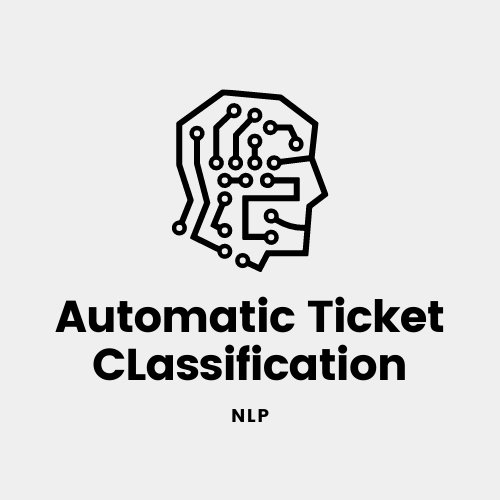

[![Open in Github](https://img.shields.io/badge/Open%20in-Github-<COLOR>.svg)](https://github.com/GreatLearning-NLP-Capstone-Group-9/Automatic-Ticket-Classification/blob/main/Capstone%20Automatic%20Ticket%20Classification%20Milestone-2.ipynb) [![View In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/12wZV7iDZKcqXwwK4D-U6CgLqwjaRAWrW?usp=sharing)

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">EDA</span></strong></li>
</ul></h1>

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# imports

import warnings

warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

import email
import math
import os
import random
import re
import string
import unicodedata
from collections import Counter, defaultdict
from pathlib import Path
from pprint import pprint
from time import time

import contractions
import hjson
import jenkspy
import mailparser
import matplotlib.pyplot as plt
import nltk
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import spacy
import tensorflow
import xlrd
import yake
from bs4 import BeautifulSoup
from charset_normalizer import from_bytes
from ftfy import fix_text
from langdetect import DetectorFactory, detect_langs
from langdetect.lang_detect_exception import LangDetectException
from nltk.corpus import words
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from pandas.core.common import flatten
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm

from utils.date_handler import DateHandler
from utils.email_handler import EmailHandler, email_regex
from utils.link_handler import LinkHandler
from utils.tel_handler import TelHandler
from utils.utils import clean_text, is_blank, is_not_blank, load_hjson
from wordcloud import STOPWORDS, WordCloud

tqdm.pandas()
%matplotlib inline
!python -m spacy download en_core_web_sm
nlp = spacy.load('en_core_web_sm', disable=['parser'])

2021-10-02 13:54:05.700177: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library cudart64_110.dll


[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [3]:
CONFIG_DIR = './config/config.hjson'
config = load_hjson(Path(CONFIG_DIR))

In [4]:
# reproducibility
seed = config['seed']
random.seed(seed)
tensorflow.random.set_seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import & Analyse the data.</span></strong></li>
</ul></h3>

In [5]:
# check encoding
with open('./data/input_data.xlsx', 'r') as fp:
    print(fp)

<_io.TextIOWrapper name='./data/input_data.xlsx' mode='r' encoding='cp1252'>


In [6]:
wb = xlrd.open_workbook('./data/input_data.xlsx', encoding_override='cp1252')  # use the input data's encoding to read properly
dataset = pd.read_excel(wb)
dataset.sample(7)

,Short description,Description,Caller,Assignment group
4415,unable to login to vpn,unable to login to vpn as the page stopped at ...,lckagtry xcrmzgli,GRP_0
5279,telephony_software password has expired,my telephony_software password is getting expi...,rbozivdq gmlhrtvp,GRP_7
4303,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,olckhmvx pcqobjnd,GRP_0
313,cannot access guest wifi sponsor portal,"receive ""sponsor portal internal error"" when a...",ctxwsvam vwgpjauf,GRP_0
6688,setup time not calculated properly,email from kanchi (usa) on how confirmation ti...,entuakhp xrnhtdmk,GRP_41
7564,probleme mit datenbank in EU_tool \hgrvubzo wg...,probleme mit datenbank in EU_tool \hgrvubzo wg...,hgrvubzo wgyhktic,GRP_24
6908,access to engineering_tool,access to engineering_tool,sjhrytwn yakzbslm,GRP_0


In [7]:
dataset.shape  # very small dataset with only 8500 rows

(8500, 4)

In [8]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [9]:
# rename column names for convenience
dataset = dataset.rename(columns={
    "Short description": "short_description",
    "Description": "description",
    "Caller": "caller",
    "Assignment group": "group"
    })

In [10]:
np.unique(dataset.group), len(np.unique(dataset.group))  # 74 different functional groups

(array(['GRP_0', 'GRP_1', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
        'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
        'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
        'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_3', 'GRP_30',
        'GRP_31', 'GRP_32', 'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36',
        'GRP_37', 'GRP_38', 'GRP_39', 'GRP_4', 'GRP_40', 'GRP_41',
        'GRP_42', 'GRP_43', 'GRP_44', 'GRP_45', 'GRP_46', 'GRP_47',
        'GRP_48', 'GRP_49', 'GRP_5', 'GRP_50', 'GRP_51', 'GRP_52',
        'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56', 'GRP_57', 'GRP_58',
        'GRP_59', 'GRP_6', 'GRP_60', 'GRP_61', 'GRP_62', 'GRP_63',
        'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67', 'GRP_68', 'GRP_69',
        'GRP_7', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73', 'GRP_8', 'GRP_9'],
       dtype=object),
 74)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Check for Incomplete Information</span></strong></li>
</ul></h3>

In [11]:
dataset.isna().sum()  # Few missing values

short_description    8
description          1
caller               0
group                0
dtype: int64

In [12]:
dataset[dataset.isna().any(axis=1)]  # check rows with missing values

,short_description,description,caller,group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [13]:
dataset.loc[dataset['description'].isna()]

,short_description,description,caller,group
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [14]:
dataset.iloc[4395]

short_description    i am locked out of skype
description                               NaN
caller                      viyglzfo ajtfzpkb
group                                   GRP_0
Name: 4395, dtype: object

In [15]:
# imputing the short description by value in description and vice-versa
# However, If both columns were missing, we would have to drop the row
dataset.loc[dataset['description'].isna(), 'description']  = dataset.loc[dataset['description'].isna()].short_description

In [16]:
dataset.loc[dataset['short_description'].isna()]

,short_description,description,caller,group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0


In [17]:
dataset.loc[dataset['short_description'].isna(), 'short_description']  = dataset.loc[dataset['short_description'].isna()].description

In [18]:
dataset.isna().sum()  # all missing values imputed

short_description    0
description          0
caller               0
group                0
dtype: int64

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Target Class Distribution</span></strong></li>
</ul></h3>

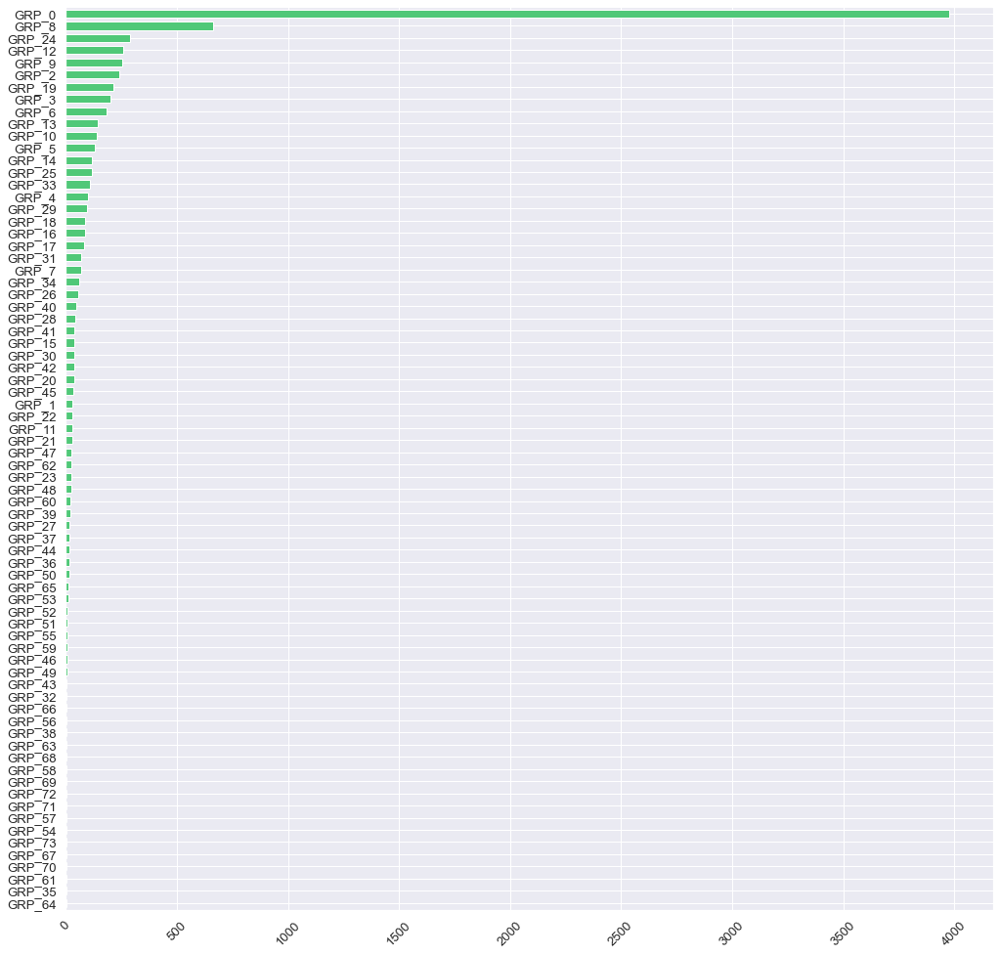

In [19]:
sns.set(font_scale=1.2)  # scale up font size
dataset.group.value_counts().sort_values(ascending=True).plot(kind='barh', width=0.65, figsize=(17, 17), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

In [20]:
dataset.group.value_counts().sort_values(ascending=False).tail(30)  # few classes with only single-digit datapoints

GRP_44    15
GRP_36    15
GRP_50    14
GRP_65    11
GRP_53    11
GRP_52     9
GRP_51     8
GRP_55     8
GRP_59     6
GRP_46     6
GRP_49     6
GRP_43     5
GRP_32     4
GRP_66     4
GRP_56     3
GRP_38     3
GRP_63     3
GRP_68     3
GRP_58     3
GRP_69     2
GRP_72     2
GRP_71     2
GRP_57     2
GRP_54     2
GRP_73     1
GRP_67     1
GRP_70     1
GRP_61     1
GRP_35     1
GRP_64     1
Name: group, dtype: int64

In [21]:
dataset[dataset.group == 'GRP_70']  # small groups have to merged into a separate "Others" category
dataset[dataset.group == 'GRP_70'].description.tolist()[0]

'an e-mail from  it training has email hints and tips #1.  under "create signature" it has a link "company formatheywting standard" that i am forbidden to see.\n615'

<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>The target class distribution is heavily imbalanced as most calls are assinged to Group 0 and exluding this as well, we find an imabalanced dataset for the rest of the groups.
 </span></ul></h5>

In [22]:
temp = dataset.copy(deep=True)
temp.loc[temp["group"] != 'GRP_0', 'group'] = 'Other'
temp.loc[temp["group"] == 'GRP_0', "group"] = 'Group 0'

In [23]:
temp.group.value_counts()

Other      4524
Group 0    3976
Name: group, dtype: int64

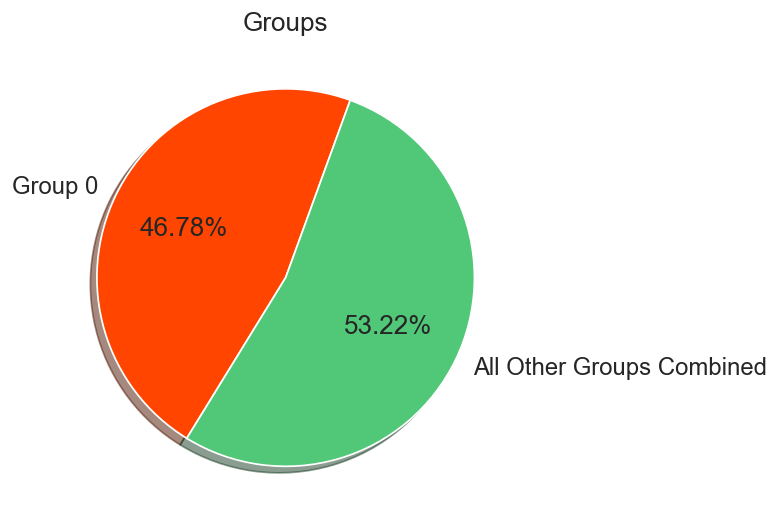

In [24]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
group_0 = len(temp[temp['group'] == 'Group 0'])
others = len(temp[temp['group'] == 'Other'])

plt.pie(x=[group_0, others],
        explode=(0, 0),
        labels=['Group 0', 'All Other Groups Combined'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=[config['red_rgb'], config['green_rgb']])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Groups')
plt.show()

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Choosing a Metric to benchmark model performance</span></strong></li>
</ul></h3>

* This is a multi-class classification problem, where the machine learning model will try to predict if each row is one of the 74 possibilities.
* The majority class is GRP_0, which occurs in 46.78% of the observations.

* The most common metrics for a multi-class classification problem are AUC, F1-score and accuracy.
* Accuracy is not suitable for an imbalanced classification problem. (Note that a model that always predicts GRP_0, will get an accuracy of 46.78%)
* We would choose F1-score if the majority class is more important than the smaller classes.
* We would choose AUC if we also care about the smaller classes.

#### As we want to be able to classify the tickets into all functional groups and functional groups are given equal importance, we choose AUC as the final metric to score model performance.

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Outlier Analysis</span></strong></li>
</ul></h3>

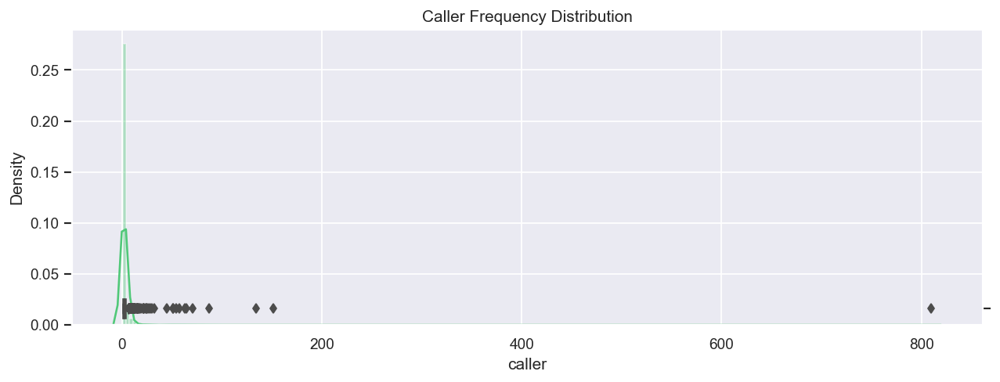

In [25]:
# plotting caller frequency counts
sns.set()
plt.figure(figsize=(12, 4), dpi=125)
ax = sns.distplot(dataset.caller.value_counts(), bins=250, kde=True, color=config['green_rgb'])
ax_ = ax.twinx()
sns.boxplot(dataset.caller.value_counts(), color=config['red_rgb'])
ax_.set(ylim=(-.7, 12))
plt.title('Caller Frequency Distribution')
plt.show()

In [26]:
dataset[dataset.caller == 'bpctwhsn kzqsbmtp'].group.value_counts()  # most frequent caller

GRP_8     362
GRP_9     153
GRP_5      96
GRP_6      89
GRP_10     60
GRP_60     16
GRP_12      8
GRP_45      7
GRP_1       6
GRP_13      4
GRP_18      3
GRP_47      2
GRP_57      1
GRP_14      1
GRP_29      1
GRP_44      1
Name: group, dtype: int64

In [27]:
dataset[dataset.caller == 'bpctwhsn kzqsbmtp']  # job failure alerts

,short_description,description,caller,group
47,job Job_1424 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_6
50,job mm_zscr0099_dly_merktc3 failed in job_sche...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
59,job mm_zscr0099_dly_merktc2 failed in job_sche...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
60,job Job_3181 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
67,job Job_1338 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_9
...,...,...,...,...
7053,job Job_1387 failed in job_scheduler at: 08/18...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_9
7059,job Job_2063b failed in job_scheduler at: 08/1...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_6
7074,job HostName_1019fail failed in job_scheduler ...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
7076,job HostName_1019fail failed in job_scheduler ...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8


In [28]:
def get_length(row):
    try:
        row['char_length'] = len(row.description)
        row['word_length'] = len(row.description.split())
        row['short_char_length'] = len(row.short_description)
        row['short_word_length'] = len(row.short_description.split())
    except Exception:  # assign 0 length to missing rows if any
        row['char_length'] = 0
        row['word_length'] = 0
        row['short_char_length'] = 0
        row['short_word_length'] = 0
    return row

dataset = dataset.progress_apply(get_length, axis=1)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8500/8500 [00:13<00:00, 614.04it/s]


In [29]:
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1996,erp SID_34 account,\n\nreceived from: zuxcfonv.nyhpkrbe@gmail.com...,zuxcfonv nyhpkrbe,GRP_0,135,18,19,3
2550,bex analyzer and bex designer is not working.,bex analyzer and bex designer is not working.,oncidblt ucewizyd,GRP_19,45,8,45,8
1024,not able to open the existing hana report,not able to open the existing hana report,rcbdyslq zuspjbtw,GRP_9,41,8,41,8
4411,unable to install the gd&t font,name: ovxwqybe gevzkrlp\nemail: ovxwqybe.gevzk...,ovxwqybe gevzkrlp,GRP_3,104,11,31,6
8333,password change,\r\n\r\nreceived from: orjcgtyz.worylufs@gmail...,orjcgtyz worylufs,GRP_0,152,20,15,2
5367,job Job_484 failed in job_scheduler at: 09/03/...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8,105,11,61,8
3999,ticket update - inplant_859150,ticket update - inplant_859150,olckhmvx pcqobjnd,GRP_0,30,4,30,4


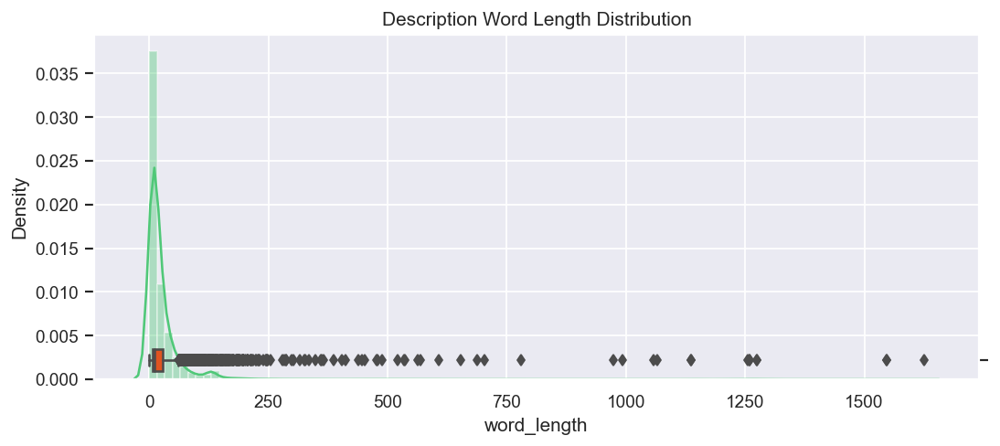

In [30]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.word_length, bins=100, kde=True, color=config['green_rgb'])
ax_ = ax.twinx()
sns.boxplot(dataset.word_length, color=config['red_rgb'])
ax_.set(ylim=(-.7, 12))
plt.title('Description Word Length Distribution')
plt.show()

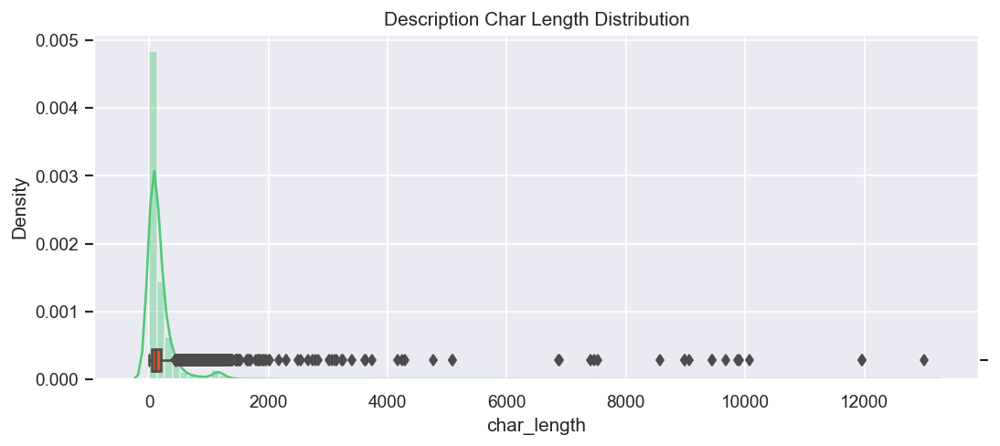

In [31]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.char_length, bins=100, kde=True, color=config['green_rgb'])
ax_ = ax.twinx()
sns.boxplot(dataset.char_length, color=config['red_rgb'])
ax_.set(ylim=(-.7, 12))
plt.title('Description Char Length Distribution')
plt.show()

In [32]:
dataset[dataset.word_length == 0]  # empty description => imputing with the corresponding short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
6371,authorization add/delete members,\r\n\r\n,hpmwliog kqtnfvrl,GRP_0,5,0,33,3
7397,browser issue :,\r\n,fgejnhux fnkymoht,GRP_0,2,0,16,3


In [33]:
dataset.loc[dataset.word_length == 0, 'description'] = dataset.loc[dataset.word_length == 0]['short_description']
dataset = dataset.progress_apply(get_length, axis=1)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8500/8500 [00:00<00:00, 10705.29it/s]


In [34]:
dataset[dataset.word_length == 0]  # cleaned

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length


In [35]:
dataset[dataset.char_length < 4]  # description 'the' holds no information => imputed with short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1049,reset passwords for soldfnbq uhnbsvqd using pa...,the,soldfnbq uhnbsvqd,GRP_17,3,1,84,9
1054,reset passwords for fygrwuna gomcekzi using pa...,the,fygrwuna gomcekzi,GRP_17,3,1,84,9
1144,reset passwords for wvdxnkhf jirecvta using pa...,the,wvdxnkhf jirecvta,GRP_17,3,1,84,9
1184,reset passwords for pxvjczdt kizsjfpq using pa...,the,pxvjczdt kizsjfpq,GRP_17,3,1,84,9
1292,reset passwords for cubdsrml znewqgop using pa...,the,cubdsrml znewqgop,GRP_17,3,1,84,9
1476,reset passwords for bnoupaki cpeioxdz using pa...,the,bnoupaki cpeioxdz,GRP_17,3,1,84,9
1558,reset passwords for usa feathers using passwor...,the,lmqysdec ljvbnpqw,GRP_17,3,1,79,9
1693,reset passwords for eglavnhx uprodleq using pa...,the,eglavnhx uprodleq,GRP_17,3,1,84,9
1834,reset passwords for hybiaxlk lawptzir using pa...,the,hybiaxlk lawptzir,GRP_17,3,1,84,9
1850,reset passwords for fylrosuk kedgmiul using pa...,the,fylrosuk kedgmiul,GRP_17,3,1,84,9


In [36]:
dataset[dataset.description == 's']  # holds no actual information with just one letter, has to be dropped

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1860,s,s,gzjtweph mnslwfqv,GRP_0,1,1,1,1


In [37]:
# drop row with description: 's'
dataset.drop(dataset[dataset.description == 's'].index, inplace=True)
dataset = dataset.progress_apply(get_length, axis=1)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8499/8499 [00:00<00:00, 9871.10it/s]


In [38]:
# description 'the' holds no information => imputed with corresponding short_description
dataset.loc[dataset.description == 'the', 'description'] = dataset.loc[dataset.description == 'the']['short_description']
dataset = dataset.progress_apply(get_length, axis=1)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8499/8499 [00:00<00:00, 10966.45it/s]


In [39]:
# Single Word descriptions
dataset[dataset.word_length == 1].shape

(41, 8)

In [40]:
# dataset[dataset.word_length == 1].to_csv('./data/Single_Word_Descriptions.csv')
dataset[dataset.word_length == 1].sample(20)  # these have to be cleaned up and imputed later on

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
6106,ç”µè„‘ä¸èƒ½å¼€æœº,æ—©ä¸Šä¸Šç­ç”µè„‘æ‰“ä¸å¼€ã€‚,mzerdtop xnlytczj,GRP_30,30,1,18,1
4505,request to reset microsoft online services pa...,\r\n\r\nkind,rcfwnpbi kvhedyrc,GRP_0,9,1,84,9
608,etiketten drucker im bereich endkontrolle germ...,funktionsstÃ¶rung,tzmewbdv zjbuwmkn,GRP_33,17,1,56,7
4503,ç”¨å‹å®šæœŸå¤‡ä»½ä¸æˆåŠŸ,æœåŠ¡å™¨ç«¯ç”¨å‹ç³»ç»Ÿæœ€è¿‘åŠä¸ªæœˆæ—¥å¤‡ä...,igdnsjhz awnftgev,GRP_48,54,1,27,1
3432,dds,dss,onctqhsg cpahzsle,GRP_0,3,1,3,1
5146,walkmeåŠ è½½æ•…éšœ,walkmeä¸‹è½½å®‰è£…åŽï¼ŒæŒ‰é’®ä¸èƒ½åœ¨æµè§ˆå...,whflryeb fatgdzhq,GRP_48,60,1,18,2
5761,ä¸»æœºä¸èƒ½å¼€å¯,ä¸»æœºä¸èƒ½å¼€å¯ï¼Œç”µæºç¯æ­£å¸¸ï¼Œä¸»æœºé...,cpdilmjx jwsqpiac,GRP_48,71,1,18,1
4569,i am not able to connect to my regular printer...,x5380,koiapqbg teyldpkw,GRP_0,6,1,84,16
618,outlookæ‰“ä¸å¼€,æ‰“å¼€outlookæ—¶ï¼Œæ˜¾ç¤ºoutlook.ostæ–‡ä»¶é”™è...,qayozbcd vwglmpjq,GRP_0,72,1,16,1
5311,ç³»ç»Ÿæ•…éšœï¼Œå¯åŠ¨è“å±.,ç³»ç»Ÿæ•…éšœï¼Œå¯åŠ¨è“å±.,lhkqbmna ekhtivsd,GRP_31,29,1,28,1


In [41]:
dataset[dataset.word_length == 2].sample(20)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1449,account locked.,account locked.,dyqekzuc djhznybt,GRP_0,15,2,15,2
5973,outlook freezes.,outlook freezes.,rwhavckz drvxyihj,GRP_0,16,2,16,2
3400,account locked.,account locked.,vyjmlain hvjbmdgi,GRP_0,15,2,15,2
6843,kpm time sheet is not submitting. please resol...,employee id-210667827,kdfnaytr pudqfmtc,GRP_0,21,2,80,14
1761,outlook freezes,outlook freezes.,techruxg wasrvkuz,GRP_0,16,2,15,2
3096,unable to login to erp,misplaced password,uaclgmeq hyxzmwdi,GRP_0,18,2,22,5
7034,blank call,blank call,fumkcsji sarmtlhy,GRP_0,10,2,10,2
4487,vpn è¿žæŽ¥åŽè‡ªåŠ¨æ–­å¼€ã€‚,vpn è¿žæŽ¥åŽè‡ªåŠ¨æ–­å¼€ï¼Œæç¤ºè°ƒåˆ¶è§£è°ƒ...,tmufgokq qtzavows,GRP_31,61,2,28,2
7378,password reset,password reset,kauozcir jlyqxise,GRP_0,14,2,14,2
7504,collaboration_platform issue,collaboration_platform issue,utdlmzyb dvfpraeg,GRP_0,29,2,29,2


In [42]:
dataset[dataset.short_word_length == 0]  # all have short descriptions

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length


In [43]:
dataset[dataset.short_char_length < 3]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3529,PR,create a purchase requisition with purchasing ...,ejvkzobl yijgokrn,GRP_29,201,31,2,1


In [44]:
dataset[dataset.char_length < 4]  

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3432,dds,dss,onctqhsg cpahzsle,GRP_0,3,1,3,1


In [45]:
dataset[dataset.word_length > 800]  # security incident logs

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3530,security incidents - ( #in33944691 ) : possibl...,source ip: 195.272.28.222\nsource port: 80\nso...,gzhapcld fdigznbk,GRP_2,7524,974,111,17
3965,security incidents - ( #in33809307 ) : possibl...,source ip :195.22.28.222 \nsystem name :androi...,gzhapcld fdigznbk,GRP_2,8988,1255,116,17
4087,security incidents - ( sw #in33895560 ) : mage...,"source ip : 172.20.10.37 , 208.211.136.158\nsy...",ugyothfz ugrmkdhx,GRP_39,11968,1547,63,11
4089,security incidents - ( sw #in33895560 ) : mage...,"source ip : 172.20.10.37 , 208.211.136.158\nsy...",ugyothfz ugrmkdhx,GRP_2,11968,1547,63,11
5092,security incidents - ( #in33578632) : suspicio...,source ip: 29.26.13.3095\r\nsource hostname: H...,gzhapcld fdigznbk,GRP_3,9063,1066,92,11
5433,security incidents - ( #in33765965 ) : possibl...,source ip :10.40.6.221\nsystem name :rqxl85172...,gzhapcld fdigznbk,GRP_2,8575,1057,83,13
7345,security incidents - ( sw #in33501789 ) : broa...,we are seeing activity indicating the host at ...,ugyothfz ugrmkdhx,GRP_2,13001,1625,102,14
7647,security incidents - ( #in33578632) : suspicio...,source ip :\r\nsystem name :\r\nuser name:\r\...,gzhapcld fdigznbk,GRP_2,8991,993,92,11
7982,security incidents - ( dsw #in33390850 ) : sus...,source ip : 78.83.16.293\nsystem name : HostNa...,ugyothfz ugrmkdhx,GRP_2,9881,1137,118,17
7984,security incidents - ( dsw #in33390850 ) : sus...,source ip : 78.83.16.293\r\nsystem name : Host...,ugyothfz ugrmkdhx,GRP_12,10077,1137,118,17


In [46]:
dataset[dataset.word_length > 200][dataset.word_length < 800]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
238,erp pi and msd crm connectivity issue- serirtc...,hi all\n\nwe have a connectivity issue between...,kgytujhe bonhwzrx,GRP_14,2007,349,67,10
239,printer problem / issue information,please complete all required questions below. ...,dzjxrkae grqczsmx,GRP_3,1294,216,35,5
981,employment status - new non-employee ycgkinov ...,*page down to ensure that all required data fi...,lfikjasz tjbqcmvl,GRP_2,1324,206,75,11
1175,bitte das iphone-6 001 freischalten fÃ¼r mail-...,\n\nreceived from: rtnyumbg.yzemkhbq@gmail.com...,rtnyumbg yzemkhbq,GRP_0,1828,218,54,7
1179,media server disconnect lpapr952(south_amerirt...,received below email from inin tried to ping t...,jloygrwh acvztedi,GRP_8,1839,287,66,5
1577,the printer is defaulting to the usa printer f...,"from: kryuisti turleythy \nsent: wednesday, oc...",hybiaxlk lawptzir,GRP_18,2172,325,114,21
1696,mm:pur_req_ko assign for user: yeyhtung kimthy...,mm:pur_req_ko assign for user: yeyhtung kimthy...,kmnsvzuq euyvihzc,GRP_29,1379,201,72,9
1812,sales orders are not updating with correct del...,this is in reference to so# 35086652\r\n\r\nth...,amunklhx bvrachko,GRP_6,1330,248,58,9
1855,printer problem / issue information -- zebra l...,please complete all required questions below. ...,okfmbqur efzukjsa,GRP_0,1263,207,59,9
2082,printing language sa38 (reporting rfumsv00),please complete all required questions below. ...,ojhiaubp lovgirtm,GRP_33,1335,207,43,5


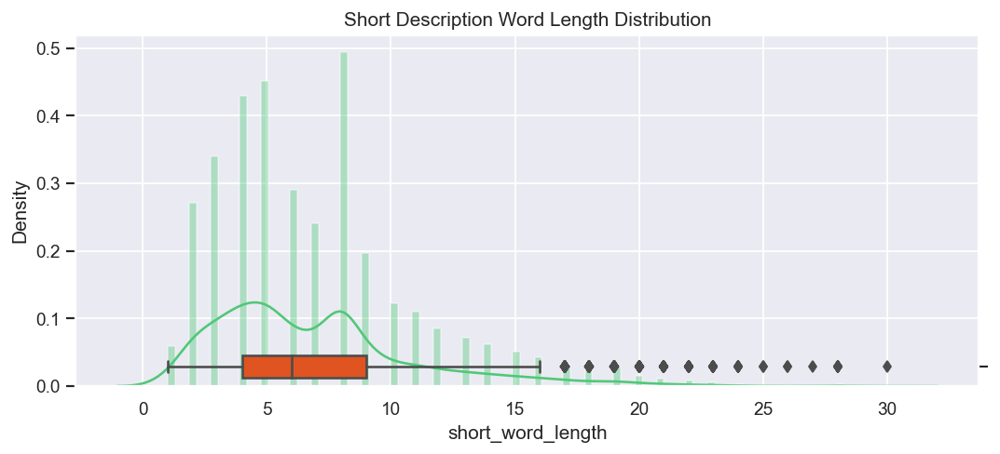

In [47]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.short_word_length, bins=100, kde=True, color=config['green_rgb'])
ax_ = ax.twinx()
sns.boxplot(dataset.short_word_length, color=config['red_rgb'])
ax_.set(ylim=(-.7, 12))
plt.title('Short Description Word Length Distribution')
plt.show()

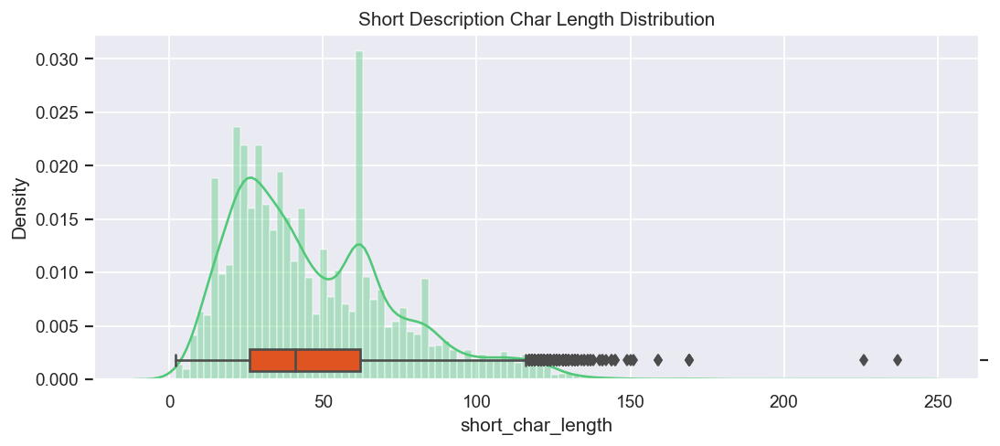

In [48]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.short_char_length, bins=100, kde=True, color=config['green_rgb'])
ax_ = ax.twinx()
sns.boxplot(dataset.short_char_length, color=config['red_rgb'])
ax_.set(ylim=(-.7, 12))
plt.title('Short Description Char Length Distribution')
plt.show()

In [49]:
dataset.describe()

,char_length,word_length,short_char_length,short_word_length
count,8499.000000,8499.000000,8499.000000,8499.000000
mean,204.595246,27.331804,47.386751,6.951759
std,519.530803,65.026307,27.323700,4.158631
min,3.000000,1.000000,2.000000,1.000000
25%,42.000000,6.000000,26.000000,4.000000
50%,106.000000,11.000000,41.000000,6.000000
75%,201.000000,28.000000,62.000000,9.000000
max,13001.000000,1625.000000,237.000000,30.000000


<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Most descriptions have between 6 and 28 words long with median at 41 (106 characters) and mean at 27.2 with relatively few outliers ranging till 1625 words!<br>
    <li>Most Short descriptions have between 4 and 9 words long with median at 6 (41 characters) and mean at 6.92 with relatively few outliers ranging till 28 words.<br>
 </span></ul></h5>

In [50]:
def clean_nonsensible_outliers():
    # impute the zero length description with corresponding short description
    dataset.loc[dataset.word_length == 0, 'description'] = dataset.loc[dataset.word_length == 0]['short_description']
     # drop row with description: 's'
    dataset.drop(dataset[dataset.description == 's'].index, inplace=True)
    # description 'the' holds no information => imputed with corresponding short_description
    dataset.loc[dataset.description == 'the', 'description'] = dataset.loc[dataset.description == 'the']['short_description']

# clean_nonsensible_outliers()

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Fix Text Encoding</span></strong></li>
</ul></h3>

In [51]:
dataset[dataset.word_length == 1].sample(20)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1178,ç”µè¯æœºæ²¡æœ‰å£°éŸ³,ç”µè¯æœºæ²¡æœ‰å£°éŸ³,cyjlqdwm kywiuosn,GRP_30,21,1,21,1
5147,ç”µè„‘å¼€æœºæ•…éšœ,åŽŸææ–™ä»“åº“ç”µè„‘å¼€æœºè“å±ï¼Œä¸»æœºé¢æ...,ycjxrsba ehftdorm,GRP_48,68,1,18,1
276,outlookæ”¶åˆ°ç®±ä¸­folderå˜ä¸ºæ¯å¤©ä¸€ä¸ªfol...,outlookæ”¶åˆ°ç®±ä¸­folderå˜ä¸ºæ¯å¤©ä¸€ä¸ªfol...,bxfdkiol mdqlszvc,GRP_30,73,1,73,1
5303,æŠ¥ç¨Žç”µè„‘ä¸èƒ½è”ç½‘ï¼Œè®©è´ºæ­£å¹³ä¼‘ã€‚,æŠ¥ç¨Žç”µè„‘ä¸èƒ½è”ç½‘ï¼Œè®©è´ºæ­£å¹³ä¼‘ã€‚,hlrmufzx qcdzierm,GRP_30,45,1,45,1
618,outlookæ‰“ä¸å¼€,æ‰“å¼€outlookæ—¶ï¼Œæ˜¾ç¤ºoutlook.ostæ–‡ä»¶é”™è...,qayozbcd vwglmpjq,GRP_0,72,1,16,1
2915,websites not loading on company center,companycenter.company.com,qcfmxgid jvxanwre,GRP_0,25,1,38,6
5891,vpnä¸èƒ½ä½¿ç”¨ï¼Œè¯·è½¬ç»™å°è´º,vpnä¸èƒ½ä½¿ç”¨ï¼Œè¯·è½¬ç»™å°è´º,ehfvwltg eakjbtoi,GRP_0,33,1,33,1
4505,request to reset microsoft online services pa...,\r\n\r\nkind,rcfwnpbi kvhedyrc,GRP_0,9,1,84,9
2267,urgent help required- outlook to crm mfg_toolt...,contact,gonflcmq wmptisvz,GRP_0,8,1,56,8
1704,è´¦æˆ·è¢«é”å®š,ç”¨æˆ·è´¦æˆ·é”å®šï¼Œè¯·æ±‚è§£é”,yvscpgax wdfxytzu,GRP_48,33,1,15,1


In [52]:
def fix_text_encoding(row):
    row['description'] = fix_text(row.description)
    row['short_description'] = fix_text(row.short_description)
    return row

dataset = dataset.progress_apply(fix_text_encoding, axis=1)
dataset[dataset.word_length == 1].sample(20)  # translated to proper unicode text in chineese

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8499/8499 [00:02<00:00, 3241.37it/s]


,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1452,考勤系统进不去请处理谢谢!,考勤系统进不去请处理谢谢!,spgdcvhb ocagnpmj,GRP_30,39,1,39,1
4501,制粉三楼控制室电脑故障,"制粉三楼控制室电脑不能开启,电源指示灯桔色频闪。",agyvbnwz mxsonkdc,GRP_48,72,1,33,1
1955,有一个链接文件打不开,"有一链接文件打不开,提示版本低",qsfcxzel quwykhno,GRP_30,45,1,30,1
5149,开不了机,"开不了机,显示系统坏了。",kclhqspo xvugztyc,GRP_30,36,1,12,1
2915,websites not loading on company center,companycenter.company.com,qcfmxgid jvxanwre,GRP_0,25,1,38,6
8266,erp无法进行采购(转给贺正平),"进行采购时显示""找不到员工1111154833的数据,请通知系统管理员""",kyagjxdh dmtjpbnz,GRP_30,84,1,42,2
7302,skype会议时不去,skype会议从邮箱里的链接进不去。,rekpvblc ufysatml,GRP_30,44,1,20,1
6106,电脑不能开机,早上上班电脑打不开。,mzerdtop xnlytczj,GRP_30,30,1,18,1
6253,in the inbox always show there are several ema...,+86,mqbxwpfn uclrqfxa,GRP_0,5,1,94,19
5891,"vpn不能使用,请转给小贺","vpn不能使用,请转给小贺",ehfvwltg eakjbtoi,GRP_0,33,1,33,1


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Word Frequency Distributions & WordClouds</span></strong></li>
</ul></h3>

In [53]:
# top 50 most frequent words in text
top_N = config['top_n']

words = (dataset.description.str.cat(sep=' ').split())
rslt = pd.DataFrame(Counter(words).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')

In [54]:
rslt[:top_N].transpose()

Word,to,the,in,is,from:,and,received,i,on,for,...,can,we,as,access,when,site,am,account,ticket,error
Frequency,6296,6254,3172,2670,2499,2384,2354,2244,1977,1946,...,684,669,665,664,656,654,645,627,605,577


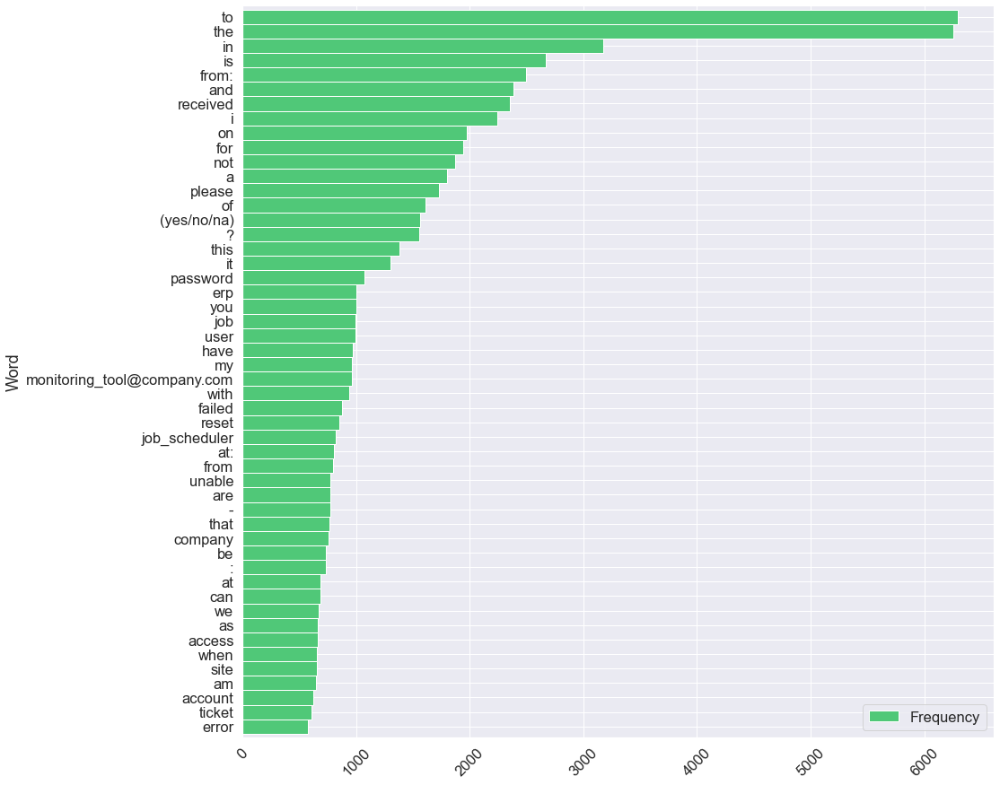

In [55]:
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

In [56]:
pprint(rslt.index.tolist(), compact=True)

['to', 'the', 'in', 'is', 'from:', 'and', 'received', 'i', 'on', 'for', 'not',
 'a', 'please', 'of', '(yes/no/na)', '?', 'this', 'it', 'password', 'erp',
 'you', 'job', 'user', 'have', 'my', 'monitoring_tool@company.com', 'with',
 'failed', 'reset', 'job_scheduler', 'at:', 'from', 'unable', 'are', '-',
 'that', 'company', 'be', ':', 'at', 'can', 'we', 'as', 'access', 'when',
 'site', 'am', 'account', 'ticket', 'error']


<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Stopwords and Anchor words like 'From:', 'Recieved' have to be stripped out
 </span></ul></h5>

In [57]:
# top 50 most frequent words in text
top_N = config['top_n']

words = (dataset.short_description.str.cat(sep=' ').split())
rslt = pd.DataFrame(Counter(words).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')

In [58]:
rslt[:top_N].transpose()

Word,to,in,not,job,on,is,password,erp,failed,job_scheduler,...,with,i,my,crm,ticket,windows,/,am,password_management_tool,network
Frequency,2167,1737,981,976,917,856,847,822,822,811,...,193,191,187,185,182,177,177,168,161,155


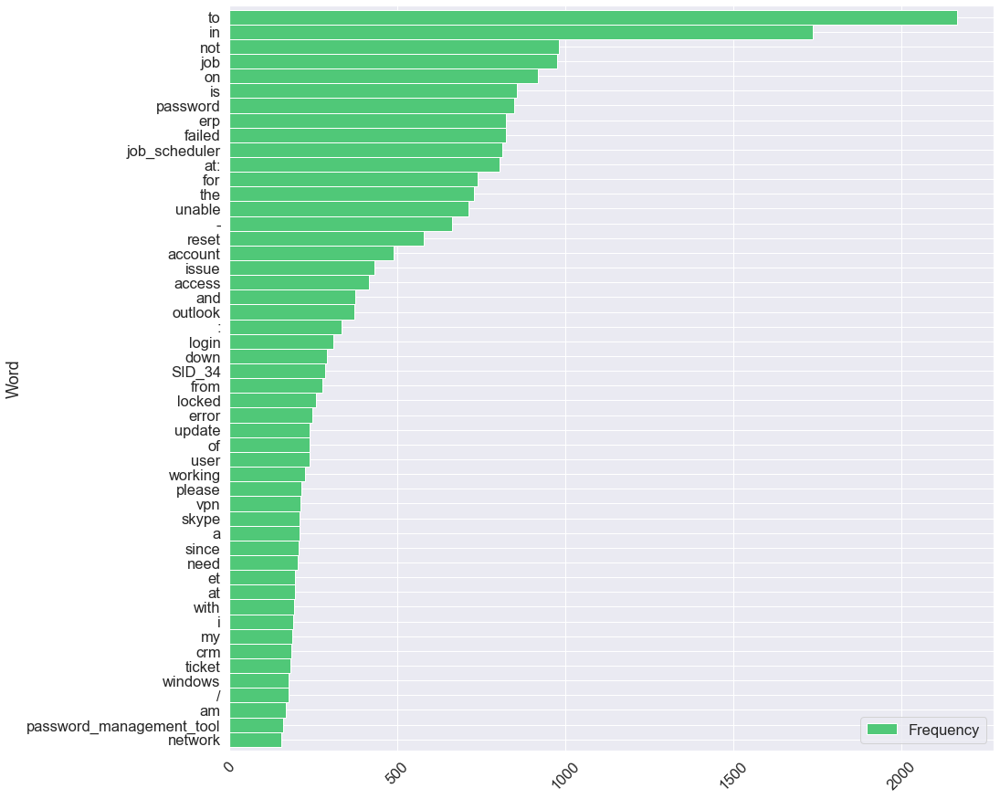

In [59]:
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

In [60]:
pprint(rslt.index.tolist(), compact=True)

['to', 'in', 'not', 'job', 'on', 'is', 'password', 'erp', 'failed',
 'job_scheduler', 'at:', 'for', 'the', 'unable', '-', 'reset', 'account',
 'issue', 'access', 'and', 'outlook', ':', 'login', 'down', 'SID_34', 'from',
 'locked', 'error', 'update', 'of', 'user', 'working', 'please', 'vpn', 'skype',
 'a', 'since', 'need', 'et', 'at', 'with', 'i', 'my', 'crm', 'ticket',
 'windows', '/', 'am', 'password_management_tool', 'network']


<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Many stopwords are occuring most frequently in the dataset. We might need to use stopword removal in our pre-processing if it improves the model performance.
 </span></ul></h5>

In [61]:
descr_string = ""
for description in dataset['description']:
    descr_string += description
    descr_string += " "

short_descr_string = ""
for description in dataset['short_description']:
    short_descr_string += description
    short_descr_string += " "

grp0_string = ""
for description in temp.loc[temp.group == 'Group 0', 'description']:
    grp0_string += description
    grp0_string += " "

other_string = ""
for description in temp.loc[temp.group == 'Other', 'description']:
    other_string += description
    other_string += " "

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Descriptions WordCloud</span></strong></li>
</ul></h4>

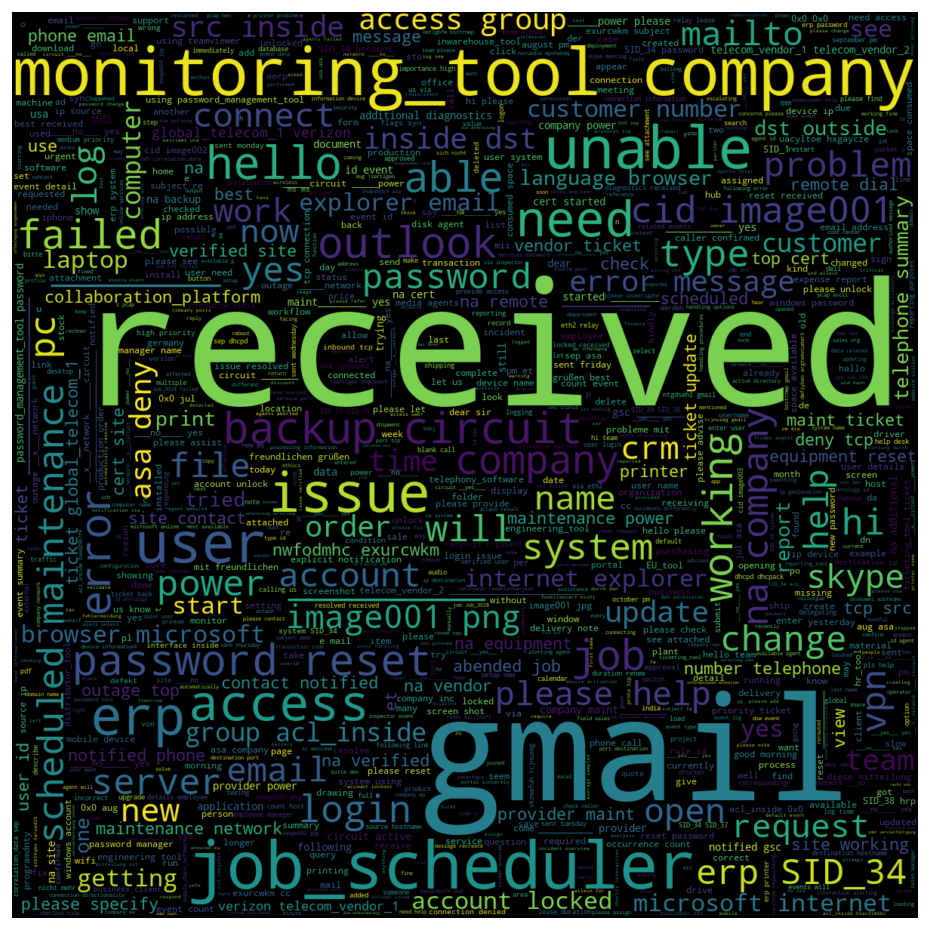

In [62]:
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(descr_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Short Descriptions WordCloud</span></strong></li>
</ul></h4>

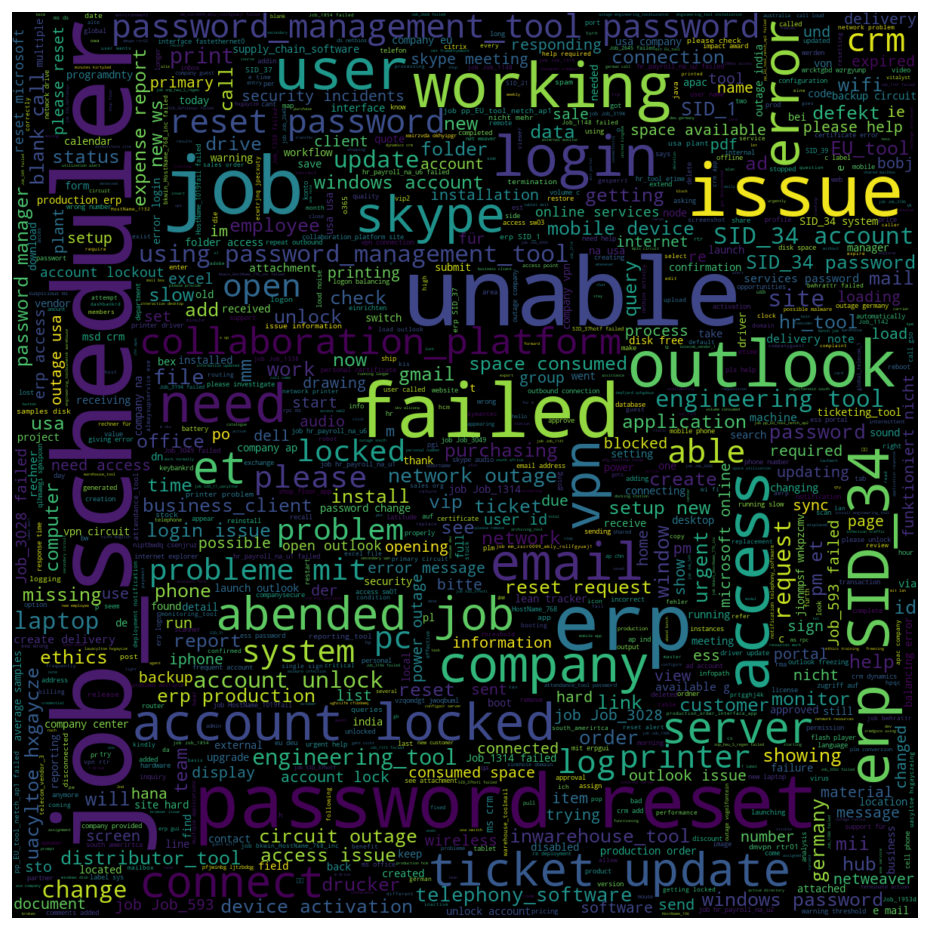

In [63]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(short_descr_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Group 0 Descriptions WordCloud</span></strong></li>
</ul></h4>

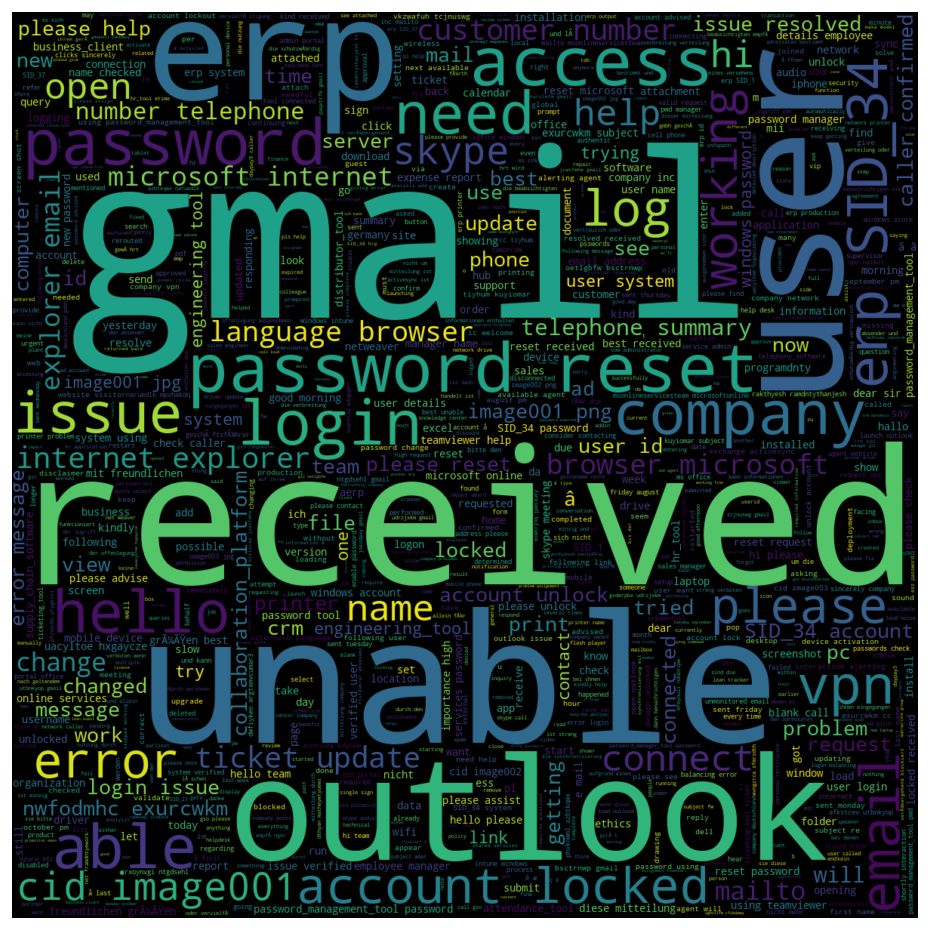

In [64]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(grp0_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Other Groups Descriptions WordCloud</span></strong></li>
</ul></h4>

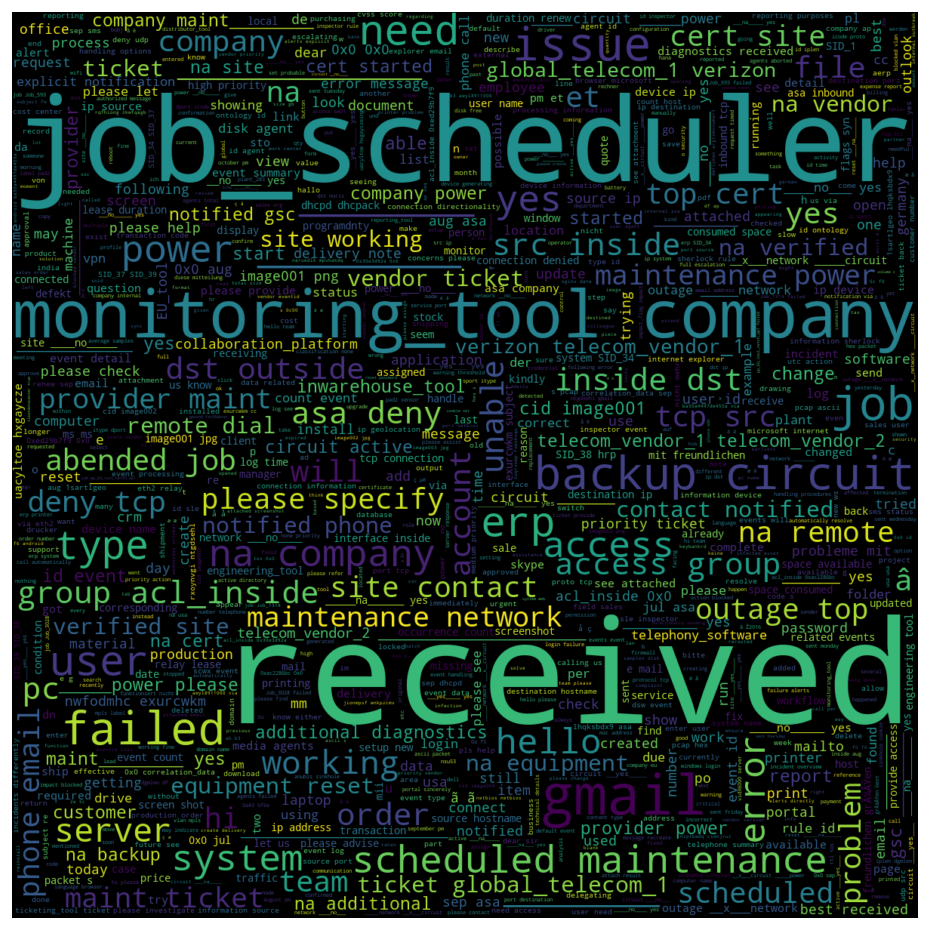

In [65]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(other_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Short Descriptions
 </span></ul></h4>

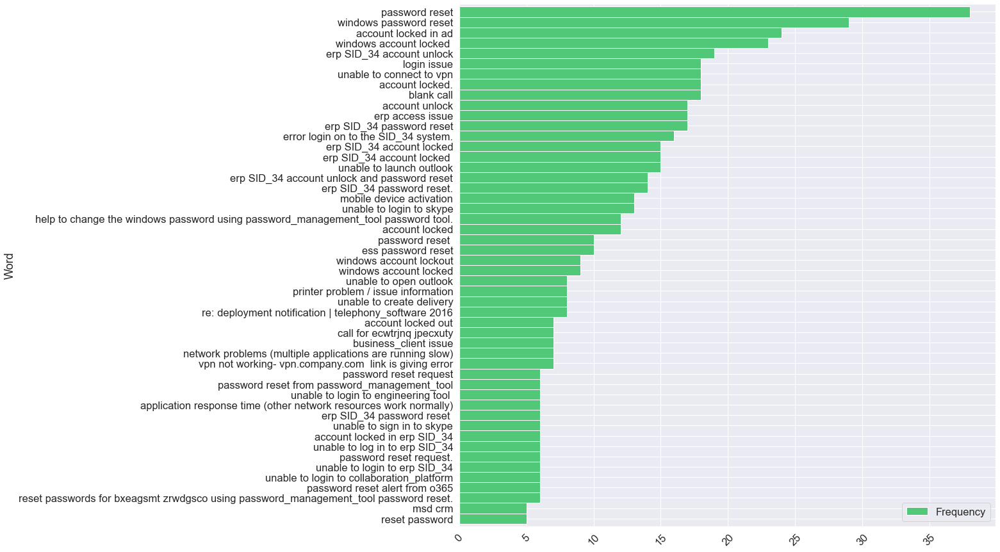

In [66]:
top_N = config['top_n']
rslt = pd.DataFrame(Counter(dataset.short_description.tolist()).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Descriptions
 </span></ul></h4>

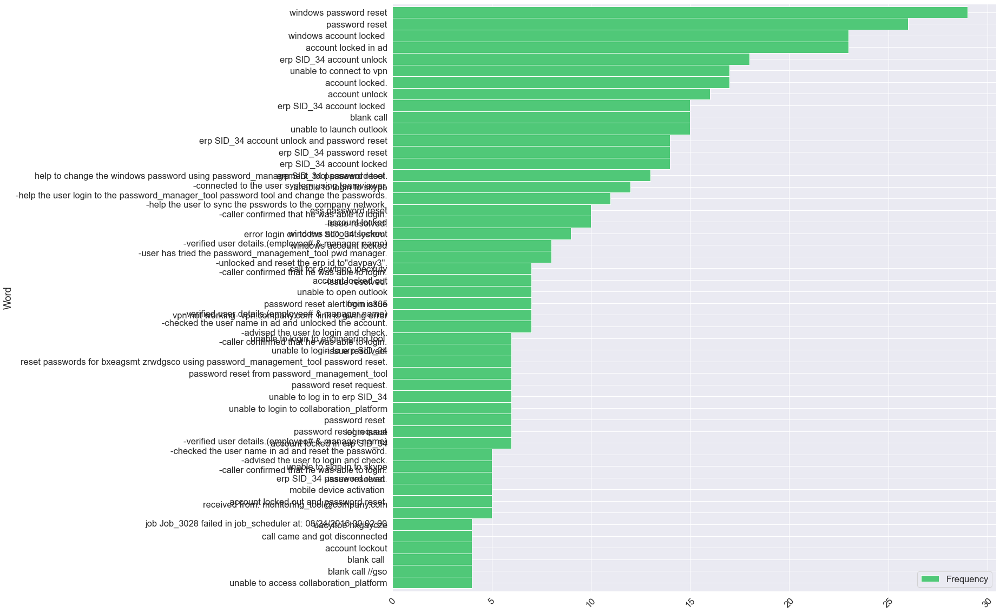

In [67]:
top_N = config['top_n']
rslt = pd.DataFrame(Counter(dataset.description.tolist()).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(20, 20), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Description Lengths vs. Functional Group</span></strong></li>
</ul></h3>

In [68]:
le = LabelEncoder()
dataset['group_code'] = le.fit_transform(dataset.group)
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code
4643,users are unable to connect to the network dri...,users are unable to connect to the network dri...,bdeplqyj fewovrcq,GRP_12,101,17,66,11,4
6488,zugriff auf netzlaufwerke,\n\nreceived from: sthqwdpj.lpnigfyq@gmail.com...,sthqwdpj lpnigfyq,GRP_0,268,33,25,3,0
7316,拼写和语法错误,"编辑ppt时,总是弹出""无法检查拼写和语法错误"",也无法安装。",jtplaoui uvsihfpn,GRP_48,83,3,21,1,43
3893,crm portal login issue_ kxmidsga zokivdfa,\n\nreceived from: kxmidsga.zokivdfa@gmail.com...,kxmidsga zokivdfa,GRP_22,220,27,41,6,15
2823,network issues,\n\nreceived from: verena.financial@company.co...,lntbvwgk doqhisxf,GRP_28,294,42,14,2,21
4027,connection to finance_app data base,\n\nreceived from: naisdxtk.mqzvewsb@gmail.com...,naisdxtk mqzvewsb,GRP_55,256,30,35,5,51
6110,job Job_551 failed in job_scheduler at: 08/28/...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_8,105,11,61,8,72


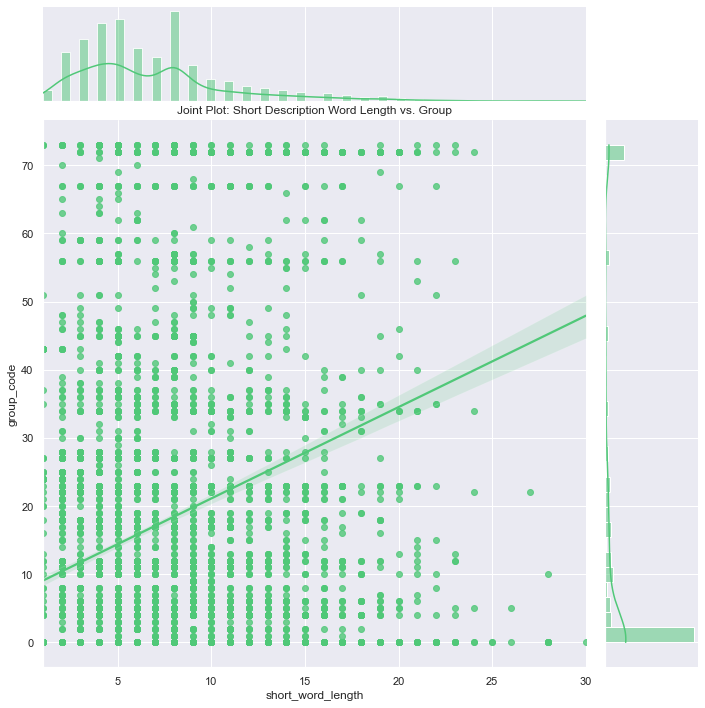

In [69]:
sns.set()
sns.jointplot(dataset.short_word_length, dataset.group_code, 
              kind='reg', color=config['green_rgb'], height=10)
plt.title('Joint Plot: Short Description Word Length vs. Group')
plt.show()

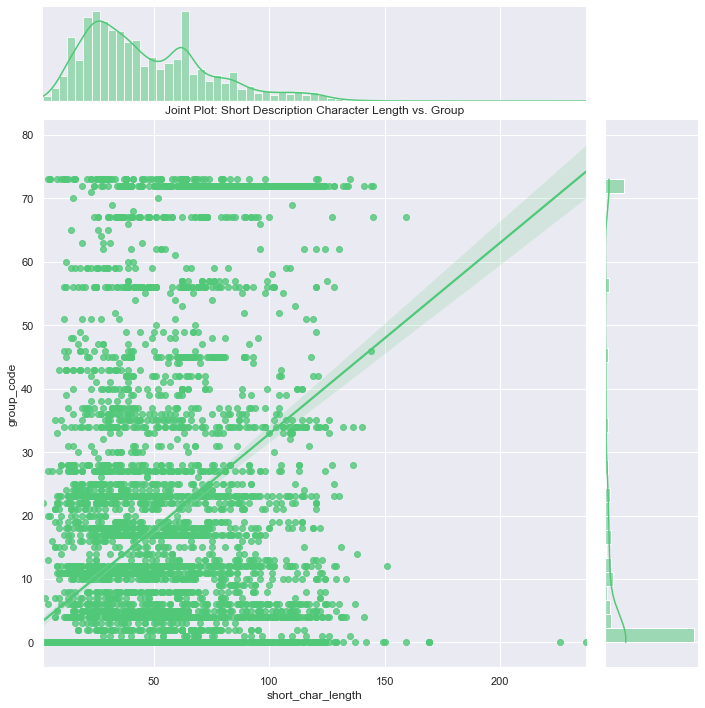

In [70]:
sns.set()
sns.jointplot(dataset.short_char_length, dataset.group_code, 
              kind='reg', color=config['green_rgb'], height=10)
plt.title('Joint Plot: Short Description Character Length vs. Group')
plt.show()

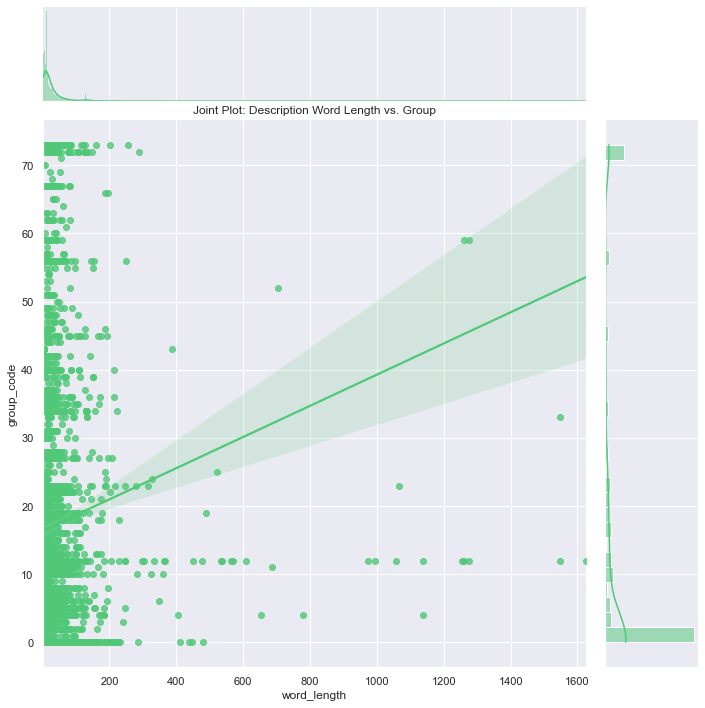

In [71]:
sns.set()
sns.jointplot(dataset.word_length, dataset.group_code, 
              kind='reg', color=config['green_rgb'], height=10)
plt.title('Joint Plot: Description Word Length vs. Group')
plt.show()

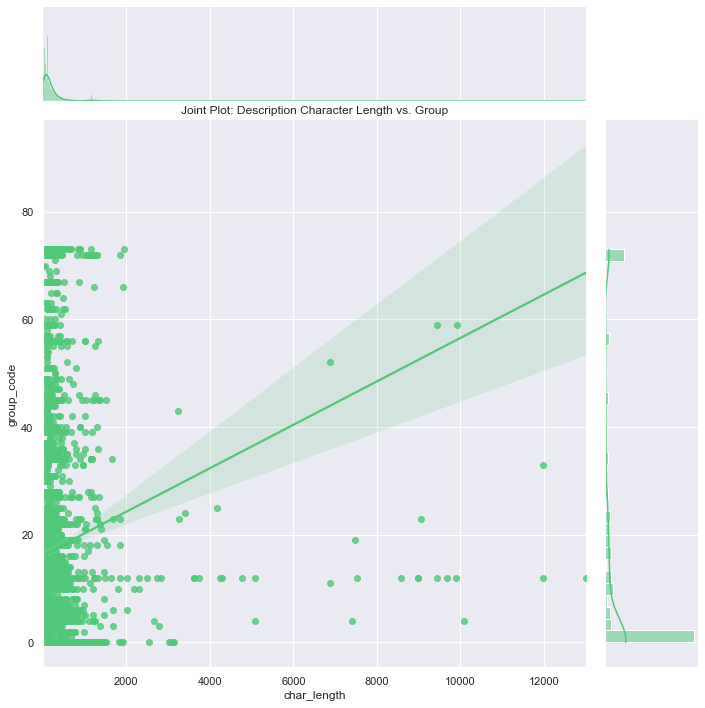

In [72]:
sns.set()
sns.jointplot(dataset.char_length, dataset.group_code, 
              kind='reg', color=config['green_rgb'], height=10)
plt.title('Joint Plot: Description Character Length vs. Group')
plt.show()

In [73]:
# binning the lengths

NUM_BINS = 100
# calculates the natural breaks in a series, exploiting the Fisher-Jenks algorithm
# https://en.wikipedia.org/wiki/Jenks_natural_breaks_optimization
breaks = jenkspy.jenks_breaks(dataset['char_length'], nb_class=NUM_BINS)
labels = list(range(len(breaks) - 1))
pprint(breaks, compact=True)

[3.0, 17.0, 23.0, 28.0, 34.0, 40.0, 47.0, 55.0, 63.0, 71.0, 80.0, 90.0, 101.0,
 109.0, 117.0, 126.0, 137.0, 149.0, 160.0, 170.0, 180.0, 190.0, 201.0, 213.0,
 224.0, 235.0, 247.0, 259.0, 271.0, 283.0, 295.0, 308.0, 323.0, 338.0, 354.0,
 372.0, 392.0, 412.0, 431.0, 449.0, 468.0, 486.0, 508.0, 537.0, 568.0, 596.0,
 620.0, 653.0, 684.0, 720.0, 765.0, 801.0, 837.0, 866.0, 908.0, 934.0, 990.0,
 1026.0, 1063.0, 1116.0, 1157.0, 1176.0, 1197.0, 1234.0, 1265.0, 1301.0, 1347.0,
 1398.0, 1478.0, 1526.0, 1692.0, 1877.0, 1952.0, 2013.0, 2172.0, 2293.0, 2548.0,
 2744.0, 2833.0, 3062.0, 3141.0, 3249.0, 3403.0, 3628.0, 3734.0, 4169.0, 4286.0,
 4766.0, 5087.0, 6887.0, 7403.0, 7524.0, 8575.0, 8991.0, 9063.0, 9440.0, 9678.0,
 9912.0, 10077.0, 11968.0, 13001.0]


In [74]:
dataset['char_length_bins'] = pd.cut(dataset['char_length'] ,bins=breaks, labels=labels, include_lowest=True)

In [75]:
dataset

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,206,33,11,2,0,22
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,194,25,7,1,0,21
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,87,11,18,5,0,10
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,29,5,29,5,0,3
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,12,2,12,2,0,0
...,...,...,...,...,...,...,...,...,...,...
8495,emails not coming in from zz mail,\n\nreceived from: avglmrts.vhqmtiua@gmail.com...,avglmrts vhqmtiua,GRP_29,141,19,33,7,22,16
8496,telephony_software issue,telephony_software issue,rbozivdq gmlhrtvp,GRP_0,24,2,24,2,0,2
8497,vip2: windows password reset for tifpdchb pedx...,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0,50,7,50,7,0,6
8498,machine não está funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,103,17,30,4,59,12


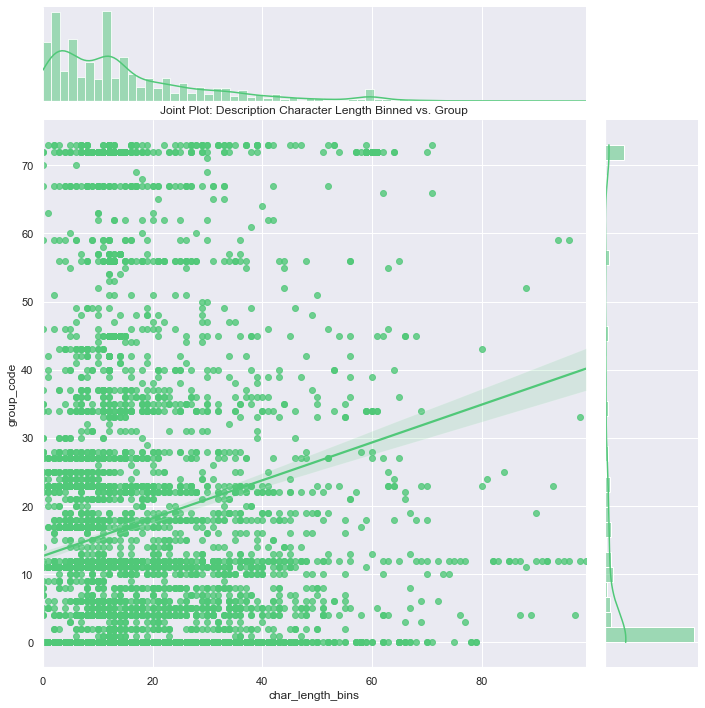

In [76]:
sns.set()
sns.jointplot(dataset.char_length_bins.astype(int), dataset.group_code, 
              kind='reg', color=config['green_rgb'], height=10)
plt.title('Joint Plot: Description Character Length Binned vs. Group')
plt.show()

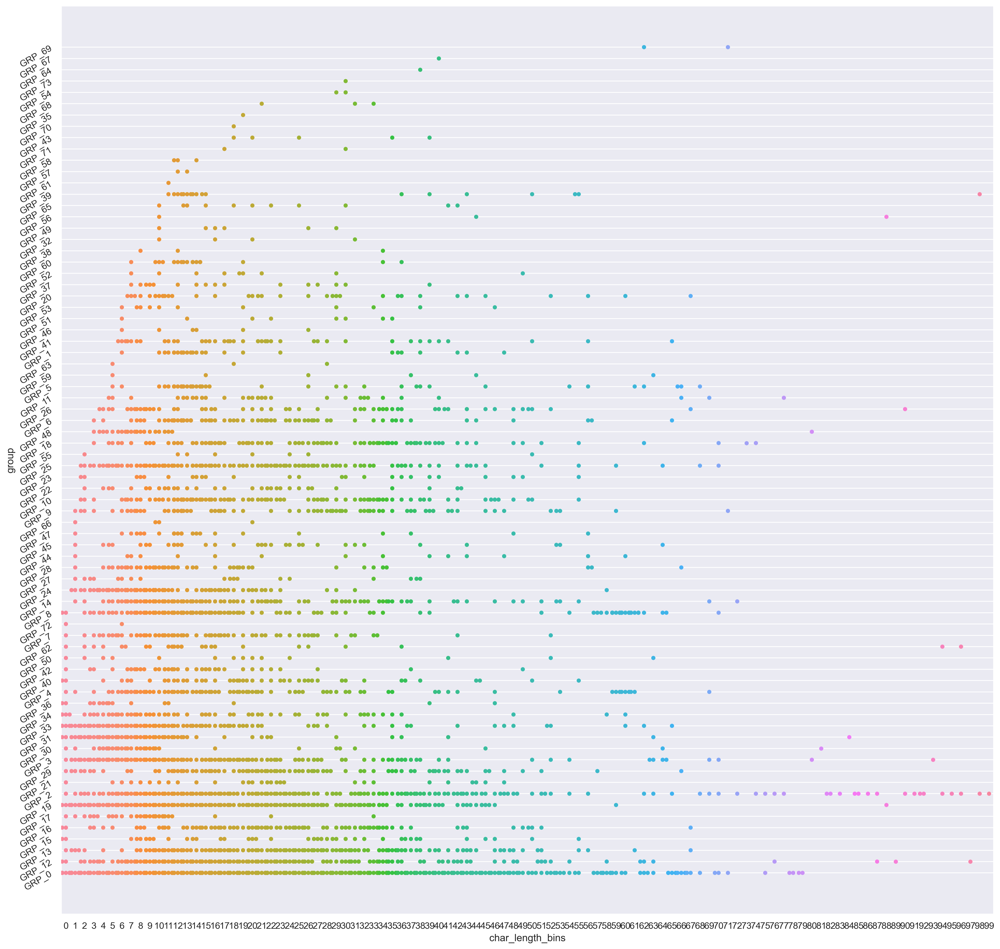

In [77]:
sns.set()
plt.figure(figsize=(20,20), dpi=300)
sns.swarmplot(x="char_length_bins", y="group", data=dataset)
plt.yticks(rotation=30)
plt.show()

In [78]:
data_crosstab = pd.crosstab(dataset['caller'],
                            dataset['group'],
                            margins=True,
                            margins_name="Total")
data_crosstab

group,GRP_0,GRP_1,GRP_10,GRP_11,GRP_12,GRP_13,GRP_14,GRP_15,GRP_16,GRP_17,...,GRP_68,GRP_69,GRP_7,GRP_70,GRP_71,GRP_72,GRP_73,GRP_8,GRP_9,Total
caller,,,,,,,,,,,,,,,,,,,,,
DEsowkrH sciejzNE,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
HdOuWxAt qfKdlJMx,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
ZkBogxib QsEJzdZO,0,1,2,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,54,31,151
abiuclvj brziktno,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
abtknpew ifcekjdb,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zylwdbig wdkbztjp,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
zymdwqsi jzvbthil,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
zywoxerf paqxtrfk,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,9


In [79]:
# significance level
alpha = 0.05

# Calcualtion of Chisquare test statistics
chi_square = 0
rows = dataset['caller'].unique()
columns = dataset ['group'].unique()
for i in columns:
    for j in rows:
        O = data_crosstab[i][j]
        E = data_crosstab[i]['Total'] * data_crosstab['Total'][j] / data_crosstab['Total']['Total']
        chi_square += (O-E)**2/E

# The p-value approach
print("Approach 1: The p-value approach to hypothesis testing in the decision rule")
p_value = 1 - stats.norm.cdf(chi_square, (len(rows)-1)*(len(columns)-1))
conclusion = "Failed to reject the null hypothesis."
if p_value <= alpha:
    conclusion = "Null Hypothesis is rejected."
        
print("chisquare-score is:", chi_square, " and p value is:", p_value)
print(conclusion)

Approach 1: The p-value approach to hypothesis testing in the decision rule
chisquare-score is: 268747.2241233948  and p value is: 0.0
Null Hypothesis is rejected.


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Language Detection</span></strong></li>
</ul></h3>

In [80]:
DetectorFactory.seed = config['seed']

# detect the languages in the dataset
languages = []
errs = []
lang_samples = defaultdict(list)
for text in tqdm(dataset.description):
    try:
        lang = detect_langs(text)
        clean_lang = str(lang).split(':')[0][1:]
        lang_samples[clean_lang].append(text)
        languages.append(clean_lang)
    except LangDetectException as e:
        errs.append(text)
        print('text: ', text)
        print(e)

 74%|██████████████████████████████████████████████████████▋                   | 6284/8499 [00:40<00:13, 161.02it/s]

text:  +86  
No features in text.


100%|██████████████████████████████████████████████████████████████████████████| 8499/8499 [00:53<00:00, 158.46it/s]


In [81]:
print("Unique languages in the descriptions: "
      f"{np.unique(languages)}")

Unique languages in the descriptions: ['af' 'ca' 'cs' 'cy' 'da' 'de' 'en' 'es' 'et' 'fi' 'fr' 'hr' 'hu' 'id'
 'it' 'ja' 'ko' 'lt' 'lv' 'nl' 'no' 'pl' 'pt' 'ro' 'sk' 'sl' 'so' 'sq'
 'sv' 'sw' 'tl' 'tr' 'vi' 'zh-cn']


In [82]:
lang_freqs = {i: len(lang_samples[i]) for i in lang_samples}
freq_df = pd.DataFrame({'Language': lang_freqs.keys(), 'Frequency': lang_freqs.values()},
                      columns=['Language', 'Frequency']).set_index('Language')
freq_df.T

Language,en,no,es,it,af,sv,ca,nl,de,fr,...,lt,ja,sk,tr,sw,vi,so,lv,cs,hu
Frequency,7058,67,65,144,262,37,40,48,424,111,...,4,1,1,1,1,3,1,2,1,1


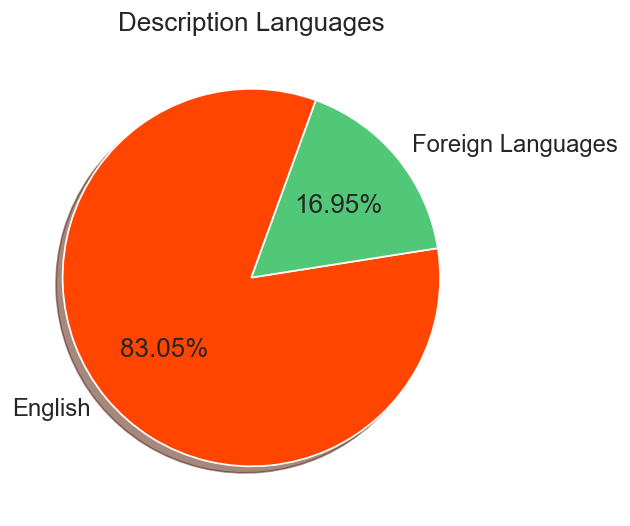

In [83]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
eng = freq_df.loc['en'].tolist()[0]
foreign_lang = len(dataset) - freq_df.loc['en'].tolist()[0]

plt.pie(x=[eng, foreign_lang],
        explode=(0, 0),
        labels=['English', 'Foreign Languages'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=[config['red_rgb'], config['green_rgb']])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Description Languages')
plt.show()

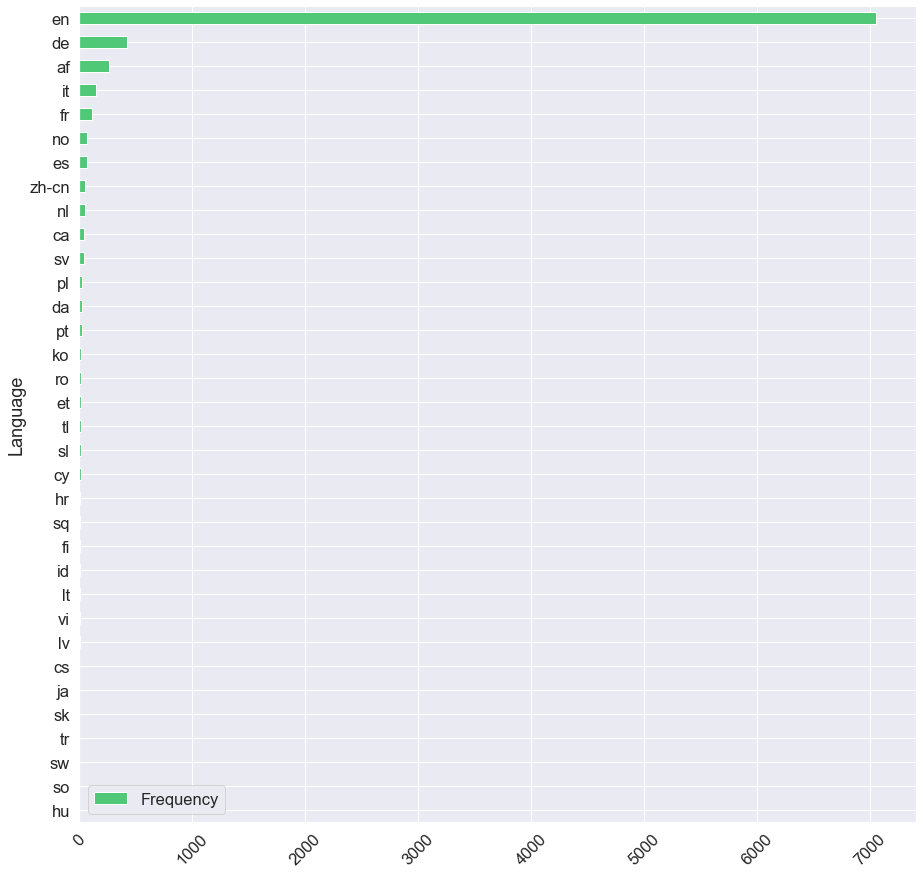

In [84]:
sns.set(font_scale=1.5)  # scale up font size
freq_df.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=0.5, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

In [85]:
# detect the languages in the dataset
languages = []
lang_samples = defaultdict(list)
for text in tqdm(dataset.short_description):
    try:
        lang = detect_langs(text)
        clean_lang = str(lang).split(':')[0][1:]
        lang_samples[clean_lang].append(text)
        languages.append(clean_lang)
    except LangDetectException as e:
        errs.append(text)
        print('text: ', text)
        print(e)

 22%|████████████████▏                                                         | 1856/8499 [00:14<00:58, 114.30it/s]

text:  bgflmyar.xgufkidq@gmail.com
No features in text.


 35%|██████████████████████████                                                | 2994/8499 [00:24<00:42, 128.58it/s]

text:  ???????????????????
No features in text.


100%|██████████████████████████████████████████████████████████████████████████| 8499/8499 [01:07<00:00, 125.00it/s]


In [86]:
print("Unique languages in the short descriptions: "
      f"{np.unique(languages)}")

Unique languages in the short descriptions: ['af' 'ca' 'cs' 'cy' 'da' 'de' 'en' 'es' 'et' 'fi' 'fr' 'hr' 'hu' 'id'
 'it' 'ko' 'lt' 'lv' 'nl' 'no' 'pl' 'pt' 'ro' 'sk' 'sl' 'so' 'sq' 'sv'
 'sw' 'tl' 'tr' 'vi' 'zh-cn']


In [87]:
lang_freqs = {i: len(lang_samples[i]) for i in lang_samples}
freq_df = pd.DataFrame({'Language': lang_freqs.keys(), 'Frequency': lang_freqs.values()},
                       columns=['Language', 'Frequency']).set_index('Language')
freq_df.T

Language,en,et,no,es,it,nl,af,sv,ro,fr,...,vi,hr,pt,ko,lt,so,sw,lv,tr,hu
Frequency,6121,25,157,95,287,140,489,60,45,245,...,9,6,33,15,9,5,1,4,1,1


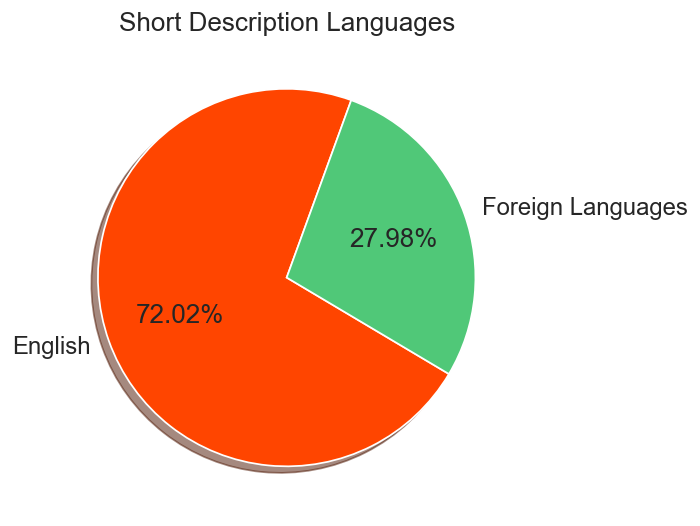

In [88]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
eng = freq_df.loc['en'].tolist()[0]
foreign_lang = len(dataset) - freq_df.loc['en'].tolist()[0]

plt.pie(x=[eng, foreign_lang],
        explode=(0, 0),
        labels=['English', 'Foreign Languages'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=[config['red_rgb'], config['green_rgb']])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Short Description Languages')
plt.show()

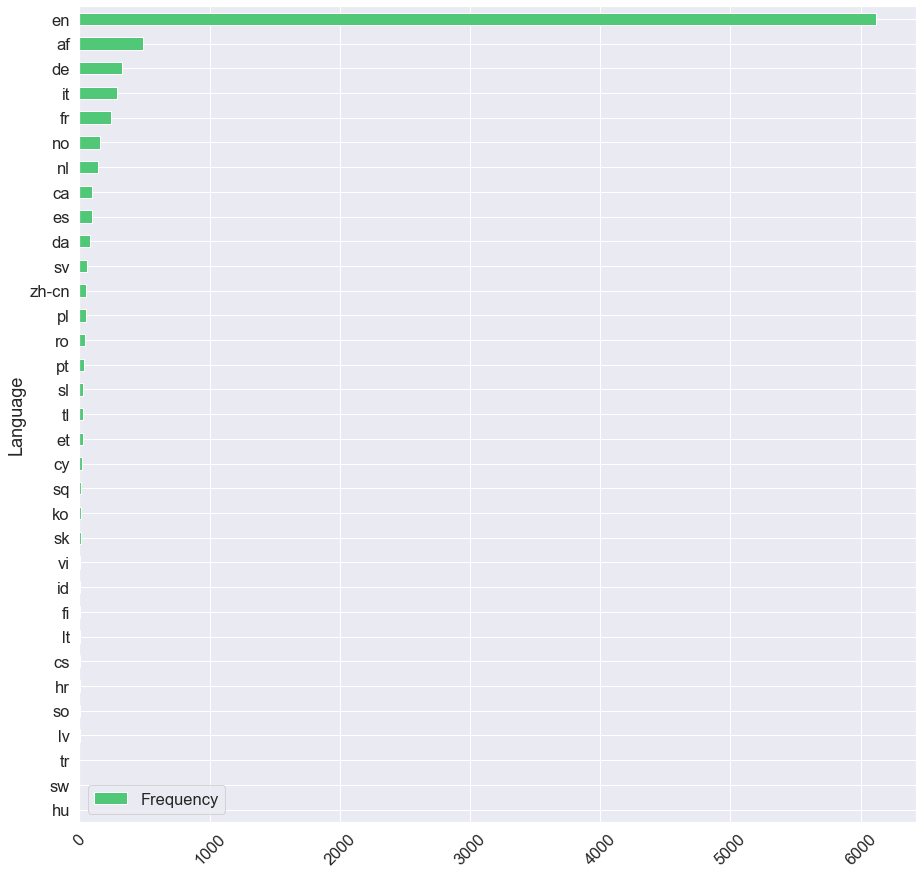

In [89]:
sns.set(font_scale=1.5)  # scale up font size
freq_df.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=0.5, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

In [90]:
errs  # few errors where lang_detect failed, need to impute these irrelevant values

['+86  ', 'bgflmyar.xgufkidq@gmail.com', '???????????????????']

In [91]:
dataset[dataset.description == errs[0]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
6253,in the inbox always show there are several ema...,+86,mqbxwpfn uclrqfxa,GRP_0,5,1,94,19,0,0


In [92]:
dataset.loc[dataset.description == errs[0], 'description'] = dataset[dataset.description == errs[0]].short_description

In [93]:
dataset[dataset.short_description == errs[1]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
1836,bgflmyar.xgufkidq@gmail.com,bgflmyar.xgufkidq@gmail.com wanted to check if...,olckhmvx pcqobjnd,GRP_0,83,13,27,1,0,10


In [94]:
dataset.loc[dataset.short_description == errs[1], 'short_description'] = dataset[dataset.short_description == errs[1]].description

In [95]:
dataset[dataset.short_description == errs[2]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
2975,???????????????????,\n\nreceived from: yzbjhmpw.vzrulkog@gmail.com...,yzbjhmpw vzrulkog,GRP_0,1207,131,19,1,0,62


In [96]:
dataset.loc[dataset.short_description == errs[2], 'short_description'] = dataset[dataset.short_description == errs[2]].description

In [97]:
def clean_incosistencies():
    dataset.loc[dataset.description == errs[0], 'description'] = dataset[dataset.description == errs[0]].short_description
    dataset.loc[dataset.short_description == errs[1], 'short_description'] = dataset[dataset.short_description == errs[1]].description
    dataset.loc[dataset.short_description == errs[2], 'short_description'] = dataset[dataset.short_description == errs[2]].description

# clean_incosistencies()

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Pre-Processing</span></strong></li>
</ul></h1>

In [98]:
dataset.sample(10)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
995,bei herrn potthryzler (benutzerkennung: potsff...,fehlermeldung: systemfehler &h91115116 \n\nwit...,txkgmwbc qohmgwrp,GRP_33,184,23,96,11,27,20
4710,help reset erp SID_37 bw production account pa...,erp SID_37 bw production account password cha...,smktofel etsoirbw,GRP_0,311,35,64,9,0,31
3247,getting error while accessing it support revie...,pl refer attachment,ginjmaxk zumkvfeb,GRP_19,20,3,82,13,11,1
3130,sound system of laptop,\n\nreceived from: ygkzwsud.cvjgkxws@gmail.com...,ygkzwsud cvjgkxws,GRP_19,249,36,22,4,11,26
6025,job bkwin_HostName_768_inc failed in job_sched...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_5,120,11,76,8,45,14
4684,passwörter wothyehre,\n\nreceived from: dgwrmsja.jzlpwuit@gmail.com...,dgwrmsja jzlpwuit,GRP_0,173,18,21,2,0,19
6632,access requited for vl02n for post goods issues,\n\nreceived from: wrelsfqa.qfwosjkh@gmail.com...,wrelsfqa qfwosjkh,GRP_2,245,35,47,8,12,25
4816,please install project 2013 back on the client...,please install project 2013 back on the client...,asxmeruj drqufvgj,GRP_3,50,9,50,9,23,6
5804,all permissions for discounts has been removed...,all permissions for discounts has been removed...,uajiymhe qyrwfkvz,GRP_0,110,19,110,19,0,13
8264,"can't login to skype ,indicate certificate exp...",skype for business software can't be used,mqbxwpfn uclrqfxa,GRP_0,42,7,51,7,0,5


### Pipeline
* fix text encoding usng ftfy.fix_text
* clean up outage questionnaires
* clean up security logs
* parse email messages to retain only subject and body
* clean up emails, links, website links, telephone numbers
* clean up anchor words like: 'Received from:', 'name:', 'hello', 'hello team' , 'cid' ...
* clean html tags if they exist
* clean /r /n characters
* strip caller names in descriptions
* translate accented characters (á -> a)
* convert unicode characters to ascii
* expand contractions (they're -> they are)
* clean stopwords & any custom stopwords
* clean up extra whitespaces & tokenize
* remove gibberish (after language translation)
* strip extra punctuation
* lemmatization
* handle other languages (translated after basic pre-processing is applied on english text)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Outage Questionnaires</span></strong></li>
</ul></h3>

In [99]:
outage_df = dataset.reset_index().loc[pd.Series(['outage' in i for i in  dataset.description.tolist()])]

In [100]:
outage_df.group.value_counts()

GRP_8     139
GRP_4      16
GRP_0       8
GRP_16      1
Name: group, dtype: int64

In [101]:
outage_df

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
78,78,"power outage:UK al, 1st and 5th ave sites hard...",what type of outage: _____network _____ci...,mnlazfsr mtqrkhnx,GRP_8,1197,132,82,17,72,61
79,79,"power outage : germany, mx: site is hard down ...",what type of outage: ___x__network _____c...,jyoqwxhz clhxsoqy,GRP_8,1156,129,74,14,72,59
189,189,network outage: india: site hard down since at...,what type of outage: __x___network _____c...,mnlazfsr mtqrkhnx,GRP_8,1163,130,86,16,72,60
215,215,network outage - warehouse: node company-ups-...,what type of outage: __x___network _____c...,jyoqwxhz clhxsoqy,GRP_8,1152,128,80,11,72,59
240,240,power outage :australia australia: site hard d...,what type of outage: __x___network _____c...,utyeofsk rdyzpwhi,GRP_8,1167,132,78,13,72,60
...,...,...,...,...,...,...,...,...,...,...,...
8097,8098,"network outage, russia ru, company-russia-vpn-...",what type of outage: _x____network _____c...,uxgrdjfc kqxdjeov,GRP_8,1172,130,123,16,72,60
8184,8185,"circuit outage: vogelfontein, south africa mpl...",what type of outage: _____network ___x__c...,jyoqwxhz clhxsoqy,GRP_8,1158,130,86,15,72,60
8272,8273,network outage : south amerirtca(argentina) si...,what type of outage: ____x_network _____c...,vbwszcqn nlbqsuyv,GRP_8,1148,129,88,14,72,59
8274,8275,network outage: usa site is hard down since 05...,what type of outage: _x____network _____c...,vbwszcqn nlbqsuyv,GRP_8,1152,130,65,13,72,59


In [102]:
outage_df.group.value_counts()

GRP_8     139
GRP_4      16
GRP_0       8
GRP_16      1
Name: group, dtype: int64

In [103]:
print(outage_df.description.tolist()[0])

what type of outage:  _____network     _____circuit     ___x__power (please specify what type of outage)

1. top 23 cert site   ?    ___yes______     (yes/no/na) 

2. when did it start  ?   ________4:31 pm et on 10/30. _____________

3.  scheduled maintenance ( power) ? __yno_____    (yes/no/na)     company power  _________     provider power _________
                
4.  scheduled maintenance ( network) ? ___no____    (yes/no/na)     company maint________ (yes/no)       provider maint/ticket #__________________    

5. does site have a backup circuit ?  __yes____    (yes/no/na) 

6. backup circuit active ?   ___na_____     (yes/no/na) 

7. site contact notified (phone/email) ?  _________     (yes/no/na) 

8. remote dial-in ?   ____na_______   (yes/no/na) 

9. equipment reset ?    ____na_______    (yes/no/na) 

10. verified site working on backup circuit ?  ___na____     (yes/no/na) 

11. vendor ticket  # ( global_telecom_1, verizon, telecom_vendor_1, telecom_vendor_2 )    ____global_

In [105]:
def clean_outageq(text: str) -> str:
    """cleans up outage questionaires"""
    if text.startswith('what type of outage'):
        text = ' '.join(text.splitlines())
        text=text.replace("phone",'')
        text=text.replace('email','')
        text=re.sub(r'\n+|\s\s+','',text)
        text=re.sub(r'(\_x000D\_)+','br',text)
        text=re.sub(r'(\(yes\/no\/na\))+|(\(yes\/no\))','br',text)
        temp=text.split('br')
        new=[]
        for x in temp:
            x=str(x)
            x=re.sub(r'\d\:\d+','',x)
            if 'yes'in x:
                x=re.sub(r'\?|(\_)+|\d\.','',x)
                x=re.sub('yes','',x)
            elif 'no' in x:
                x=re.sub(r'\?|(\_)+|\d\.','',x)
                x=re.sub('no','',x)
                x='no'+' '+x
            else:
                x=re.sub(r'\?|(\_)+|\d\.','',x)
                
            new.append(''.join(x))
        text=''.join(new)
        text = re.sub(r'[.,_"\'#-?:!;]', '', str(text))
        text=text.replace('yesnona','')
        text=text.replace('yesno','')
        text= " ".join(text.split())
        text=re.sub(r'what\stype\sof\soutage\:networkcircuitxpower\s\(please\sspecify\swhat\stype\sof\soutage\)','',text)
    return str(text.strip())

In [106]:
print(clean_outageq(outage_df.description.tolist()[0]))

what type of outagenetworkcircuitxpower please specify what type of outage top cert siteno when did it start pm et on scheduled maintenance power yno company powerprovider power scheduled maintenance network company maint provider maintticket does site have a backup circuit backup circuit active nano site contact tified remote dialin na equipment reset na verified site working on backup circuit nano vendor ticket globaltelecom verizon telecomvendor telecomvendor globaltelecom tifiedgsccert startedno additional diagstics


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Security/Event Logs</span></strong></li>
</ul></h3>

In [107]:
dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])]  # all security incident logs

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
341,341,security incidents - ( #in33071122 ) :[ipbl]: ...,source ip :\nsystem name :lmsl9516338\nuser n...,gzhapcld fdigznbk,GRP_3,166,30,87,13,23,18
2977,2978,security incidents - ( #in33987594) : 29866 vi...,source ip :\nsystem name :\nuser name:\nlocat...,gzhapcld fdigznbk,GRP_3,3249,316,115,17,23,80
3096,3097,security incidents - ( #in33976733) : suspicio...,source ip: 10.16.90.249\nsource hostname: andr...,gzhapcld fdigznbk,GRP_56,6887,703,104,11,52,88
3097,3098,security incidents - ( #in33984033) : internal...,source ip :\nsystem name :\nuser name:\nlocat...,gzhapcld fdigznbk,GRP_19,6868,687,96,13,11,88
3529,3530,security incidents - ( #in33944691 ) : possibl...,source ip: 195.272.28.222\nsource port: 80\nso...,gzhapcld fdigznbk,GRP_2,7524,974,111,17,12,90
3531,3532,security incidents - ( #in33944327) :possible ...,source ip :\nsystem name :\nuser name:\nlocat...,gzhapcld fdigznbk,GRP_2,3628,451,109,15,12,82
3704,3705,security incidents - ( #in33932723 ) : possibl...,source ip: 10.44.63.52\nsource hostname: leeng...,gzhapcld fdigznbk,GRP_48,3235,387,105,14,43,80
3705,3706,security incidents - ( #in33924718 ) : possibl...,source ip :195.22.28.222\ndestination ip: 12.9...,gzhapcld fdigznbk,GRP_2,4286,536,116,17,12,85
3960,3961,security incidents - ( #in33805815) : possible...,=========================\nevent data\n=======...,gzhapcld fdigznbk,GRP_2,3734,476,110,16,12,83
3964,3965,security incidents - ( #in33809307 ) : possibl...,source ip :195.22.28.222 \nsystem name :androi...,gzhapcld fdigznbk,GRP_2,8988,1255,116,17,12,92


In [108]:
dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])].group.value_counts()  # groups

GRP_2     26
GRP_39     4
GRP_12     4
GRP_3      4
GRP_62     2
GRP_30     1
GRP_19     1
GRP_0      1
GRP_69     1
GRP_56     1
GRP_48     1
GRP_47     1
GRP_31     1
Name: group, dtype: int64

In [109]:
dataset.reset_index().loc[pd.Series(['cyber' in i for i in  dataset.short_description.tolist()])]

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
491,491,october cyber security month - ransomware,october cyber security month - ransomware,pyrtfdxu nxfkqmoy,GRP_0,42,6,42,6,0,5
1729,1729,cyber security - phish uacyltoe hxgaycze repor...,cyber security - phish uacyltoe hxgaycze repor...,ugyothfz ugrmkdhx,GRP_2,60,9,60,9,12,7
5411,5412,cyber security - phish uacyltoe hxgaycze repor...,cyber security - phish uacyltoe hxgaycze repor...,ugyothfz ugrmkdhx,GRP_2,62,9,62,9,12,7


In [110]:
def remove_duplicates(text: str) -> str:
    """Remove duplicates"""
    text = text.split(" ")
    for i in range(0, len(text)):
        text[i] = "".join(text[i])
    UniqW = Counter(text)
    text = " ".join(UniqW.keys())
    return str(text)

# remove_duplicates(text)

In [111]:
log = dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])].iloc[1].description
print(log)

source ip :
system name :
user  name:
location :
sep , sms status :
field sales user ( yes / no) :  
dsw event log:
-------------------------------------------------------------------------------------------------------------------
event detail(s):

event_id 417013204:
[**] [1:21130977:10] 29866 vid22518 bare http get executable from ip address (possible downloader trojan) [**]
[classification: none] [priority: 2] [action: accept_passive] [impact_flag: 0] [impact: 0] [blocked: 2] [vlan: 0] [mpls label: 0] [pad2: 1]
[sensor id: 602982][event id: 281895][time: 2585087487.272206]
[xref => vid, 22518]
[src ip: 10.1.43.79][dst ip: 94.102.53.238][sport/itype: 61007][dport/icode: 80][proto: 6]
09/27/2016-11:39:36.272206 10.1.43.79:61007 -> 94.102.53.238:80
tcp ttl:127 tos:0x0 id:16297 iplen:20 dgmlen:119 df
***ap*** seq: 0xfbc9dc8c ack: 0xe57c9433 win: 0x102 tcplen: 20
==pcap s==
=0c=00=00=00xz=eawn'=04=00w=00=00=00w=00=00=00e=00=00w?=a9@=00=7f=06=f23=0a=01+o^f5=ee=eeo=00p=fb=c9=dc=8c=e5|=943

In [112]:
def clean_sec_logs(text: str) -> str:
    """Clean up security logs"""
    if text.startswith('source ip'):
        words = set(['source','ip','hostname', 'mac', 'events', 'yes / no'])
        word_cleanup = r'\b(?:{})\b'.format('|'.join(words))
        text = text.replace('\n', ' ').replace('\r', '')
        text = re.sub(r'((:)?\s?\d+(.|:)?)+', '', text)
        text = re.sub('(_x000D_|_x_|_x|x_)', '', text)
        text = re.sub(r'(\[|\]|(\-)+|(\=)+|\%|\,|\"|\:|\(|\))?','', text)
        text = re.sub(word_cleanup,'', text)
        text = remove_duplicates(text)
    return str(text)

clean_sec_logs(log)

" system name user location sep sms status field sales dsw event log details event_id ** vidbare http get executable from address possible downloader trojan classification none priority action accept_passive impact_flag impact blocked vlan mpls label pad sensor idevent idtime xref > vid src ipdst ipsport/itypedport/icodeproto>tcp ttltosidiplendgmlendf ***ap*** seqfbcc ackewintcplenpcap s zeawn'?afo^feeeeofbcdcedet /~yahoo/csrsv.exe http/hostconnection keepalive pcap e ex http_uri http_hostname osecurity correlation_data sepdhcpd dhcpack onto cfelhql via ethrelayleasedurationrenew lowercaseurlcorrelation srcip urlcorrelation vendorreference vidforeseeconndirection outgoing refererproxycorrelationurl null foreseeexternalip eventtypeid unique_event_hash ontologyid foreseeinternalip urlpath srchostname lhqlinspectorruleid inspectoreventid httpmethod netacuity_destination_organization ecatel ltd vendoreventid device_id foreseemaliciousprobability event_summary tcpflags agentid lhqlcvss fore

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean up caller ids in description</span></strong></li>
</ul></h3>

In [113]:
uniq_callers = set(dataset.caller.tolist())
len(uniq_callers)

2950

In [114]:
callers_tokens = set(flatten([i.split() for i in uniq_callers]))
len(callers_tokens)

5900

In [115]:
def clean_callers(text: str, callers_tokens=callers_tokens) -> str:
    """strips out caller ids from the descriptions"""
    return ' '.join([w for w in text.split()  if w.lower() not in callers_tokens])

test = """yfqoaepn xnezhsit
managing director
finance manager cee
"""

clean_callers(test)

'managing director finance manager cee'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean Irrelevant Information</span></strong></li>
</ul></h3>

* Clean up Emails, Links, Dates, Telephone Numbers

In [116]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [117]:
test = "Date: 12/2/2024" 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "DATE"
date_hdlr = DateHandler()
date_indices = date_hdlr.match_ref(text, toks, tags,
                                   entity=tag,
                                   verbose=True)
tags = ['DATE' if idx in date_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches DATE: ['12/2/2024']

Date : 12/2/2024
['Date', ':', '12/2/2024']
['O', 'O', 'DATE']
[('Date', 'O'), (':', 'O'), ('12/2/2024', 'DATE')]


In [118]:
test = "mailto: john.doe@gmail.com from: jane.doe@outlook.com"
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "MAIL"
email_hdlr = EmailHandler()
email_indices = email_hdlr.match_ref(text, toks, tags,
                                     entity=tag,
                                     verbose=True)
tags = [tag if idx in email_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches MAIL: ['john.doe@gmail.com', 'jane.doe@outlook.com']

mailto : john.doe@gmail.com from : jane.doe@outlook.com
['mailto', ':', 'john.doe@gmail.com', 'from', ':', 'jane.doe@outlook.com']
['O', 'O', 'MAIL', 'O', 'O', 'MAIL']
[('mailto', 'O'), (':', 'O'), ('john.doe@gmail.com', 'MAIL'), ('from', 'O'),
 (':', 'O'), ('jane.doe@outlook.com', 'MAIL')]


In [119]:
test = "www.google.com/?search Search Results: ..." 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "LINK"
link_hdlr = LinkHandler()
link_indices = link_hdlr.match_ref(text, toks, tags,
                                   entity=tag,
                                   verbose=True)
tags = [tag if idx in link_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches LINK: ['www.google.com/?search']

www.google.com/?search Search Results : ...
['www.google.com/?search', 'Search', 'Results', ':', '...']
['LINK', 'O', 'O', 'O', 'O']
[('www.google.com/?search', 'LINK'), ('Search', 'O'), ('Results', 'O'),
 (':', 'O'), ('...', 'O')]


In [120]:
test = "Tel +1 724 539 5257" 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "TEL"
tel_hdlr = TelHandler()
tel_indices = tel_hdlr.match_ref(text, toks, tags,
                                 entity=tag,
                                 verbose=True)
tags = [tag if idx in tel_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches TEL: ['Tel', '+1', '724', '539', '5257']

Tel +1 724 539 5257
['Tel', '+1', '724', '539', '5257']
['TEL', 'TEL', 'TEL', 'TEL', 'TEL']
[('Tel', 'TEL'), ('+1', 'TEL'), ('724', 'TEL'), ('539', 'TEL'), ('5257', 'TEL')]


In [121]:
def clean_irrelevant_info(text: str) -> str:
    """strips out emails, dates, website links and telephone numbers in the text"""
    doc = nlp(text)
    toks = [t.text for t in doc]
    toks = [t.strip() for t in toks]
    text = " ".join(toks)
    tags = ['O']*len(doc)
    tel_indices = tel_hdlr.match_ref(text, toks, tags,
                                     entity='TEL',
                                     verbose=False)
    tags = ['TEL' if idx in tel_indices else 'O'
            for idx in range(len(toks))]
    link_indices = link_hdlr.match_ref(text, toks, tags,
                                       entity='LINK',
                                       verbose=False)
    tags = ['LINK' if idx in link_indices else tag
            for idx, tag in enumerate(tags)]
    date_indices = date_hdlr.match_ref(text, toks, tags,
                                       entity='DATE',
                                       verbose=False)
    tags = ['DATE' if idx in date_indices else tag
            for idx, tag in enumerate(tags)]
    email_indices = email_hdlr.match_ref(text, toks, tags,
                                         entity='MAIL',
                                         verbose=False)
    tags = ['MAIL' if idx in email_indices else tag
            for idx, tag in enumerate(tags)]
    # print(toks)
    # print(tags)
    # print([tok for tok, tag in zip(toks, tags) if tag == "O"])

    text = str(" ".join([tok for tok, tag in zip(toks, tags) if tag == "O"]))
    # Remove HTML special entities (e.g. &amp;)
    text = re.sub(r'\&\w*;', '', text)
    # Remove hyperlinks
    text = re.sub(r'https?:\/\/.*\/\w*', '', text)  
    return text

In [122]:
%%time

test = "Tel +1 724 539 5257 www.google.com/?search Search Results: ... Date: 12/2/2024 mailto: john.doe@gmail.com from: jane.doe@outlook.com"
clean_irrelevant_info(test)

Wall time: 5 ms


'Search Results : ... Date : mailto : from :'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean Anchors</span></strong></li>
</ul></h3>

In [123]:
anchors = ['received from:', 'received from :', 'received from:',
           'from:', 'to:', 'from :', 'to :',
           'date:', 'date :', 'cid', 'gentles,',
           '^hi', '^hello', '^hello,', '^hello ,', '^dear team',
           'good morning', 'good morning,' '^hi there', '^hi there,',
           'received from:?', 'hello helpdesk', 'best$',
           'hello', 'hi', 'employee', 'manager', 'etc', 'meetings', 'welcome',
           'please', 'pls', 'sir','mam', 'regards', 'jpg', 'image', 'fyi',
           'good', 'afternoon', 'morning', 'greetings',
          ]

# to strip out larger anchors first
anchors = sorted(list(set(anchors)), key=len, reverse=True)
anchors = [re.compile(a) for a in anchors]

def clean_anchors(text: str, anchors=anchors) -> str:
    """strips out anchor words"""
    for anchor in anchors:
        text = re.sub(anchor, '', text.strip()).strip()
    return str(text.strip())

In [124]:
%%time
test = """
hi there,

would you please help me unlock my supply_chain_software account and reset my supply_chain_software password? """
clean_anchors(test)

Wall time: 0 ns


'would you  help me unlock my supply_chain_software account and reset my supply_chain_software password?'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Parse Emails</span></strong></li>
</ul></h3>

In [125]:
test = """received from: hmjdrvpb.komuaywn@gmail.com

hello team,

my meetings/skype meetings etc are not appearing in my outlook calendar, can somebody please advise how to correct this?

kind """

In [126]:
def parse_body(msg: str, encoding='utf-8'):
    b = email.message_from_string(msg)
    body = ""

    if b.is_multipart():
        for part in b.walk():
            ctype = part.get_content_type()
            cdispo = str(part.get('Content-Disposition'))

            # skip any text/plain (txt) attachments
            if ctype == 'text/plain' and 'attachment' not in cdispo:
                body = part.get_payload(decode=True)  # decode
                break

    # not multipart - i.e. plain text & no attachments
    else:
        # print('Plain Text')
        body = b.get_payload(decode=True)

    subject_matches =  re.findall('subject:.*\n', test)
    if subject_matches:
        subject = subject_matches[0]
    else:
        subject = b.get_all('subject')

    if not isinstance(subject, str):
        subject = ''
    
    # print("Subject: ", subject)
    # print("Body: ", body)

    body = str(from_bytes(body).best())
    # body = str(body, encoding)

    parsed_msg = str(subject + body)
    if is_blank(parsed_msg):
        # return original message if no payload is found after parsing
        return msg
    return parsed_msg

In [127]:
def strip_headers(text: str) -> str:
    """strip headers in email messages like: "received from: xyz@gmail.com"""
    patterns = list()
    patterns.append(r'received from:?\s?' + email_regex)
    patterns.append(r'from:?\s?' + email_regex)
    patterns.append(r'email:?\s?' + email_regex)
    patterns.append(r'to:?\s?' + email_regex)
    patterns.append(r'to:\s')
    patterns.append(r'sent:\s.*[ap]m')
    patterns.append(r'customer number:')
    patterns.append(r'summary:')
    patterns.append(r'subject:')
    patterns.append(r'telephone:')
    patterns.append(r'regional controller')
    patterns.append(r'<mail>')
    patterns.append(r'help desk,')
    patterns.append(r'it team,')
    patterns.append(r'hello team\s?,?')
    patterns.append(r'global it team,')
    patterns.append(r'\nbest\n')
    patterns.append(r'\nregards\n')
    patterns.append(r'\[cid:?.*\]')  # attachments link
    
    # patterns.append(r'subject:?.*\b')
    patterns = [re.compile(p) for p in patterns]
    for pattern in patterns:
        text = re.sub(pattern, '', text.strip()).strip()
    return str(text.strip())

def parse_email(msg: str) -> str:
    """parses and cleans email messages"""
    doc = nlp(msg)
    toks = [t.text for t in doc]
    toks = [t.strip() for t in toks]
    text = " ".join(toks)
    tags = ['O']*len(doc)
    tag = "MAIL"
    email_indices = email_hdlr.match_ref(text, toks, tags,
                                         entity=tag,
                                         verbose=False)
    if email_indices:
        msg = parse_body(msg)
        msg = strip_headers(msg)
    return msg

def parse_email_row(row):
    descr = row.description
    short_descr = row.short_description
    # text_normalized = str(from_bytes(text.encode('utf-8')).best())
    row['cleaned_short_description'] = parse_email(short_descr)
    row['cleaned_description'] = parse_email(descr)
    return row

print(parse_email(test))

my meetings/skype meetings etc are not appearing in my outlook calendar, can somebody please advise how to correct this?

kind


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Gibberish Removal</span></strong></li>
</ul></h3>

In [128]:
nltk.download('words')
vocab = set(nltk.corpus.words.words())

gib = set(['æ','¹','å','†ç','ï¼Œ','Ž','¥','Š','å','©','ç™','å½','ä','º','†','ã','€','æ','—','¶',"f³","‹","è","§",'¯åŠ¨å','¯åŠ¨å','Žé'])
gibb = r'\b(?:{})\b'.format('|'.join(gib))
def clean_gibberish(text: str) -> str:
    #gibb = r'\b(?:{})\b'.format('|'.join(gib))
    text=text.lower()
    # Remove hashtag while keeping hashtag text
    text = re.sub(r'#','', text)
    # replace '&' with 'and'
    text = re.sub(r'&;?', 'and', text)

    # Remove characters beyond Readable formart by Unicode:
    # text= ''.join(c for c in text if c <= '\uFFFF') 
    # text = text.strip()
    # Remove unreadable characters  (also extra spaces)
    text = ' '.join(re.sub("[^\u0030-\u0039\u0041-\u005a\u0061-\u007a]", " ", text).split())
    text = re.sub(r"\s+[a-zA-Z]\s+", ' ', text)
    text = re.sub(' +', ' ', text)
    text = re.sub('xd','',text)
    text = re.sub(gibb,'',text)
    return str(text.strip())


def clean_oov(text: str, vocab=vocab) -> str:
    """strips out words that are outside the given vocabulary
       (exclude out-of-vocab tokens)"""
    text = " ".join([i for i in text.split() if i.lower() in vocab])
    return str(text.strip())

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Utility functions for Generic Pre-Processing</span></strong></li>
</ul></h3>

In [129]:
# utility functions for text preprocesing

CUSTOM = True

stemmer = SnowballStemmer('english')
if CUSTOM:
    stop_words = set(nltk.corpus.stopwords.words('english'))
    # custom stopwords added from the most frequent words which are generic 
    # and might not relate to the sentiment of the review
    stop_words.update(['urllink', ])
else:
    stop_words = set(nltk.corpus.stopwords.words('english'))


def replace_accented_chars(text: str) -> str:
    """normalizes and replaces accented characters"""
    unaccented_text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return str(unaccented_text)


def strip_html_tags(text: str) -> str:
    """strips html tags like <h4> ..etc"""
    soup = BeautifulSoup(text, "html.parser")
    [s.extract() for s in soup(['iframe', 'script'])]
    stripped_text = soup.get_text()
    stripped_text = re.sub(r'[\r|\n|\r\n]+', '\n', stripped_text)
    return str(stripped_text)


def expand_contractions(text: str) -> str:
    text = contractions.fix(text)
    return str(text)


def remove_special_characters(text: str) -> str:
    """
    Remove special characters but preserve digits and excalamation marks
    as they indicate emotionally charged review """
    text = re.sub(r"[^A-Za-z0-9!?\'\`]", " ", text)
    return str(text)


def strip_stops(text: str, is_lower_case=False, stop_words=stop_words) -> str:
    """strip stopwrds"""
    tokens = text.split()
    tokens = [token.strip() for token in tokens]
    if is_lower_case:
        filtered_tokens = [token for token in tokens if token not in stop_words]
    else:
        filtered_tokens = [token for token in tokens if token.lower() not in stop_words]
    filtered_text = ' '.join(filtered_tokens)    
    return str(filtered_text)


def snowball_stem(text: str, stemmer=stemmer) -> str:
    """stemming using snowball stemmer"""
    words = text.split()
    stemmed_words = [stemmer.stem(word) for word in words]
    text = " ".join(stemmed_words)
    return str(text)


def tokenize(text: str) -> str:
    """tokenize using spaCy"""
    doc = nlp(text)
    return str(" ".join([t.text for t in doc]))


def lemmatize(text: str) -> str:
    """lemmatize using spaCy"""
    doc = nlp(text)
    return str(" ".join([t.lemma_ for t in doc]))

In [130]:
def preprocess_text(text: str,
                    fix_encoding=config['fix_encoding'],
                    clean_security_logs=config['clean_security_logs'],
                    clean_emails=config['clean_emails'],
                    strip_irrelevant=config['strip_irrelevant'],
                    strip_anchors=config['strip_anchors'],
                    strip_callers=config['strip_callers'],
                    clean_html_tags=config['clean_html_tags'],
                    replace_accented=config['replace_accented'],
                    clean_contractions=config['clean_contractions'],
                    remove_special=config['remove_special'],
                    strip_stopwords=config['strip_stopwords'],
                    clean_whitespace=config['clean_whitespace'],
                    tokenize_text=config['tokenize_text'],
                    remove_gibberish=config['remove_gibberish'],
                    remove_oov=config['remove_oov'],
                    lower=config['lower'],
                    get_lemmas=config['get_lemmas'],
                    strip_numbers=config['strip_numbers']
                   )-> str:
    """performs all preprocessing techniques in the pipeline on a string to return a cleaned string"""

    if fix_encoding:
        text = fix_text(text)

    if clean_security_logs:
        text = clean_sec_logs(text)
        text = clean_outageq(text)

    if clean_emails:
        text = parse_email(text)

    if strip_irrelevant:
        text = clean_irrelevant_info(text)

    if strip_anchors:
        text = clean_anchors(text)

    if strip_callers:
        text = clean_callers(text)
    
    if clean_html_tags:
        text = strip_html_tags(text)
    
    if replace_accented:
        text = replace_accented_chars(text)

    if clean_contractions:
        text = expand_contractions(text)

    if remove_special:
        text = remove_special_characters(text)

    if strip_stopwords:
        text = strip_stops(text)
    
    if clean_whitespace:
        # remove extra whitespace between tokens
        text = ' '.join(text.split())
    
    if tokenize_text:
        text = tokenize(text)
    
    if remove_gibberish:
        text = clean_gibberish(text)
    
    if remove_oov:
        text = clean_oov(text)

    if lower:
        text = text.lower()

    if get_lemmas:
        text = lemmatize(text)

    if strip_numbers:
        text = ' '.join([re.sub(r'\d+', '', tok) for tok in text.split()])

    return str(text.strip())

In [131]:
test = """
received from: phfduvwl.yqnaucep@gmail.com

hello
i failed to login my hpqc account and got below message.
could you please reset password for my hpqc account, i need it to do uacyltoe hxgaycze next week
my user id is zhudrs

[cid:image001.png@01SID_358c2.0b26f430]
"""

In [132]:
test = """received from: tbvpkjoh.wnxzhqoa@gmail.com

i need access to the following path.  please see pmgzjikq potmrkxy for approval.



tbvpkjoh wnxzhqoa
company usa plant controller
tbvpkjoh.wnxzhqoa@gmail.com<tbvpkjoh.wnxzhqoa@gmail.com>

ticket update on inplant_872683
unable to login to collaboration_platform // password reset
all my calls to my ip phone are going to warehouse_toolmail, it is not even ringing. 
sales area selection on opportunities not filtering to those in which the account """
print(test)

received from: tbvpkjoh.wnxzhqoa@gmail.com

i need access to the following path.  please see pmgzjikq potmrkxy for approval.



tbvpkjoh wnxzhqoa
company usa plant controller
tbvpkjoh.wnxzhqoa@gmail.com<tbvpkjoh.wnxzhqoa@gmail.com>

ticket update on inplant_872683
unable to login to collaboration_platform // password reset
all my calls to my ip phone are going to warehouse_toolmail, it is not even ringing. 
sales area selection on opportunities not filtering to those in which the account 


In [133]:
%%time

cleaned = preprocess_text(test)
pprint(cleaned, compact=True)

('need access follow path see pmgzjikq potmrkxy approval company usa plant '
 'controller ticket update inplant  unable login collaboration platform '
 'password reset call ip phone go warehouse toolmail even ring sale area '
 'selection opportunity filtering wch account')
Wall time: 40 ms


In [134]:
def preprocess_df(row):
    descr = row.description
    short_descr = row.short_description

    if isinstance(descr, str):
        descr = preprocess_text(descr)
    else:
        descr = np.nan
    row['cleaned_description'] = descr
    
    if isinstance(short_descr, str):
        short_descr = preprocess_text(short_descr)
    else:
        short_descr = np.nan
    row['cleaned_short_description'] = short_descr
    return row

In [135]:
preprocessed_dataset = dataset.progress_apply(preprocess_df, axis=1)

100%|███████████████████████████████████████████████████████████████████████████| 8499/8499 [05:02<00:00, 28.10it/s]


In [136]:
preprocessed_dataset.isna().sum()

short_description            0
description                  0
caller                       0
group                        0
char_length                  0
word_length                  0
short_char_length            0
short_word_length            0
group_code                   0
char_length_bins             0
cleaned_description          0
cleaned_short_description    0
dtype: int64

In [137]:
# cleaned dataset
preprocessed_dataset.sample(10)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins,cleaned_description,cleaned_short_description
7288,HostName_755 EU_tool server restart required,please restart the server aerp and check if it...,qmhikdzl zatcorjd,GRP_12,132,23,44,5,4,15,restart server aerp check work eu tool working...,hostname eu tool server restart require
2195,"passwords - vpn, distributor_tool sync",\n\nreceived from: pgrvqtdo.hgpymwxb@gmail.com...,pgrvqtdo hgpymwxb,GRP_0,240,36,38,5,0,25,seem problem log vpn distributor tool access c...,password vpn distributor tool sync
7091,password cannot changed,\n\nreceived from: tbukjcyl.lxncwqbj@gmail.com...,tbukjcyl lxncwqbj,GRP_0,144,15,23,3,0,16,dear could help fix,password change
577,bug in employee extract programdnty - reportnc...,bug in employee extract programdnty - reportnc...,rdfjsawg zpmxgdcw,GRP_10,85,11,85,11,2,10,bug extract programdnty reportncqulao qauighdp...,bug extract programdnty reportncqulao qauighdp...
2931,analysis add in does not show up.,analysis add in does not show up.,dslamtcb ezbmonjr,GRP_0,33,7,33,7,0,3,analysis add show,analysis add show
1888,not able to connect to vpn,not able to connect to vpn,mtzjkhpi sfcmyjzx,GRP_0,26,6,26,6,0,2,able connect vpn,able connect vpn
7557,setup new ws \ghaltiek lsuepvyx,setup new ws \ghaltiek lsuepvyx,ghaltiek lsuepvyx,GRP_24,31,5,31,5,17,3,setup new ws ghaltiek,setup new ws ghaltiek
6739,blank call // gso,blank call // gso,rbozivdq gmlhrtvp,GRP_0,17,4,17,4,0,0,blank call gso,blank call gso
5142,wrench_engineering_tool macro issue,\n\nreceived from: ucdwyxko.apktrsyq@gmail.com...,ucdwyxko apktrsyq,GRP_19,305,46,35,3,11,30,unable run macro wch use open excel word file ...,wrench engineering tool macro issue
8351,password_management_tool password manager pass...,password_management_tool password manager pass...,xpugzdvk xiawvmfp,GRP_0,61,6,61,6,0,7,password management tool password password res...,password management tool password password res...


In [138]:
def get_length(row):
    try:
        row['char_length'] = len(row.description)
        row['word_length'] = len(row.description.split())
        row['short_char_length'] = len(row.short_description)
        row['short_word_length'] = len(row.short_description.split())
        row['cleaned_char_length'] = len(row.cleaned_description)
        row['cleaned_word_length'] = len(row.cleaned_description.split())
        row['cleaned_short_char_length'] = len(row.cleaned_short_description)
        row['cleaned_short_word_length'] = len(row.cleaned_short_description.split())
    except Exception:  # assign 0 length to missing rows, if any
        row['char_length'] = 0
        row['word_length'] = 0
        row['short_char_length'] = 0
        row['short_word_length'] = 0
        row['cleaned_char_length'] = 0
        row['cleaned_word_length'] = 0
        row['cleaned_short_char_length'] = 0
        row['cleaned_short_word_length'] = 0
    return row

preprocessed_dataset = preprocessed_dataset.progress_apply(get_length, axis=1)

100%|██████████████████████████████████████████████████████████████████████████| 8499/8499 [00:16<00:00, 512.42it/s]


In [139]:
preprocessed_dataset.shape

(8499, 16)

In [140]:
def merge_descriptions(row):
    """merge description columns to create a new derived feature
    intelligently by not repeating words if already present"""
    merged_descr = np.nan
    short_descr = str(row.cleaned_short_description)
    descr = str(row.cleaned_description)
    short_tokens = [i for i in short_descr.split()]

    if len(descr) == 0 and len(short_descr) == 0:
        merged_descr = str(row.short_description + " " + row.description)
        
    elif len(short_descr) == 0 and len(descr) > 0:
        merged_descr = descr

    elif len(descr) == 0 and len(short_descr) > 0:
        merged_descr = short_descr

    elif (row.cleaned_short_description == row.cleaned_description
          or str(row.description).startswith(short_descr)
          or short_descr in str(row.description)
         ):
        merged_descr = descr

    elif any(i for i in short_tokens if i in descr):
        short_tokens = [i for i in short_tokens if i not in descr]
        merged_descr = str(' '.join(short_tokens)).strip() + " " + descr

    else:
        merged_descr = short_descr + " " + descr
    row['merged_description'] = str(merged_descr).strip()
    return row

merged_dataset = preprocessed_dataset.progress_apply(merge_descriptions, axis=1)

100%|█████████████████████████████████████████████████████████████████████████| 8499/8499 [00:04<00:00, 1911.61it/s]


In [141]:
merged_dataset[['cleaned_short_description', 'cleaned_description', 'merged_description']].sample(7)

,cleaned_short_description,cleaned_description,merged_description
6328,reset password hr tool globalview sid,reset password hr tool globalview sid,reset password hr tool globalview sid
7519,erp sid password reset unlock request,erp sid password reset unlock request,erp sid password reset unlock request
1621,ticket update ticket no,ticket update ticket no,ticket update ticket no
223,probleme mit bluescreen,hallo es ist erneut passiert der pc hat sich z...,probleme bluescreen hallo es ist erneut passie...
6019,ad lock,ad lock,ad lock
3318,job hr payroll na u fail job scheduler,job hr payroll na u fail job scheduler,job hr payroll na u fail job scheduler
7791,join skype meeting,join skype meeting,join skype meeting


In [142]:
merged_dataset.shape

(8499, 17)

In [143]:
merged_dataset.to_excel('./data/merged_clean_data_with_chineese.xlsx', index=None)

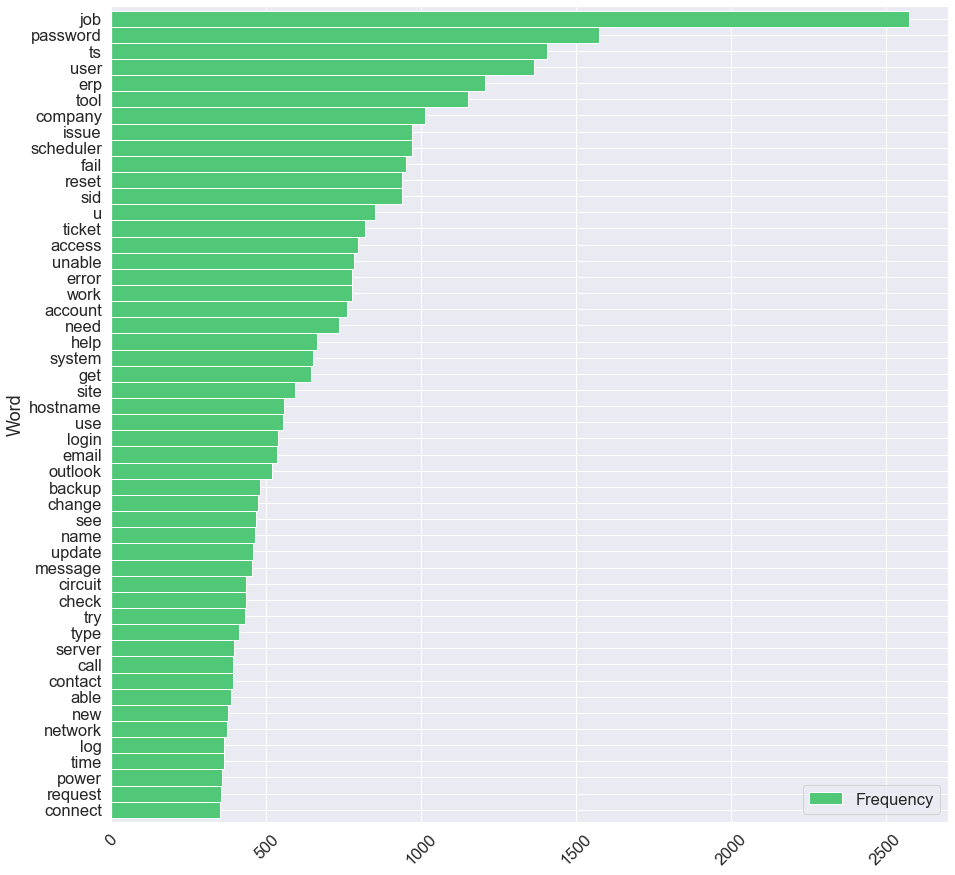

In [144]:
# top 50 most frequent words in text
top_N = 50

words = (merged_dataset.cleaned_description.str.cat(sep=' ').split())
rslt = pd.DataFrame(Counter(words).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
rslt[:50].transpose()
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.savefig('dist_after_cleaning.png')
plt.show()

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Language Translation</span></strong></li>
</ul></h1>

* Objective:

Detect Foreign Languages in dataset and perform machine translation backed by Hugging Face models. The quality of machine translation via cloud services has come a very long way and produces high quality results. This notebook shows how the models from Hugging Face give developers a reasonable alternative for local machine translation.

In [2]:
import re
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from pprint import pprint

tqdm.pandas()

In [3]:
dataset = pd.read_excel('./data/merged_clean_data_with_chineese.xlsx')

dataset.isna().sum()

short_description             0
description                   0
caller                        0
group                         0
char_length                   0
word_length                   0
short_char_length             0
short_word_length             0
group_code                    0
char_length_bins              0
cleaned_description          57
cleaned_short_description    50
cleaned_char_length           0
cleaned_word_length           0
cleaned_short_char_length     0
cleaned_short_word_length     0
merged_description            0
dtype: int64

In [4]:
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length,merged_description
3582,collaboration_platform,\n\nreceived from: xaertwdh.kcsagvpy@gmail.com...,epAYsqnX RAkuDnXG,GRP_0,164,22,22,1,0,18,advise collaboration platform save sync file n...,collaboration platform,72,11,22,2,advise collaboration platform save sync file n...
1435,password is not getting synchronized.,password is not getting synchronized.,bgohnwer ybinfojr,GRP_0,37,5,37,5,0,4,password get synchronize,password get synchronize,24,3,24,3,password get synchronize
2103,hrt archive jobs are failing,hrt archive jobs are failing with error \nora-...,jloygrwh acvztedi,GRP_1,121,19,28,5,1,14,hrt arcve job fail error ora account lock brw...,hrt arcve job fail,81,14,18,4,hrt arcve job fail error ora account lock brw...
7990,as per inc1530161::security incidents - ( in33...,"\nfrom: gzhapcld fdigznbk \nsent: wednesday, a...",gzhapcld fdigznbk,GRP_2,4993,563,115,14,12,87,send wednesday bev loughner gklyop nikszpeu th...,per inc security inent in suspicious ms rpc ms...,3027,428,80,14,send wednesday bev loughner gklyop nikszpeu th...
7599,abended job in job_scheduler: bk_hana_SID_62_e...,received from: monitoring_tool@company.com\n\n...,ZkBogxib QsEJzdZO,GRP_8,121,11,55,5,72,14,abende job job scheduler bk hana sid erp wly dp,abende job job scheduler bk hana sid erp wly dp,48,10,48,10,abende job job scheduler bk hana sid erp wly dp
474,HostName_1030 is currently experiencing high c...,HostName_1030 is currently experiencing high c...,bozdftwx smylqejw,GRP_12,81,9,81,9,4,10,hostname currently experience gh cpu utilizat...,hostname currently experience gh cpu utilizat...,61,7,61,7,hostname currently experience gh cpu utilizat...
282,转发: company email to private phone-hprdlbxf n...,\n\nreceived from: hprdlbxf.nozjtgwi@gmail.com...,hprdlbxf nozjtgwi,GRP_0,127,19,53,7,0,15,help set email access private cell phone,company email private phone,40,7,27,4,company help set email access private cell phone


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Detect Languages in Merged Descriptions using <a href="https://fasttext.cc/docs/en/language-identification.html">fastText language identification model</a>
</ul></h3>

In [5]:
# download pre-trained language detection model

# linux
!wget -O models/lid.176.bin https://dl.fbaipublicfiles.com/fasttext/supervised-models/lid.176.bin

# windows
# !curl -o models/lid.176.bin https://dl.fbaipublicfiles.com/fasttext/supervised-models/lid.176.bin

--2021-10-02 08:48:33--  https://dl.fbaipublicfiles.com/fasttext/supervised-models/lid.176.bin
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 104.22.75.142, 172.67.9.4, 104.22.74.142, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|104.22.75.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 131266198 (125M) [application/octet-stream]
Saving to: ‘models/lid.176.bin’

models/lid.176.bin  100%[===================>] 125.18M  24.3MB/s    in 5.7s    

2021-10-02 08:48:40 (21.8 MB/s) - ‘models/lid.176.bin’ saved [131266198/131266198]



In [6]:
# !pip -q install fasttext
import fasttext

# monkey-patch to suppress 'load_model warning from fasttext'
fasttext.FastText.eprint = lambda x: None

     |████████████████████████████████| 68 kB 3.1 MB/s eta 0:00:011


In [7]:
# fastText pre-trained language identification model
# (less latency & more accurate)


# lid (Language identification modeel which can recognize 176 languages)
path_to_pretrained_model = './models/lid.176.bin'
lang_model = fasttext.load_model(path_to_pretrained_model)
test = ["+86 Hi there", "c'est", "bitte", "+81"]
pred = lang_model.predict(test)
pprint(test)
pprint([i[0] for i in pred[0]], compact=True)
pprint([i[0] for i in pred[1]], compact=True)

['+86 Hi there', "c'est", 'bitte', '+81']
['__label__en', '__label__fr', '__label__de', '__label__zh']
[0.72783333, 1.0000362, 0.9995301, 0.18863995]


In [8]:
descriptions = dataset.merged_description.tolist()
len(descriptions)

8499

In [9]:
pred_descriptions = lang_model.predict(descriptions)
lang_descriptions = [re.sub("__label__", "", i[0]) for i in pred_descriptions[0]]
lang_descriptions_conf = [i[0] for i in pred_descriptions[1]]

In [10]:
# detected languages with various confidences
pprint({i[0] for i in pred_descriptions[0]}, compact=True)

{'__label__bs', '__label__ca', '__label__cs', '__label__da', '__label__de',
 '__label__en', '__label__eo', '__label__es', '__label__eu', '__label__fa',
 '__label__fi', '__label__fr', '__label__hi', '__label__hr', '__label__hu',
 '__label__id', '__label__it', '__label__ja', '__label__jv', '__label__kn',
 '__label__mk', '__label__ml', '__label__nl', '__label__no', '__label__pl',
 '__label__pt', '__label__ro', '__label__ru', '__label__sh', '__label__sl',
 '__label__sv', '__label__th', '__label__tl', '__label__tr', '__label__ur',
 '__label__zh'}


In [11]:
dataset['language'] = lang_descriptions
dataset['language_confidence'] = lang_descriptions_conf

# language predictions and associated confidence of prediction
dataset.sample(7)[['merged_description', 'language', 'language_confidence']]

,merged_description,language,language_confidence
1333,backup statistic session queue time hour com...,en,0.530055
3594,exepnse info type user new unable create expen...,en,0.785046
7325,unable login microsoft email account,en,0.375863
5649,consultant ycimqn wtubpdsz require collaborati...,en,0.742173
4550,unable print cl,en,0.531243
383,credit memo request approva message process d...,en,0.733216
2827,job job fail job scheduler,en,0.893109


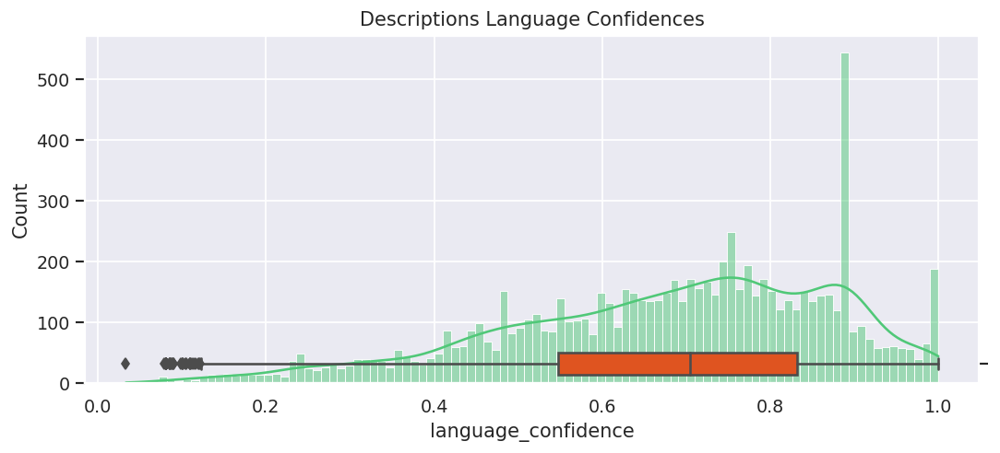

In [12]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.histplot(x=dataset.language_confidence, bins=100, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(x=dataset.language_confidence, color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Descriptions Language Confidences')
plt.show()

In [13]:
# check some predictions with less confidence
dataset[(dataset.language != 'en') & (dataset.language_confidence < 0.6)][['merged_description', 'language', 'language_confidence']]

,merged_description,language,language_confidence
2,ca nt log vpn,da,0.132258
4,skype error,ja,0.081046
12,unable login hr tool sgxqsuojr xwbesorf card,zh,0.104415
14,unable open payslip,fr,0.264625
20,unable check payslip,fr,0.172341
...,...,...,...
8396,security error reisekosten abrechnung programdnty,de,0.254021
8413,langsamer rechner uberprufung niptbwdq,de,0.437996
8416,bluetooth keybankrd defekt dardabthyr,sv,0.245299
8426,new able login system user vvrtgwildj name joh...,de,0.548117


In [14]:
# check some predictions with less confidence
dataset[(dataset.language != 'en') & (dataset.language_confidence > 0.6)][['merged_description', 'language', 'language_confidence']]

,merged_description,language,language_confidence
223,probleme bluescreen hallo es ist erneut passie...,de,0.997537
251,reset password bitte passwort fr mail zurckset...,de,0.870327
255,probleme mit laufwerk laeusvjo,de,0.992616
265,hallo netweaver funktioniert nicht mehr bzw ka...,de,0.999658
270,neues passwort fur accountname tgryhu hgygrtui...,de,0.992012
...,...,...,...
8424,kann setzten ich wei mein erp passwort nicht m...,de,0.998999
8438,fur die up lapel druckt nicht richtig der druc...,de,0.999573
8466,send friday nwfodmhc exurcwkm subject wg die...,de,0.969530
8470,"电脑开机开不出来 to 小贺,早上电脑开机开不出来",zh,0.924405


* We can clearly see that low confidence predictions are not right actually foreign-language but interpreted as such because of out of dictionary words and caller names present in the text. So, we overwrite predictions with confidence less than 0.6 back to english

In [15]:
dataset.loc[(dataset.language != 'en') & (dataset.language_confidence < 0.6), 'language'] = 'en'

In [16]:
dataset[(dataset.language != 'en') & (dataset.language_confidence < 0.6)]  # overwritten

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length,merged_description,language,language_confidence


In [17]:
dataset.language.value_counts()

en    7962
de     484
zh      32
pt       8
fr       3
es       2
tl       2
fi       2
ca       2
pl       1
it       1
Name: language, dtype: int64

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Translation using txtai pipelines which use <a href="https://huggingface.co/models?search=Helsinki-NLP%2Fopus-mt">hugging-face language translation models</a> as backend</span></strong>
</ul></h3>

In [18]:
# Install `txtai` and all dependencies. Since this notebook is using optional pipelines
# we need to install the pipeline extras package.

# !pip -q install git+https://github.com/neuml/txtai#egg=txtai[pipeline]

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 8.4 MB 5.1 MB/s 
     |████████████████████████████████| 2.9 MB 56.6 MB/s 
     |████████████████████████████████| 4.8 MB 42.9 MB/s 
     |████████████████████████████████| 1.5 MB 52.2 MB/s 
     |████████████████████████████████| 12.3 MB 42.6 MB/s 
     |████████████████████████████████| 1.2 MB 53.2 MB/s 
     |████████████████████████████████| 3.3 MB 40.7 MB/s 
     |████████████████████████████████| 52 kB 1.2 MB/s 
     |████████████████████████████████| 895 kB 58.6 MB/s 
     |████████████████████████████████| 636 kB 67.9 MB/s 


In [19]:
# The pipeline has logic to detect the input language,
# load the relevant model that handles translating from source to # target language and return results.
# The translation pipeline also has built-in logic to handle splitting large text
# blocks into smaller sections the models can handle.


from txtai.pipeline import Translation

# Create translation model
translate = Translation()

In [20]:
# The translation quality overall is very high
# Machine translation has made giant leaps and strides the last couple of years
# These models are a solid alternative to cloud translation services if translating on local servers is preferred.

translation = translate("Bonjour, Ca va?", "en")

Downloading:   0%|          | 0.00/916k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.26k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/287M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/784k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/760k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.28M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

In [21]:
translation

'Hello, are you okay?'

In [22]:
def translate_foreign_langauges(row):
    original_descr = row.merged_description
    translated_descr = original_descr
    if row.language != 'en':
        if len(original_descr) > 512:
            # pre-trained models only support sequences of length < 512
            orinal_descr = original_descr[:512]
        translation = translate(original_descr, "en")
        if len(translation) > 0:
            translated_descr = translation

    row['translated_description'] = str(translated_descr.strip())
    return row

In [23]:
translated_dataset = dataset.progress_apply(translate_foreign_langauges, axis=1)

  1%|▏         | 107/8499 [00:00<00:07, 1061.97it/s]

Downloading:   0%|          | 0.00/1.11k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/284M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/778k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/750k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.21M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

 12%|█▏        | 1061/8499 [01:31<38:19,  3.23it/s]

Downloading:   0%|          | 0.00/1.12k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/298M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/786k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/788k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.54M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/44.0 [00:00<?, ?B/s]

 14%|█▍        | 1180/8499 [02:12<1:23:43,  1.46it/s]

Downloading:   0%|          | 0.00/1.11k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/328M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/795k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/771k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.26M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

 19%|█▉        | 1610/8499 [02:58<11:20, 10.13it/s]

Downloading:   0%|          | 0.00/1.11k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/279M [00:00<?, ?B/s]

 19%|█▉        | 1618/8499 [03:10<11:19, 10.13it/s]

Downloading:   0%|          | 0.00/796k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/784k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.20M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

 20%|██        | 1713/8499 [03:42<25:01,  4.52it/s]

Downloading:   0%|          | 0.00/1.12k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/287M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/812k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/771k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.31M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/44.0 [00:00<?, ?B/s]

 37%|███▋      | 3138/8499 [05:59<07:28, 11.95it/s]

Downloading:   0%|          | 0.00/1.12k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/296M [00:00<?, ?B/s]

 37%|███▋      | 3162/8499 [06:10<07:26, 11.95it/s]

Downloading:   0%|          | 0.00/690k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/773k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/44.0 [00:00<?, ?B/s]

 40%|███▉      | 3378/8499 [06:31<04:10, 20.40it/s]

Downloading:   0%|          | 0.00/1.16k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/298M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/807k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/783k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.52M [00:00<?, ?B/s]

 40%|███▉      | 3382/8499 [06:45<04:10, 20.40it/s]

Downloading:   0%|          | 0.00/44.0 [00:00<?, ?B/s]

 48%|████▊     | 4041/8499 [08:00<08:56,  8.32it/s]

Downloading:   0%|          | 0.00/1.11k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/295M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/815k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/767k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.45M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

 73%|███████▎  | 6181/8499 [12:51<01:34, 24.62it/s]

Downloading:   0%|          | 0.00/1.12k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/282M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/814k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/806k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.26M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/44.0 [00:00<?, ?B/s]

 82%|████████▏ | 6948/8499 [15:00<00:42, 36.59it/s]

Downloading:   0%|          | 0.00/1.11k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/286M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/800k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/787k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

 89%|████████▉ | 7575/8499 [16:23<03:01,  5.08it/s]

Downloading:   0%|          | 0.00/1.11k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/289M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/764k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/783k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.43M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

100%|██████████| 8499/8499 [18:34<00:00,  7.62it/s]


In [24]:
# sample translations
translated_dataset[translated_dataset.language == 'de'].sample(20)[['merged_description', 'translated_description']]

,merged_description,translated_description
4397,block necessary unlock user ghjvreicj immediat...,block necessary unlock user ghjvreicj indirect...
1175,hallo zusammen bitte das iphone freischalten...,hello together please unlock the iphone for ma...
463,telefon gigaset m ex professional tel lad nich...,phone gigaset m ex professional tel lad no lon...
223,probleme bluescreen hallo es ist erneut passie...,problems bluescreen hello it has happened agai...
2959,ordnerfreigabe fur kvp und ce leiter,folder sharing for kvp and ce ladder
4694,guten morgen bitte die schreib leseberechtigun...,good morning please set up the write read perm...
6339,probleme mit erpgui vsdtxwry,problems with erpgui vsdtxwry
3445,anmeldung bei account helftgyldt nicht moglich...,registration with account helpgyldt not possib...
1283,keine datenubertragung erp datenbank tintenstr...,no data transfer erp database inkjet printer i...
2927,probleme mit ie niptbwdq,problems with ie niptbwdq


In [25]:
# sample translations
translated_dataset[translated_dataset.language == 'zh'].sample(20)[['merged_description', 'translated_description']]

,merged_description,translated_description
1953,笔记本重新装下系统 把我的笔记本重新装下系统,"The notebooks reset the system, and my noteboo..."
6534,"网络不通 网络不通,右下角网络图标显示未连接到网络。",The network does not work. The network icon at...
1711,"开机黑屏 电脑启动后黑屏,主机无报警",Turn on the black screen. When the computer's ...
7316,"电脑故障 质控部拉力试验机控制电脑的操作系统启动非常缓慢,控制软件丢失。",Computer failure. Quality Control's pull-contr...
1701,"输入用户名和密码后显示出错 登录时输入用户名和密码后,显示用户名和密码错误",Error after entering username and password Aft...
5310,"系统故障,启动蓝屏. 系统故障,启动蓝屏.","System failure, blue screen activated, blue sc..."
3136,"邮箱无法启动 邮箱无法启动,提示无法创新新的堆栈防护页面。",Mailbox could not be started. Mailbox could no...
3314,电脑系统启动蓝屏。 电脑系统启动蓝屏。水不小心洒到电脑里面。,Computer systems start blue screens. Computer ...
1700,"账户被锁定 用户忘记密码,导致账户锁定",The account was locked. The user forgot the pa...
5760,"主机不能开启 主机不能开启,电源灯正常,主机面板1、3指示灯常亮",Hosts can't turn on. Hosts can't turn on. Powe...


In [26]:
translated_dataset.to_excel('./data/clean_data_tranlsated.xlsx')

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Keyword Extraction</span></strong></li>
</ul></h1>

In [1]:
import yake
import pandas as pd

dataset = pd.read_excel('./data/clean_data_tranlsated.xlsx')

In [2]:
language = "en"
max_ngram_size = 5
duplication_threshold = 0.9
numOfKeywords = 1

custom_kw_extractor = yake.KeywordExtractor(lan=language,
                                            n=max_ngram_size,
                                            dedupLim=duplication_threshold,
                                            top=numOfKeywords,
                                            features=None)

In [3]:
def get_keywords(row):
    '''Keyword extraction on Keywords and Short Keywords'''
    description_keywords = custom_kw_extractor.extract_keywords(row.translated_description)
    if len(description_keywords) == 0:
        description_keywords = ''
    elif len(description_keywords) == 1:
        description_keywords = description_keywords[0][0]
    else:
        description_keywords = ' '.join([i[0] for i in description_keywords])
        # print(row)
    row['keywords'] = description_keywords

    return row

dataset = dataset.apply(get_keywords, axis=1)

In [4]:
dataset.sample(20)

,Unnamed: 0,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,...,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length,merged_description,language,language_confidence,translated_description,keywords
235,235,erp SID_34 account unlock and password reset,erp SID_34 account unlock and password reset,jfsmwpny klxsdqiw,GRP_0,44,7,44,7,0,...,erp sid account unlock password reset,38,6,38,6,erp sid account unlock password reset,en,0.606594,erp sid account unlock password reset,erp sid account unlock password
4372,4372,job SID_37hotf failed in job_scheduler at: 09/...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_5,106,11,64,8,45,...,job sid hotf fail job scheduler,31,6,31,6,job sid hotf fail job scheduler,en,0.745099,job sid hotf fail job scheduler,sid hotf fail job scheduler
2968,2968,setup new ws \zlnfpuam aktplhre,setup new ws \zlnfpuam aktplhre,zlnfpuam aktplhre,GRP_24,31,5,31,5,17,...,setup new ws zlnfpuam,21,4,21,4,setup new ws zlnfpuam,en,0.321603,setup new ws zlnfpuam,setup new ws zlnfpuam
5721,5721,please switch of tr telephony_software today f...,this is last call meeting that was set up by f...,djpwfxzt cfkwxlmq,GRP_7,225,45,68,11,67,...,switch tr telephony software today cet,102,17,42,6,switch tr telephony software today cet ts ...,en,0.728534,switch tr telephony software today cet ts ...,call meeting set fhtyulvio participate
33,33,ess password reset,ess password reset,fsqwkbez eudsantq,GRP_0,18,3,18,3,0,...,ess password reset,18,3,18,3,ess password reset,en,0.433673,ess password reset,ess password reset
5775,5775,can you tell me the phone number for office 44...,\n\nreceived from: azxhejvq.fyemlavd@gmail.com...,azxhejvq fyemlavd,GRP_0,127,12,64,14,0,...,tell phone number office usx tower,60,7,35,6,tell phone number office usx tower mikhghytr ...,en,0.454968,tell phone number office usx tower mikhghytr ...,phone number office usx tower
2586,2586,job Job_3049 failed in job_scheduler at: 10/02...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_8,104,11,62,8,72,...,job job fail job scheduler,27,5,27,5,job job fail job scheduler,en,0.893109,job job fail job scheduler,job job fail job scheduler
1081,1081,用友软件问题,"打开已关闭的销售订单时,显示""不能在手动或分布事物方式下创建新的链接""",bwstnmjh yqumwrsk,GRP_48,35,1,6,1,43,...,NaN,0,0,0,0,"用友软件问题 打开已关闭的销售订单时,显示""不能在手动或分布事物方式下创建新的链接""",zh,0.974744,When opening closed sales orders with a friend...,opening closed sales orders
1850,1850,reset passwords for fylrosuk kedgmiul using pa...,reset passwords for fylrosuk kedgmiul using pa...,fylrosuk kedgmiul,GRP_17,84,9,84,9,9,...,reset password use password management tool pa...,58,8,58,8,reset password use password management tool pa...,en,0.595499,reset password use password management tool pa...,password management tool password reset
4777,4777,job Job_1148 failed in job_scheduler at: 09/11...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_9,104,11,62,8,73,...,job job fail job scheduler,27,5,27,5,job job fail job scheduler,en,0.893109,job job fail job scheduler,job job fail job scheduler


In [5]:
dataset.columns

Index(['Unnamed: 0', 'short_description', 'description', 'caller', 'group',
       'char_length', 'word_length', 'short_char_length', 'short_word_length',
       'group_code', 'char_length_bins', 'cleaned_description',
       'cleaned_short_description', 'cleaned_char_length',
       'cleaned_word_length', 'cleaned_short_char_length',
       'cleaned_short_word_length', 'merged_description', 'language',
       'language_confidence', 'translated_description', 'keywords'],
      dtype='object')

In [6]:
cols = ['translated_description', 'keywords',
       'short_description', 'description', 'group',
       'cleaned_description', 'cleaned_short_description', 'merged_description',
       'char_length', 'word_length', 'short_char_length', 'short_word_length',
       'language', 'language_confidence',]

In [7]:
dataset.to_csv('./data/preprocessed_data.csv', index=None, columns=cols)
dataset.to_excel('./data/preprocessed_data.xlsx', index=None, columns=cols)

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Model Building</span></strong></li>
</ul></h1>

<h4>
<ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">OBJECTIVE:</span></strong></li>
</ul>
<p><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use the text data to build simple feed-forward Neural Nets using existing classes as target</span></p>
    </h4>

In [1]:
# imports

import os
import math
import random
import warnings
from time import time
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import defaultdict, Counter
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud, STOPWORDS
import tensorflow

tqdm.pandas()
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

C:\Users\surya\anaconda3\envs\full\lib\site-packages\tqdm\std.py:697: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [2]:
# reproducibility
seed = 7
random.seed(seed)
tensorflow.random.set_seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import & Analyse the data.</span></strong></li>
</ul></h3>

In [3]:
dataset = pd.read_excel('./data/preprocessed_data.xlsx')
dataset.sample(10)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
1867,set abc code erp 81807016 under me in crm.,set abc code erp 81807016 under me in crm. in ...,srhoeyza rkhuldgq,GRP_40,56,13,43,9,set abc code erp,set abc code erp,35,7,set abc code erp 81807016 crm erp ok,set abc code erp 81807016 crm,36,8,29,6
3587,vip 1: please add me to the allowed sender lis...,please add me to the allowed sender list for t...,hkrecpfv kgwpbexv,GRP_26,66,13,73,15,usx team members,usx team members,19,8,add allow sender list usx team member,vip 1 add allow sender list usx team member,37,7,43,9
6957,business_client SID_1 search_server not working,"hi, i can find documents in engineering tool S...",aqourvgz mkehgcdu,GRP_14,238,39,47,5,documents in engineering tool SID,client SID,6,25,find document engineer tool sid 1 business cli...,business client sid 1 search server work,154,24,40,7
4623,no response from other side.,no response from other side.,efbwiadp dicafxhv,GRP_0,28,5,28,5,response from other side,response from other side,0,2,response side,response side,13,2,13,2
5862,wireless outage again-taiwan 0830,\n\nreceived from: ticqvhal.vgokzesi@gmail.com...,ticqvhal vgokzesi,GRP_4,110,10,33,4,outage of taiwan,wireless outage again-taiwan,34,14,wireless companysecure outage taiwan help,wireless outage taiwan 0830,41,5,27,4
3595,computer crashed after a reboot,computer crashed after a reboot,zstkagwu jlyrhdcf,GRP_0,31,5,31,5,computer crashed after a reboot,computer crashed after a reboot,0,3,computer crash reboot,computer crash reboot,21,3,21,3
2439,summary:when i run wip list and try to do my r...,summary:when i run wip list and try to do my r...,gdpxqyhj iapghvke,GRP_0,111,22,111,22,table field name not valid,table field name not valid,0,13,summary run wip list try report get run time e...,summary run wip list try report get run time e...,84,16,84,16
3892,user unable tologin to vpn.,name:lizhwdoe mjudivse\nlanguage:\nbrowser:mic...,lizhwdoe mjudivse,GRP_0,160,15,28,5,microsoft internet explorer email,user unable tologin to vpn,0,17,ca t login vpn,user unable tologin vpn,14,4,23,4
676,account unlock,account unlock,eboutzmn umzvbkfh,GRP_0,14,2,14,2,account unlock,account unlock,0,0,account unlock,account unlock,14,2,14,2
2096,need access to folder,\n\nreceived from: umdyvbxo.qwzstijr@gmail.com...,umdyvbxo qwzstijr,GRP_12,113,15,22,4,drive of usa,access to folder,4,14,need access quality folder lan d2 drive usa,need access folder,43,8,18,3


In [4]:
dataset.isna().sum()

short_description              0
description                    0
caller                         0
group                          0
char_length                    0
word_length                    0
short_char_length              0
short_word_length              0
description_keywords           7
short_description_keywords    38
group_code                     0
char_length_bins               0
cleaned_description            0
cleaned_short_description      0
cleaned_char_length            0
cleaned_word_length            0
cleaned_short_char_length      0
cleaned_short_word_length      0
dtype: int64

In [5]:
dataset[dataset.isna().any(axis=1)].to_csv('./data/missing_keywords.csv')
dataset[dataset.isna().any(axis=1)]  # check rows with missing values

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
483,: k-bngell-cgdaytshqsd <k-bngell-cgdaytshqsd@c...,\n\nreceived from: lvxakohq.tsfnhowj@gmail.com...,lvxakohq tsfnhowj,GRP_19,210,33,69,3,rao left company. with kind,NaN,11,22,pl add name ts team also need administrative c...,k bngell cgdaytshqsd,107,19,20,3
708,id 04637,id 04637 printer have paper stuck up issue.,ongumpdz pjkrfmbc,GRP_19,43,8,8,2,printer have paper stuck,NaN,11,5,04637 printer paper stick issue,04637,31,5,5,1
755,pc name,\n\nreceived from: koahsriq.wdugqatr@gmail.com...,koahsriq wdugqatr,GRP_28,323,37,7,2,service tag,NaN,21,33,need new pc name service tag pc fy80nkssc2 u04...,pc name,220,36,7,2
1114,id : 1064870825,id : 2175981936\n\nperson on other side discon...,efbwiadp dicafxhv,GRP_0,51,8,15,3,person on other side disconnected,NaN,0,6,2175981936 person side disconnect,1064870825,33,4,10,1
1294,"dn 9169508476,t/o 642392",\n\nreceived from: gjtyswkb.dpvaymxr@gmail.com...,gjtyswkb dpvaymxr,GRP_6,129,19,24,3,received,NaN,56,15,dear chk dn 9169508476 help check urgent,dn 9169508476 642392,40,7,20,3
1331,"apac, company: multiple switches went down at ...",company-ap-chn-apac-company-fpsf-2960s-access-...,mnlazfsr mtqrkhnx,GRP_8,150,3,68,12,NaN,apac,72,17,company ap chn apac company fpsf 2960s access ...,apac company multiple switch go 07 36 pm et,150,27,43,9
1641,need help,\n\nreceived from: axcbfuqo.yiagubvh@gmail.com...,axcbfuqo yiagubvh,GRP_0,376,65,9,2,good morning,NaN,0,35,trouble password change password possibility c...,need help,188,26,9,2
1823,bgflmyar.xgufkidq@gmail.com wanted to check if...,bgflmyar.xgufkidq@gmail.com wanted to check if...,olckhmvx pcqobjnd,GRP_0,83,13,83,13,tool on his phone,NaN,0,10,want check login hr tool phone,want check login hr tool phone,30,6,30,6
2396,need your help!!,\n\nreceived from: ezwcpqrh.bnwqaglk@gmail.com...,ezwcpqrh bnwqaglk,GRP_0,571,93,17,3,emal thru the web mail,NaN,0,44,desk send ts emal thru web mail open ms office...,need help,304,49,9,2
2436,changes in ad,"hi, there,\nmy reporting line in the outlook o...",ywbnzxud qzwrynux,GRP_2,246,44,13,3,outlook organization system is wrong,NaN,12,25,report line outlook organization system wrong ...,change ad,139,20,9,2


In [6]:
le = LabelEncoder()
dataset['group_code'] = le.fit_transform(dataset.group)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8432 entries, 0 to 8431
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   short_description           8432 non-null   object
 1   description                 8432 non-null   object
 2   caller                      8432 non-null   object
 3   group                       8432 non-null   object
 4   char_length                 8432 non-null   int64 
 5   word_length                 8432 non-null   int64 
 6   short_char_length           8432 non-null   int64 
 7   short_word_length           8432 non-null   int64 
 8   description_keywords        8425 non-null   object
 9   short_description_keywords  8394 non-null   object
 10  group_code                  8432 non-null   int32 
 11  char_length_bins            8432 non-null   int64 
 12  cleaned_description         8432 non-null   object
 13  cleaned_short_description   8432 non-null   obje

In [7]:
le.classes_

array(['GRP_0', 'GRP_1', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_3', 'GRP_30',
       'GRP_31', 'GRP_32', 'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36',
       'GRP_37', 'GRP_38', 'GRP_39', 'GRP_4', 'GRP_40', 'GRP_41',
       'GRP_42', 'GRP_43', 'GRP_44', 'GRP_45', 'GRP_46', 'GRP_47',
       'GRP_48', 'GRP_49', 'GRP_5', 'GRP_50', 'GRP_51', 'GRP_52',
       'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56', 'GRP_57', 'GRP_58',
       'GRP_59', 'GRP_6', 'GRP_60', 'GRP_61', 'GRP_62', 'GRP_63',
       'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67', 'GRP_68', 'GRP_69',
       'GRP_7', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73', 'GRP_8', 'GRP_9'],
      dtype=object)

In [8]:
def merge_descriptions(row):
    merged_descr = np.nan
    if (row.cleaned_short_description == row.cleaned_description or 
        str(row.description).startswith(str(row.cleaned_short_description))):
        merged_descr = str(row.cleaned_description)
    else:
        merged_descr = str(row.cleaned_short_description) + " " + str(row.cleaned_description)
    row['merged_description'] = str(merged_descr)
    return row

dataset = dataset.progress_apply(merge_descriptions, axis=1)

100%|██████████████████████████████████████████████████████████████████████████| 8432/8432 [00:08<00:00, 975.45it/s]


In [9]:
dataset[['cleaned_short_description', 'cleaned_description', 'merged_description']].sample(10)

,cleaned_short_description,cleaned_description,merged_description
2192,kein datenabgleich zwischen eu tool und erp ge...,kein datenabgleich zwischen eu tool und erp ge...,kein datenabgleich zwischen eu tool und erp ge...
3095,business client work,unable access business client open business cl...,business client work unable access business cl...
458,job job 593 fail job scheduler 05 07 00,job job 593 fail job scheduler 05 07 00,job job 593 fail job scheduler 05 07 00
693,hostname 1325 drive flasng yellow message disp...,check hostname 1325 shop floor app server driv...,hostname 1325 drive flasng yellow message disp...
5953,login help hub,login help hub,login help hub
2405,prognose crm forecast plan dashbankrd work res...,dear one user affect get sale rep indicate ca ...,prognose crm forecast plan dashbankrd work res...
4868,job job 2555 fail job scheduler 22 00 00,job job 2555 fail job scheduler 22 00 00,job job 2555 fail job scheduler 22 00 00
745,reinstall hardcopy und eu tool lndypaqg,reinstall hardcopy und eu tool lndypaqg,reinstall hardcopy und eu tool lndypaqg
488,login issue,login issue verify user detail name check user...,login issue verify user detail name check user...
6663,probleme mit vpn client,hallo meine herren ich kann unsere vpn nicht b...,probleme mit vpn client hallo meine herren ich...


In [10]:
X = np.array(dataset.merged_description)
y = np.array(dataset.group_code)
X.shape, y.shape

((8432,), (8432,))

In [11]:
from tensorflow.keras.utils import to_categorical
y_dummy_coded = to_categorical(y)
y[0], y_dummy_coded[0]

(0,
 array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.], dtype=float32))

In [12]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y_dummy_coded, test_size=.2, random_state=seed)  # splits are stratified by y

In [13]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((6745,), (1687,), (6745, 74), (1687, 74))

In [14]:
X_train[0], y_train[0]  # check sample

('additional correction sale org 1278 company address phone number require germany move 1 sale organisation address 1278 phone number fax number need reverse original phone fax number furth 0911 2 plant address plant 124 phone fax number need adjusted show germany central phone number fax 3 company code address 5278 need revert back address furth germany detail attach ticket',
 array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.], dtype=float32))

In [15]:
# TODO: Check the distributions of groups in training and testing sets, i.e, if they vary too much
# stratify by y if required during splits
# or data augmentation to upsample minority classes to balance the group distributions

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Tokenize and pad sequences</span></strong></li>
</ul></h3>

In [16]:
# define params
NUM_WORDS = 20000
EMBEDDING_DIM = 300
MAX_LEN = 100 # dataset['word_length'].max()
MAX_LEN

100

In [17]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


tokenizer = Tokenizer(num_words=NUM_WORDS)
tokenizer.fit_on_texts(X_train)
X_train_tokens = tokenizer.texts_to_sequences(X_train)
X_test_tokens = tokenizer.texts_to_sequences(X_test)
X_train_tokens[0], X_test_tokens[0]

([184,
  2093,
  93,
  606,
  1609,
  10,
  148,
  45,
  116,
  169,
  146,
  375,
  15,
  93,
  6817,
  148,
  1609,
  45,
  116,
  1513,
  116,
  23,
  1729,
  674,
  45,
  1513,
  116,
  804,
  6818,
  30,
  75,
  148,
  75,
  2370,
  45,
  1513,
  116,
  23,
  4267,
  90,
  146,
  3354,
  45,
  116,
  1513,
  73,
  10,
  188,
  148,
  6819,
  23,
  1195,
  174,
  148,
  804,
  146,
  117,
  88,
  17],
 [93, 2095, 280, 1029, 783, 355, 9, 2095, 1029, 1360, 2095, 211, 280])

In [18]:
y_train[0], y_test[0]

(array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.], dtype=float32))

In [19]:
# pad sequences to cut longer texts to a uniform length and pad the sentences that are shorter than that with <PAD> token

# using just 20 words from each headline will severely limit the information that is 
# available to the model and affect performance although the training will be faster
X_train_padded = pad_sequences(X_train_tokens,
                               padding='post',
                               truncating='post',
                               maxlen=MAX_LEN)
X_test_padded = pad_sequences(X_test_tokens,
                              padding='post',
                              truncating='post',
                              maxlen=MAX_LEN)


print(f'X train:  {X_train_padded.shape}\nX test:   {X_test_padded.shape}')

X train:  (6745, 100)
X test:   (1687, 100)


In [20]:
pprint(X_train_padded[0], compact=True)

array([ 184, 2093,   93,  606, 1609,   10,  148,   45,  116,  169,  146,
        375,   15,   93, 6817,  148, 1609,   45,  116, 1513,  116,   23,
       1729,  674,   45, 1513,  116,  804, 6818,   30,   75,  148,   75,
       2370,   45, 1513,  116,   23, 4267,   90,  146, 3354,   45,  116,
       1513,   73,   10,  188,  148, 6819,   23, 1195,  174,  148,  804,
        146,  117,   88,   17,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0])


In [21]:
WORD_TO_INDEX = tokenizer.word_index
# pprint(WORD_TO_INDEX, compact=True)
pprint(list(WORD_TO_INDEX.keys())[:100], compact=True)

['job', 'yes', 'na', 'password', 'erp', 'tool', 'user', 'ts', 'issue',
 'company', 'sid', 'reset', 'access', 'scheduler', '1', '00', 'ticket',
 'unable', 'work', 'error', 'fail', 'account', 'need', 'email', 'site', 'help',
 'system', 'hostname', 'get', '2', 'login', 'circuit', 'power', 'outlook',
 'network', 'use', 'vendor', 'change', '34', 'update', 'name', 'message',
 'backup', 'see', 'phone', 'telecom', 'server', 'try', '10', 'able', 'outage',
 'log', 'check', 'new', 'problem', 'start', 'crm', 'engineering', 'request',
 'connect', 'call', 'usa', 'type', 'time', 'printer', 'order', 'report', 'vpn',
 'team', 'open', 'contact', 'skype', '3', 'lock', 'plant', 'et', 't', 'send',
 'create', '4', '5', 'window', 'file', 'pc', 'since', 'print', 'schedule',
 'attach', 'device', 'show', '8', 'maintenance', 'sale', '11', '12', 'receive',
 'abende', 'notify', '23', 'management']


In [22]:
VOCAB_SIZE = len(WORD_TO_INDEX) + 1
VOCAB_SIZE

13790

In [23]:
# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/sequence/pad_sequences
def retrieve_description_feat(x, mapping=WORD_TO_INDEX) -> str:
    # increment 3 
    mapping = {k:(v + 3) for k, v in mapping.items()}
    mapping['<PAD>'] = 0
    mapping['<START>'] = 1
    mapping['<UNK>'] = 2
    inv_mapping = {v: k for k, v in mapping.items()}
    return str(" ".join(inv_mapping.get(i, '<NA>') for i in x))

retrieve_description_feat(X_test_padded[7])

'1 22 team response complaint synchronize <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">GloVe Embeddings</span></strong></li>
</ul></h3>

In [24]:
EMBEDDING_DIM

300

In [25]:
def get_embedding_matrix(embedding_dim=EMBEDDING_DIM):
    embeddings = defaultdict()
    if embedding_dim == 200:
        file_path = f'./data/glove.6B.{embedding_dim}d.txt'
    elif embedding_dim == 300:
        file_path = f'./data/glove.840B.{embedding_dim}d.txt'
    for l in open(file_path, encoding='utf-8'):
        word = l.split(" ")[0]
        embeddings[word] = np.asarray(l.split(" ")[1:], dtype='float32')

    embeddings = dict(embeddings)

    # create a weight matrix for words in training docs
    embedding_matrix = np.zeros((NUM_WORDS, embedding_dim))

    for word, idx in WORD_TO_INDEX.items():
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            embedding_matrix[idx] = embedding_vector

    return embedding_matrix

In [26]:
# use pre-trained glove embedding matrix to initialize weights in our model
embedding_matrix = get_embedding_matrix()
embedding_matrix.shape

(20000, 300)

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net</span></strong></li>
</ul></h4>

In [27]:
# !pip install livelossplot
from tensorflow.python.keras.models import Sequential
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.regularizers import l2
from tensorflow.keras.constraints import max_norm, unit_norm
from tensorflow.python.keras.callbacks import LambdaCallback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Flatten, Dense, Activation, BatchNormalization, Dropout, Embedding, LSTM, MaxPooling1D, Conv1D, Bidirectional

In [28]:
NUM_CLASSES = len(le.classes_)
VOCAB_SIZE, MAX_LEN, EMBEDDING_DIM, NUM_CLASSES

(13790, 100, 300, 74)

In [29]:
# define model

model1 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(1024, activation = 'relu'),
    Dense(1024, activation = 'relu'),
    Dense(128, activation = 'relu'),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model1.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [30]:
# Define Callbacks and a few helper functions

# simplify the training log
simple_log = LambdaCallback(
    on_epoch_end = lambda e, l: print(f" ~| Epoch: {e+1} | Validation Loss: {l['val_loss']:.5f}", end =" >|> \n" ))

# early stopping
early_stop = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=7,
                              verbose=0, 
                              restore_best_weights=True)

# learning rate reduction
lr_reduce_on_plateau = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=4, 
                                            verbose=1, 
                                            factor=0.4,
                                            min_lr=0.00001)

def plot_learning_curve(hist):
    sns.set()
    plt.figure(figsize=(5,5))
    train = hist.history['loss']
    val = hist.history['val_loss']
    epochs_run = range(1,len(train) + 1)
    sns.lineplot(epochs_run, train, marker = 'o', color = 'coral', label = 'Training Loss')
    sns.lineplot(epochs_run, val,  marker = '>', color = 'green', label = 'Validation Loss')
    plt.title("Loss vs. Epochs", fontsize = 20)
    plt.legend()
    plt.show()

In [31]:
X_train[0]

'additional correction sale org 1278 company address phone number require germany move 1 sale organisation address 1278 phone number fax number need reverse original phone fax number furth 0911 2 plant address plant 124 phone fax number need adjusted show germany central phone number fax 3 company code address 5278 need revert back address furth germany detail attach ticket'

In [32]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((6745,), (6745, 74), (1687,), (1687, 74))

In [33]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("\nTraining on CPU:")
    h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 1.85944 >|> 
 ~| Epoch: 2 | Validation Loss: 1.74150 >|> 
 ~| Epoch: 3 | Validation Loss: 1.72742 >|> 
 ~| Epoch: 4 | Validation Loss: 2.12246 >|> 
 ~| Epoch: 5 | Validation Loss: 2.14895 >|> 
 ~| Epoch: 6 | Validation Loss: 2.37142 >|> 
 ~| Epoch: 7 | Validation Loss: 2.50962 >|> 

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 8 | Validation Loss: 2.61027 >|> 
 ~| Epoch: 9 | Validation Loss: 2.71168 >|> 
 ~| Epoch: 10 | Validation Loss: 2.77748 >|> 

Training Done.


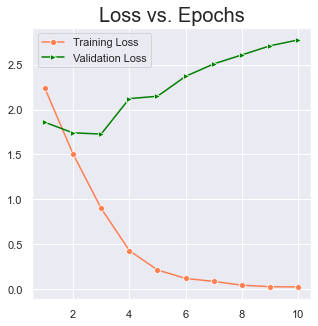

In [34]:
plot_learning_curve(h1)

In [35]:
loss, acc = model1.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 8ms/step - loss: 1.8063 - accuracy: 0.6040
Testing Loss:  180.633807182312
Testing Accuracy:  60.40308475494385


<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>This model is clearly overfitting, we will add regularization to the next iteration
 </span></ul></h4>

In [36]:
# define model

model2 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model2.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [37]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 2.59394 >|> 
 ~| Epoch: 2 | Validation Loss: 1.94380 >|> 
 ~| Epoch: 3 | Validation Loss: 1.84034 >|> 
 ~| Epoch: 4 | Validation Loss: 1.80988 >|> 
 ~| Epoch: 5 | Validation Loss: 1.82323 >|> 
 ~| Epoch: 6 | Validation Loss: 1.83685 >|> 
 ~| Epoch: 7 | Validation Loss: 1.91414 >|> 
 ~| Epoch: 8 | Validation Loss: 2.04519 >|> 

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 9 | Validation Loss: 1.89107 >|> 
 ~| Epoch: 10 | Validation Loss: 1.95908 >|> 
 ~| Epoch: 11 | Validation Loss: 1.95138 >|> 

Training Done.


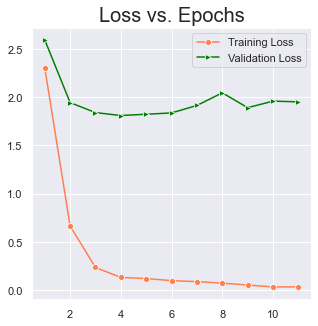

In [38]:
plot_learning_curve(h2)

In [39]:
loss, acc = model2.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 5ms/step - loss: 1.8225 - accuracy: 0.6343
Testing Loss:  182.25327730178833
Testing Accuracy:  63.42620253562927


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Add Dropout Layer</span></strong></li>
</ul></h4>

In [40]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(20, activation = 'relu'),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [41]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 2.05753 >|> 
 ~| Epoch: 2 | Validation Loss: 1.84023 >|> 
 ~| Epoch: 3 | Validation Loss: 1.74239 >|> 
 ~| Epoch: 4 | Validation Loss: 1.70713 >|> 
 ~| Epoch: 5 | Validation Loss: 1.64135 >|> 
 ~| Epoch: 6 | Validation Loss: 1.68905 >|> 
 ~| Epoch: 7 | Validation Loss: 1.67758 >|> 
 ~| Epoch: 8 | Validation Loss: 1.76820 >|> 
 ~| Epoch: 9 | Validation Loss: 1.92260 >|> 

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 10 | Validation Loss: 1.89466 >|> 
 ~| Epoch: 11 | Validation Loss: 1.96651 >|> 
 ~| Epoch: 12 | Validation Loss: 1.99445 >|> 

Training Done.


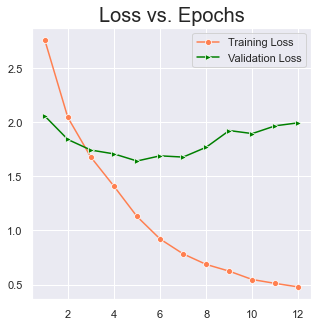

In [42]:
plot_learning_curve(h3)

In [43]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 7ms/step - loss: 1.6926 - accuracy: 0.6473
Testing Accuracy:  64.73029255867004


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use pre-trained embeddings</span></strong></li>
</ul></h4>

In [44]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=NUM_WORDS, output_dim=EMBEDDING_DIM, input_length=MAX_LEN, weights=[embedding_matrix], trainable=True),
    Flatten(),
    Dense(30, activation = 'relu'),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [45]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 1.84620 >|> 
 ~| Epoch: 2 | Validation Loss: 1.72238 >|> 
 ~| Epoch: 3 | Validation Loss: 1.64293 >|> 
 ~| Epoch: 4 | Validation Loss: 1.67915 >|> 
 ~| Epoch: 5 | Validation Loss: 1.67839 >|> 
 ~| Epoch: 6 | Validation Loss: 1.78722 >|> 
 ~| Epoch: 7 | Validation Loss: 1.82795 >|> 

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 8 | Validation Loss: 1.88995 >|> 
 ~| Epoch: 9 | Validation Loss: 1.95935 >|> 
 ~| Epoch: 10 | Validation Loss: 2.01581 >|> 

Training Done.


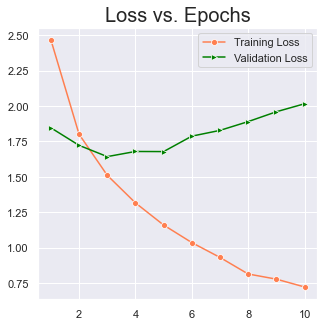

In [46]:
plot_learning_curve(h3)

In [47]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 7ms/step - loss: 1.7662 - accuracy: 0.6153
Testing Accuracy:  61.52934432029724


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">LSTM</span></strong></li>
</ul></h4>

In [48]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    LSTM(32),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [49]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 2.50286 >|> 
 ~| Epoch: 2 | Validation Loss: 2.47478 >|> 
 ~| Epoch: 3 | Validation Loss: 2.46620 >|> 
 ~| Epoch: 4 | Validation Loss: 2.46253 >|> 
 ~| Epoch: 5 | Validation Loss: 2.45951 >|> 
 ~| Epoch: 6 | Validation Loss: 2.46105 >|> 
 ~| Epoch: 7 | Validation Loss: 2.45835 >|> 
 ~| Epoch: 8 | Validation Loss: 2.38237 >|> 
 ~| Epoch: 9 | Validation Loss: 2.36089 >|> 
 ~| Epoch: 10 | Validation Loss: 2.30717 >|> 
 ~| Epoch: 11 | Validation Loss: 2.26101 >|> 
 ~| Epoch: 12 | Validation Loss: 2.27733 >|> 
 ~| Epoch: 13 | Validation Loss: 2.23432 >|> 
 ~| Epoch: 14 | Validation Loss: 2.23029 >|> 
 ~| Epoch: 15 | Validation Loss: 2.23706 >|> 
 ~| Epoch: 16 | Validation Loss: 2.23212 >|> 
 ~| Epoch: 17 | Validation Loss: 2.24156 >|> 
 ~| Epoch: 18 | Validation Loss: 2.25283 >|> 

Epoch 00018: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 19 | Validation Loss: 2.22072 >|> 
 ~| Epoch: 20 | Validation Loss: 2.24

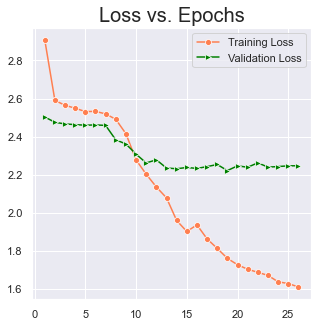

In [50]:
plot_learning_curve(h4)

In [51]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 9ms/step - loss: 2.2392 - accuracy: 0.4991
Testing Accuracy:  49.91108477115631


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [52]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Bidirectional(LSTM(32)),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [53]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 1.98917 >|> 
 ~| Epoch: 2 | Validation Loss: 1.84032 >|> 
 ~| Epoch: 3 | Validation Loss: 1.71317 >|> 
 ~| Epoch: 4 | Validation Loss: 1.69194 >|> 
 ~| Epoch: 5 | Validation Loss: 1.62231 >|> 
 ~| Epoch: 6 | Validation Loss: 1.60189 >|> 
 ~| Epoch: 7 | Validation Loss: 1.61941 >|> 
 ~| Epoch: 8 | Validation Loss: 1.63725 >|> 
 ~| Epoch: 9 | Validation Loss: 1.66948 >|> 
 ~| Epoch: 10 | Validation Loss: 1.57714 >|> 
 ~| Epoch: 11 | Validation Loss: 1.57898 >|> 
 ~| Epoch: 12 | Validation Loss: 1.66979 >|> 
 ~| Epoch: 13 | Validation Loss: 1.63858 >|> 
 ~| Epoch: 14 | Validation Loss: 1.65452 >|> 

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 15 | Validation Loss: 1.66364 >|> 
 ~| Epoch: 16 | Validation Loss: 1.66259 >|> 
 ~| Epoch: 17 | Validation Loss: 1.68847 >|> 

Training Done.


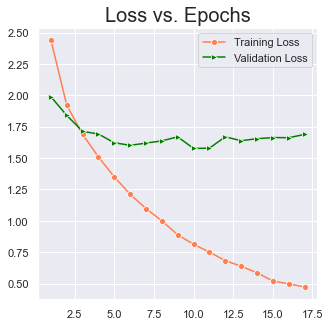

In [54]:
plot_learning_curve(h4)

In [55]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 1s 16ms/step - loss: 1.5843 - accuracy: 0.6586
Testing Accuracy:  65.85655212402344


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + LSTM</span></strong></li>
</ul></h4>

In [56]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    LSTM(75),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [57]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 2.15953 >|> 
 ~| Epoch: 2 | Validation Loss: 2.03527 >|> 
 ~| Epoch: 3 | Validation Loss: 1.97933 >|> 
 ~| Epoch: 4 | Validation Loss: 1.97626 >|> 
 ~| Epoch: 5 | Validation Loss: 1.95289 >|> 
 ~| Epoch: 6 | Validation Loss: 1.97950 >|> 
 ~| Epoch: 7 | Validation Loss: 2.01043 >|> 
 ~| Epoch: 8 | Validation Loss: 2.00164 >|> 
 ~| Epoch: 9 | Validation Loss: 2.03195 >|> 

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 10 | Validation Loss: 2.04752 >|> 
 ~| Epoch: 11 | Validation Loss: 2.07280 >|> 
 ~| Epoch: 12 | Validation Loss: 2.14650 >|> 

Training Done.


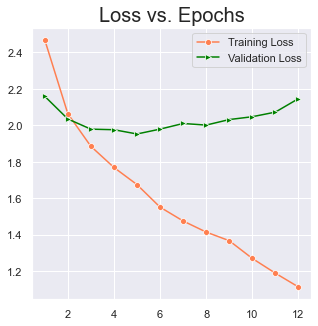

In [58]:
plot_learning_curve(h5)

In [59]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 1s 14ms/step - loss: 1.9861 - accuracy: 0.5471
Testing Accuracy:  54.712510108947754


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [60]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Bidirectional(LSTM(75, recurrent_dropout=0.5)),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [61]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 1.92552 >|> 
 ~| Epoch: 2 | Validation Loss: 1.82282 >|> 
 ~| Epoch: 3 | Validation Loss: 1.76291 >|> 
 ~| Epoch: 4 | Validation Loss: 1.73482 >|> 
 ~| Epoch: 5 | Validation Loss: 1.71375 >|> 
 ~| Epoch: 6 | Validation Loss: 1.75450 >|> 
 ~| Epoch: 7 | Validation Loss: 1.78363 >|> 
 ~| Epoch: 8 | Validation Loss: 1.79060 >|> 
 ~| Epoch: 9 | Validation Loss: 1.88543 >|> 

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 10 | Validation Loss: 1.88504 >|> 
 ~| Epoch: 11 | Validation Loss: 1.90626 >|> 
 ~| Epoch: 12 | Validation Loss: 1.91783 >|> 

Training Done.


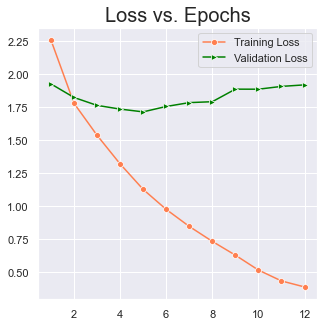

In [62]:
plot_learning_curve(h5)

In [63]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 4s 80ms/step - loss: 1.7774 - accuracy: 0.5987
Testing Accuracy:  59.869593381881714


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection</span></strong></li>
</ul></h4>

In [72]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

# using 75-25 split instead of 50-50 split as we need more data to train neural nets
X_train, X_test, y_train_vec, y_test_vec = train_test_split(X, y, test_size=0.2, random_state=seed)
print(f"Train dataset shape: {X_train.shape}, \nTest dataset shape: {X_test.shape}")

Train dataset shape: (6745,), 
Test dataset shape: (1687,)


In [73]:
NGRAM_RANGE = (1, 2)
TOP_K = 20000
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2


kwargs = {
    'ngram_range' : NGRAM_RANGE,
    'dtype' : 'int32',
    'strip_accents' : 'unicode',
    'decode_error' : 'replace',
    'analyzer' : TOKEN_MODE,
    'min_df' : MIN_DOC_FREQ
}
vectorizer = TfidfVectorizer(**kwargs)
X_train_vec = vectorizer.fit_transform(X_train)
X_test_vec = vectorizer.transform(X_test)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (6745, 17085), 
Test dataset shape: (1687, 17085)


In [74]:
from sklearn.feature_selection import SelectKBest, f_classif

# Select best k features, with feature importance measured by f_classif
# Set k as 20000 or (if number of ngrams is less) number of ngrams   
selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
selector.fit(X_train_vec, y_train_vec)
X_train_vec = selector.transform(X_train_vec).astype('float32')
X_test_vec = selector.transform(X_test_vec).astype('float32')
X_train_vec = X_train_vec.toarray()
X_test_vec = X_test_vec.toarray()

print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (6745, 17085), 
Test dataset shape: (1687, 17085)


In [79]:
model6 = Sequential([   
    Dense(64, activation='relu', input_shape=X_train_vec.shape[1:]),
    Dropout(0.2),
    Dense(16, activation='relu'),
    Dropout(0.2),
    Dense(NUM_CLASSES, activation='softmax')
])

model6.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [80]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h6 = model6.fit(
            X_train_vec, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception:
    print("Training on CPU:")
    h6 = model6.fit(
            X_train_vec, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 2.20277 >|> 
 ~| Epoch: 2 | Validation Loss: 1.91673 >|> 
 ~| Epoch: 3 | Validation Loss: 1.77355 >|> 
 ~| Epoch: 4 | Validation Loss: 1.67736 >|> 
 ~| Epoch: 5 | Validation Loss: 1.62489 >|> 
 ~| Epoch: 6 | Validation Loss: 1.59852 >|> 
 ~| Epoch: 7 | Validation Loss: 1.58639 >|> 
 ~| Epoch: 8 | Validation Loss: 1.60385 >|> 
 ~| Epoch: 9 | Validation Loss: 1.61785 >|> 
 ~| Epoch: 10 | Validation Loss: 1.62052 >|> 
 ~| Epoch: 11 | Validation Loss: 1.64508 >|> 
 ~| Epoch: 12 | Validation Loss: 1.70458 >|> 
 ~| Epoch: 13 | Validation Loss: 1.73147 >|> 
 ~| Epoch: 14 | Validation Loss: 1.77386 >|> 

Training Done.


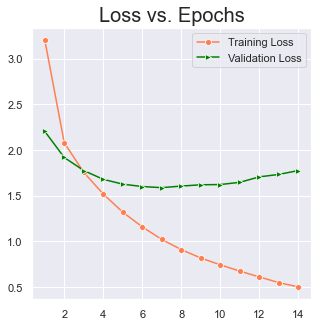

In [81]:
plot_learning_curve(h6)

In [82]:
loss, acc = model6.evaluate(X_test_vec, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 7ms/step - loss: 1.5654 - accuracy: 0.6680
Testing Accuracy:  66.80498123168945


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Resultant Metrics: </span></strong></li>
</ul></h3>

<table style="width:100%">
  <tr>
    <th>Model</th>
    <th>Test Accuracy</th>
  </tr>
  <tr>
    <td>Simple Feed-Forward Nerual Net</td>
    <td>60.40</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Batch Norm</td>
    <td>63.43</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Dropout</td>
    <td>64.73</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Pre-trained GLoVe embeddings</td>
    <td>61.53</td>
  </tr>
  <tr>
    <td>LSTM</td>
    <td>49.91</td>
  </tr>
    <tr>
    <td>Bi-Directional LSTM</td>
    <td>65.87</td>

<tr>
    <td>Convolution Blocks (Dimensionality Reduction) + LSTM</td>
    <td>54.71</td>
  </tr>
<tr>
    <td>Convolution Blocks (Dimensionality Reduction) + Bi-LSTM</td>
    <td>59.87</td>
  </tr>
<tr>
    <td>TfIdf Vectors + Feature Selection + Feed-forward Neural Net</td>
    <td>66.80</td>
  </tr>
</table>

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clustering</span></strong></li>
</ul></h1>

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer 
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
df=pd.read_excel('preprocessed_data.xlsx')

In [3]:
df.drop(df.loc[df['language']!='en'].index, inplace=True)

In [4]:
df.shape

(7961, 14)

In [5]:
c = df.group.value_counts()
c = c[c < 200].index
print(c)
print(df.group.nunique() - len(c)+1)

Index(['GRP_3', 'GRP_6', 'GRP_13', 'GRP_24', 'GRP_10', 'GRP_5', 'GRP_14',
       'GRP_4', 'GRP_25', 'GRP_29', 'GRP_18', 'GRP_16', 'GRP_17', 'GRP_7',
       'GRP_31', 'GRP_26', 'GRP_34', 'GRP_40', 'GRP_41', 'GRP_15', 'GRP_20',
       'GRP_33', 'GRP_28', 'GRP_45', 'GRP_22', 'GRP_1', 'GRP_21', 'GRP_11',
       'GRP_47', 'GRP_23', 'GRP_30', 'GRP_60', 'GRP_39', 'GRP_62', 'GRP_27',
       'GRP_37', 'GRP_44', 'GRP_36', 'GRP_50', 'GRP_48', 'GRP_65', 'GRP_53',
       'GRP_55', 'GRP_52', 'GRP_51', 'GRP_46', 'GRP_59', 'GRP_43', 'GRP_42',
       'GRP_66', 'GRP_49', 'GRP_38', 'GRP_63', 'GRP_56', 'GRP_58', 'GRP_68',
       'GRP_69', 'GRP_71', 'GRP_72', 'GRP_57', 'GRP_54', 'GRP_32', 'GRP_35',
       'GRP_67', 'GRP_64', 'GRP_70', 'GRP_61', 'GRP_73'],
      dtype='object')
7


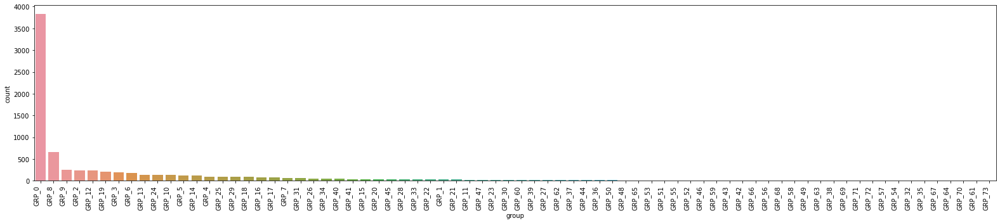

In [6]:
descending_order = df['group'].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(22,5))
#add code to rotate the labels
ax=sns.countplot(x='group', data=df,order=descending_order)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right")
plt.tight_layout()
plt.show()

In [7]:
#convert all categories with less than 200 freq as 'Grouped_Assignment'
df['New_group'] = np.where(df.groupby('group')['group'].transform('size') < 200, 'Grouped_Assignment', df['group'])

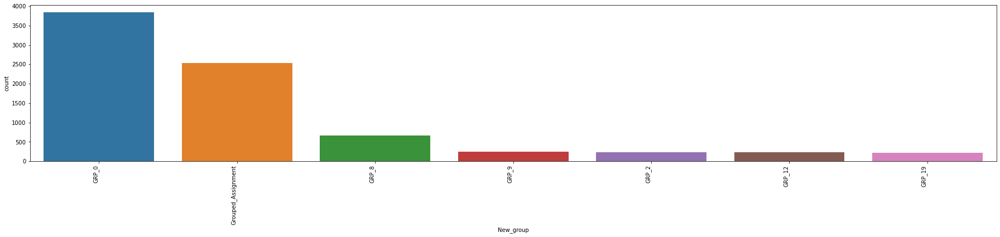

In [8]:
descending_order = df['New_group'].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(25,6))
#add code to rotate the labels
ax=sns.countplot(x='New_group', data=df,order=descending_order)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right")
plt.tight_layout()
plt.show()

In [9]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Dense, Input, LSTM, Embedding, Dropout, Activation, Flatten, Bidirectional, GlobalMaxPool1D, TimeDistributed, Reshape,Dot
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import *
from keras.initializers import Constant
from tensorflow.keras.utils import to_categorical

In [10]:
from sklearn.metrics import accuracy_score

In [11]:
max_features = 10000
maxlen = 40
embedding_size = 200
# define params
#NUM_WORDS = 20000
#EMBEDDING_DIM = 300
#MAX_LEN = 100

In [12]:
train = df.sample(frac=0.60, random_state=99)
test = df.loc[~df.index.isin(train.index), :]

In [13]:
tokenizer = Tokenizer(num_words=max_features)
tokenizer.fit_on_texts(train['merged_description'])

In [14]:
X = tokenizer.texts_to_sequences(train['merged_description'])
X = pad_sequences(X, maxlen = maxlen)
y = pd.get_dummies(train['New_group'])

print("Number of Samples:", len(X))
print(X[0])
print("Number of Labels: ", y.shape[1])

Number of Samples: 4777
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0  16  28 240]
Number of Labels:  7


In [15]:
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))
print(list(word_index.keys())[:100])

Found 7268 unique tokens.
['job', 'yes', 'na', 'password', 'ts', 'erp', 'user', 'tool', 'issue', 'scheduler', 'fail', 'company', 'ticket', 'sid', 'reset', 'unable', 'u', 'error', 'access', 'work', 'need', 'account', 'get', 'help', 'email', 'system', 'site', 'login', 'power', 'use', 'hostname', 'circuit', 'outlook', 'network', 'see', 'message', 'update', 'vendor', 'change', 'try', 'check', 'name', 'backup', 'able', 'new', 'server', 'log', 'telecom', 'phone', 'problem', 'type', 'order', 'start', 'call', 'time', 'connect', 'contact', 'open', 'request', 'team', 'lock', 'usa', 'printer', 'report', 'plant', 'send', 'crm', 't', 'attach', 'vpn', 'show', 'window', 'device', 'print', 'engineering', 'schedule', 'create', 'since', 'file', 'maintenance', 'outage', 'event', 'receive', 'screen', 'notify', 'pc', 'management', 'pm', 'skype', 'provider', 'sale', 'cert', 'maint', 'connection', 'resolve', 'platform', 'customer', 'collaboration', 'detail', 'could']


In [16]:
VOCAB_SIZE = len(word_index) + 1
VOCAB_SIZE

7269

In [17]:
EMBEDDING_FILE = 'glove.6B.200d.txt'

embeddings = {}
for o in open(EMBEDDING_FILE):
    word = o.split(" ")[0]
    # print(word)
    embd = o.split(" ")[1:]
    embd = np.asarray(embd, dtype='float32')
    # print(embd)
    embeddings[word] = embd

print('Found %s word vectors.' % len(embeddings))

Found 400000 word vectors.


In [18]:
embedding_dim = 200

embedding_matrix = np.zeros((len(word_index)+1, embedding_dim))

for word, i in word_index.items():
    if i > max_features:
        continue
    embedding_vector = embeddings.get(word)
    if embedding_vector is not None:
        # we found the word - add that words vector to the matrix
        embedding_matrix[i] = embedding_vector
    else:
        # doesn't exist, assign a random vector
        embedding_matrix[i] = np.random.randn(embedding_dim)

In [19]:
model = Sequential()
model.add(Embedding(len(word_index)+1,
                    embedding_dim,
                    embeddings_initializer=Constant(embedding_matrix),
                    input_length=maxlen,
                    trainable=True))

model.add(SpatialDropout1D(0.2))
model.add(Bidirectional(LSTM(64, recurrent_dropout=0.1,return_sequences=True)))
model.add(Bidirectional(LSTM(64, recurrent_dropout=0.1)))
model.add(Dropout(0.25))

model.add(Dense(64, activation='relu'))

model.add(Dense(7, activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics = ['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 40, 200)           1453800   
_________________________________________________________________
spatial_dropout1d (SpatialDr (None, 40, 200)           0         
_________________________________________________________________
bidirectional (Bidirectional (None, 40, 128)           135680    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 128)               98816     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense (Dense)                (None, 64)                8256      
_________________________________________________________________
dense_1 (Dense)              (None, 7)                 4

In [20]:
epochs = 20
batch_size = 128

history = model.fit(X, y, epochs=epochs, batch_size=batch_size, verbose=1, validation_split=0.1)

Epoch 1/20
34/34 [==============================] - 19s 348ms/step - loss: 1.3429 - accuracy: 0.5231 - val_loss: 0.9989 - val_accuracy: 0.6213
Epoch 2/20
34/34 [==============================] - 11s 309ms/step - loss: 0.9690 - accuracy: 0.6381 - val_loss: 0.8848 - val_accuracy: 0.6778
Epoch 3/20
34/34 [==============================] - 10s 307ms/step - loss: 0.8617 - accuracy: 0.6764 - val_loss: 0.8187 - val_accuracy: 0.6925
Epoch 4/20
34/34 [==============================] - 10s 308ms/step - loss: 0.7549 - accuracy: 0.7278 - val_loss: 0.7770 - val_accuracy: 0.7071
Epoch 5/20
34/34 [==============================] - 10s 307ms/step - loss: 0.6754 - accuracy: 0.7592 - val_loss: 0.7382 - val_accuracy: 0.7322
Epoch 6/20
34/34 [==============================] - 10s 307ms/step - loss: 0.5978 - accuracy: 0.7809 - val_loss: 0.7902 - val_accuracy: 0.7197
Epoch 7/20
34/34 [==============================] - 11s 314ms/step - loss: 0.5476 - accuracy: 0.8046 - val_loss: 0.7523 - val_accuracy: 0.7322

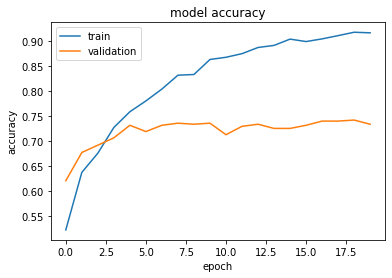

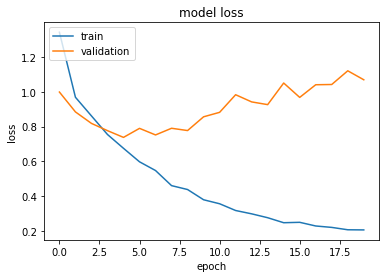

In [21]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [22]:
X_test = tokenizer.texts_to_sequences(test['merged_description'])
X_test = pad_sequences(X_test, maxlen = maxlen)

In [23]:
le = preprocessing.LabelEncoder()
le.fit(test['New_group'])
y_test=le.transform(test['New_group'])

In [24]:
word_index_test = tokenizer.word_index

In [25]:
y_hat = np.argmax(model.predict(X_test), axis=-1)

In [26]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

print(classification_report(y_hat,y_test))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      1586
           1       0.53      0.56      0.55        94
           2       0.32      0.31      0.32        80
           3       0.33      0.55      0.41        62
           4       0.84      0.64      0.73       364
           5       0.29      0.42      0.34        62
           6       0.68      0.71      0.69       936

    accuracy                           0.75      3184
   macro avg       0.55      0.58      0.56      3184
weighted avg       0.76      0.75      0.75      3184



In [27]:
model = Sequential()
model.add(Embedding(len(word_index)+1,
                    embedding_dim,
                    embeddings_initializer=Constant(embedding_matrix),
                    input_length=maxlen,
                    trainable=True))

model.add(SpatialDropout1D(0.2))
model.add(Bidirectional(LSTM(32, recurrent_dropout=0.1,return_sequences=True)))
model.add(Bidirectional(LSTM(32, recurrent_dropout=0.1)))
model.add(Dropout(0.25))

model.add(Dense(64, activation='relu'))

model.add(Dense(7, activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics = ['accuracy'])


epochs = 50
batch_size = 128

history = model.fit(X, y, epochs=epochs, batch_size=batch_size, verbose=1, validation_split=0.1)

Epoch 1/50
34/34 [==============================] - 16s 231ms/step - loss: 1.4566 - accuracy: 0.4866 - val_loss: 1.0941 - val_accuracy: 0.6297
Epoch 2/50
34/34 [==============================] - 6s 175ms/step - loss: 1.0455 - accuracy: 0.6253 - val_loss: 0.9335 - val_accuracy: 0.6611
Epoch 3/50
34/34 [==============================] - 6s 172ms/step - loss: 0.9066 - accuracy: 0.6655 - val_loss: 0.8513 - val_accuracy: 0.6862
Epoch 4/50
34/34 [==============================] - 6s 173ms/step - loss: 0.8300 - accuracy: 0.7006 - val_loss: 0.8137 - val_accuracy: 0.7050
Epoch 5/50
34/34 [==============================] - 6s 173ms/step - loss: 0.7494 - accuracy: 0.7309 - val_loss: 0.7868 - val_accuracy: 0.7259
Epoch 6/50
34/34 [==============================] - 6s 172ms/step - loss: 0.6875 - accuracy: 0.7518 - val_loss: 0.8180 - val_accuracy: 0.6987
Epoch 7/50
34/34 [==============================] - 6s 171ms/step - loss: 0.6274 - accuracy: 0.7799 - val_loss: 0.7640 - val_accuracy: 0.7301
Epoch

In [28]:
y_hat_50 = np.argmax(model.predict(X_test), axis=-1)
print(classification_report(y_hat_50,y_test))

              precision    recall  f1-score   support

           0       0.86      0.83      0.84      1633
           1       0.46      0.59      0.52        78
           2       0.18      0.24      0.21        59
           3       0.31      0.53      0.40        60
           4       0.83      0.64      0.73       357
           5       0.28      0.53      0.37        47
           6       0.67      0.68      0.67       950

    accuracy                           0.74      3184
   macro avg       0.51      0.58      0.53      3184
weighted avg       0.76      0.74      0.74      3184



In [29]:
seq_input = Input(shape=(maxlen,), dtype='int32')
embedded = Embedding(len(word_index)+1,
                     embedding_dim,
                     embeddings_initializer=Constant(embedding_matrix),
                     input_length=maxlen,
                     trainable=True)(seq_input)

embedded = Dropout(0.2)(embedded)

In [30]:
lstm1 = Bidirectional(LSTM(embedding_dim, return_sequences=True))(embedded)
lstm1 = Dropout(0.2)(lstm1)
lstm2 = Bidirectional(LSTM(embedding_dim, return_sequences=True))(lstm1)
lstm2 = Dropout(0.2)(lstm2)

In [31]:
att_vector = TimeDistributed(Dense(1))(lstm2)
att_vector = Reshape((maxlen,))(att_vector)
att_vector = Activation('softmax', name='attention_vec')(att_vector)

In [32]:
att_output = Dot(axes=1)([lstm2, att_vector])

In [33]:
fc = Dense(embedding_dim, activation='relu')(att_output)
output = Dense(7, activation='softmax')(fc)
model = Model(inputs=[seq_input], outputs=output)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 40)]         0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 40, 200)      1453800     input_1[0][0]                    
__________________________________________________________________________________________________
dropout_2 (Dropout)             (None, 40, 200)      0           embedding_2[0][0]                
__________________________________________________________________________________________________
bidirectional_4 (Bidirectional) (None, 40, 400)      641600      dropout_2[0][0]                  
______________________________________________________________________________________________

In [34]:
model.compile(loss="categorical_crossentropy", metrics=["accuracy"], optimizer='adam')

history = model.fit(X, y, epochs=30, batch_size=128, validation_split=0.1, shuffle=True, verbose=2)

Epoch 1/30
34/34 - 38s - loss: 1.2070 - accuracy: 0.5557 - val_loss: 0.9545 - val_accuracy: 0.6381
Epoch 2/30
34/34 - 30s - loss: 0.8704 - accuracy: 0.6588 - val_loss: 0.8110 - val_accuracy: 0.6820
Epoch 3/30
34/34 - 31s - loss: 0.7278 - accuracy: 0.7195 - val_loss: 0.7450 - val_accuracy: 0.7050
Epoch 4/30
34/34 - 31s - loss: 0.6239 - accuracy: 0.7613 - val_loss: 0.7172 - val_accuracy: 0.7364
Epoch 5/30
34/34 - 31s - loss: 0.5211 - accuracy: 0.7972 - val_loss: 0.7247 - val_accuracy: 0.7301
Epoch 6/30
34/34 - 32s - loss: 0.4606 - accuracy: 0.8239 - val_loss: 0.7539 - val_accuracy: 0.7280
Epoch 7/30
34/34 - 36s - loss: 0.3973 - accuracy: 0.8446 - val_loss: 0.8282 - val_accuracy: 0.7322
Epoch 8/30
34/34 - 34s - loss: 0.3285 - accuracy: 0.8728 - val_loss: 0.9457 - val_accuracy: 0.7155
Epoch 9/30
34/34 - 34s - loss: 0.3373 - accuracy: 0.8758 - val_loss: 0.8387 - val_accuracy: 0.7301
Epoch 10/30
34/34 - 31s - loss: 0.2777 - accuracy: 0.8965 - val_loss: 1.0644 - val_accuracy: 0.6925
Epoch 11/

In [35]:
y_hat_att = np.argmax(model.predict(X_test), axis=-1)
print(classification_report(y_hat_att,y_test))

              precision    recall  f1-score   support

           0       0.81      0.85      0.83      1495
           1       0.44      0.54      0.49        81
           2       0.18      0.26      0.21        54
           3       0.32      0.58      0.42        57
           4       0.82      0.65      0.72       348
           5       0.17      0.68      0.27        22
           6       0.73      0.63      0.68      1127

    accuracy                           0.73      3184
   macro avg       0.50      0.60      0.52      3184
weighted avg       0.75      0.73      0.73      3184



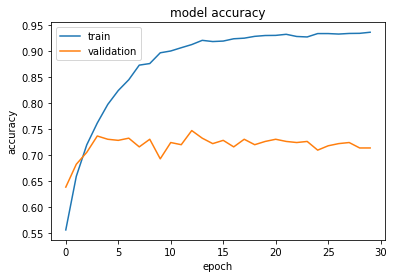

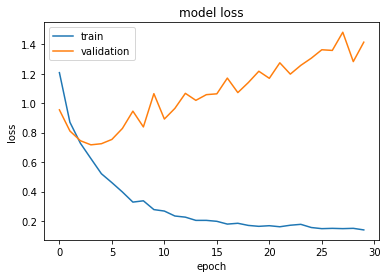

In [36]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

## Summary and improvements:
* Here in this iteration we implemented grouping/clustering approach first followed by classification
    * Clubbing together all the groups with frequency of occurrence < 200 and treated it as 'New group'
    * Improvement planned in next iteration: use best fit grouping with a 'group clustering' function
* Here we used merged description as a dependent variable ommitting non-English description as it is giving better results than one with non-English description
    * Improvement planned in next iteration: use a translated descriptions for non-English description
* We will further bring down the number of clusters as per problem statement in next iterations.

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clustering all groups into L1, L2 & L3 + DL Binary Classifier</span></strong></li>
</ul></h1>

<h4>
<ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">OBJECTIVE:</span></strong></li>
</ul>
<p><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use the text data to build a deep-learning based binary classifier.</span></p>
    </h4>

In [1]:
# imports

import warnings
warnings.filterwarnings('ignore')

import os
import math
import random
from time import time
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import defaultdict, Counter
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud, STOPWORDS
import tensorflow

tqdm.pandas()
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

In [2]:
# reproducibility
seed = 7
random.seed(seed)
tensorflow.random.set_seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import the clean data.</span></strong></li>
</ul></h3>

In [3]:
dataset = pd.read_excel('./data/preprocessed_data.xlsx')
dataset.sample(5)

,translated_description,keywords,short_description,description,group,cleaned_description,cleaned_short_description,merged_description,char_length,word_length,short_char_length,short_word_length,language,language_confidence
3906,able log vpn try open new session go session f...,session go session finish page,i am not able to log into my vpn. when i am tr...,name:mehrugshy\nlanguage:\nbrowser:microsoft i...,GRP_0,able log vpn try open new session go session f...,able log vpn try open new session go session f...,able log vpn try open new session go session f...,254,37,120,28,en,0.644429
583,able logon crm website link user ottyhddok tel...,logon crm website link user,"hi, few users are not able to logon to crm web...",link : \nusers:\nottyhddok\nthielpwii2e\nlobod...,GRP_33,link user ottyhddok telpwiie lobodeidd loksdkd...,user able logon crm website,able logon crm website link user ottyhddok tel...,90,13,51,11,en,0.626343
1360,job sid filesys fail job scheduler,sid filesys fail job scheduler,job SID_56filesys failed in job_scheduler at: ...,received from: monitoring_tool@company.com\n\n...,GRP_5,job sid filesys fail job scheduler,job sid filesys fail job scheduler,job sid filesys fail job scheduler,109,11,67,8,en,0.629173
1725,user unable open reporting tool,user unable open reporting tool,user was unable to open reporting_tool,user was unable to open reporting_tool,GRP_0,user unable open reporting tool,user unable open reporting tool,user unable open reporting tool,38,6,38,6,en,0.964643
1884,automatic registration when I call the compute...,platform that is to register,automatische anmeldung,"wenn ich outlook aufrufe, will der rechner gle...",GRP_0,wenn ich outlook aufrufe der rechner gleichzei...,automatische anmeldung,automatische anmeldung wenn ich outlook aufruf...,334,47,22,2,de,0.997998


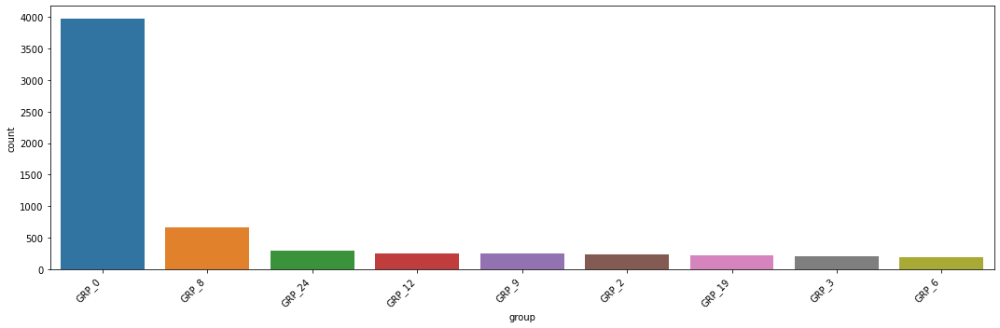

In [4]:
descending_order = dataset['group'].value_counts().sort_values(ascending=False).head(9).index
plt.subplots(figsize=(15,5))
ax=sns.countplot(x='group', data=dataset,order=descending_order)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [5]:
def group_clustering(top_frequency_groups):
    descending_order = dataset['group'].value_counts().sort_values(ascending=False).head(top_frequency_groups)
    Cluster_1=[]
    Cluster_2=[]
    Cluster_1.extend(list(descending_order.index))
    Cluster_2.extend(list(set(dataset['group'].unique())-set(descending_order.index)))
    return Cluster_1,Cluster_2

# the value of top_frequency_groups=9 turns out to be best fit
L12,L3=group_clustering(top_frequency_groups=9)
print('L12')
pprint(L12, compact=True)

print('\nL3')
pprint(L3, compact=True)

L12
['GRP_0', 'GRP_8', 'GRP_24', 'GRP_12', 'GRP_9', 'GRP_2', 'GRP_19', 'GRP_3',
 'GRP_6']

L3
['GRP_53', 'GRP_35', 'GRP_37', 'GRP_58', 'GRP_73', 'GRP_25', 'GRP_23', 'GRP_42',
 'GRP_36', 'GRP_59', 'GRP_71', 'GRP_52', 'GRP_29', 'GRP_27', 'GRP_33', 'GRP_10',
 'GRP_20', 'GRP_43', 'GRP_31', 'GRP_44', 'GRP_55', 'GRP_68', 'GRP_15', 'GRP_63',
 'GRP_18', 'GRP_65', 'GRP_11', 'GRP_32', 'GRP_5', 'GRP_69', 'GRP_26', 'GRP_1',
 'GRP_62', 'GRP_70', 'GRP_46', 'GRP_13', 'GRP_39', 'GRP_49', 'GRP_22', 'GRP_60',
 'GRP_30', 'GRP_40', 'GRP_72', 'GRP_51', 'GRP_34', 'GRP_17', 'GRP_48', 'GRP_50',
 'GRP_57', 'GRP_38', 'GRP_45', 'GRP_61', 'GRP_16', 'GRP_41', 'GRP_54', 'GRP_14',
 'GRP_67', 'GRP_47', 'GRP_21', 'GRP_66', 'GRP_4', 'GRP_28', 'GRP_7', 'GRP_56',
 'GRP_64']


In [6]:
def get_label(row):
    if row.group in L12:
        label = 0
    if row.group in L3:
        label = 1
    row['label'] = label
    return row

dataset = dataset.progress_apply(get_label, axis=1)

100%|█████████████████████████████████████████████████████████████████████████| 8499/8499 [00:04<00:00, 1999.77it/s]


In [7]:
dataset.label.value_counts()

0    5985
1    2514
Name: label, dtype: int64

In [71]:
dataset.to_csv('./data/preprocessed_data_groups.csv', index=None)

In [8]:
X = np.array(dataset.translated_description)
y = np.array(dataset.label)
X.shape, y.shape

((8499,), (8499,))

In [9]:
from tensorflow.keras.utils import to_categorical
y_dummy_coded = to_categorical(y)
y[0], y_dummy_coded[0]

(0, array([1., 0.], dtype=float32))

In [10]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y_dummy_coded, test_size=.15,
                                                    random_state=seed, stratify=y_dummy_coded)  # splits are stratified by y

In [11]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((7224,), (1275,), (7224, 2), (1275, 2))

In [12]:
X_train[0], y_train[0]  # check sample

('security suspicious netbios system name hostname santiagosouth amerirtca backup exec server user uidgt olibercsu olvidley location sep sms status see field sale dsw event log content versions fmxcnwpu tcwrdqboinition versionr sequence host integrity available reputation settingsr ap portal listr intrusion prevention signaturer power eraser definitionsr revocation contentr engine sonar extend file attribute signaturesr symantec permit application inent overview detect leastoccurrence firewall companyinternalasa company comdroppe traffic source hostname destine portof one destination device ts activity may indicate follow infection misconfigure port scan authorize unauthorized escalate via gh priority ticket phone call per default handling procedure would like we handle inent differently future option question concern let know either correspond delegate back soc call escalation alert block explicit notification medium automatically resolve reporting purpose sincerely dell securework te

In [13]:
# TODO: Check the distributions of groups in training and testing sets, i.e, if they vary too much
# stratify by y if required during splits
# or data augmentation to upsample minority classes to balance the group distributions

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Tokenize and pad sequences</span></strong></li>
</ul></h3>

In [14]:
# define params
NUM_WORDS = 20000
EMBEDDING_DIM = 300
MAX_LEN = 100 # dataset['word_length'].max()
MAX_LEN

100

In [15]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


tokenizer = Tokenizer(num_words=NUM_WORDS)
tokenizer.fit_on_texts(X_train)
X_train_tokens = tokenizer.texts_to_sequences(X_train)
X_test_tokens = tokenizer.texts_to_sequences(X_test)
X_train_tokens[0], X_test_tokens[0]

([271,
  1136,
  1137,
  21,
  34,
  25,
  3281,
  511,
  33,
  2658,
  37,
  4,
  2278,
  3282,
  3283,
  147,
  370,
  1076,
  186,
  32,
  280,
  81,
  446,
  87,
  51,
  384,
  2659,
  2279,
  2280,
  2660,
  2281,
  218,
  2661,
  122,
  2662,
  2663,
  259,
  159,
  2664,
  2665,
  2666,
  2667,
  54,
  2668,
  2669,
  2670,
  2671,
  1138,
  2672,
  616,
  67,
  1823,
  2673,
  1139,
  1824,
  111,
  223,
  810,
  632,
  1528,
  730,
  2282,
  9,
  2283,
  371,
  263,
  25,
  1248,
  2284,
  117,
  372,
  61,
  3,
  436,
  206,
  335,
  88,
  871,
  2285,
  294,
  304,
  512,
  1140,
  676,
  156,
  274,
  247,
  17,
  73,
  45,
  213,
  350,
  731,
  437,
  131,
  173,
  105,
  351,
  223,
  651,
  500,
  291,
  277,
  545,
  152,
  128,
  438,
  625,
  571,
  140,
  601,
  45,
  602,
  192,
  190,
  471,
  174,
  250,
  378,
  91,
  385,
  546,
  492,
  352,
  1249,
  561,
  89,
  1825,
  1077,
  732,
  783,
  24,
  294,
  2286,
  1035,
  329,
  513,
  1826,
  732,
  1529,
  1

In [16]:
y_train[0], y_test[0]

(array([1., 0.], dtype=float32), array([0., 1.], dtype=float32))

In [17]:
# pad sequences to cut longer texts to a uniform length and pad the sentences that are shorter than that with <PAD> token

# using just 20 words from each headline will severely limit the information that is 
# available to the model and affect performance although the training will be faster
X_train_padded = pad_sequences(X_train_tokens,
                               padding='post',
                               truncating='post',
                               maxlen=MAX_LEN)
X_test_padded = pad_sequences(X_test_tokens,
                              padding='post',
                              truncating='post',
                              maxlen=MAX_LEN)


print(f'X train:  {X_train_padded.shape}\nX test:   {X_test_padded.shape}')

X train:  (7224, 100)
X test:   (1275, 100)


In [18]:
pprint(X_train_padded[0], compact=True)

array([ 271, 1136, 1137,   21,   34,   25, 3281,  511,   33, 2658,   37,
          4, 2278, 3282, 3283,  147,  370, 1076,  186,   32,  280,   81,
        446,   87,   51,  384, 2659, 2279, 2280, 2660, 2281,  218, 2661,
        122, 2662, 2663,  259,  159, 2664, 2665, 2666, 2667,   54, 2668,
       2669, 2670, 2671, 1138, 2672,  616,   67, 1823, 2673, 1139, 1824,
        111,  223,  810,  632, 1528,  730, 2282,    9, 2283,  371,  263,
         25, 1248, 2284,  117,  372,   61,    3,  436,  206,  335,   88,
        871, 2285,  294,  304,  512, 1140,  676,  156,  274,  247,   17,
         73,   45,  213,  350,  731,  437,  131,  173,  105,  351,  223,
        651])


In [19]:
WORD_TO_INDEX = tokenizer.word_index
# pprint(WORD_TO_INDEX, compact=True)
pprint(list(WORD_TO_INDEX.keys())[:100], compact=True)

['job', 'password', 'ts', 'user', 'erp', 'tool', 'issue', 'reset', 'company',
 'sid', 'scheduler', 'fail', 'access', 'error', 'work', 'unable', 'ticket', 'u',
 'account', 'need', 'system', 'help', 'get', 'use', 'hostname', 'site', 'login',
 'outlook', 'email', 'message', 'the', 'see', 'backup', 'name', 'update',
 'change', 'server', 'check', 'circuit', 'try', 'able', 'type', 'request',
 'printer', 'call', 'network', 'time', 'new', 'contact', 'order', 'log', 'usa',
 'problem', 'power', 'open', 'connect', 'lock', 'team', 'report', 'since',
 'device', 'plant', 't', 'engineering', 'vpn', 'pc', 'file', 'create',
 'maintenance', 'send', 'attach', 'window', 'phone', 'schedule', 'crm', 'print',
 'telecomvendor', 'skype', 'show', 'management', 'sale', 'start', 'connection',
 'vendor', 'receive', 'computer', 'event', 'follow', 'detail', 'number',
 'resolve', 'could', 'na', 'platform', 'production', 'information', 'with',
 'pm', 'unlock', 'collaboration']


In [20]:
VOCAB_SIZE = len(WORD_TO_INDEX) + 1
VOCAB_SIZE

9773

In [21]:
# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/sequence/pad_sequences
def retrieve_description_feat(x, mapping=WORD_TO_INDEX) -> str:
    # increment 3 
    mapping = {k:(v + 3) for k, v in mapping.items()}
    mapping['<PAD>'] = 0
    mapping['<START>'] = 1
    mapping['<UNK>'] = 2
    inv_mapping = {v: k for k, v in mapping.items()}
    return str(" ".join(inv_mapping.get(i, '<NA>') for i in x))

retrieve_description_feat(X_test_padded[7])

'fail device ts print scheduler login monitor note power monday vvlahstyurr inform well note itypedport designate hash monitor account <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">GloVe Embeddings</span></strong></li>
</ul></h3>

In [22]:
EMBEDDING_DIM

300

In [23]:
def get_embedding_matrix(embedding_dim=EMBEDDING_DIM):
    embeddings = defaultdict()
    if embedding_dim == 200:
        file_path = f'./data/glove.6B.{embedding_dim}d.txt'
    elif embedding_dim == 300:
        file_path = f'./data/glove.840B.{embedding_dim}d.txt'
    for l in open(file_path, encoding='utf-8'):
        word = l.split(" ")[0]
        embeddings[word] = np.asarray(l.split(" ")[1:], dtype='float32')

    embeddings = dict(embeddings)

    # create a weight matrix for words in training docs
    embedding_matrix = np.zeros((NUM_WORDS, embedding_dim))

    for word, idx in WORD_TO_INDEX.items():
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            embedding_matrix[idx] = embedding_vector

    return embedding_matrix

In [24]:
# use pre-trained glove embedding matrix to initialize weights in our model
embedding_matrix = get_embedding_matrix()
embedding_matrix.shape

(20000, 300)

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net</span></strong></li>
</ul></h4>

In [25]:
# !pip install livelossplot
from tensorflow.python.keras.models import Sequential
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.regularizers import l2
from tensorflow.keras.constraints import max_norm, unit_norm
from tensorflow.python.keras.callbacks import LambdaCallback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Flatten, Dense, Activation, BatchNormalization, Dropout, Embedding, LSTM, MaxPooling1D, Conv1D, Bidirectional

In [26]:
NUM_CLASSES = 2
VOCAB_SIZE, MAX_LEN, EMBEDDING_DIM, NUM_CLASSES

(9773, 100, 300, 2)

In [27]:
# define model

model1 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(1024, activation = 'relu'),
    Dense(1024, activation = 'relu'),
    Dense(128, activation = 'relu'),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model1.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [28]:
# Define Callbacks and a few helper functions

# simplify the training log
simple_log = LambdaCallback(
    on_epoch_end = lambda e, l: print(f" ~| Epoch: {e+1} | Validation Loss: {l['val_loss']:.5f}", end =" >|> \n" ))

# early stopping
early_stop = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=7,
                              verbose=0, 
                              restore_best_weights=True)

# learning rate reduction
lr_reduce_on_plateau = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=4, 
                                            verbose=1, 
                                            factor=0.4,
                                            min_lr=0.00001)

def plot_learning_curve(hist):
    sns.set()
    plt.figure(figsize=(5,5))
    train = hist.history['loss']
    val = hist.history['val_loss']
    epochs_run = range(1,len(train) + 1)
    sns.lineplot(epochs_run, train, marker = 'o', color = 'coral', label = 'Training Loss')
    sns.lineplot(epochs_run, val,  marker = '>', color = 'green', label = 'Validation Loss')
    plt.title("Loss vs. Epochs", fontsize = 20)
    plt.legend()
    plt.show()

In [29]:
X_train[0]

'security suspicious netbios system name hostname santiagosouth amerirtca backup exec server user uidgt olibercsu olvidley location sep sms status see field sale dsw event log content versions fmxcnwpu tcwrdqboinition versionr sequence host integrity available reputation settingsr ap portal listr intrusion prevention signaturer power eraser definitionsr revocation contentr engine sonar extend file attribute signaturesr symantec permit application inent overview detect leastoccurrence firewall companyinternalasa company comdroppe traffic source hostname destine portof one destination device ts activity may indicate follow infection misconfigure port scan authorize unauthorized escalate via gh priority ticket phone call per default handling procedure would like we handle inent differently future option question concern let know either correspond delegate back soc call escalation alert block explicit notification medium automatically resolve reporting purpose sincerely dell securework tec

In [30]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((7224,), (7224, 2), (1275,), (1275, 2))

In [31]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("\nTraining on CPU:")
    h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.40762 >|> 
 ~| Epoch: 2 | Validation Loss: 0.45989 >|> 
 ~| Epoch: 3 | Validation Loss: 0.61361 >|> 
 ~| Epoch: 4 | Validation Loss: 0.79945 >|> 
 ~| Epoch: 5 | Validation Loss: 0.96624 >|> 
 ~| Epoch: 6 | Validation Loss: 0.99258 >|> 
 ~| Epoch: 7 | Validation Loss: 1.28460 >|> 
 ~| Epoch: 8 | Validation Loss: 0.98681 >|> 

Training Done.


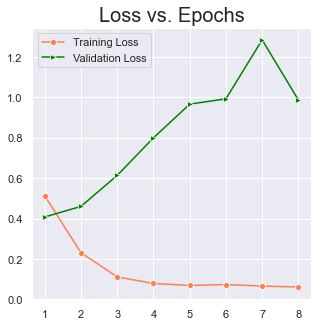

In [32]:
plot_learning_curve(h1)

In [33]:
loss, acc = model1.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

40/40 [==============================] - 0s 3ms/step - loss: 0.4014 - accuracy: 0.8188
Testing Loss:  40.13861119747162
Testing Accuracy:  81.8823516368866


<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>This model is clearly overfitting, we will add regularization to the next iteration
 </span></ul></h4>

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net + Batch Normalization</span></strong></li>
</ul></h4>

In [34]:
# define model

model2 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model2.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [35]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.88934 >|> 
 ~| Epoch: 2 | Validation Loss: 0.97065 >|> 
 ~| Epoch: 3 | Validation Loss: 0.52188 >|> 
 ~| Epoch: 4 | Validation Loss: 0.72759 >|> 
 ~| Epoch: 5 | Validation Loss: 0.54716 >|> 
 ~| Epoch: 6 | Validation Loss: 0.75639 >|> 
 ~| Epoch: 7 | Validation Loss: 0.73306 >|> 
 ~| Epoch: 8 | Validation Loss: 0.76720 >|> 
 ~| Epoch: 9 | Validation Loss: 0.91155 >|> 
 ~| Epoch: 10 | Validation Loss: 0.58389 >|> 

Training Done.


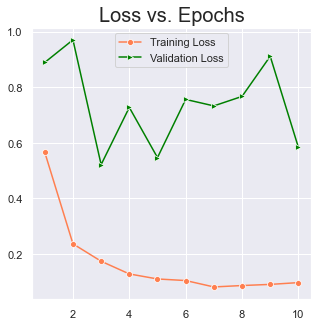

In [36]:
plot_learning_curve(h2)

In [37]:
loss, acc = model2.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

40/40 [==============================] - 0s 3ms/step - loss: 0.5553 - accuracy: 0.7522
Testing Loss:  55.527979135513306
Testing Accuracy:  75.21568536758423


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net + Dropout</span></strong></li>
</ul></h4>

In [38]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(20, activation = 'relu'),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [39]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.44251 >|> 
 ~| Epoch: 2 | Validation Loss: 0.43471 >|> 
 ~| Epoch: 3 | Validation Loss: 0.49978 >|> 
 ~| Epoch: 4 | Validation Loss: 0.60682 >|> 
 ~| Epoch: 5 | Validation Loss: 0.68696 >|> 
 ~| Epoch: 6 | Validation Loss: 0.74946 >|> 

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 7 | Validation Loss: 0.81176 >|> 
 ~| Epoch: 8 | Validation Loss: 0.81727 >|> 
 ~| Epoch: 9 | Validation Loss: 0.82799 >|> 

Training Done.


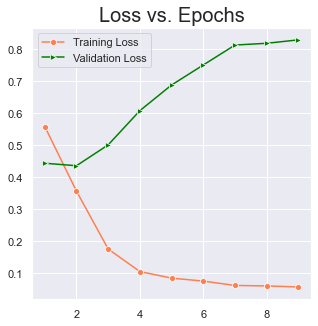

In [40]:
plot_learning_curve(h3)

In [41]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

40/40 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.8094
Testing Accuracy:  80.94117641448975


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use pre-trained embeddings</span></strong></li>
</ul></h4>

In [42]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=NUM_WORDS, output_dim=EMBEDDING_DIM, input_length=MAX_LEN, weights=[embedding_matrix], trainable=True),
    Flatten(),
    Dense(30, activation = 'relu'),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [43]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.45669 >|> 
 ~| Epoch: 2 | Validation Loss: 0.46318 >|> 
 ~| Epoch: 3 | Validation Loss: 0.47607 >|> 
 ~| Epoch: 4 | Validation Loss: 0.51958 >|> 
 ~| Epoch: 5 | Validation Loss: 0.55230 >|> 
 ~| Epoch: 6 | Validation Loss: 0.64084 >|> 
 ~| Epoch: 7 | Validation Loss: 0.73939 >|> 
 ~| Epoch: 8 | Validation Loss: 0.82803 >|> 

Training Done.


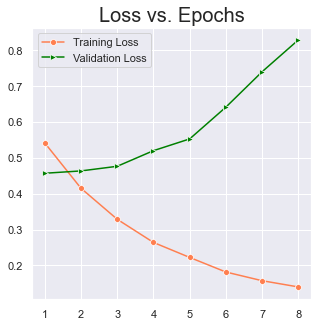

In [44]:
plot_learning_curve(h3)

In [45]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

40/40 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7804
Testing Accuracy:  78.03921699523926


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">LSTM</span></strong></li>
</ul></h4>

In [46]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    LSTM(32),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [47]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.59684 >|> 
 ~| Epoch: 2 | Validation Loss: 0.60537 >|> 
 ~| Epoch: 3 | Validation Loss: 0.59950 >|> 
 ~| Epoch: 4 | Validation Loss: 0.60150 >|> 
 ~| Epoch: 5 | Validation Loss: 0.60247 >|> 

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 6 | Validation Loss: 0.60493 >|> 
 ~| Epoch: 7 | Validation Loss: 0.60554 >|> 
 ~| Epoch: 8 | Validation Loss: 0.60608 >|> 
 ~| Epoch: 9 | Validation Loss: 0.60846 >|> 

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.00016000000759959222.
 ~| Epoch: 10 | Validation Loss: 0.61022 >|> 
 ~| Epoch: 11 | Validation Loss: 0.61205 >|> 
 ~| Epoch: 12 | Validation Loss: 0.61601 >|> 
 ~| Epoch: 13 | Validation Loss: 0.61596 >|> 

Epoch 00013: ReduceLROnPlateau reducing learning rate to 6.40000042039901e-05.
 ~| Epoch: 14 | Validation Loss: 0.61936 >|> 
 ~| Epoch: 15 | Validation Loss: 0.61700 >|> 
 ~| Epoch: 16 | Validation Loss: 0.61830 >|> 
 ~| Epoch: 17

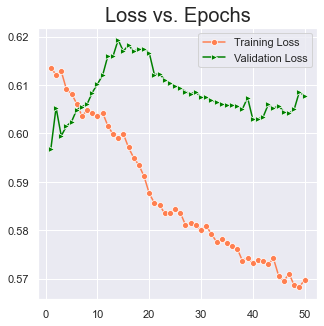

In [48]:
plot_learning_curve(h4)

In [49]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

40/40 [==============================] - 0s 6ms/step - loss: 0.5941 - accuracy: 0.7271
Testing Accuracy:  72.70588278770447


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [50]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Bidirectional(LSTM(32)),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [51]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.44402 >|> 
 ~| Epoch: 2 | Validation Loss: 0.41793 >|> 
 ~| Epoch: 3 | Validation Loss: 0.42399 >|> 
 ~| Epoch: 4 | Validation Loss: 0.47163 >|> 
 ~| Epoch: 5 | Validation Loss: 0.47986 >|> 
 ~| Epoch: 6 | Validation Loss: 0.49628 >|> 

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 7 | Validation Loss: 0.55975 >|> 
 ~| Epoch: 8 | Validation Loss: 0.59101 >|> 
 ~| Epoch: 9 | Validation Loss: 0.59970 >|> 

Training Done.


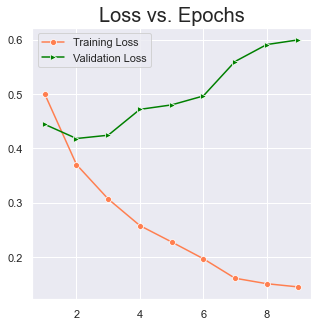

In [52]:
plot_learning_curve(h4)

In [53]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

40/40 [==============================] - 0s 8ms/step - loss: 0.4302 - accuracy: 0.8118
Testing Accuracy:  81.17647171020508


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + LSTM</span></strong></li>
</ul></h4>

In [54]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    LSTM(75),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [55]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.50571 >|> 
 ~| Epoch: 2 | Validation Loss: 0.49394 >|> 
 ~| Epoch: 3 | Validation Loss: 0.48575 >|> 
 ~| Epoch: 4 | Validation Loss: 0.49505 >|> 
 ~| Epoch: 5 | Validation Loss: 0.47481 >|> 
 ~| Epoch: 6 | Validation Loss: 0.54364 >|> 
 ~| Epoch: 7 | Validation Loss: 0.65160 >|> 
 ~| Epoch: 8 | Validation Loss: 0.60695 >|> 
 ~| Epoch: 9 | Validation Loss: 0.61398 >|> 

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 10 | Validation Loss: 0.74401 >|> 
 ~| Epoch: 11 | Validation Loss: 0.77433 >|> 
 ~| Epoch: 12 | Validation Loss: 0.82399 >|> 

Training Done.


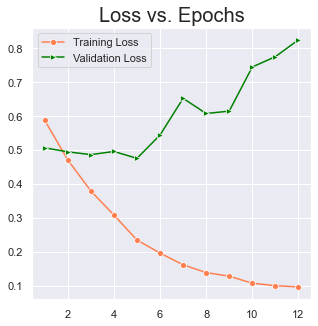

In [56]:
plot_learning_curve(h5)

In [57]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

40/40 [==============================] - 0s 8ms/step - loss: 0.4902 - accuracy: 0.8086
Testing Accuracy:  80.86274266242981


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [58]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Bidirectional(LSTM(75, recurrent_dropout=0.5)),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [59]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.41348 >|> 
 ~| Epoch: 2 | Validation Loss: 0.43821 >|> 
 ~| Epoch: 3 | Validation Loss: 0.49128 >|> 
 ~| Epoch: 4 | Validation Loss: 0.63527 >|> 
 ~| Epoch: 5 | Validation Loss: 0.67690 >|> 
 ~| Epoch: 6 | Validation Loss: 0.78350 >|> 
 ~| Epoch: 7 | Validation Loss: 0.85579 >|> 
 ~| Epoch: 8 | Validation Loss: 0.90307 >|> 

Training Done.


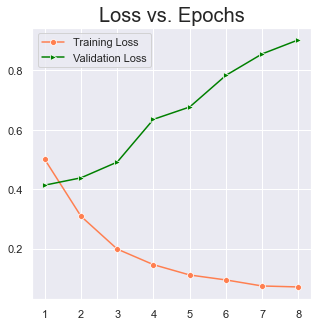

In [60]:
plot_learning_curve(h5)

In [61]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

40/40 [==============================] - 3s 62ms/step - loss: 0.4126 - accuracy: 0.8267
Testing Accuracy:  82.66666531562805


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection</span></strong></li>
</ul></h4>

In [62]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

# using 75-25 split instead of 50-50 split as we need more data to train neural nets
X_train_vec, X_test_vec, y_train_vec, y_test_vec = train_test_split(X, y, test_size=0.15, random_state=seed, stratify=y)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (7224,), 
Test dataset shape: (1275,)


In [63]:
NGRAM_RANGE = (1, 3)
TOP_K = 8500
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2


kwargs = {
    'ngram_range' : NGRAM_RANGE,
    'dtype' : 'int32',
    'strip_accents' : 'unicode',
    'decode_error' : 'replace',
    'analyzer' : TOKEN_MODE,
    'min_df' : MIN_DOC_FREQ
}
vectorizer = TfidfVectorizer(**kwargs)
X_train_vec = vectorizer.fit_transform(X_train_vec)
X_test_vec = vectorizer.transform(X_test_vec)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (7224, 21387), 
Test dataset shape: (1275, 21387)


In [64]:
from sklearn.feature_selection import SelectKBest, f_classif

# Select best k features, with feature importance measured by f_classif
# Set k as 20000 or (if number of ngrams is less) number of ngrams   
selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
selector.fit(X_train_vec, y_train_vec)
X_train_vec = selector.transform(X_train_vec).astype('float32')
X_test_vec = selector.transform(X_test_vec).astype('float32')
X_train_vec = X_train_vec.toarray()
X_test_vec = X_test_vec.toarray()

print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (7224, 8500), 
Test dataset shape: (1275, 8500)


In [65]:
model6 = Sequential([
    Dense(30, activation='relu', input_shape=X_train_vec.shape[1:]),
    Dropout(0.5),
    Dense(20, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model6.compile(
    loss = 'binary_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [66]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h6 = model6.fit(
            X_train_vec, y_train_vec,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception:
    print("Training on CPU:")
    h6 = model6.fit(
            X_train_vec, y_train_vec,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.58316 >|> 
 ~| Epoch: 2 | Validation Loss: 0.51843 >|> 
 ~| Epoch: 3 | Validation Loss: 0.46900 >|> 
 ~| Epoch: 4 | Validation Loss: 0.44677 >|> 
 ~| Epoch: 5 | Validation Loss: 0.42376 >|> 
 ~| Epoch: 6 | Validation Loss: 0.40904 >|> 
 ~| Epoch: 7 | Validation Loss: 0.40370 >|> 
 ~| Epoch: 8 | Validation Loss: 0.40825 >|> 
 ~| Epoch: 9 | Validation Loss: 0.41006 >|> 
 ~| Epoch: 10 | Validation Loss: 0.42390 >|> 
 ~| Epoch: 11 | Validation Loss: 0.42738 >|> 
 ~| Epoch: 12 | Validation Loss: 0.43645 >|> 
 ~| Epoch: 13 | Validation Loss: 0.43908 >|> 
 ~| Epoch: 14 | Validation Loss: 0.44948 >|> 

Training Done.


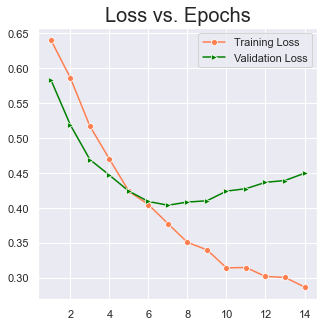

In [67]:
plot_learning_curve(h6)

In [68]:
loss, acc = model6.evaluate(X_test_vec, y_test_vec)
print("Testing Accuracy: ", acc*100)

40/40 [==============================] - 0s 3ms/step - loss: 0.3950 - accuracy: 0.8298
Testing Accuracy:  82.98039436340332


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection + Stratified KFold Training</span></strong></li>
</ul></h4>


Train dataset shape: (8159, 17004), 
Test dataset shape: (340, 17004)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70588, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00002: val_accuracy did not improve from 0.70588

Epoch 00003: val_accuracy improved from 0.70588 to 0.86471, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00004: val_accuracy did not improve from 0.86471

Epoch 00005: val_accuracy did not improve from 0.86471

Epoch 00006: val_accuracy did not improve from 0.86471

Epoch 00007: val_accuracy did not improve from 0.86471

Epoch 00008: val_accuracy did not improve from 0.86471

Epoch 00009: val_accuracy did not improve from 0.86471

Epoch 00010: val_accuracy did not improve from 0.86471


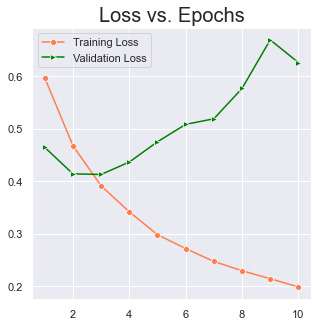

11/11 [==============================] - 0s 3ms/step - loss: 0.4127 - accuracy: 0.8647
Testing Accuracy:  86.47058606147766

Train dataset shape: (8159, 16951), 
Test dataset shape: (340, 16951)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70588, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00002: val_accuracy did not improve from 0.70588

Epoch 00003: val_accuracy improved from 0.70588 to 0.82059, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00004: val_accuracy did not improve from 0.82059

Epoch 00005: val_accuracy did not improve from 0.82059

Epoch 00006: val_accuracy did not improve from 0.82059

Epoch 00007: val_accuracy did not improve from 0.82059

Epoch 00008: val_accuracy did not improve from 0.82059

Epoch 00009: val_accuracy did not improve from 0.82059


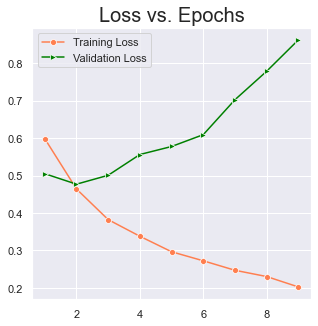

11/11 [==============================] - 0s 3ms/step - loss: 0.5007 - accuracy: 0.8206
Testing Accuracy:  82.0588231086731

Train dataset shape: (8159, 16906), 
Test dataset shape: (340, 16906)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70588, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00002: val_accuracy improved from 0.70588 to 0.83235, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00003: val_accuracy did not improve from 0.83235

Epoch 00004: val_accuracy did not improve from 0.83235

Epoch 00005: val_accuracy improved from 0.83235 to 0.83529, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00006: val_accuracy did not improve from 0.83529

Epoch 00007: val_accuracy did not improve from 0.83529

Epoch 00008: val_accuracy did not improve from 0.83529

Epoch 00009: val_accuracy did not improve from 0.8352

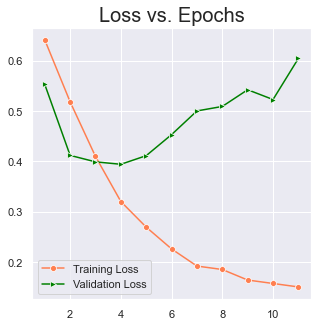

11/11 [==============================] - 0s 3ms/step - loss: 0.5226 - accuracy: 0.8441
Testing Accuracy:  84.41176414489746

Train dataset shape: (8159, 16862), 
Test dataset shape: (340, 16862)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70588, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00002: val_accuracy improved from 0.70588 to 0.82647, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00003: val_accuracy improved from 0.82647 to 0.83824, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00004: val_accuracy did not improve from 0.83824

Epoch 00005: val_accuracy did not improve from 0.83824

Epoch 00006: val_accuracy did not improve from 0.83824

Epoch 00007: val_accuracy did not improve from 0.83824

Epoch 00008: val_accuracy did not improve from 0.83824

Epoch 00009: val_accuracy did not improve from 0.838

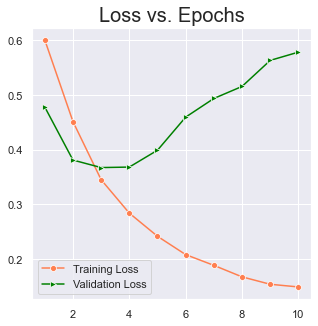

11/11 [==============================] - 0s 3ms/step - loss: 0.3674 - accuracy: 0.8382
Testing Accuracy:  83.82353186607361

Train dataset shape: (8159, 16977), 
Test dataset shape: (340, 16977)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70588, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00002: val_accuracy improved from 0.70588 to 0.86471, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00003: val_accuracy did not improve from 0.86471

Epoch 00004: val_accuracy did not improve from 0.86471

Epoch 00005: val_accuracy did not improve from 0.86471

Epoch 00006: val_accuracy did not improve from 0.86471

Epoch 00007: val_accuracy did not improve from 0.86471

Epoch 00008: val_accuracy did not improve from 0.86471

Epoch 00009: val_accuracy did not improve from 0.86471

Epoch 00010: val_accuracy did not improve from 0.86471


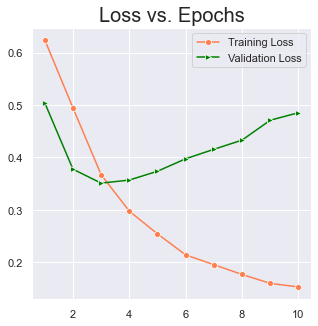

11/11 [==============================] - 0s 3ms/step - loss: 0.3777 - accuracy: 0.8647
Testing Accuracy:  86.47058606147766

Train dataset shape: (8159, 16916), 
Test dataset shape: (340, 16916)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70588, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00002: val_accuracy improved from 0.70588 to 0.83235, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00003: val_accuracy improved from 0.83235 to 0.83824, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00004: val_accuracy did not improve from 0.83824

Epoch 00005: val_accuracy did not improve from 0.83824

Epoch 00006: val_accuracy did not improve from 0.83824

Epoch 00007: val_accuracy did not improve from 0.83824

Epoch 00008: val_accuracy did not improve from 0.83824

Epoch 00009: val_accuracy did not improve from 0.838

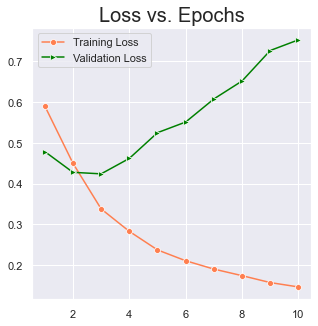

11/11 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.8382
Testing Accuracy:  83.82353186607361

Train dataset shape: (8159, 16988), 
Test dataset shape: (340, 16988)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70588, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00002: val_accuracy did not improve from 0.70588

Epoch 00003: val_accuracy improved from 0.70588 to 0.83529, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00004: val_accuracy did not improve from 0.83529

Epoch 00005: val_accuracy did not improve from 0.83529

Epoch 00006: val_accuracy did not improve from 0.83529

Epoch 00007: val_accuracy did not improve from 0.83529

Epoch 00008: val_accuracy did not improve from 0.83529

Epoch 00009: val_accuracy did not improve from 0.83529

Epoch 00010: val_accuracy did not improve from 0.83529


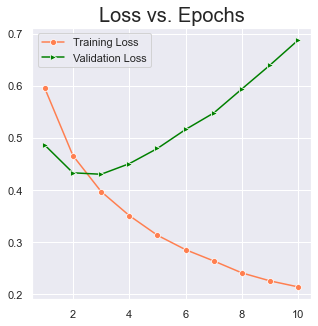

11/11 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.8353
Testing Accuracy:  83.52941274642944

Train dataset shape: (8159, 16924), 
Test dataset shape: (340, 16924)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70588, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00002: val_accuracy improved from 0.70588 to 0.84118, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00003: val_accuracy improved from 0.84118 to 0.84412, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00004: val_accuracy did not improve from 0.84412

Epoch 00005: val_accuracy did not improve from 0.84412

Epoch 00006: val_accuracy did not improve from 0.84412

Epoch 00007: val_accuracy did not improve from 0.84412

Epoch 00008: val_accuracy did not improve from 0.84412

Epoch 00009: val_accuracy did not improve from 0.844

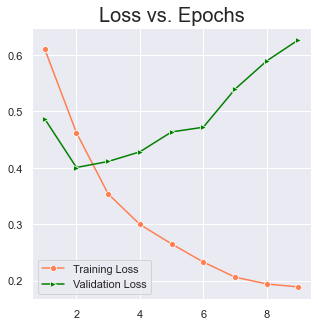

11/11 [==============================] - 0s 3ms/step - loss: 0.4113 - accuracy: 0.8441
Testing Accuracy:  84.41176414489746

Train dataset shape: (8159, 16685), 
Test dataset shape: (340, 16685)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70588, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00002: val_accuracy improved from 0.70588 to 0.82941, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00003: val_accuracy did not improve from 0.82941

Epoch 00004: val_accuracy did not improve from 0.82941

Epoch 00005: val_accuracy did not improve from 0.82941

Epoch 00006: val_accuracy did not improve from 0.82941

Epoch 00007: val_accuracy did not improve from 0.82941

Epoch 00008: val_accuracy did not improve from 0.82941

Epoch 00009: val_accuracy did not improve from 0.82941

Epoch 00010: val_accuracy did not improve from 0.82941


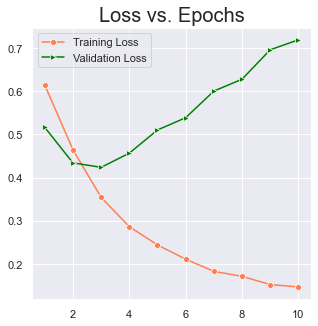

11/11 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.8294
Testing Accuracy:  82.94117450714111

Train dataset shape: (8159, 16848), 
Test dataset shape: (340, 16848)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.71765, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00002: val_accuracy improved from 0.71765 to 0.80882, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00003: val_accuracy improved from 0.80882 to 0.81471, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00004: val_accuracy did not improve from 0.81471

Epoch 00005: val_accuracy did not improve from 0.81471

Epoch 00006: val_accuracy did not improve from 0.81471

Epoch 00007: val_accuracy did not improve from 0.81471

Epoch 00008: val_accuracy did not improve from 0.81471

Epoch 00009: val_accuracy did not improve from 0.

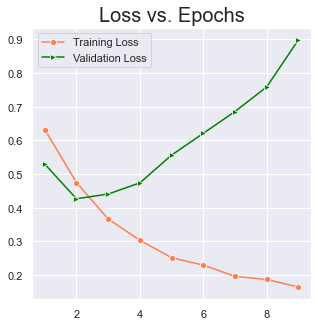

11/11 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.8147
Testing Accuracy:  81.47059082984924

Train dataset shape: (8159, 16714), 
Test dataset shape: (340, 16714)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.82647, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00003: val_accuracy improved from 0.82647 to 0.82941, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00004: val_accuracy improved from 0.82941 to 0.84118, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00005: val_accuracy did not improve from 0.84118

Epoch 00006: val_accuracy did not improve from 0.84118

Epoch 00007: val_accuracy did not improve from 0.84118

Epoch 00008: val_accuracy did n

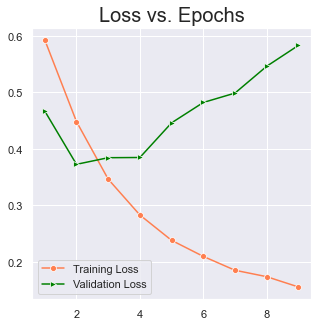

11/11 [==============================] - 0s 3ms/step - loss: 0.3848 - accuracy: 0.8412
Testing Accuracy:  84.1176450252533

Train dataset shape: (8159, 16552), 
Test dataset shape: (340, 16552)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.80000, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00003: val_accuracy improved from 0.80000 to 0.80588, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00004: val_accuracy improved from 0.80588 to 0.81176, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00005: val_accuracy did not improve from 0.81176

Epoch 00006: val_accuracy did not improve from 0.81176

Epoch 00007: val_accuracy improved from 0.81176 to 0.81765, saving model to models\binar

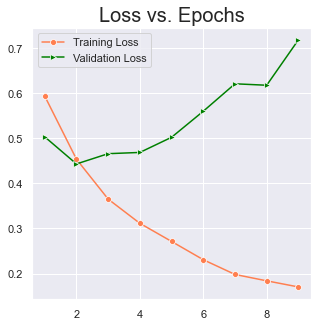

11/11 [==============================] - 0s 3ms/step - loss: 0.6211 - accuracy: 0.8176
Testing Accuracy:  81.76470398902893

Train dataset shape: (8159, 16581), 
Test dataset shape: (340, 16581)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.83235, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00003: val_accuracy improved from 0.83235 to 0.83529, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00004: val_accuracy did not improve from 0.83529

Epoch 00005: val_accuracy did not improve from 0.83529

Epoch 00006: val_accuracy did not improve from 0.83529

Epoch 00007: val_accuracy did not improve from 0.83529

Epoch 00008: val_accuracy did not improve from 0.83529

Epoch 00009: val_accuracy did not improve from 0.

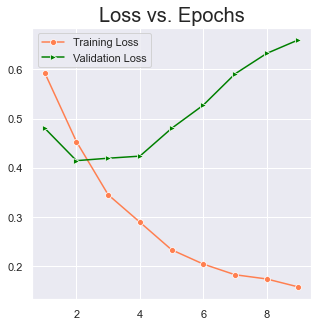

11/11 [==============================] - 0s 3ms/step - loss: 0.4193 - accuracy: 0.8353
Testing Accuracy:  83.52941274642944

Train dataset shape: (8159, 16837), 
Test dataset shape: (340, 16837)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.84412, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00003: val_accuracy improved from 0.84412 to 0.85000, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00004: val_accuracy did not improve from 0.85000

Epoch 00005: val_accuracy did not improve from 0.85000

Epoch 00006: val_accuracy did not improve from 0.85000

Epoch 00007: val_accuracy did not improve from 0.85000

Epoch 00008: val_accuracy did not improve from 0.85000

Epoch 00009: val_accuracy did not improve from 0.

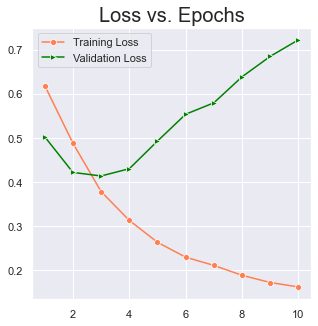

11/11 [==============================] - 0s 3ms/step - loss: 0.4135 - accuracy: 0.8500
Testing Accuracy:  85.00000238418579

Train dataset shape: (8159, 16807), 
Test dataset shape: (340, 16807)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.82941, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00003: val_accuracy improved from 0.82941 to 0.84118, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00004: val_accuracy did not improve from 0.84118

Epoch 00005: val_accuracy did not improve from 0.84118

Epoch 00006: val_accuracy did not improve from 0.84118

Epoch 00007: val_accuracy did not improve from 0.84118

Epoch 00008: val_accuracy did not improve from 0.84118

Epoch 00009: val_accuracy did not improve from 0.

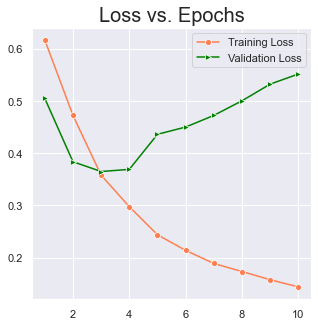

11/11 [==============================] - 0s 3ms/step - loss: 0.3648 - accuracy: 0.8412
Testing Accuracy:  84.1176450252533

Train dataset shape: (8159, 16839), 
Test dataset shape: (340, 16839)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.71765, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00002: val_accuracy improved from 0.71765 to 0.85588, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00003: val_accuracy improved from 0.85588 to 0.87059, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00004: val_accuracy did not improve from 0.87059

Epoch 00005: val_accuracy did not improve from 0.87059

Epoch 00006: val_accuracy improved from 0.87059 to 0.87353, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00007: val_accuracy improved from 0.87353 to 0.87647, saving model to models\binar

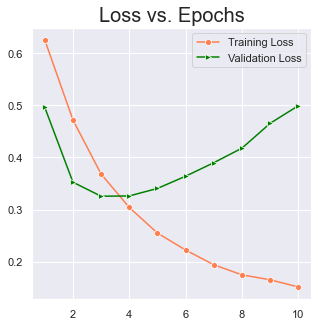

11/11 [==============================] - 0s 3ms/step - loss: 0.3898 - accuracy: 0.8765
Testing Accuracy:  87.64705657958984

Train dataset shape: (8159, 16821), 
Test dataset shape: (340, 16821)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.80000, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00003: val_accuracy improved from 0.80000 to 0.81765, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00004: val_accuracy improved from 0.81765 to 0.82941, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00005: val_accuracy did not improve from 0.82941

Epoch 00006: val_accuracy did not improve from 0.82941

Epoch 00007: val_accuracy did not improve from 0.82941

Epoch 00008: val_accuracy did n

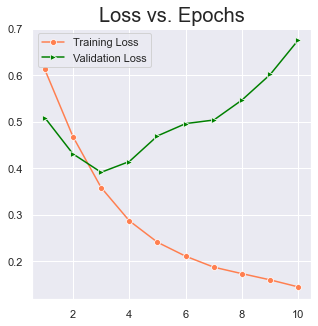

11/11 [==============================] - 0s 3ms/step - loss: 0.4144 - accuracy: 0.8294
Testing Accuracy:  82.94117450714111

Train dataset shape: (8159, 16920), 
Test dataset shape: (340, 16920)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.78824, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00003: val_accuracy improved from 0.78824 to 0.81176, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00004: val_accuracy did not improve from 0.81176

Epoch 00005: val_accuracy did not improve from 0.81176

Epoch 00006: val_accuracy did not improve from 0.81176

Epoch 00007: val_accuracy did not improve from 0.81176

Epoch 00008: val_accuracy did not improve from 0.81176

Epoch 00009: val_accuracy did not improve from 0.

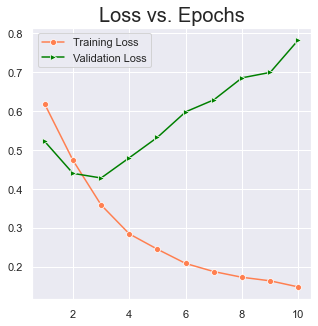

11/11 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.8118
Testing Accuracy:  81.17647171020508

Train dataset shape: (8159, 16912), 
Test dataset shape: (340, 16912)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.81176, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00003: val_accuracy did not improve from 0.81176

Epoch 00004: val_accuracy improved from 0.81176 to 0.81765, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00005: val_accuracy did not improve from 0.81765

Epoch 00006: val_accuracy did not improve from 0.81765

Epoch 00007: val_accuracy did not improve from 0.81765

Epoch 00008: val_accuracy did not improve from 0.81765

Epoch 00009: val_accuracy did not improve from 0.

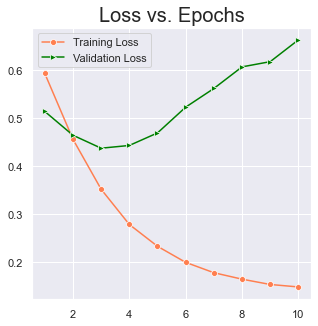

11/11 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.8176
Testing Accuracy:  81.76470398902893

Train dataset shape: (8159, 16890), 
Test dataset shape: (340, 16890)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.83235, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00003: val_accuracy improved from 0.83235 to 0.84412, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00004: val_accuracy did not improve from 0.84412

Epoch 00005: val_accuracy did not improve from 0.84412

Epoch 00006: val_accuracy did not improve from 0.84412

Epoch 00007: val_accuracy did not improve from 0.84412

Epoch 00008: val_accuracy did not improve from 0.84412

Epoch 00009: val_accuracy did not improve from 0.

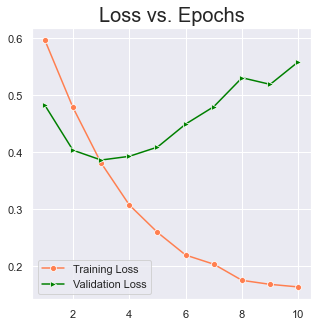

11/11 [==============================] - 0s 3ms/step - loss: 0.3864 - accuracy: 0.8441
Testing Accuracy:  84.41176414489746

Train dataset shape: (8159, 16825), 
Test dataset shape: (340, 16825)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.81176, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00003: val_accuracy improved from 0.81176 to 0.81471, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00004: val_accuracy improved from 0.81471 to 0.82647, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00005: val_accuracy did not improve from 0.82647

Epoch 00006: val_accuracy improved from 0.82647 to 0.83529, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00007: 

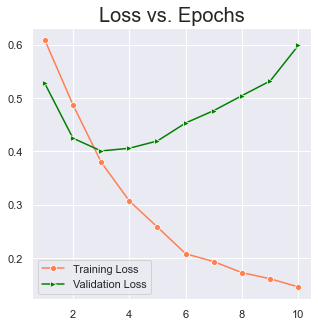

11/11 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.8353
Testing Accuracy:  83.52941274642944

Train dataset shape: (8159, 16511), 
Test dataset shape: (340, 16511)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00002: val_accuracy did not improve from 0.70294

Epoch 00003: val_accuracy improved from 0.70294 to 0.80294, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00004: val_accuracy did not improve from 0.80294

Epoch 00005: val_accuracy did not improve from 0.80294

Epoch 00006: val_accuracy did not improve from 0.80294

Epoch 00007: val_accuracy did not improve from 0.80294

Epoch 00008: val_accuracy did not improve from 0.80294

Epoch 00009: val_accuracy did not improve from 0.80294


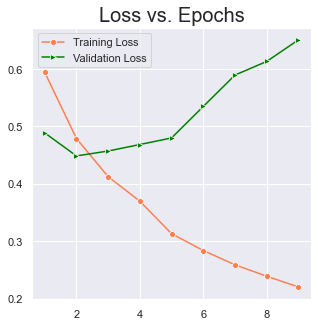

11/11 [==============================] - 0s 3ms/step - loss: 0.4571 - accuracy: 0.8029
Testing Accuracy:  80.29412031173706

Train dataset shape: (8159, 16929), 
Test dataset shape: (340, 16929)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.81471, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00003: val_accuracy improved from 0.81471 to 0.83235, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00004: val_accuracy did not improve from 0.83235

Epoch 00005: val_accuracy did not improve from 0.83235

Epoch 00006: val_accuracy did not improve from 0.83235

Epoch 00007: val_accuracy improved from 0.83235 to 0.83529, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00008: val_accuracy impro

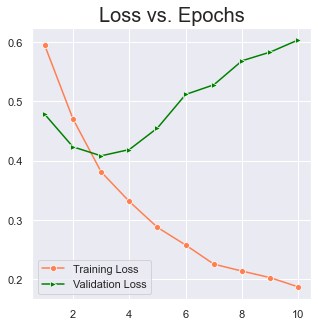

11/11 [==============================] - 0s 3ms/step - loss: 0.5682 - accuracy: 0.8412
Testing Accuracy:  84.1176450252533

Train dataset shape: (8159, 15718), 
Test dataset shape: (340, 15718)

Features Train dataset shape: (8159, 15000), 
FeaturesTest dataset shape: (340, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70294, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00002: val_accuracy improved from 0.70294 to 0.79706, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00003: val_accuracy improved from 0.79706 to 0.81176, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00004: val_accuracy improved from 0.81176 to 0.81765, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00005: val_accuracy did not improve from 0.81765

Epoch 00006: val_accuracy improved from 0.81765 to 0.82353, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00007: v

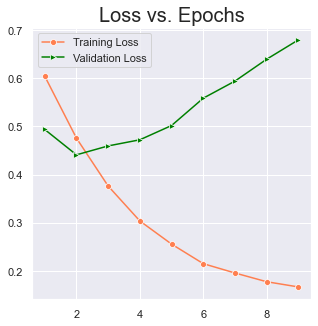

11/11 [==============================] - 0s 3ms/step - loss: 0.6795 - accuracy: 0.8265
Testing Accuracy:  82.64706134796143

Train dataset shape: (8160, 16731), 
Test dataset shape: (339, 16731)

Features Train dataset shape: (8160, 15000), 
FeaturesTest dataset shape: (339, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.70501, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00002: val_accuracy improved from 0.70501 to 0.80531, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00003: val_accuracy improved from 0.80531 to 0.82596, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00004: val_accuracy improved from 0.82596 to 0.83186, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00005: val_accuracy did not improve from 0.83186

Epoch 00006: val_accuracy did not improve from 0.83186

Epoch 00007: val_accuracy did not improve from 0.83186

Epoch 00008: val_accuracy did n

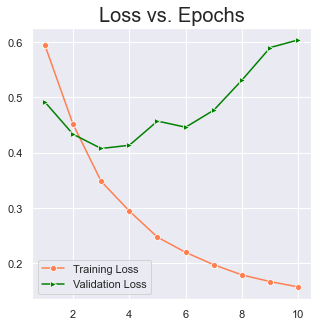

11/11 [==============================] - 0s 3ms/step - loss: 0.5899 - accuracy: 0.8348
Testing Accuracy:  83.48082304000854


In [69]:
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_extraction.text import TfidfVectorizer


def get_model_name(k):
    return f'model_{k}.h5'

NUM_SPLITS = 25
EPOCHS = 15
save_dir = Path('./models/binary_classfiier/dl/merged_descr')
fold_var = 1
NGRAM_RANGE = (1, 2)
TOP_K = 15000
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2
NUM_CLASSES = 2

kwargs = {
        'ngram_range' : NGRAM_RANGE,
        'dtype' : 'int32',
        'strip_accents' : 'unicode',
        'decode_error' : 'replace',
        'analyzer' : TOKEN_MODE,
        'min_df' : MIN_DOC_FREQ
    }

val_accs = []
skf = StratifiedKFold(n_splits=NUM_SPLITS, shuffle=False, random_state=seed)

for train_indices, test_indices in skf.split(X, y):
    X_train_split, X_test_split = X[train_indices], X[test_indices]
    y_train_split, y_test_split = y[train_indices], y[test_indices]
    vectorizer = TfidfVectorizer(**kwargs)
    X_train_vec = vectorizer.fit_transform(X_train_split)
    X_test_vec = vectorizer.transform(X_test_split)
    print(f"\nTrain dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

    selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
    selector.fit(X_train_vec, y_train_split)
    X_train_vec = selector.transform(X_train_vec).astype('float32')
    X_test_vec = selector.transform(X_test_vec).astype('float32')
    X_train_vec = X_train_vec.toarray()
    X_test_vec = X_test_vec.toarray()

    print(f"\nFeatures Train dataset shape: {X_train_vec.shape}, \nFeaturesTest dataset shape: {X_test_vec.shape}")
    model_ = None
    model_ = Sequential([   
        Dense(30, activation='relu', input_shape=X_train_vec.shape[1:]),
        Dropout(0.5),
        Dense(20, activation='relu'),
        Dropout(0.5),
        Dense(10, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    model_.compile(
        loss = 'binary_crossentropy',
        optimizer = 'adam',
        metrics = ['accuracy']
    )
    
    checkpoint = tensorflow.keras.callbacks.ModelCheckpoint(save_dir / get_model_name(fold_var),
                                                            monitor='val_accuracy',
                                                            verbose=1,
                                                            save_best_only=True,
                                                            mode='max')

    h_ = model_.fit(
            X_train_vec, y_train_split,
            validation_data = (X_test_vec, y_test_split),  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [checkpoint, early_stop],
            verbose = False)
    
    model_.load_weights(save_dir / get_model_name(fold_var))
    plot_learning_curve(h_)
    loss, acc = model_.evaluate(X_test_vec, y_test_split)
    print("Testing Accuracy: ", acc*100)
    val_accs.append(acc)
    tensorflow.keras.backend.clear_session()
    fold_var += 1

In [70]:
print("Testing Accuracy: ", np.mean(val_accs)*100)   # average k fold accuracy

Testing Accuracy:  83.59805631637573


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Metrics: </span></strong></li>
</ul></h3>

<table style="width:100%">
  <tr>
    <th>Model</th>
    <th>Test Accuracy</th>
  </tr>
  <tr>
    <td>Simple Feed-Forward Net using Embedding Layer</td>
    <td>81.88%</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Batch Norm</td>
    <td>75.22%</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Dropout</td>
    <td>80.94%</td>
  </tr>
    <tr>
    <td>Feed-Forward NN + Pre-trained GloVe embeddings</td>
    <td>78.04%</td>
  </tr>
  <tr>
    <td>LSTM</td>
    <td>72.71%</td>
  </tr>
    
  <tr>
    <td>Bi-Directional LSTM</td>
    <td>81.18%</td>
  </tr>
<tr>
    <td>Convolution Blocks (Dimensionality Reduction) + LSTM</td>
    <td>80.86%</td>
  </tr>
    <tr>
    <td>Convolution Blocks (Dimensionality Reduction) + Bi-LSTM</td>
    <td>82.67%</td>
  </tr>
<tr>
    <td>TfIdf Vectors + Feature Selection + Feed-forward Neural Net</td>
    <td>82.98%</td>
  </tr>
<tr>
    <td>Stratified KFold Validation + TfIdf Vectors + Feature Selection + +Feed-forward Neural Net</td>
    <td>83.60%</td>
  </tr>
</table>

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Data Augmentation with MarianMT using Back-Translation</span></strong></li>
</ul></h1>

### Initialize the models for English <-> Foreign Languages


In [1]:
import warnings
import random
warnings.filterwarnings('ignore')

import pandas as pd
from tqdm import trange
from transformers import MarianMTModel, MarianTokenizer

target_model_name = 'Helsinki-NLP/opus-mt-en-ROMANCE'
target_tokenizer = MarianTokenizer.from_pretrained(target_model_name)
target_model = MarianMTModel.from_pretrained(target_model_name)

en_model_name = 'Helsinki-NLP/opus-mt-ROMANCE-en'
en_tokenizer = MarianTokenizer.from_pretrained(en_model_name)
en_model = MarianMTModel.from_pretrained(en_model_name)

In [2]:
def translate(texts, model, tokenizer, language="fr"):
    """Prepare the text data into appropriate format for the model"""
    template = lambda text: f"{text}" if language == "en" else f">>{language}<< {text}"
    src_texts = [template(text) for text in texts]

    # Tokenize the texts
    encoded = tokenizer.prepare_seq2seq_batch(src_texts,
                                              return_tensors='pt')
    
    # Generate translation using model
    translated = model.generate(**encoded)

    # Convert the generated tokens indices back into text
    translated_texts = tokenizer.batch_decode(translated, skip_special_tokens=True)
    
    return translated_texts

In [3]:
def back_translate(texts, source_lang="en", target_lang="fr", verbose=False):
    """translate to target language and back to source language"""
    target_lang_texts = translate(texts,
                                  target_model,
                                  target_tokenizer,
                                  language=target_lang)
    if verbose:
        print('Intermediate Target Language texts:')
        print(target_lang_texts)
    # Translate from target language back to source language
    back_translated_texts = translate(target_lang_texts, en_model, en_tokenizer, 
                                      language=source_lang)
    
    back_translated_texts = [t for t in back_translated_texts if t not in texts]
    return back_translated_texts

### Perform Augmentation using English <-> Spanish

In [4]:
en_texts = ['Cannot access website', 'I hated the food', "I can't login to my vpn"]

In [5]:
aug_texts = back_translate(en_texts, source_lang="en", target_lang="es", verbose=True)
print(aug_texts)

Intermediate Target Language texts:
['No se puede acceder al sitio web', 'Odiaba la comida.', 'No puedo acceder a mi vpn']
['Cannot access the website', 'I hated food.', "I can't access my vpn"]


### Perform Augmentation using English <-> Italian

In [6]:
aug_texts = back_translate(en_texts, source_lang="en", target_lang="it", verbose=True)
print(aug_texts)

Intermediate Target Language texts:
['Impossibile accedere al sito web', 'Odiavo il cibo.', 'Non posso accedere al mio vpn']
['Unable to access website', 'I hated food.', "I can't access my vpn"]


### Perform Augmentation using English <-> French



In [7]:
aug_texts = back_translate(en_texts, source_lang="en", target_lang="fr", verbose=True)
print(aug_texts)

Intermediate Target Language texts:
["Impossible d'accéder au site Web", "J'ai détesté la nourriture.", 'Je ne peux pas me connecter à mon vpn']
['Unable to access website', 'I hated food.', "I can't connect to my vpn"]


In [8]:
dataset = pd.read_csv('./data/preprocessed_data_groups.csv')

In [9]:
minority_class_descr = dataset[dataset.label == 1].translated_description.tolist()

In [10]:
len(minority_class_descr)

2514

In [11]:
size = 3
augmented = list()
for i in trange(len(minority_class_descr)//size):
    subset = minority_class_descr[i*size:(i+1)*size]
    augmented.append(back_translate(subset, source_lang="en", target_lang="es"))
    augmented.append(back_translate(subset, source_lang="en", target_lang="it"))
    augmented.append(back_translate(subset, source_lang="en", target_lang="fr"))

len(augmented)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 838/838 [10:33:31<00:00, 45.36s/it]


2514

In [12]:
augmented = [i for j in augmented for i in j]
augmented = [i for i in augmented if i not in minority_class_descr]
len(augmented)

7202

In [13]:
dataset.label.value_counts()

0    5985
1    2514
Name: label, dtype: int64

In [14]:
pd.Series(augmented)

0       event critical hostname company with value mou...
1       duplicate soft network two devices try sharing...
2       problem solving printer work printer replaceme...
3       critical event hostname company with value mou...
4       duplicate delicate network two devices test sh...
                              ...                        
7197    no this operation impossible access macne util...
7198    multiple pc can not be opened versceden prgram...
7199              come receive e-mail send zz mail advice
7200    no this operation inaccessible macne utility f...
7201       multiple pc can not be opened prgramdntyme cnc
Length: 7202, dtype: object

In [15]:
augmented_df = pd.DataFrame(columns=dataset.columns)
augmented_df.translated_description = augmented
augmented_df.label = 1
augmented_df.sample(7)

,translated_description,keywords,short_description,description,group,cleaned_description,cleaned_short_description,merged_description,char_length,word_length,short_char_length,short_word_length,language,language_confidence,label
3264,reset password sid sid bubble user kindly make...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1296,hostname volume tag dat hostname server eafe s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4760,work hr payroll n or work programmer failure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
5656,The Commission has adopted a proposal for a Co...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3027,appear pdf output engineering tool dear bhughj...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
779,system system system system system system syst...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4860,work edit user hang forever user admin managem...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [16]:
augmented_df = pd.concat([dataset, augmented_df])

In [17]:
augmented_df.shape

(15701, 15)

In [18]:
group0_descr = dataset[dataset.label == 0].translated_description.tolist()
group1_descr = dataset[dataset.label == 1].translated_description.tolist()
len(group0_descr), len(group1_descr)

(5985, 2514)

In [19]:
group0_sample = random.sample(group0_descr, len(group1_descr))

In [20]:
len(group0_sample)

2514

In [21]:
size = 3
augmented = list()
for i in trange(len(group0_sample)//size):
    subset = group0_sample[i*size:(i+1)*size]
    augmented.append(back_translate(subset, source_lang="en", target_lang="es"))
    augmented.append(back_translate(subset, source_lang="en", target_lang="it"))
    augmented.append(back_translate(subset, source_lang="en", target_lang="fr"))

len(augmented)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 838/838 [2:35:41<00:00, 11.15s/it]


2514

In [22]:
augmented = [i for j in augmented for i in j]
augmented = [i for i in augmented if i not in group0_sample]
len(augmented)

7124

In [23]:
augmented_df2 = pd.DataFrame(columns=augmented_df.columns)
augmented_df2.translated_description = augmented
augmented_df2.label = 0
augmented_df2.sample(7)

,translated_description,keywords,short_description,description,group,cleaned_description,cleaned_short_description,merged_description,char_length,word_length,short_char_length,short_word_length,language,language_confidence,label
2868,work work failure work programmer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
6149,the user needs an access engineering tool,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2914,Account lock,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1608,unlock songyody user erp,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3971,erp sid password reset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
6776,intermittent computer shutdown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1443,problem identifier check user details name che...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [24]:
augmented_df = pd.concat([augmented_df, augmented_df2])

In [25]:
augmented_df.shape

(22825, 15)

In [26]:
augmented_df.to_csv('./data/augmented_data.csv', index=None)

In [28]:
augmented_df.label.value_counts()

0    13109
1     9716
Name: label, dtype: int64

### OverSampling the minority class to balance the label distribution

In [40]:
import numpy as np
from imblearn.over_sampling import RandomOverSampler

In [41]:
X = np.array(augmented_df.translated_description).reshape(-1, 1)
y = np.array(augmented_df.label).reshape(-1, 1)
X.shape, y.shape

((22825, 1), (22825, 1))

In [42]:
oversampler = RandomOverSampler(sampling_strategy='minority')

X_upsampled, y_upsampled = oversampler.fit_resample(X, y)
X_upsampled = np.squeeze(X_upsampled)
y_upsampled = np.squeeze(y_upsampled)
X_upsampled.shape, y_upsampled.shape

((26218,), (26218,))

In [43]:
X_upsampled[0], y_upsampled[0]

('verify user detail name check user name ad reset password advise user login check caller confirm able login issue resolve',
 0)

In [44]:
upsampled_df = pd.DataFrame({"translated_description": X_upsampled, "label": y_upsampled})
upsampled_df.shape

(26218, 2)

In [45]:
upsampled_df.label.value_counts()  # BALANCED DATA!

1    13109
0    13109
Name: label, dtype: int64

In [46]:
upsampled_df.to_csv('./data/augmented_upsampled_data.csv', index=None)

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">ML Models</span></strong></li>
</ul></h1>

<h4>
<ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">OBJECTIVE:</span></strong></li>
</ul>
<p><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use the text data to experiment with various Machine Learning algorithms to build a vanilla binary classifier.</span></p>
    </h4>

In [1]:
import warnings

warnings.filterwarnings('ignore')

import random
import re
from string import punctuation

import matplotlib.pyplot as plt
import nltk
import numpy as np
import pandas as pd
import seaborn as sns
from lightgbm import LGBMClassifier
from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer  # word stemmer class
from nltk.tokenize import word_tokenize
from scipy.stats import zscore
from sklearn import metrics
from sklearn.ensemble import (AdaBoostClassifier, GradientBoostingClassifier,
                              RandomForestClassifier)
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, classification_report,
                             confusion_matrix, f1_score,
                             precision_recall_fscore_support)
from sklearn.model_selection import (GridSearchCV, KFold, RandomizedSearchCV,
                                     StratifiedKFold, cross_val_score,
                                     train_test_split)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import binarize
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from tqdm import tqdm
from xgboost import XGBClassifier

tqdm.pandas()
nltk.download('words')

words = set(nltk.corpus.words.words())
nltk.download('stopwords')
nltk.download('wordnet')
lemma = WordNetLemmatizer()
%matplotlib inline
sns.set()

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
#importing the data
data = pd.read_csv('./data/augmented_upsampled_data.csv')
data.sample(5)

,translated_description,label
16651,drive requires hostname team corporate governa...,0
22080,erp logon balance error cannot be launched,0
6608,skype let sign say address type valid,0
26203,request ns front cd aiming to evaluate theft c...,1
21241,error log skype certificate impossible,0


In [3]:
# reproducibility
seed = 7
random.seed(seed)

In [4]:
import re

def normalizer(text):
    text = " ".join(filter(lambda x: x[0]!= '@' , text.split()))
    text = re.sub('[^a-zA-Z]', ' ', text)
    text = text.lower()
    text = re.sub(' +', ' ', text).strip()
    text = text.split()
    text = [words for words in text if not words in set(stopwords.words('english'))]
    text = [lemma.lemmatize(word) for word in text]
    
    text = " ".join(text)
    return text

In [5]:
data['ml_feature'] = data['translated_description'].progress_apply(normalizer)

100%|███████████████████████████████████████████████████████████████████████████| 26218/26218 [01:16<00:00, 341.21it/s]


In [6]:
data.sample(5)

,translated_description,label,ml_feature
19658,Unable to ap remote eu remote wle na remote fj...,0,unable ap remote eu remote wle na remote fjaqb...
16909,lockout access window,0,lockout access window
17789,work work failure work programmer work,0,work work failure work programmer work
6051,zeitwirtschaft seit uhr morgens sind fur wer...,1,zeitwirtschaft seit uhr morgen sind fur werk g...
12932,Sid error in process erp kis kis record miss s...,1,sid error process erp ki ki record miss sf tra...


In [7]:
data['ml_feature'][0]

'verify user detail name check user name ad reset password advise user login check caller confirm able login issue resolve'

In [8]:
#remover duplicate words in a sentence
def uniquify(string):
    output = []
    seen = set()
    for word in string.split():
        if word not in seen:
            output.append(word)
            seen.add(word)
    return ' '.join(output)

In [9]:
data['ml_feature'] = data['ml_feature'].progress_apply(uniquify)

100%|████████████████████████████████████████████████████████████████████████| 26218/26218 [00:00<00:00, 222184.59it/s]


In [10]:
data['ml_feature'][0]

'verify user detail name check ad reset password advise login caller confirm able issue resolve'

In [11]:
data['label'].value_counts(normalize=True) * 100

1    50.0
0    50.0
Name: label, dtype: float64

#### Data pre-processing 

In [12]:
from sklearn import preprocessing

le = preprocessing.LabelEncoder()
data["label_encoded"] = le.fit_transform(data["label"])
y_classes_len = len(le.classes_)
le.classes_
print(y_classes_len)

2


In [13]:
def mytokenizer(x):
    return [y for y in x.split() if len(y) > 2]

In [14]:
vec = CountVectorizer(tokenizer=mytokenizer, min_df=0.005)
X = vec.fit_transform(data['ml_feature'])
df = pd.DataFrame(X.toarray(), columns=vec.get_feature_names_out())

In [15]:
df

,abende,able,access,account,action,active,add,additional,address,advice,...,window,without,wle,work,workflow,working,would,write,wrong,yesterday
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26213,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
26214,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
26215,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
26216,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [16]:
s1 = pd.Series(data['label_encoded'], name="label_encoded")

In [17]:
df1 = df.reset_index(drop=True)
s1 = s1.reset_index(drop=True)

In [18]:
result = pd.concat([df1, s1], axis=1)

In [19]:
result.sample(5)

,abende,able,access,account,action,active,add,additional,address,advice,...,without,wle,work,workflow,working,would,write,wrong,yesterday,label_encoded
15832,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3448,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5537,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
25291,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
13161,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [20]:
result = result.loc[:,~result.columns.duplicated()]

In [21]:
result.sample(5)

,abende,able,access,account,action,active,add,additional,address,advice,...,without,wle,work,workflow,working,would,write,wrong,yesterday,label_encoded
14867,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4697,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
19313,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
24686,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
14882,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [22]:
#creating a copy of the train data and seperating the target column and the predictor variables

X = result.drop(['label_encoded'],axis=1)
y = result['label_encoded']
X.shape, y.shape

((26218, 441), (26218,))

In [23]:
# splitting data training dataset into train and test set for independent attributes
X_train, X_test, Y_train, Y_test = train_test_split(X,y, test_size=.30,  random_state=seed)

In [24]:
# Initializaing various classification algorithms with normal dataset and choosing the best model based on auc score for tuning

models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("GBT", GradientBoostingClassifier()))
models.append(("XGB", XGBClassifier(verbosity=0)))
models.append(("LightGBM",LGBMClassifier()))

#testing models
results = []
names = []

for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring='roc_auc_ovo', n_jobs=-1)
    results.append(cv_results)
    names.append(name)
    msg = '%s: %f%% (%f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    print(msg)

LR: 82.802510% (0.962969%)
KNN: 90.203198% (0.583161%)
GNB: 74.311441% (0.996235%)
DT: 89.691339% (0.477348%)
RF: 95.942385% (0.301543%)
GBT: 82.474512% (0.745963%)
XGB: 90.005724% (0.799015%)
LightGBM: 88.262068% (0.721757%)


#### LightGBM with RandomsearchCV

In [25]:
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform

In [26]:
param_test ={'num_leaves': sp_randint(6, 50), 
             'min_child_samples': sp_randint(100, 500), 
             'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
             'subsample': sp_uniform(loc=0.2, scale=0.8), 
             'colsample_bytree': sp_uniform(loc=0.4, scale=0.6),
             'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
             'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100],
             'scale_pos_weight':[1,2,6,12]}

sample = 100

#n_estimators is set to a "large value". The actual number of trees build will depend on early stopping and 2000 define only the absolute maximum
lgb = LGBMClassifier(max_depth=-1, random_state=seed, silent=True, metric='logloss', n_jobs=-1, n_estimators=2000)
gs = RandomizedSearchCV(estimator=lgb,
                        param_distributions=param_test, 
                        n_iter=sample,
                        cv=5,
                        refit=True,
                        random_state=seed,
                        verbose=True)

gs.fit(X_train, Y_train)
gs.best_params_

Fitting 5 folds for each of 100 candidates, totalling 500 fits


{'colsample_bytree': 0.6751685445687777,
 'min_child_samples': 140,
 'min_child_weight': 0.1,
 'num_leaves': 24,
 'reg_alpha': 0.1,
 'reg_lambda': 20,
 'scale_pos_weight': 2,
 'subsample': 0.4946857565935163}

In [27]:
lgb = LGBMClassifier(colsample_bytree=gs.best_params_['colsample_bytree'],
                   min_child_samples=gs.best_params_['min_child_samples'],
                   min_child_weight=gs.best_params_['min_child_weight'],
                   num_leaves=gs.best_params_['num_leaves'],
                   reg_alpha=gs.best_params_['reg_alpha'],
                   reg_lambda=gs.best_params_['reg_lambda'],
                   scale_pos_weight=gs.best_params_['scale_pos_weight'],
                   subsample=gs.best_params_['subsample'])
lgb.fit(X_train, Y_train)

LGBMClassifier(colsample_bytree=0.6751685445687777, min_child_samples=140,
               min_child_weight=0.1, num_leaves=24, reg_alpha=0.1,
               reg_lambda=20, scale_pos_weight=2, subsample=0.4946857565935163)

In [28]:
modellgb1 = lgb.score(X_train, Y_train)
print('Accuracy Score of Training Data: ', modellgb1)

Accuracy Score of Training Data:  0.7276591107236269


In [29]:
y_predictlg1= lgb.predict(X_test)
modellg1 = accuracy_score(Y_test, y_predictlg1)
print('Accuracy Score of Test Data:', modellg1)

Accuracy Score of Test Data: 0.7140859394863972


In [30]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(Y_test, y_predictlg1, labels=[0,1]))

Classification Report
              precision    recall  f1-score   support

           0       0.86      0.51      0.64      3922
           1       0.65      0.92      0.76      3944

    accuracy                           0.71      7866
   macro avg       0.76      0.71      0.70      7866
weighted avg       0.76      0.71      0.70      7866



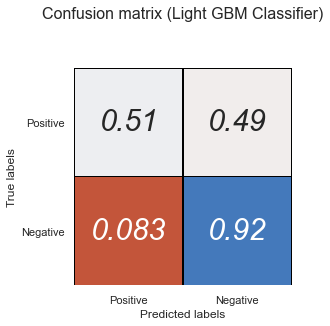

In [31]:
def plot_confusion_matrix(y_true, y_pred, ax, class_names  = ['Positive', 'Negative'], vmax=None,
                           normalized=True, title='Confusion matrix'):
    """
    Helper fuction to generate a clean Confusion Matrix using seaborn library.
    y_true: True labels, y_pred: Model Predictions, class_names: Override if needed
    normalized: True, gives the proportions instead of absolute numbers
    """
    matrix = confusion_matrix(y_true,y_pred)
    if normalized:
        matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]
    annot_kws = {'fontsize':30, 
                'fontstyle': 'italic'}
    sns.heatmap(matrix, vmax=vmax, annot=True,  annot_kws = annot_kws,
                square=True, ax=ax, cbar=False,
                cmap=sns.diverging_palette(20, 250, as_cmap=True), 
                linecolor='black', linewidths=0.5,
                xticklabels=class_names)
    ax.set_title(title, y=1.20, fontsize=16)
    ax.set_ylabel('True labels', fontsize=12)
    ax.set_xlabel('Predicted labels', y=1.10, fontsize=12)
    ax.set_yticklabels(class_names, rotation=0)
    
fig, axis1 = plt.subplots(nrows=1, ncols=1)

plot_confusion_matrix(Y_test, y_predictlg1, ax=axis1, title='Confusion matrix (Light GBM Classifier)')

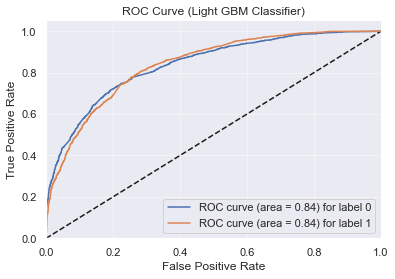

In [33]:
def plot_multiclass_roc(clf, X_test, y_test, n_classes, figsize=(17, 6), title='ROC Curve'):
    y_score = clf.predict_proba(X_test)

    # structures
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    # calculate dummies once
    y_test_dummies = pd.get_dummies(y_test, drop_first=False).values
    for i in range(n_classes):
        fpr[i], tpr[i], _ = metrics.roc_curve(y_test_dummies[:, i], y_score[:, i])
        roc_auc[i] = metrics.auc(fpr[i], tpr[i])

    # roc for each class
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot([0, 1], [0, 1], 'k--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(title)
    for i in range(n_classes):
        ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for label %i' % (roc_auc[i], i))
    ax.legend(loc="best")
    ax.grid(alpha=.4)
    sns.despine()
    plt.savefig('ROC_Curve_RF.png')
    plt.show()

plot_multiclass_roc(lgb, X_test, Y_test, n_classes=2, figsize=(6, 4), title='ROC Curve (Light GBM Classifier)')

#### XGBoost with RandomsearchCV

In [34]:
xgb_para = {"learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
            "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
            "min_child_weight" : [ 1, 3, 5, 7 ],
            "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
            "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ] 
           }

xgb = XGBClassifier()
xgb_hy = RandomizedSearchCV(estimator=xgb,
                            param_distributions=xgb_para,
                            cv=5,
                            verbose=2,
                            random_state=seed,
                            n_jobs=-1)

xgb_hy.fit(X_train, Y_train)
xgb_hy.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[17:29:00] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


{'min_child_weight': 3,
 'max_depth': 12,
 'learning_rate': 0.3,
 'gamma': 0.1,
 'colsample_bytree': 0.7}

In [35]:
xgb=XGBClassifier(min_child_weight=xgb_hy.best_params_['min_child_weight'],
                  max_depth=xgb_hy.best_params_['max_depth'],
                  learning_rate=xgb_hy.best_params_['learning_rate'],
                  gamma=xgb_hy.best_params_['gamma'],
                  colsample_bytree=xgb_hy.best_params_['colsample_bytree'],
                  random_state=seed)

xgb.fit(X_train,Y_train)

[17:29:04] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, gamma=0.1, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.3, max_delta_step=0, max_depth=12,
              min_child_weight=3, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=7,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [36]:
modelxgb_score = xgb.score(X_train,Y_train)
print('Accuracy Score of Training Data: ', modelxgb_score)

Accuracy Score of Training Data:  0.8717306015693113


In [37]:
y_predictxg = xgb.predict(X_test)
modelxg_score = accuracy_score(Y_test, y_predictxg)
print('Accuracy Score of Test Data:', modelxg_score)

Accuracy Score of Test Data: 0.8396898042206967


In [38]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(Y_test, y_predictxg, labels=[0,1,2]))

Classification Report
              precision    recall  f1-score   support

           0       0.85      0.82      0.84      3922
           1       0.83      0.86      0.84      3944
           2       0.00      0.00      0.00         0

   micro avg       0.84      0.84      0.84      7866
   macro avg       0.56      0.56      0.56      7866
weighted avg       0.84      0.84      0.84      7866



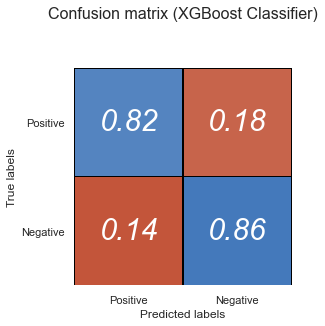

In [39]:
fig, axis1 = plt.subplots(nrows=1, ncols=1)
plot_confusion_matrix(Y_test, y_predictxg, ax=axis1, title='Confusion matrix (XGBoost Classifier)')

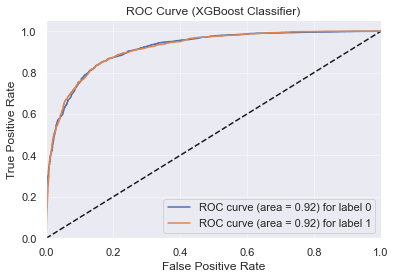

In [40]:
plot_multiclass_roc(xgb, X_test, Y_test, n_classes=2, figsize=(6, 4), title='ROC Curve (XGBoost Classifier)')

#### Random forest with RandomsearchCV

In [41]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 500, num = 50)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = range(2,100,5)
# Minimum number of samples required at each leaf node
min_samples_leaf = range(1,100,10)
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'criterion':['gini','entropy']}

In [42]:
rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator=rf,
                               param_distributions=random_grid,
                               cv=5,
                               verbose=2,
                               random_state=seed,
                               n_jobs=-1)
rf_random.fit(X_train, Y_train)
rf_random.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits


{'n_estimators': 279,
 'min_samples_split': 42,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 90,
 'criterion': 'gini',
 'bootstrap': False}

In [43]:
rf_grid1 = RandomForestClassifier(n_estimators=rf_random.best_params_['n_estimators'],
                                  min_samples_split=rf_random.best_params_['min_samples_split'],
                                  min_samples_leaf=rf_random.best_params_['min_samples_leaf'],
                                  max_features=rf_random.best_params_['max_features'],
                                  max_depth=rf_random.best_params_['max_depth'],
                                  criterion=rf_random.best_params_['criterion'],
                                  bootstrap=rf_random.best_params_['bootstrap'])
rf_grid1.fit(X_train, Y_train)

RandomForestClassifier(bootstrap=False, max_depth=90, max_features='sqrt',
                       min_samples_split=42, n_estimators=279)

In [44]:
modelrfg1_score = rf_grid1.score(X_train, Y_train)
print('Accuracy Score of Training Data: ', modelrfg1_score)

Accuracy Score of Training Data:  0.9145597210113339


In [45]:
y_predictrfg1 = rf_grid1.predict(X_test)
modelrfg1_score = accuracy_score(Y_test, y_predictrfg1)
print('Accuracy Score of Test Data:', modelrfg1_score)

Accuracy Score of Test Data: 0.8718535469107551


In [46]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(Y_test, y_predictrfg1, labels=[0,1,2]))

Classification Report
              precision    recall  f1-score   support

           0       0.89      0.85      0.87      3922
           1       0.85      0.90      0.88      3944
           2       0.00      0.00      0.00         0

   micro avg       0.87      0.87      0.87      7866
   macro avg       0.58      0.58      0.58      7866
weighted avg       0.87      0.87      0.87      7866



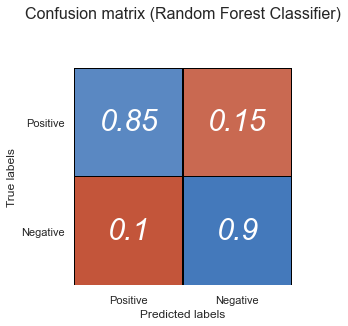

In [47]:
fig, axis1 = plt.subplots(nrows=1, ncols=1)
plot_confusion_matrix(Y_test, y_predictrfg1, ax=axis1, title='Confusion matrix (Random Forest Classifier)')

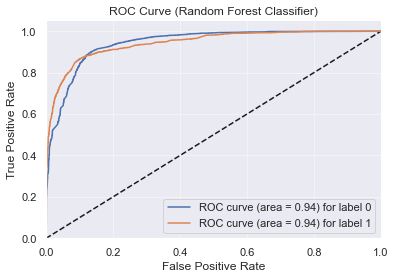

In [48]:
plot_multiclass_roc(rf_grid1, X_test, Y_test, n_classes=2, figsize=(6, 4), title='ROC Curve (Random Forest Classifier)')

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Resultant Metrics: </span></strong></li>
</ul></h3>

<table style="width:100%">
  <tr>
    <th>Model</th>
    <th>Test Accuracy</th>
  </tr>
  <tr>
    <td>LightGBM Classifier</td>
    <td>71.41%</td>
  </tr>
<tr>
    <td>XGBoost Classifier</td>
    <td>83.97%</td>
  </tr>
    <tr>
    <td>Random Forest Classifier</td>
    <td>87.19%</td>
  </tr>
</table>

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Augmented Data DL Binary Classifier</span></strong></li>
</ul></h1>

<h4>
<ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">OBJECTIVE:</span></strong></li>
</ul>
<p><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use the text data to build a deep-learning based binary classifier.</span></p>
    </h4>

In [1]:
# imports

import warnings
warnings.filterwarnings('ignore')

import os
import math
import random
from time import time
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import defaultdict, Counter
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud, STOPWORDS
import tensorflow

tqdm.pandas()
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

In [2]:
# reproducibility
seed = 7
random.seed(seed)
tensorflow.random.set_seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import the clean data.</span></strong></li>
</ul></h3>

In [3]:
dataset = pd.read_csv('./data/augmented_data.csv')
dataset.sample(10)

,Unnamed: 0,translated_description,keywords,short_description,description,group,cleaned_description,cleaned_short_description,merged_description,char_length,word_length,short_char_length,short_word_length,language,language_confidence,label
12681,4182,sync hr org details purchase dhmfuvgw jralkfcb...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
20884,5183,Prospects for the emission attack,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1795,1795,device properly boot window system hang user l...,device properly boot window system,device does not properly boot up windows - sys...,device does not properly boot up windows - sys...,GRP_28,device properly boot window system hang user l...,device properly boot window system hang user l...,device properly boot window system hang user l...,73.0,13.0,73.0,13.0,en,0.737592,1
8242,8242,fw opening ts link open etcal moment office et...,responsibility practice etcal habit click,fw: an ''ethical moment'' from the office of e...,hi\n\nthis link is not opening.\n\nfrom: .ethi...,GRP_0,ts link open etcal moment office etcs complian...,fw etcal moment office etcs compliance link op...,fw opening ts link open etcal moment office et...,506.0,72.0,86.0,14.0,en,0.601263,0
18226,2525,lhqwsf uses collaboration platform nologin ret...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
6698,6698,erp difference review quantity attach order ac...,erp difference review quantity attach,erp order acknowledgement weight difference,\n\nreceived from: nuhfwplj.ojcwxser@gmail.com...,GRP_13,review quantity attach order acknowledgement q...,erp order acknowledgement weight difference,erp difference review quantity attach order ac...,303.0,47.0,43.0,5.0,en,0.574166,1
9188,689,for herrs detection use potsffwzlo va computer...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
16590,889,Restore password,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
22493,6792,bobj miss user t ability access report via i.e...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
15703,2,realpresence destop polycom desktop installati...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [4]:
dataset.isna().sum()

Unnamed: 0                       0
translated_description           0
keywords                     14336
short_description            14326
description                  14326
group                        14326
cleaned_description          14383
cleaned_short_description    14376
merged_description           14326
char_length                  14326
word_length                  14326
short_char_length            14326
short_word_length            14326
language                     14326
language_confidence          14326
label                            0
dtype: int64

In [5]:
dataset.label.value_counts()

0    13109
1     9716
Name: label, dtype: int64

In [6]:
X = np.array(dataset.translated_description)
y = np.array(dataset.label)
X.shape, y.shape

((22825,), (22825,))

In [7]:
from tensorflow.keras.utils import to_categorical
y_dummy_coded = to_categorical(y)
y[0], y_dummy_coded[0]

(0, array([1., 0.], dtype=float32))

In [8]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y_dummy_coded, test_size=.15,
                                                    random_state=seed, stratify=y_dummy_coded)  # splits are stratified by y

In [9]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((19401,), (3424,), (19401, 2), (3424, 2))

In [10]:
X_train[0], y_train[0]  # check sample

('company guest account work wch create yesterday',
 array([1., 0.], dtype=float32))

In [11]:
# TODO: Check the distributions of groups in training and testing sets, i.e, if they vary too much
# stratify by y if required during splits
# or data augmentation to upsample minority classes to balance the group distributions

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Tokenize and pad sequences</span></strong></li>
</ul></h3>

In [12]:
# define params
NUM_WORDS = 20000
EMBEDDING_DIM = 300
MAX_LEN = 100 # dataset['word_length'].max()
MAX_LEN

100

In [13]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


tokenizer = Tokenizer(num_words=NUM_WORDS)
tokenizer.fit_on_texts(X_train)
X_train_tokens = tokenizer.texts_to_sequences(X_train)
X_test_tokens = tokenizer.texts_to_sequences(X_test)
X_train_tokens[0], X_test_tokens[0]

([12, 691, 17, 2, 122, 65, 446], [1091, 2, 83, 2, 793, 29, 215])

In [14]:
y_train[0], y_test[0]

(array([1., 0.], dtype=float32), array([0., 1.], dtype=float32))

In [15]:
# pad sequences to cut longer texts to a uniform length and pad the sentences that are shorter than that with <PAD> token

# using just 20 words from each headline will severely limit the information that is 
# available to the model and affect performance although the training will be faster
X_train_padded = pad_sequences(X_train_tokens,
                               padding='post',
                               truncating='post',
                               maxlen=MAX_LEN)
X_test_padded = pad_sequences(X_test_tokens,
                              padding='post',
                              truncating='post',
                              maxlen=MAX_LEN)


print(f'X train:  {X_train_padded.shape}\nX test:   {X_test_padded.shape}')

X train:  (19401, 100)
X test:   (3424, 100)


In [16]:
pprint(X_train_padded[0], compact=True)

array([ 12, 691,  17,   2, 122,  65, 446,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0])


In [17]:
WORD_TO_INDEX = tokenizer.word_index
# pprint(WORD_TO_INDEX, compact=True)
pprint(list(WORD_TO_INDEX.keys())[:100], compact=True)

['u', 'work', 'the', 'password', 'ts', 'job', 'system', 'erp', 'tool', 'user',
 'security', 'company', 'plant', 'to', 'error', 'problem', 'account', 'access',
 'of', 'sid', 'printer', 'reset', 'need', 'use', 'ticket', 'get', 'help',
 'window', 'hostname', 'e', 'message', 'engineering', 'issue', 'email', 'time',
 'failure', 'site', 'change', 'scheduler', 'fail', 'order', 'name', 'new',
 'check', 'login', 'update', 'request', 'information', 'streaming', 'see',
 'unable', 'germany', 'contact', 'server', 'try', 'type', 'log', 'phone',
 'open', 'and', 'network', 'send', 'backup', 'call', 'create', 'crm', 'team',
 'report', 't', 'with', 'i', 'show', 'connection', 'pc', 'circuit', 'outlook',
 'a', 'connect', 'view', 'management', 'number', 'file', 'programmer', 'is',
 'print', 'not', 'receive', 'could', 'no', 'able', 'in', 'start', 'mail', 'vpn',
 'maintenance', 'lock', 'ms', 'device', 'computer', 'also']


In [18]:
VOCAB_SIZE = len(WORD_TO_INDEX) + 1
VOCAB_SIZE

13243

In [19]:
# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/sequence/pad_sequences
def retrieve_description_feat(x, mapping=WORD_TO_INDEX) -> str:
    # increment 3 
    mapping = {k:(v + 3) for k, v in mapping.items()}
    mapping['<PAD>'] = 0
    mapping['<START>'] = 1
    mapping['<UNK>'] = 2
    inv_mapping = {v: k for k, v in mapping.items()}
    return str(" ".join(inv_mapping.get(i, '<NA>') for i in x))

retrieve_description_feat(X_test_padded[7])

'fields reset power vlan <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">GloVe Embeddings</span></strong></li>
</ul></h3>

In [20]:
EMBEDDING_DIM

300

In [21]:
def get_embedding_matrix(embedding_dim=EMBEDDING_DIM):
    embeddings = defaultdict()
    if embedding_dim == 200:
        file_path = f'./data/glove.6B.{embedding_dim}d.txt'
    elif embedding_dim == 300:
        file_path = f'./data/glove.840B.{embedding_dim}d.txt'
    for l in open(file_path, encoding='utf-8'):
        word = l.split(" ")[0]
        embeddings[word] = np.asarray(l.split(" ")[1:], dtype='float32')

    embeddings = dict(embeddings)

    # create a weight matrix for words in training docs
    embedding_matrix = np.zeros((NUM_WORDS, embedding_dim))

    for word, idx in WORD_TO_INDEX.items():
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            embedding_matrix[idx] = embedding_vector

    return embedding_matrix

In [22]:
# use pre-trained glove embedding matrix to initialize weights in our model
embedding_matrix = get_embedding_matrix()
embedding_matrix.shape

(20000, 300)

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net</span></strong></li>
</ul></h4>

In [23]:
# !pip install livelossplot
from tensorflow.python.keras.models import Sequential
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.regularizers import l2
from tensorflow.keras.constraints import max_norm, unit_norm
from tensorflow.python.keras.callbacks import LambdaCallback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Flatten, Dense, Activation, BatchNormalization, Dropout, Embedding, LSTM, MaxPooling1D, Conv1D, Bidirectional

In [24]:
NUM_CLASSES = 2
VOCAB_SIZE, MAX_LEN, EMBEDDING_DIM, NUM_CLASSES

(13243, 100, 300, 2)

In [25]:
# define model

model1 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(1024, activation = 'relu'),
    Dense(1024, activation = 'relu'),
    Dense(128, activation = 'relu'),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model1.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [26]:
# Define Callbacks and a few helper functions

# simplify the training log
simple_log = LambdaCallback(
    on_epoch_end = lambda e, l: print(f" ~| Epoch: {e+1} | Validation Loss: {l['val_loss']:.5f}", end =" >|> \n" ))

# early stopping
early_stop = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=7,
                              verbose=0, 
                              restore_best_weights=True)

# learning rate reduction
lr_reduce_on_plateau = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=4, 
                                            verbose=1, 
                                            factor=0.4,
                                            min_lr=0.00001)

def plot_learning_curve(hist):
    sns.set()
    plt.figure(figsize=(5,5))
    train = hist.history['loss']
    val = hist.history['val_loss']
    epochs_run = range(1,len(train) + 1)
    sns.lineplot(epochs_run, train, marker = 'o', color = 'coral', label = 'Training Loss')
    sns.lineplot(epochs_run, val,  marker = '>', color = 'green', label = 'Validation Loss')
    plt.title("Loss vs. Epochs", fontsize = 20)
    plt.legend()
    plt.show()

In [27]:
X_train[0]

'company guest account work wch create yesterday'

In [28]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((19401,), (19401, 2), (3424,), (3424, 2))

In [29]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("\nTraining on CPU:")
    h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.27881 >|> 
 ~| Epoch: 2 | Validation Loss: 0.35639 >|> 
 ~| Epoch: 3 | Validation Loss: 0.35329 >|> 
 ~| Epoch: 4 | Validation Loss: 0.34638 >|> 
 ~| Epoch: 5 | Validation Loss: 0.45027 >|> 
 ~| Epoch: 6 | Validation Loss: 0.40166 >|> 
 ~| Epoch: 7 | Validation Loss: 0.47374 >|> 
 ~| Epoch: 8 | Validation Loss: 0.48853 >|> 

Training Done.


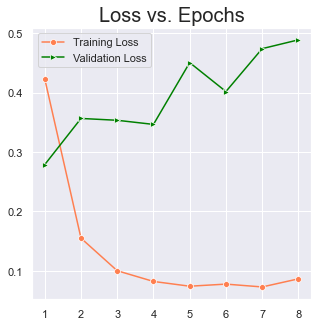

In [30]:
plot_learning_curve(h1)

In [31]:
loss, acc = model1.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 0s 3ms/step - loss: 0.2925 - accuracy: 0.8808
Testing Loss:  29.250219464302063
Testing Accuracy:  88.08411359786987


<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>This model is clearly overfitting, we will add regularization to the next iteration
 </span></ul></h4>

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net + Batch Normalization</span></strong></li>
</ul></h4>

In [32]:
# define model

model2 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model2.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [33]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.30949 >|> 
 ~| Epoch: 2 | Validation Loss: 1.11575 >|> 
 ~| Epoch: 3 | Validation Loss: 0.40421 >|> 
 ~| Epoch: 4 | Validation Loss: 0.49249 >|> 
 ~| Epoch: 5 | Validation Loss: 0.36853 >|> 
 ~| Epoch: 6 | Validation Loss: 0.31886 >|> 
 ~| Epoch: 7 | Validation Loss: 0.45799 >|> 
 ~| Epoch: 8 | Validation Loss: 0.35638 >|> 

Training Done.


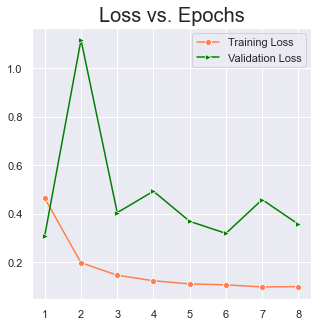

In [34]:
plot_learning_curve(h2)

In [35]:
loss, acc = model2.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 0s 3ms/step - loss: 0.3225 - accuracy: 0.8721
Testing Loss:  32.250216603279114
Testing Accuracy:  87.20794320106506


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net + Dropout</span></strong></li>
</ul></h4>

In [36]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(20, activation = 'relu'),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [37]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.29352 >|> 
 ~| Epoch: 2 | Validation Loss: 0.26116 >|> 
 ~| Epoch: 3 | Validation Loss: 0.28308 >|> 
 ~| Epoch: 4 | Validation Loss: 0.30607 >|> 
 ~| Epoch: 5 | Validation Loss: 0.37347 >|> 
 ~| Epoch: 6 | Validation Loss: 0.35112 >|> 

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 7 | Validation Loss: 0.44149 >|> 
 ~| Epoch: 8 | Validation Loss: 0.42532 >|> 
 ~| Epoch: 9 | Validation Loss: 0.44004 >|> 

Training Done.


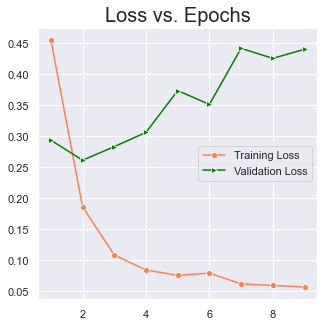

In [38]:
plot_learning_curve(h3)

In [39]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 0s 3ms/step - loss: 0.2660 - accuracy: 0.8981
Testing Accuracy:  89.80724215507507


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use pre-trained embeddings</span></strong></li>
</ul></h4>

In [40]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=NUM_WORDS, output_dim=EMBEDDING_DIM, input_length=MAX_LEN, weights=[embedding_matrix], trainable=True),
    Flatten(),
    Dense(30, activation = 'relu'),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [41]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.43302 >|> 
 ~| Epoch: 2 | Validation Loss: 0.37491 >|> 
 ~| Epoch: 3 | Validation Loss: 0.38057 >|> 
 ~| Epoch: 4 | Validation Loss: 0.36763 >|> 
 ~| Epoch: 5 | Validation Loss: 0.39535 >|> 
 ~| Epoch: 6 | Validation Loss: 0.44507 >|> 
 ~| Epoch: 7 | Validation Loss: 0.46711 >|> 
 ~| Epoch: 8 | Validation Loss: 0.51175 >|> 
 ~| Epoch: 9 | Validation Loss: 0.57345 >|> 
 ~| Epoch: 10 | Validation Loss: 0.59302 >|> 
 ~| Epoch: 11 | Validation Loss: 0.68409 >|> 

Training Done.


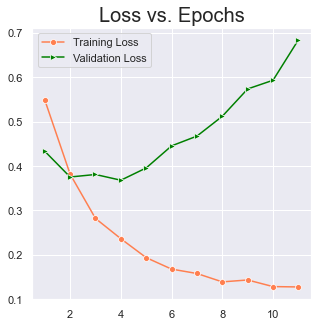

In [42]:
plot_learning_curve(h3)

In [43]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 0s 3ms/step - loss: 0.3664 - accuracy: 0.8639
Testing Accuracy:  86.39018535614014


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">LSTM</span></strong></li>
</ul></h4>

In [44]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    LSTM(32),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [45]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.68317 >|> 
 ~| Epoch: 2 | Validation Loss: 0.68206 >|> 
 ~| Epoch: 3 | Validation Loss: 0.68186 >|> 
 ~| Epoch: 4 | Validation Loss: 0.68319 >|> 
 ~| Epoch: 5 | Validation Loss: 0.68305 >|> 
 ~| Epoch: 6 | Validation Loss: 0.52422 >|> 
 ~| Epoch: 7 | Validation Loss: 0.42035 >|> 
 ~| Epoch: 8 | Validation Loss: 0.33267 >|> 
 ~| Epoch: 9 | Validation Loss: 0.31557 >|> 
 ~| Epoch: 10 | Validation Loss: 0.27365 >|> 
 ~| Epoch: 11 | Validation Loss: 0.28261 >|> 
 ~| Epoch: 12 | Validation Loss: 0.31137 >|> 
 ~| Epoch: 13 | Validation Loss: 0.31233 >|> 
 ~| Epoch: 14 | Validation Loss: 0.36619 >|> 

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 15 | Validation Loss: 0.35220 >|> 
 ~| Epoch: 16 | Validation Loss: 0.35495 >|> 
 ~| Epoch: 17 | Validation Loss: 0.38389 >|> 
 ~| Epoch: 18 | Validation Loss: 0.40554 >|> 

Epoch 00018: ReduceLROnPlateau reducing learning rate to 0.00016000000759959222.
 

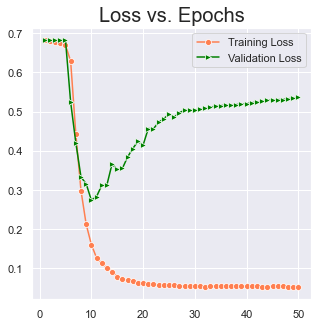

In [46]:
plot_learning_curve(h4)

In [47]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 1s 4ms/step - loss: 0.5772 - accuracy: 0.9051
Testing Accuracy:  90.50817489624023


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [48]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Bidirectional(LSTM(32)),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [49]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.38326 >|> 
 ~| Epoch: 2 | Validation Loss: 0.33462 >|> 
 ~| Epoch: 3 | Validation Loss: 0.29639 >|> 
 ~| Epoch: 4 | Validation Loss: 0.27754 >|> 
 ~| Epoch: 5 | Validation Loss: 0.26626 >|> 
 ~| Epoch: 6 | Validation Loss: 0.26179 >|> 
 ~| Epoch: 7 | Validation Loss: 0.26170 >|> 
 ~| Epoch: 8 | Validation Loss: 0.25741 >|> 
 ~| Epoch: 9 | Validation Loss: 0.26233 >|> 
 ~| Epoch: 10 | Validation Loss: 0.25802 >|> 
 ~| Epoch: 11 | Validation Loss: 0.26527 >|> 
 ~| Epoch: 12 | Validation Loss: 0.26446 >|> 

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 13 | Validation Loss: 0.26267 >|> 
 ~| Epoch: 14 | Validation Loss: 0.27416 >|> 
 ~| Epoch: 15 | Validation Loss: 0.26413 >|> 

Training Done.


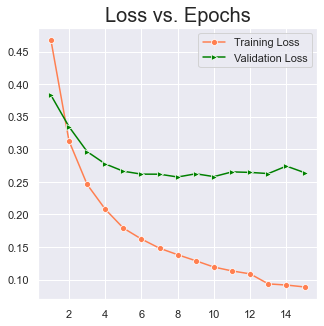

In [50]:
plot_learning_curve(h4)

In [51]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 1s 7ms/step - loss: 0.2983 - accuracy: 0.8943
Testing Accuracy:  89.42757248878479


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + LSTM</span></strong></li>
</ul></h4>

In [52]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    LSTM(75),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [53]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.40154 >|> 
 ~| Epoch: 2 | Validation Loss: 0.29378 >|> 
 ~| Epoch: 3 | Validation Loss: 0.28255 >|> 
 ~| Epoch: 4 | Validation Loss: 0.29477 >|> 
 ~| Epoch: 5 | Validation Loss: 0.28189 >|> 
 ~| Epoch: 6 | Validation Loss: 0.27847 >|> 
 ~| Epoch: 7 | Validation Loss: 0.31306 >|> 
 ~| Epoch: 8 | Validation Loss: 0.31734 >|> 
 ~| Epoch: 9 | Validation Loss: 0.31028 >|> 
 ~| Epoch: 10 | Validation Loss: 0.30491 >|> 

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 11 | Validation Loss: 0.33975 >|> 
 ~| Epoch: 12 | Validation Loss: 0.37008 >|> 
 ~| Epoch: 13 | Validation Loss: 0.35614 >|> 

Training Done.


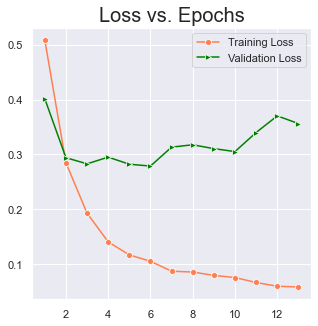

In [54]:
plot_learning_curve(h5)

In [55]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 1s 5ms/step - loss: 0.2931 - accuracy: 0.9019
Testing Accuracy:  90.18691778182983


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [56]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Bidirectional(LSTM(75, recurrent_dropout=0.5)),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [57]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.32444 >|> 
 ~| Epoch: 2 | Validation Loss: 0.27999 >|> 
 ~| Epoch: 3 | Validation Loss: 0.26327 >|> 
 ~| Epoch: 4 | Validation Loss: 0.28086 >|> 
 ~| Epoch: 5 | Validation Loss: 0.27875 >|> 
 ~| Epoch: 6 | Validation Loss: 0.30258 >|> 
 ~| Epoch: 7 | Validation Loss: 0.30559 >|> 
 ~| Epoch: 8 | Validation Loss: 0.29836 >|> 
 ~| Epoch: 9 | Validation Loss: 0.36239 >|> 
 ~| Epoch: 10 | Validation Loss: 0.32978 >|> 

Training Done.


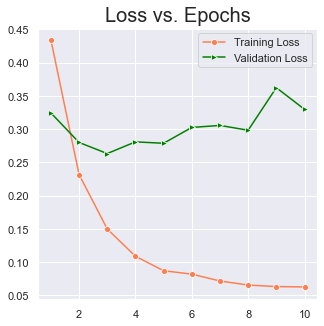

In [58]:
plot_learning_curve(h5)

In [59]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 5s 43ms/step - loss: 0.2711 - accuracy: 0.8957
Testing Accuracy:  89.57359790802002


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection</span></strong></li>
</ul></h4>

In [60]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

# using 75-25 split instead of 50-50 split as we need more data to train neural nets
X_train_vec, X_test_vec, y_train_vec, y_test_vec = train_test_split(X, y, test_size=0.15, random_state=seed, stratify=y)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (19401,), 
Test dataset shape: (3424,)


In [61]:
NGRAM_RANGE = (1, 3)
TOP_K = 8500
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2


kwargs = {
    'ngram_range' : NGRAM_RANGE,
    'dtype' : 'int32',
    'strip_accents' : 'unicode',
    'decode_error' : 'replace',
    'analyzer' : TOKEN_MODE,
    'min_df' : MIN_DOC_FREQ
}
vectorizer = TfidfVectorizer(**kwargs)
X_train_vec = vectorizer.fit_transform(X_train_vec)
X_test_vec = vectorizer.transform(X_test_vec)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (19401, 98751), 
Test dataset shape: (3424, 98751)


In [62]:
from sklearn.feature_selection import SelectKBest, f_classif

# Select best k features, with feature importance measured by f_classif
# Set k as 20000 or (if number of ngrams is less) number of ngrams   
selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
selector.fit(X_train_vec, y_train_vec)
X_train_vec = selector.transform(X_train_vec).astype('float32')
X_test_vec = selector.transform(X_test_vec).astype('float32')
X_train_vec = X_train_vec.toarray()
X_test_vec = X_test_vec.toarray()

print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (19401, 8500), 
Test dataset shape: (3424, 8500)


In [63]:
model6 = Sequential([
    Dense(30, activation='relu', input_shape=X_train_vec.shape[1:]),
    Dropout(0.5),
    Dense(20, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model6.compile(
    loss = 'binary_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [68]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h6 = model6.fit(
            X_train_vec, y_train_vec,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception:
    print("Training on CPU:")
    h6 = model6.fit(
            X_train_vec, y_train_vec,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.34213 >|> 
 ~| Epoch: 2 | Validation Loss: 0.34499 >|> 
 ~| Epoch: 3 | Validation Loss: 0.34764 >|> 
 ~| Epoch: 4 | Validation Loss: 0.34054 >|> 
 ~| Epoch: 5 | Validation Loss: 0.34620 >|> 
 ~| Epoch: 6 | Validation Loss: 0.34439 >|> 
 ~| Epoch: 7 | Validation Loss: 0.34553 >|> 
 ~| Epoch: 8 | Validation Loss: 0.34441 >|> 
 ~| Epoch: 9 | Validation Loss: 0.34179 >|> 
 ~| Epoch: 10 | Validation Loss: 0.34322 >|> 
 ~| Epoch: 11 | Validation Loss: 0.34504 >|> 

Training Done.


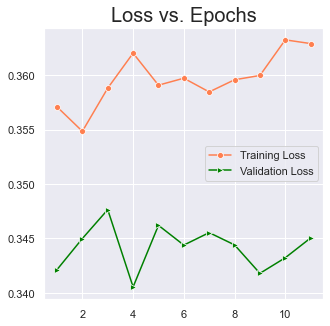

In [69]:
plot_learning_curve(h6)

In [70]:
loss, acc = model6.evaluate(X_test_vec, y_test_vec)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 0s 2ms/step - loss: 0.4095 - accuracy: 0.8435
Testing Accuracy:  84.34579372406006


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection + Stratified KFold Training</span></strong></li>
</ul></h4>


Train dataset shape: (21912, 56906), 
Test dataset shape: (913, 56906)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85761, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00002: val_accuracy improved from 0.85761 to 0.88061, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00003: val_accuracy improved from 0.88061 to 0.89157, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00004: val_accuracy improved from 0.89157 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00005: val_accuracy did not improve from 0.89704

Epoch 00006: val_accuracy improved from 0.89704 to 0.90033, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00007: val_accuracy improved from 0.90033 to 0.90142, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00008

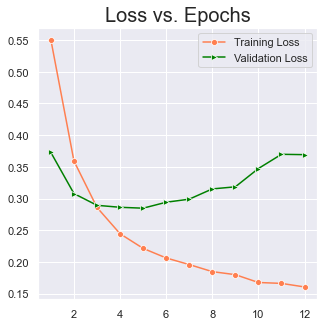

29/29 [==============================] - 0s 2ms/step - loss: 0.3692 - accuracy: 0.9102
Testing Accuracy:  91.01861715316772

Train dataset shape: (21912, 56792), 
Test dataset shape: (913, 56792)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85652, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00002: val_accuracy improved from 0.85652 to 0.89266, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00003: val_accuracy improved from 0.89266 to 0.89485, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00004: val_accuracy improved from 0.89485 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00005: val_accuracy improved from 0.89704 to 0.90581, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00006: val_accuracy improved from 0.90581 to 0.90800, saving model

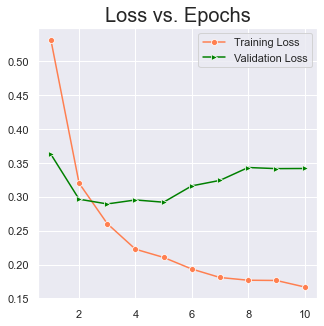

29/29 [==============================] - 0s 3ms/step - loss: 0.3417 - accuracy: 0.9200
Testing Accuracy:  92.00438261032104

Train dataset shape: (21912, 56604), 
Test dataset shape: (913, 56604)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.84995, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00002: val_accuracy improved from 0.84995 to 0.87842, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00003: val_accuracy improved from 0.87842 to 0.89923, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00004: val_accuracy did not improve from 0.89923

Epoch 00005: val_accuracy did not improve from 0.89923

Epoch 00006: val_accuracy improved from 0.89923 to 0.90361, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00007: val_accuracy improved from 0.90361 to 0.90690, saving model to models\binary

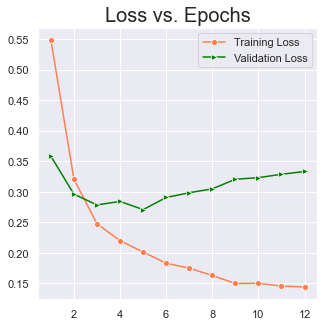

29/29 [==============================] - 0s 3ms/step - loss: 0.3333 - accuracy: 0.9135
Testing Accuracy:  91.3472056388855

Train dataset shape: (21912, 56982), 
Test dataset shape: (913, 56982)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85214, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00002: val_accuracy improved from 0.85214 to 0.88719, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00003: val_accuracy improved from 0.88719 to 0.89047, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00004: val_accuracy improved from 0.89047 to 0.89923, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00005: val_accuracy improved from 0.89923 to 0.90033, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00006: val_accuracy improved from 0.90033 to 0.90471, saving model 

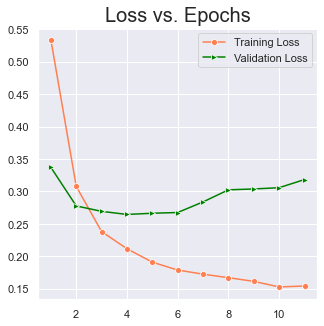

29/29 [==============================] - 0s 3ms/step - loss: 0.3038 - accuracy: 0.9124
Testing Accuracy:  91.23767614364624

Train dataset shape: (21912, 56878), 
Test dataset shape: (913, 56878)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86528, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00002: val_accuracy improved from 0.86528 to 0.88938, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00003: val_accuracy improved from 0.88938 to 0.89814, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00004: val_accuracy improved from 0.89814 to 0.90252, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00005: val_accuracy improved from 0.90252 to 0.91457, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00006: val_accuracy did not improve from 0.91457

Epoch 00007: val

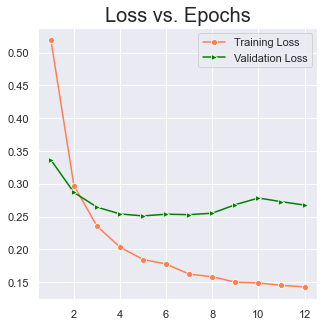

29/29 [==============================] - 0s 3ms/step - loss: 0.2675 - accuracy: 0.9157
Testing Accuracy:  91.56626462936401

Train dataset shape: (21912, 56909), 
Test dataset shape: (913, 56909)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87952, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00002: val_accuracy improved from 0.87952 to 0.90142, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00003: val_accuracy improved from 0.90142 to 0.90581, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00004: val_accuracy improved from 0.90581 to 0.91238, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00005: val_accuracy improved from 0.91238 to 0.92114, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00006: val_accuracy improved from 0.92114 to 0.92442, saving model

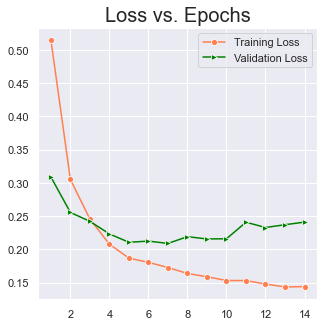

29/29 [==============================] - 0s 3ms/step - loss: 0.2411 - accuracy: 0.9376
Testing Accuracy:  93.75684261322021

Train dataset shape: (21912, 56844), 
Test dataset shape: (913, 56844)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87185, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00002: val_accuracy improved from 0.87185 to 0.90252, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00003: val_accuracy improved from 0.90252 to 0.90690, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00004: val_accuracy did not improve from 0.90690

Epoch 00005: val_accuracy improved from 0.90690 to 0.92223, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00006: val_accuracy did not improve from 0.92223

Epoch 00007: val_accuracy did not improve from 0.92223

Epoch 00008: val_accuracy did not

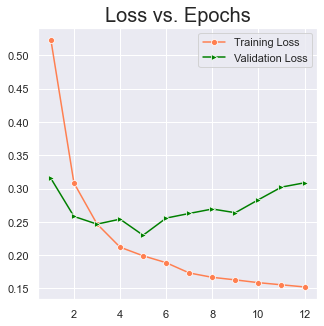

29/29 [==============================] - 0s 3ms/step - loss: 0.2299 - accuracy: 0.9222
Testing Accuracy:  92.22344160079956

Train dataset shape: (21912, 56414), 
Test dataset shape: (913, 56414)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86309, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00002: val_accuracy improved from 0.86309 to 0.89595, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00003: val_accuracy improved from 0.89595 to 0.90033, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00004: val_accuracy improved from 0.90033 to 0.91238, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00005: val_accuracy did not improve from 0.91238

Epoch 00006: val_accuracy did not improve from 0.91238

Epoch 00007: val_accuracy improved from 0.91238 to 0.91347, saving model to models\binary

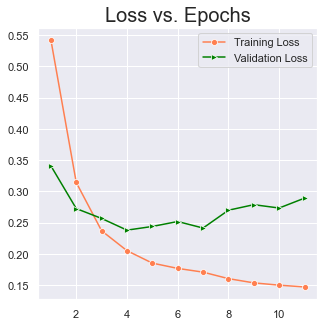

29/29 [==============================] - 0s 3ms/step - loss: 0.2734 - accuracy: 0.9157
Testing Accuracy:  91.56626462936401

Train dataset shape: (21912, 56866), 
Test dataset shape: (913, 56866)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85104, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00002: val_accuracy improved from 0.85104 to 0.87514, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00003: val_accuracy improved from 0.87514 to 0.88499, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00004: val_accuracy improved from 0.88499 to 0.89157, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00005: val_accuracy improved from 0.89157 to 0.90033, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00006: val_accuracy improved from 0.90033 to 0.90142, saving model

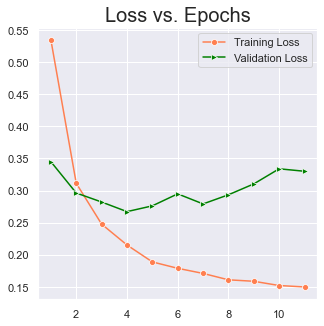

29/29 [==============================] - 0s 3ms/step - loss: 0.2934 - accuracy: 0.9124
Testing Accuracy:  91.23767614364624

Train dataset shape: (21912, 56826), 
Test dataset shape: (913, 56826)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85871, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00002: val_accuracy improved from 0.85871 to 0.88280, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00003: val_accuracy improved from 0.88280 to 0.90361, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00004: val_accuracy improved from 0.90361 to 0.90581, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00005: val_accuracy improved from 0.90581 to 0.91676, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00006: val_accuracy did not improve from 0.91676

Epoch 00007

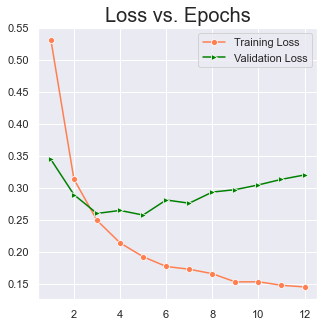

29/29 [==============================] - 0s 3ms/step - loss: 0.2572 - accuracy: 0.9168
Testing Accuracy:  91.67579412460327

Train dataset shape: (21912, 56842), 
Test dataset shape: (913, 56842)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.84447, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00002: val_accuracy improved from 0.84447 to 0.86309, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00003: val_accuracy improved from 0.86309 to 0.87623, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00004: val_accuracy improved from 0.87623 to 0.88499, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00005: val_accuracy improved from 0.88499 to 0.89157, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00006: val_accuracy improved from 0.89157 to 0.89266, saving 

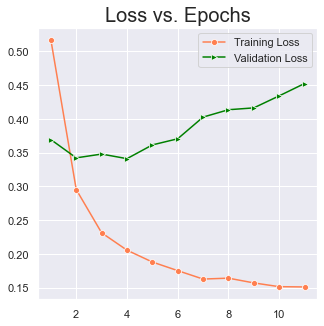

29/29 [==============================] - 0s 2ms/step - loss: 0.4525 - accuracy: 0.8959
Testing Accuracy:  89.59473967552185

Train dataset shape: (21912, 56883), 
Test dataset shape: (913, 56883)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85542, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00002: val_accuracy improved from 0.85542 to 0.88499, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00003: val_accuracy did not improve from 0.88499

Epoch 00004: val_accuracy improved from 0.88499 to 0.89047, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00005: val_accuracy improved from 0.89047 to 0.89157, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00006: val_accuracy improved from 0.89157 to 0.89923, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00007

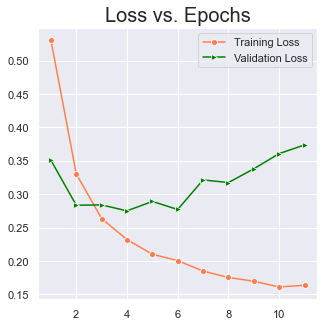

29/29 [==============================] - 0s 3ms/step - loss: 0.2770 - accuracy: 0.8992
Testing Accuracy:  89.92332816123962

Train dataset shape: (21912, 56712), 
Test dataset shape: (913, 56712)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85652, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00002: val_accuracy improved from 0.85652 to 0.87295, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00003: val_accuracy improved from 0.87295 to 0.88719, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00004: val_accuracy did not improve from 0.88719

Epoch 00005: val_accuracy did not improve from 0.88719

Epoch 00006: val_accuracy did not improve from 0.88719

Epoch 00007: val_accuracy improved from 0.88719 to 0.88938, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00008: val_accuracy imp

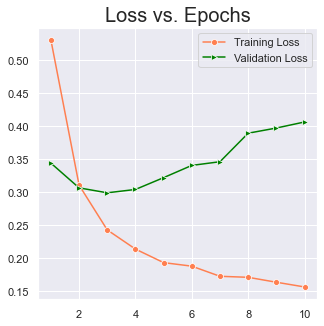

29/29 [==============================] - 0s 3ms/step - loss: 0.3968 - accuracy: 0.8959
Testing Accuracy:  89.59473967552185

Train dataset shape: (21912, 56911), 
Test dataset shape: (913, 56911)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88499, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00002: val_accuracy improved from 0.88499 to 0.90581, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00003: val_accuracy improved from 0.90581 to 0.91128, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00004: val_accuracy improved from 0.91128 to 0.92223, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00005: val_accuracy improved from 0.92223 to 0.92333, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00006: val_accuracy did not improve from 0.92333

Epoch 00007

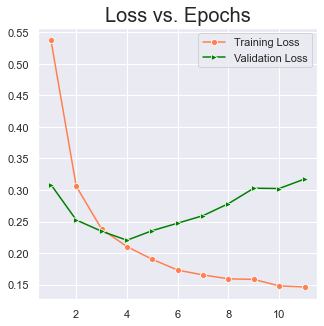

29/29 [==============================] - 0s 3ms/step - loss: 0.2593 - accuracy: 0.9277
Testing Accuracy:  92.77108311653137

Train dataset shape: (21912, 57019), 
Test dataset shape: (913, 57019)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87295, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00002: val_accuracy improved from 0.87295 to 0.89376, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00003: val_accuracy improved from 0.89376 to 0.89814, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00004: val_accuracy improved from 0.89814 to 0.91019, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00005: val_accuracy did not improve from 0.91019

Epoch 00006: val_accuracy did not improve from 0.91019

Epoch 00007: val_accuracy improved from 0.91019 to 0.91676, saving model to models\bi

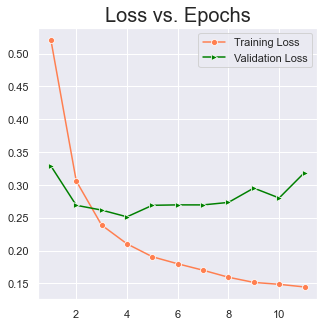

29/29 [==============================] - 0s 2ms/step - loss: 0.2952 - accuracy: 0.9189
Testing Accuracy:  91.89485311508179

Train dataset shape: (21912, 56766), 
Test dataset shape: (913, 56766)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.84228, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00002: val_accuracy improved from 0.84228 to 0.87185, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00003: val_accuracy improved from 0.87185 to 0.88280, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00004: val_accuracy improved from 0.88280 to 0.89923, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00005: val_accuracy improved from 0.89923 to 0.90033, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00006: val_accuracy did not improve from 0.90033

Epoch 00007

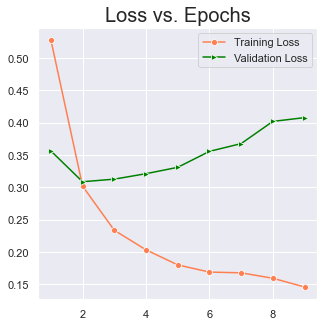

29/29 [==============================] - 0s 3ms/step - loss: 0.3307 - accuracy: 0.9003
Testing Accuracy:  90.03285765647888

Train dataset shape: (21912, 56730), 
Test dataset shape: (913, 56730)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86418, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00002: val_accuracy improved from 0.86418 to 0.89814, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00003: val_accuracy improved from 0.89814 to 0.90581, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00004: val_accuracy did not improve from 0.90581

Epoch 00005: val_accuracy improved from 0.90581 to 0.90800, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00006: val_accuracy improved from 0.90800 to 0.92004, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00007

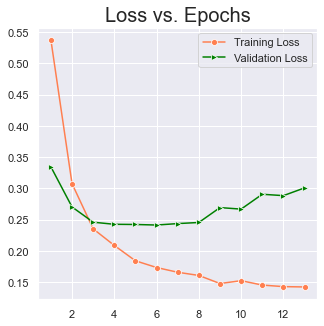

29/29 [==============================] - 0s 3ms/step - loss: 0.2669 - accuracy: 0.9233
Testing Accuracy:  92.33297109603882

Train dataset shape: (21912, 56977), 
Test dataset shape: (913, 56977)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88828, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00002: val_accuracy improved from 0.88828 to 0.89047, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00003: val_accuracy improved from 0.89047 to 0.90471, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00004: val_accuracy did not improve from 0.90471

Epoch 00005: val_accuracy improved from 0.90471 to 0.90581, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00006: val_accuracy did not improve from 0.90581

Epoch 00007: val_accuracy did not improve from 0.90581

Epoch 00008: val_accuracy did

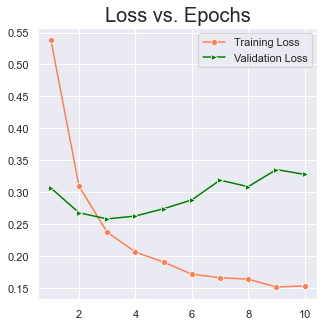

29/29 [==============================] - 0s 3ms/step - loss: 0.3280 - accuracy: 0.9168
Testing Accuracy:  91.67579412460327

Train dataset shape: (21912, 56536), 
Test dataset shape: (913, 56536)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87404, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00002: val_accuracy improved from 0.87404 to 0.89376, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00003: val_accuracy improved from 0.89376 to 0.90142, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00004: val_accuracy improved from 0.90142 to 0.91128, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00005: val_accuracy did not improve from 0.91128

Epoch 00006: val_accuracy improved from 0.91128 to 0.91238, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00007

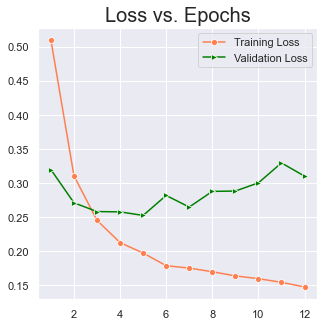

29/29 [==============================] - 0s 3ms/step - loss: 0.2647 - accuracy: 0.9189
Testing Accuracy:  91.89485311508179

Train dataset shape: (21912, 56990), 
Test dataset shape: (913, 56990)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.84885, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00002: val_accuracy improved from 0.84885 to 0.87514, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00003: val_accuracy improved from 0.87514 to 0.89376, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00004: val_accuracy did not improve from 0.89376

Epoch 00005: val_accuracy did not improve from 0.89376

Epoch 00006: val_accuracy improved from 0.89376 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00007: val_accuracy did not improve from 0.89704

Epoch 00008: val_accuracy did

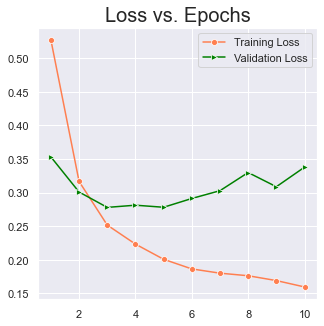

29/29 [==============================] - 0s 3ms/step - loss: 0.3088 - accuracy: 0.9014
Testing Accuracy:  90.14238715171814

Train dataset shape: (21912, 56914), 
Test dataset shape: (913, 56914)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85871, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00002: val_accuracy improved from 0.85871 to 0.89266, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00003: val_accuracy improved from 0.89266 to 0.90252, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00004: val_accuracy improved from 0.90252 to 0.90361, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00005: val_accuracy did not improve from 0.90361

Epoch 00006: val_accuracy improved from 0.90361 to 0.91128, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00007

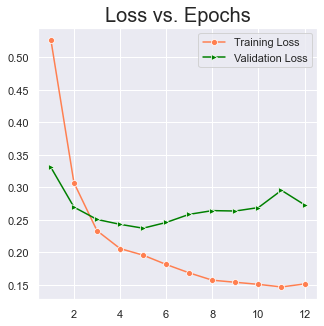

29/29 [==============================] - 0s 3ms/step - loss: 0.2733 - accuracy: 0.9189
Testing Accuracy:  91.89485311508179

Train dataset shape: (21912, 56722), 
Test dataset shape: (913, 56722)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85871, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00002: val_accuracy improved from 0.85871 to 0.89047, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00003: val_accuracy improved from 0.89047 to 0.90033, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00004: val_accuracy did not improve from 0.90033

Epoch 00005: val_accuracy improved from 0.90033 to 0.90142, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00006: val_accuracy did not improve from 0.90142

Epoch 00007: val_accuracy improved from 0.90142 to 0.91238, saving model to models\bi

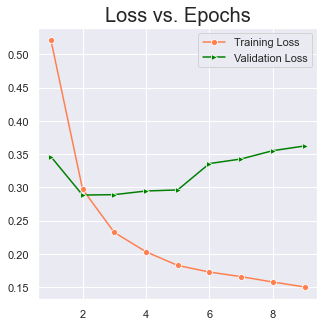

29/29 [==============================] - 0s 2ms/step - loss: 0.3622 - accuracy: 0.9135
Testing Accuracy:  91.3472056388855

Train dataset shape: (21912, 56982), 
Test dataset shape: (913, 56982)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85871, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00002: val_accuracy improved from 0.85871 to 0.88719, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00003: val_accuracy improved from 0.88719 to 0.89376, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00004: val_accuracy improved from 0.89376 to 0.90581, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00005: val_accuracy did not improve from 0.90581

Epoch 00006: val_accuracy improved from 0.90581 to 0.91238, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00007:

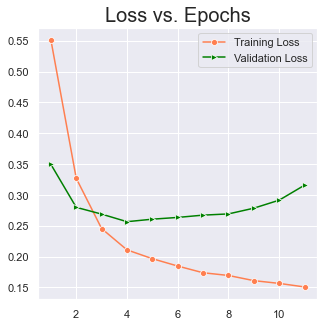

29/29 [==============================] - 0s 2ms/step - loss: 0.2692 - accuracy: 0.9157
Testing Accuracy:  91.56626462936401

Train dataset shape: (21912, 57002), 
Test dataset shape: (913, 57002)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86418, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00002: val_accuracy improved from 0.86418 to 0.88061, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00003: val_accuracy improved from 0.88061 to 0.88609, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00004: val_accuracy improved from 0.88609 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00005: val_accuracy improved from 0.89704 to 0.89923, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00006: val_accuracy did not improve from 0.89923

Epoch 00007

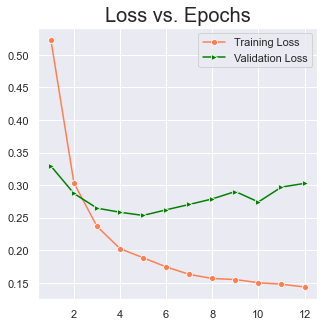

29/29 [==============================] - 0s 3ms/step - loss: 0.3027 - accuracy: 0.9135
Testing Accuracy:  91.3472056388855

Train dataset shape: (21912, 56765), 
Test dataset shape: (913, 56765)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86637, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00002: val_accuracy improved from 0.86637 to 0.87623, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00003: val_accuracy improved from 0.87623 to 0.89047, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00004: val_accuracy improved from 0.89047 to 0.90252, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00005: val_accuracy did not improve from 0.90252

Epoch 00006: val_accuracy did not improve from 0.90252

Epoch 00007: val_accuracy improved from 0.90252 to 0.90471, saving model to models\bin

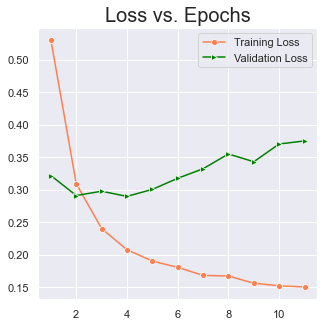

29/29 [==============================] - 0s 3ms/step - loss: 0.3704 - accuracy: 0.9124
Testing Accuracy:  91.23767614364624


In [71]:
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_extraction.text import TfidfVectorizer


def get_model_name(k):
    return f'model_{k}.h5'

NUM_SPLITS = 25
EPOCHS = 50
save_dir = Path('./models/binary_classfiier/dl/merged_descr')
fold_var = 1
NGRAM_RANGE = (1, 2)
TOP_K = 15000
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2
NUM_CLASSES = 2

kwargs = {
        'ngram_range' : NGRAM_RANGE,
        'dtype' : 'int32',
        'strip_accents' : 'unicode',
        'decode_error' : 'replace',
        'analyzer' : TOKEN_MODE,
        'min_df' : MIN_DOC_FREQ
    }

val_accs = []
skf = StratifiedKFold(n_splits=NUM_SPLITS, shuffle=True, random_state=seed)

for train_indices, test_indices in skf.split(X, y):
    X_train_split, X_test_split = X[train_indices], X[test_indices]
    y_train_split, y_test_split = y[train_indices], y[test_indices]
    vectorizer = TfidfVectorizer(**kwargs)
    X_train_vec = vectorizer.fit_transform(X_train_split)
    X_test_vec = vectorizer.transform(X_test_split)
    print(f"\nTrain dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

    selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
    selector.fit(X_train_vec, y_train_split)
    X_train_vec = selector.transform(X_train_vec).astype('float32')
    X_test_vec = selector.transform(X_test_vec).astype('float32')
    X_train_vec = X_train_vec.toarray()
    X_test_vec = X_test_vec.toarray()

    print(f"\nFeatures Train dataset shape: {X_train_vec.shape}, \nFeaturesTest dataset shape: {X_test_vec.shape}")
    model_ = None
    model_ = Sequential([   
        Dense(30, activation='relu', input_shape=X_train_vec.shape[1:]),
        Dropout(0.5),
        Dense(20, activation='relu'),
        Dropout(0.5),
        Dense(10, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    model_.compile(
        loss = 'binary_crossentropy',
        optimizer = 'adam',
        metrics = ['accuracy']
    )
    
    checkpoint = tensorflow.keras.callbacks.ModelCheckpoint(save_dir / get_model_name(fold_var),
                                                            monitor='val_accuracy',
                                                            verbose=1,
                                                            save_best_only=True,
                                                            mode='max')

    h_ = model_.fit(
            X_train_vec, y_train_split,
            validation_data = (X_test_vec, y_test_split),  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [checkpoint, early_stop, lr_reduce_on_plateau],
            verbose = False)
    
    model_.load_weights(save_dir / get_model_name(fold_var))
    plot_learning_curve(h_)
    loss, acc = model_.evaluate(X_test_vec, y_test_split)
    print("Testing Accuracy: ", acc*100)
    val_accs.append(acc)
    tensorflow.keras.backend.clear_session()
    fold_var += 1

In [72]:
print("Testing Accuracy: ", np.mean(val_accs)*100)   # average k fold accuracy

Testing Accuracy:  91.39539909362793


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Metrics: </span></strong></li>
</ul></h3>

<table style="width:100%">
  <tr>
    <th>Model</th>
    <th>Test Accuracy</th>
  </tr>
  <tr>
    <td>Simple Feed-Forward Net using Embedding Layer</td>
    <td>88.08%</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Batch Norm</td>
    <td>87.21%</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Dropout</td>
    <td>89.80%</td>
  </tr>
    <tr>
    <td>Feed-Forward NN + Pre-trained GloVe embeddings</td>
    <td>86.40%</td>
  </tr>
  <tr>
    <td>LSTM</td>
    <td>90.51%</td>
  </tr>
    
  <tr>
    <td>Bi-Directional LSTM</td>
    <td>89.43%</td>
  </tr>
<tr>
    <td>Convolution Blocks (Dimensionality Reduction) + LSTM</td>
    <td>90.19%</td>
  </tr>
    <tr>
    <td>Convolution Blocks (Dimensionality Reduction) + Bi-LSTM</td>
    <td>89.57%</td>
  </tr>
<tr>
    <td>TfIdf Vectors + Feature Selection + Feed-forward Neural Net</td>
    <td>84.35%</td>
  </tr>
<tr>
    <td>Stratified KFold Validation + TfIdf Vectors + Feature Selection + +Feed-forward Neural Net</td>
    <td>91.40%</td>
  </tr>
</table>

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Augmented Data + Generated keywords feature - DL Binary Classifier</span></strong></li>
</ul></h1>

<h4>
<ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">OBJECTIVE:</span></strong></li>
</ul>
<p><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use the text data to build a deep-learning based binary classifier.</span></p>
    </h4>

In [1]:
# imports

import warnings
warnings.filterwarnings('ignore')

import os
import math
import random
from time import time
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import defaultdict, Counter
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud, STOPWORDS
import tensorflow

tqdm.pandas()
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

In [2]:
# reproducibility
seed = 7
random.seed(seed)
tensorflow.random.set_seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import the clean data.</span></strong></li>
</ul></h3>

In [3]:
dataset = pd.read_csv('./data/augmented_data.csv')
dataset.sample(10)

,Unnamed: 0,translated_description,keywords,short_description,description,group,cleaned_description,cleaned_short_description,merged_description,char_length,word_length,short_char_length,short_word_length,language,language_confidence,label
10302,1803,ewew ws tool does not work jionmpsf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
19755,4054,absends work work programmer work,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1732,1732,need rckfthy grind add microsoft email,rckfthy grind add microsoft email,email,\n\nreceived from: raifstow.gfeymtql@gmail.com...,GRP_0,need rckfthy grind add microsoft email,email,need rckfthy grind add microsoft email,107.0,14.0,5.0,1.0,en,0.459778,0
14431,5932,Telprupen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
14692,6193,dn sale org plant help reference delivery note...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
17182,1481,erp sid password lock,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
10661,2162,reset password use password management tool re...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
14632,6133,job scheduler job job,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
18620,2919,skype call programdnty lock restart computer s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
6770,6770,account lock ad,account lock,account locked in ad,account locked in ad,GRP_0,account lock ad,account lock ad,account lock ad,20.0,4.0,20.0,4.0,en,0.690513,0


In [4]:
dataset.isna().sum()

Unnamed: 0                       0
translated_description           0
keywords                     14336
short_description            14326
description                  14326
group                        14326
cleaned_description          14383
cleaned_short_description    14376
merged_description           14326
char_length                  14326
word_length                  14326
short_char_length            14326
short_word_length            14326
language                     14326
language_confidence          14326
label                            0
dtype: int64

In [5]:
dataset.label.value_counts()

0    13109
1     9716
Name: label, dtype: int64

In [6]:
def merge_features(row):
    """merge features (keywords & translated descriptions) to create a new derived feature"""

    if isinstance(row.keywords, str) and len(row.keywords) > 0:
        merged_feature = str(row.keywords + " " + row.translated_description)
    else:
        merged_feature = row.translated_description

    row['merged_feature'] = str(merged_feature).strip()
    return row

dataset = dataset.progress_apply(merge_features, axis=1)

100%|██████████████████████████████████████████████████████████████████████████| 22825/22825 [00:11<00:00, 2020.06it/s]


In [7]:
X = np.array(dataset.merged_feature)
y = np.array(dataset.label)
X.shape, y.shape

((22825,), (22825,))

In [8]:
from tensorflow.keras.utils import to_categorical
y_dummy_coded = to_categorical(y)
y[0], y_dummy_coded[0]

(0, array([1., 0.], dtype=float32))

In [9]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y_dummy_coded, test_size=.15,
                                                    random_state=seed, stratify=y_dummy_coded)  # splits are stratified by y

In [10]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((19401,), (3424,), (19401, 2), (3424, 2))

In [11]:
X_train[0], y_train[0]  # check sample

('company guest account work wch company guest account work wch create yesterday',
 array([1., 0.], dtype=float32))

In [12]:
# TODO: Check the distributions of groups in training and testing sets, i.e, if they vary too much
# stratify by y if required during splits
# or data augmentation to upsample minority classes to balance the group distributions

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Tokenize and pad sequences</span></strong></li>
</ul></h3>

In [13]:
# define params
NUM_WORDS = 20000
EMBEDDING_DIM = 300
MAX_LEN = 100 # dataset['word_length'].max()
MAX_LEN

100

In [14]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


tokenizer = Tokenizer(num_words=NUM_WORDS)
tokenizer.fit_on_texts(X_train)
X_train_tokens = tokenizer.texts_to_sequences(X_train)
X_test_tokens = tokenizer.texts_to_sequences(X_test)
X_train_tokens[0], X_test_tokens[0]

([11, 668, 16, 3, 123, 11, 668, 16, 3, 123, 66, 430],
 [1158, 3, 95, 3, 800, 30, 219])

In [15]:
y_train[0], y_test[0]

(array([1., 0.], dtype=float32), array([0., 1.], dtype=float32))

In [16]:
# pad sequences to cut longer texts to a uniform length and pad the sentences that are shorter than that with <PAD> token

# using just 20 words from each headline will severely limit the information that is 
# available to the model and affect performance although the training will be faster
X_train_padded = pad_sequences(X_train_tokens,
                               padding='post',
                               truncating='post',
                               maxlen=MAX_LEN)
X_test_padded = pad_sequences(X_test_tokens,
                              padding='post',
                              truncating='post',
                              maxlen=MAX_LEN)


print(f'X train:  {X_train_padded.shape}\nX test:   {X_test_padded.shape}')

X train:  (19401, 100)
X test:   (3424, 100)


In [17]:
pprint(X_train_padded[0], compact=True)

array([ 11, 668,  16,   3, 123,  11, 668,  16,   3, 123,  66, 430,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0])


In [18]:
WORD_TO_INDEX = tokenizer.word_index
# pprint(WORD_TO_INDEX, compact=True)
pprint(list(WORD_TO_INDEX.keys())[:100], compact=True)

['u', 'job', 'work', 'password', 'the', 'erp', 'tool', 'ts', 'system', 'user',
 'company', 'security', 'plant', 'error', 'to', 'account', 'sid', 'access',
 'reset', 'problem', 'of', 'printer', 'scheduler', 'ticket', 'need', 'fail',
 'use', 'issue', 'get', 'hostname', 'unable', 'help', 'window', 'message',
 'engineering', 'email', 'e', 'login', 'update', 'change', 'time', 'site',
 'failure', 'request', 'check', 'new', 'order', 'name', 'information', 'see',
 'outlook', 'streaming', 'open', 'server', 'log', 'contact', 'germany', 'phone',
 'call', 'network', 'send', 'try', 'type', 'crm', 'team', 'create', 'and',
 'report', 'lock', 'with', 'connect', 'show', 'backup', 'management', 't',
 'connection', 'pc', 'vpn', 'i', 'print', 'view', 'file', 'circuit', 'a',
 'skype', 'number', 'receive', 'mail', 'computer', 'start', 'device', 'is',
 'no', 'software', 'programmer', 'not', 'able', 'could', 'platform', 'in']


In [19]:
VOCAB_SIZE = len(WORD_TO_INDEX) + 1
VOCAB_SIZE

13245

In [20]:
# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/sequence/pad_sequences
def retrieve_description_feat(x, mapping=WORD_TO_INDEX) -> str:
    # increment 3 
    mapping = {k:(v + 3) for k, v in mapping.items()}
    mapping['<PAD>'] = 0
    mapping['<START>'] = 1
    mapping['<UNK>'] = 2
    inv_mapping = {v: k for k, v in mapping.items()}
    return str(" ".join(inv_mapping.get(i, '<NA>') for i in x))

retrieve_description_feat(X_test_padded[7])

'approves of also hang approves of also hang <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">GloVe Embeddings</span></strong></li>
</ul></h3>

In [21]:
EMBEDDING_DIM

300

In [22]:
def get_embedding_matrix(embedding_dim=EMBEDDING_DIM):
    embeddings = defaultdict()
    if embedding_dim == 200:
        file_path = f'./data/glove.6B.{embedding_dim}d.txt'
    elif embedding_dim == 300:
        file_path = f'./data/glove.840B.{embedding_dim}d.txt'
    for l in open(file_path, encoding='utf-8'):
        word = l.split(" ")[0]
        embeddings[word] = np.asarray(l.split(" ")[1:], dtype='float32')

    embeddings = dict(embeddings)

    # create a weight matrix for words in training docs
    embedding_matrix = np.zeros((NUM_WORDS, embedding_dim))

    for word, idx in WORD_TO_INDEX.items():
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            embedding_matrix[idx] = embedding_vector

    return embedding_matrix

In [23]:
# use pre-trained glove embedding matrix to initialize weights in our model
embedding_matrix = get_embedding_matrix()
embedding_matrix.shape

(20000, 300)

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net</span></strong></li>
</ul></h4>

In [24]:
# !pip install livelossplot
from tensorflow.python.keras.models import Sequential
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.regularizers import l2
from tensorflow.keras.constraints import max_norm, unit_norm
from tensorflow.python.keras.callbacks import LambdaCallback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Flatten, Dense, Activation, BatchNormalization, Dropout, Embedding, LSTM, MaxPooling1D, Conv1D, Bidirectional

In [25]:
NUM_CLASSES = 2
VOCAB_SIZE, MAX_LEN, EMBEDDING_DIM, NUM_CLASSES

(13245, 100, 300, 2)

In [26]:
# define model

model1 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(1024, activation = 'relu'),
    Dense(1024, activation = 'relu'),
    Dense(128, activation = 'relu'),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model1.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [27]:
# Define Callbacks and a few helper functions

# simplify the training log
simple_log = LambdaCallback(
    on_epoch_end = lambda e, l: print(f" ~| Epoch: {e+1} | Validation Loss: {l['val_loss']:.5f}", end =" >|> \n" ))

# early stopping
early_stop = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=7,
                              verbose=0, 
                              restore_best_weights=True)

# learning rate reduction
lr_reduce_on_plateau = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=4, 
                                            verbose=1, 
                                            factor=0.4,
                                            min_lr=0.00001)

def plot_learning_curve(hist):
    sns.set()
    plt.figure(figsize=(5,5))
    train = hist.history['loss']
    val = hist.history['val_loss']
    epochs_run = range(1,len(train) + 1)
    sns.lineplot(epochs_run, train, marker = 'o', color = 'coral', label = 'Training Loss')
    sns.lineplot(epochs_run, val,  marker = '>', color = 'green', label = 'Validation Loss')
    plt.title("Loss vs. Epochs", fontsize = 20)
    plt.legend()
    plt.show()

In [28]:
X_train[0]

'company guest account work wch company guest account work wch create yesterday'

In [29]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((19401,), (19401, 2), (3424,), (3424, 2))

In [30]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("\nTraining on CPU:")
    h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.32241 >|> 
 ~| Epoch: 2 | Validation Loss: 0.31246 >|> 
 ~| Epoch: 3 | Validation Loss: 0.36425 >|> 
 ~| Epoch: 4 | Validation Loss: 0.39396 >|> 
 ~| Epoch: 5 | Validation Loss: 0.53486 >|> 
 ~| Epoch: 6 | Validation Loss: 0.52357 >|> 
 ~| Epoch: 7 | Validation Loss: 0.59483 >|> 
 ~| Epoch: 8 | Validation Loss: 0.59585 >|> 
 ~| Epoch: 9 | Validation Loss: 0.85862 >|> 

Training Done.


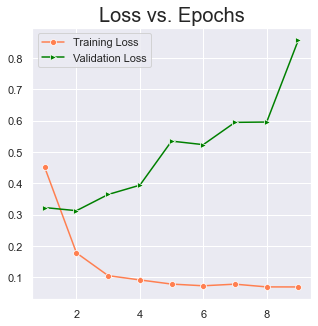

In [31]:
plot_learning_curve(h1)

In [32]:
loss, acc = model1.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 0s 3ms/step - loss: 0.3061 - accuracy: 0.8741
Testing Loss:  30.606281757354736
Testing Accuracy:  87.41238117218018


<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>This model is clearly overfitting, we will add regularization to the next iteration
 </span></ul></h4>

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net + Batch Normalization</span></strong></li>
</ul></h4>

In [33]:
# define model

model2 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model2.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [34]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.36120 >|> 
 ~| Epoch: 2 | Validation Loss: 0.36522 >|> 
 ~| Epoch: 3 | Validation Loss: 0.61714 >|> 
 ~| Epoch: 4 | Validation Loss: 0.69466 >|> 
 ~| Epoch: 5 | Validation Loss: 0.55807 >|> 
 ~| Epoch: 6 | Validation Loss: 0.44252 >|> 
 ~| Epoch: 7 | Validation Loss: 0.44771 >|> 
 ~| Epoch: 8 | Validation Loss: 0.46876 >|> 

Training Done.


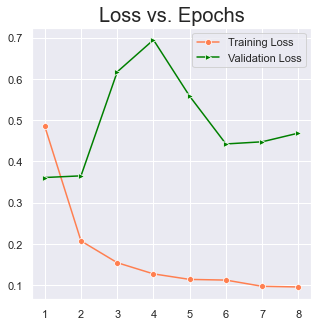

In [35]:
plot_learning_curve(h2)

In [36]:
loss, acc = model2.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 0s 3ms/step - loss: 0.3744 - accuracy: 0.8496
Testing Loss:  37.44479417800903
Testing Accuracy:  84.95911359786987


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net + Dropout</span></strong></li>
</ul></h4>

In [37]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(20, activation = 'relu'),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [38]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.33275 >|> 
 ~| Epoch: 2 | Validation Loss: 0.30671 >|> 
 ~| Epoch: 3 | Validation Loss: 0.31995 >|> 
 ~| Epoch: 4 | Validation Loss: 0.35328 >|> 
 ~| Epoch: 5 | Validation Loss: 0.42899 >|> 
 ~| Epoch: 6 | Validation Loss: 0.46850 >|> 

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 7 | Validation Loss: 0.48446 >|> 
 ~| Epoch: 8 | Validation Loss: 0.46966 >|> 
 ~| Epoch: 9 | Validation Loss: 0.51978 >|> 

Training Done.


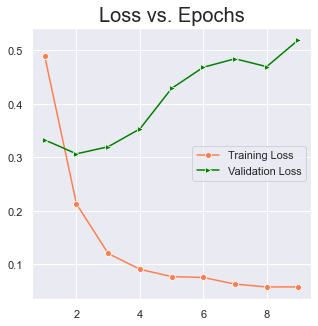

In [39]:
plot_learning_curve(h3)

In [40]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 0s 3ms/step - loss: 0.3161 - accuracy: 0.8770
Testing Accuracy:  87.70443797111511


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use pre-trained embeddings</span></strong></li>
</ul></h4>

In [41]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=NUM_WORDS, output_dim=EMBEDDING_DIM, input_length=MAX_LEN, weights=[embedding_matrix], trainable=True),
    Flatten(),
    Dense(30, activation = 'relu'),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [42]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.46329 >|> 
 ~| Epoch: 2 | Validation Loss: 0.42262 >|> 
 ~| Epoch: 3 | Validation Loss: 0.44553 >|> 
 ~| Epoch: 4 | Validation Loss: 0.42927 >|> 
 ~| Epoch: 5 | Validation Loss: 0.48925 >|> 
 ~| Epoch: 6 | Validation Loss: 0.48401 >|> 
 ~| Epoch: 7 | Validation Loss: 0.53465 >|> 
 ~| Epoch: 8 | Validation Loss: 0.60020 >|> 
 ~| Epoch: 9 | Validation Loss: 0.70838 >|> 

Training Done.


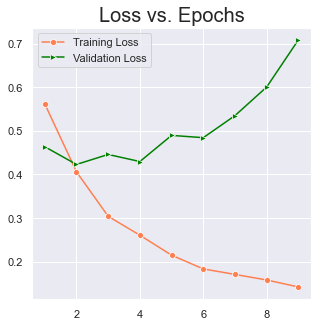

In [43]:
plot_learning_curve(h3)

In [44]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.8151
Testing Accuracy:  81.512850522995


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">LSTM</span></strong></li>
</ul></h4>

In [45]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    LSTM(32),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [46]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.68319 >|> 
 ~| Epoch: 2 | Validation Loss: 0.68407 >|> 
 ~| Epoch: 3 | Validation Loss: 0.68197 >|> 
 ~| Epoch: 4 | Validation Loss: 0.67897 >|> 
 ~| Epoch: 5 | Validation Loss: 0.48676 >|> 
 ~| Epoch: 6 | Validation Loss: 0.44095 >|> 
 ~| Epoch: 7 | Validation Loss: 0.41205 >|> 
 ~| Epoch: 8 | Validation Loss: 0.40027 >|> 
 ~| Epoch: 9 | Validation Loss: 0.40586 >|> 
 ~| Epoch: 10 | Validation Loss: 0.39561 >|> 
 ~| Epoch: 11 | Validation Loss: 0.38074 >|> 
 ~| Epoch: 12 | Validation Loss: 0.37562 >|> 
 ~| Epoch: 13 | Validation Loss: 0.40029 >|> 
 ~| Epoch: 14 | Validation Loss: 0.36710 >|> 
 ~| Epoch: 15 | Validation Loss: 0.35381 >|> 
 ~| Epoch: 16 | Validation Loss: 0.36513 >|> 
 ~| Epoch: 17 | Validation Loss: 0.36169 >|> 
 ~| Epoch: 18 | Validation Loss: 0.35328 >|> 
 ~| Epoch: 19 | Validation Loss: 0.37311 >|> 
 ~| Epoch: 20 | Validation Loss: 0.35659 >|> 
 ~| Epoch: 21 | Validation Loss: 0.37242 >|> 
 ~| Epoch: 22 | Validation

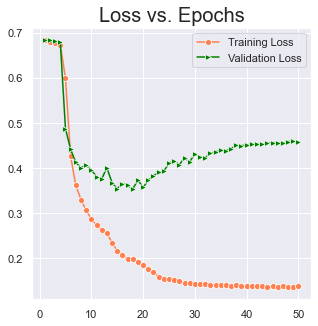

In [47]:
plot_learning_curve(h4)

In [48]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 1s 4ms/step - loss: 0.4747 - accuracy: 0.8887
Testing Accuracy:  88.87266516685486


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [49]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Bidirectional(LSTM(32)),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [50]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.39632 >|> 
 ~| Epoch: 2 | Validation Loss: 0.34898 >|> 
 ~| Epoch: 3 | Validation Loss: 0.31488 >|> 
 ~| Epoch: 4 | Validation Loss: 0.29781 >|> 
 ~| Epoch: 5 | Validation Loss: 0.29443 >|> 
 ~| Epoch: 6 | Validation Loss: 0.27638 >|> 
 ~| Epoch: 7 | Validation Loss: 0.30746 >|> 
 ~| Epoch: 8 | Validation Loss: 0.28991 >|> 
 ~| Epoch: 9 | Validation Loss: 0.28143 >|> 
 ~| Epoch: 10 | Validation Loss: 0.27666 >|> 

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 11 | Validation Loss: 0.28673 >|> 
 ~| Epoch: 12 | Validation Loss: 0.27625 >|> 
 ~| Epoch: 13 | Validation Loss: 0.29217 >|> 
 ~| Epoch: 14 | Validation Loss: 0.29647 >|> 
 ~| Epoch: 15 | Validation Loss: 0.27452 >|> 
 ~| Epoch: 16 | Validation Loss: 0.28653 >|> 
 ~| Epoch: 17 | Validation Loss: 0.28959 >|> 
 ~| Epoch: 18 | Validation Loss: 0.30078 >|> 
 ~| Epoch: 19 | Validation Loss: 0.30168 >|> 

Epoch 00019: ReduceLROnPlateau reduc

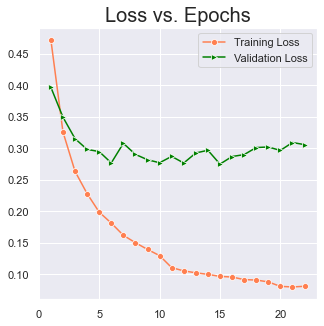

In [51]:
plot_learning_curve(h4)

In [52]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 1s 6ms/step - loss: 0.3116 - accuracy: 0.8995
Testing Accuracy:  89.95327353477478


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + LSTM</span></strong></li>
</ul></h4>

In [53]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    LSTM(75),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [54]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.40037 >|> 
 ~| Epoch: 2 | Validation Loss: 0.31277 >|> 
 ~| Epoch: 3 | Validation Loss: 0.31219 >|> 
 ~| Epoch: 4 | Validation Loss: 0.29256 >|> 
 ~| Epoch: 5 | Validation Loss: 0.30195 >|> 
 ~| Epoch: 6 | Validation Loss: 0.27932 >|> 
 ~| Epoch: 7 | Validation Loss: 0.32120 >|> 
 ~| Epoch: 8 | Validation Loss: 0.30869 >|> 
 ~| Epoch: 9 | Validation Loss: 0.35633 >|> 
 ~| Epoch: 10 | Validation Loss: 0.36937 >|> 

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 11 | Validation Loss: 0.39257 >|> 
 ~| Epoch: 12 | Validation Loss: 0.43299 >|> 
 ~| Epoch: 13 | Validation Loss: 0.41407 >|> 

Training Done.


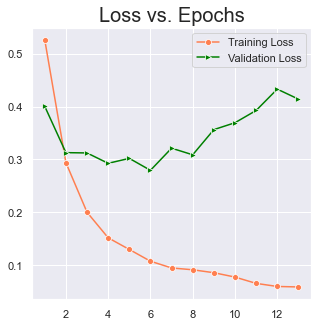

In [55]:
plot_learning_curve(h5)

In [56]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 1s 6ms/step - loss: 0.3100 - accuracy: 0.8937
Testing Accuracy:  89.36915993690491


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [57]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Bidirectional(LSTM(75, recurrent_dropout=0.5)),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [58]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.33402 >|> 
 ~| Epoch: 2 | Validation Loss: 0.28682 >|> 
 ~| Epoch: 3 | Validation Loss: 0.29286 >|> 
 ~| Epoch: 4 | Validation Loss: 0.28228 >|> 
 ~| Epoch: 5 | Validation Loss: 0.29814 >|> 
 ~| Epoch: 6 | Validation Loss: 0.32997 >|> 
 ~| Epoch: 7 | Validation Loss: 0.33019 >|> 
 ~| Epoch: 8 | Validation Loss: 0.34651 >|> 
 ~| Epoch: 9 | Validation Loss: 0.39731 >|> 
 ~| Epoch: 10 | Validation Loss: 0.37110 >|> 
 ~| Epoch: 11 | Validation Loss: 0.36097 >|> 

Training Done.


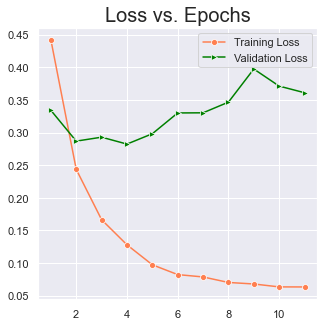

In [59]:
plot_learning_curve(h5)

In [60]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 5s 43ms/step - loss: 0.2908 - accuracy: 0.8957
Testing Accuracy:  89.57359790802002


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection</span></strong></li>
</ul></h4>

In [61]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

# using 75-25 split instead of 50-50 split as we need more data to train neural nets
X_train_vec, X_test_vec, y_train_vec, y_test_vec = train_test_split(X, y, test_size=0.15, random_state=seed, stratify=y)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (19401,), 
Test dataset shape: (3424,)


In [62]:
NGRAM_RANGE = (1, 3)
TOP_K = 8500
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2


kwargs = {
    'ngram_range' : NGRAM_RANGE,
    'dtype' : 'int32',
    'strip_accents' : 'unicode',
    'decode_error' : 'replace',
    'analyzer' : TOKEN_MODE,
    'min_df' : MIN_DOC_FREQ
}
vectorizer = TfidfVectorizer(**kwargs)
X_train_vec = vectorizer.fit_transform(X_train_vec)
X_test_vec = vectorizer.transform(X_test_vec)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (19401, 100123), 
Test dataset shape: (3424, 100123)


In [63]:
from sklearn.feature_selection import SelectKBest, f_classif

# Select best k features, with feature importance measured by f_classif
# Set k as 20000 or (if number of ngrams is less) number of ngrams   
selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
selector.fit(X_train_vec, y_train_vec)
X_train_vec = selector.transform(X_train_vec).astype('float32')
X_test_vec = selector.transform(X_test_vec).astype('float32')
X_train_vec = X_train_vec.toarray()
X_test_vec = X_test_vec.toarray()

print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (19401, 8500), 
Test dataset shape: (3424, 8500)


In [64]:
model6 = Sequential([
    Dense(30, activation='relu', input_shape=X_train_vec.shape[1:]),
    Dropout(0.5),
    Dense(20, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model6.compile(
    loss = 'binary_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [65]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h6 = model6.fit(
            X_train_vec, y_train_vec,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception:
    print("Training on CPU:")
    h6 = model6.fit(
            X_train_vec, y_train_vec,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.49545 >|> 
 ~| Epoch: 2 | Validation Loss: 0.39438 >|> 
 ~| Epoch: 3 | Validation Loss: 0.36998 >|> 
 ~| Epoch: 4 | Validation Loss: 0.36390 >|> 
 ~| Epoch: 5 | Validation Loss: 0.36159 >|> 
 ~| Epoch: 6 | Validation Loss: 0.35772 >|> 
 ~| Epoch: 7 | Validation Loss: 0.35724 >|> 
 ~| Epoch: 8 | Validation Loss: 0.35781 >|> 
 ~| Epoch: 9 | Validation Loss: 0.35516 >|> 
 ~| Epoch: 10 | Validation Loss: 0.35758 >|> 
 ~| Epoch: 11 | Validation Loss: 0.35398 >|> 
 ~| Epoch: 12 | Validation Loss: 0.35341 >|> 
 ~| Epoch: 13 | Validation Loss: 0.35584 >|> 
 ~| Epoch: 14 | Validation Loss: 0.35828 >|> 
 ~| Epoch: 15 | Validation Loss: 0.35152 >|> 
 ~| Epoch: 16 | Validation Loss: 0.35731 >|> 
 ~| Epoch: 17 | Validation Loss: 0.35526 >|> 
 ~| Epoch: 18 | Validation Loss: 0.35491 >|> 
 ~| Epoch: 19 | Validation Loss: 0.35875 >|> 
 ~| Epoch: 20 | Validation Loss: 0.35697 >|> 
 ~| Epoch: 21 | Validation Loss: 0.35740 >|> 
 ~| Epoch: 22 | Validation

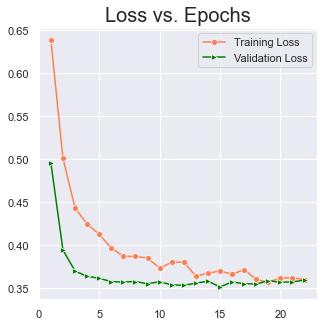

In [66]:
plot_learning_curve(h6)

In [67]:
loss, acc = model6.evaluate(X_test_vec, y_test_vec)
print("Testing Accuracy: ", acc*100)

107/107 [==============================] - 0s 2ms/step - loss: 0.4179 - accuracy: 0.8364
Testing Accuracy:  83.6448609828949


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection + Stratified KFold Training</span></strong></li>
</ul></h4>


Train dataset shape: (21912, 57554), 
Test dataset shape: (913, 57554)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85323, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00002: val_accuracy improved from 0.85323 to 0.88171, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00003: val_accuracy improved from 0.88171 to 0.88938, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00004: val_accuracy improved from 0.88938 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00005: val_accuracy improved from 0.89704 to 0.90361, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00006: val_accuracy did not improve from 0.90361

Epoch 00007: val_accuracy improved from 0.90361 to 0.90690, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00008

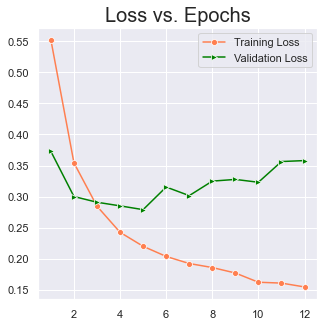

29/29 [==============================] - 0s 3ms/step - loss: 0.3230 - accuracy: 0.9146
Testing Accuracy:  91.45673513412476

Train dataset shape: (21912, 57447), 
Test dataset shape: (913, 57447)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.83899, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00002: val_accuracy improved from 0.83899 to 0.88171, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00003: val_accuracy improved from 0.88171 to 0.88938, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00004: val_accuracy improved from 0.88938 to 0.90033, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00005: val_accuracy did not improve from 0.90033

Epoch 00006: val_accuracy did not improve from 0.90033

Epoch 00007: val_accuracy improved from 0.90033 to 0.90471, saving model to models\binary

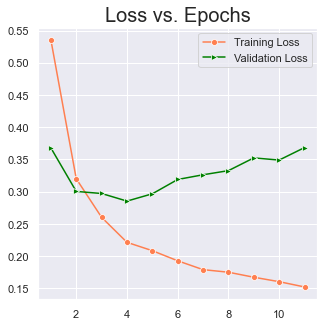

29/29 [==============================] - 0s 3ms/step - loss: 0.3490 - accuracy: 0.9135
Testing Accuracy:  91.3472056388855

Train dataset shape: (21912, 57262), 
Test dataset shape: (913, 57262)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85323, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00002: val_accuracy improved from 0.85323 to 0.87952, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00003: val_accuracy improved from 0.87952 to 0.90033, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00004: val_accuracy did not improve from 0.90033

Epoch 00005: val_accuracy improved from 0.90033 to 0.90252, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00006: val_accuracy improved from 0.90252 to 0.90581, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00007: val_

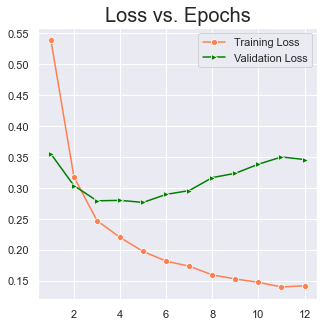

29/29 [==============================] - 0s 3ms/step - loss: 0.3383 - accuracy: 0.9157
Testing Accuracy:  91.56626462936401

Train dataset shape: (21912, 57637), 
Test dataset shape: (913, 57637)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85652, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00002: val_accuracy improved from 0.85652 to 0.88609, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00003: val_accuracy improved from 0.88609 to 0.89157, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00004: val_accuracy improved from 0.89157 to 0.89376, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00005: val_accuracy improved from 0.89376 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00006: val_accuracy improved from 0.89704 to 0.90909, saving model

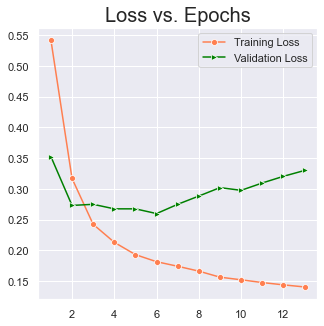

29/29 [==============================] - 0s 3ms/step - loss: 0.2976 - accuracy: 0.9179
Testing Accuracy:  91.78532361984253

Train dataset shape: (21912, 57537), 
Test dataset shape: (913, 57537)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87076, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00002: val_accuracy improved from 0.87076 to 0.89157, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00003: val_accuracy improved from 0.89157 to 0.89376, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00004: val_accuracy improved from 0.89376 to 0.89595, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00005: val_accuracy improved from 0.89595 to 0.90690, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00006: val_accuracy improved from 0.90690 to 0.90909, saving model

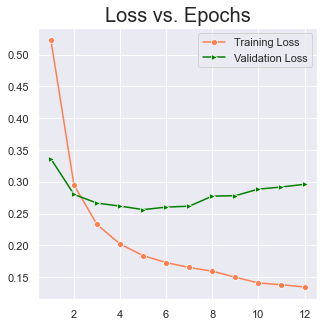

29/29 [==============================] - 0s 3ms/step - loss: 0.2884 - accuracy: 0.9168
Testing Accuracy:  91.67579412460327

Train dataset shape: (21912, 57565), 
Test dataset shape: (913, 57565)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87185, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00002: val_accuracy improved from 0.87185 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00003: val_accuracy improved from 0.89704 to 0.90909, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00004: val_accuracy improved from 0.90909 to 0.91566, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00005: val_accuracy improved from 0.91566 to 0.91676, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00006: val_accuracy improved from 0.91676 to 0.92442, saving model

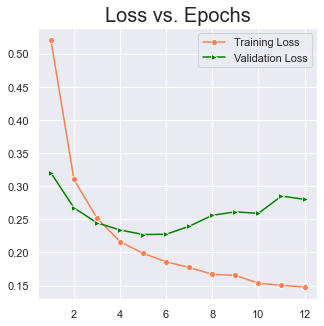

29/29 [==============================] - 0s 3ms/step - loss: 0.2274 - accuracy: 0.9244
Testing Accuracy:  92.4424946308136

Train dataset shape: (21912, 57489), 
Test dataset shape: (913, 57489)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86309, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00002: val_accuracy improved from 0.86309 to 0.88609, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00003: val_accuracy improved from 0.88609 to 0.89814, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00004: val_accuracy improved from 0.89814 to 0.90690, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00005: val_accuracy improved from 0.90690 to 0.90800, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00006: val_accuracy did not improve from 0.90800

Epoch 00007: val_

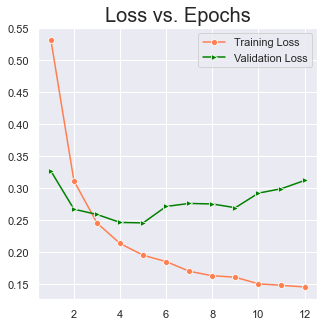

29/29 [==============================] - 0s 3ms/step - loss: 0.2691 - accuracy: 0.9135
Testing Accuracy:  91.3472056388855

Train dataset shape: (21912, 57051), 
Test dataset shape: (913, 57051)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86090, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00002: val_accuracy improved from 0.86090 to 0.88609, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00003: val_accuracy improved from 0.88609 to 0.89157, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00004: val_accuracy improved from 0.89157 to 0.90909, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00005: val_accuracy did not improve from 0.90909

Epoch 00006: val_accuracy did not improve from 0.90909

Epoch 00007: val_accuracy improved from 0.90909 to 0.91128, saving model to models\binary_

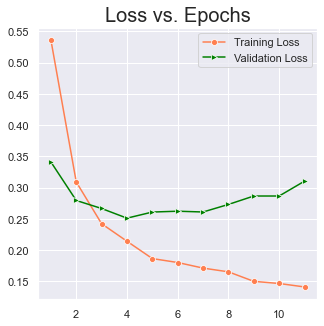

29/29 [==============================] - 0s 3ms/step - loss: 0.2867 - accuracy: 0.9124
Testing Accuracy:  91.23767614364624

Train dataset shape: (21912, 57517), 
Test dataset shape: (913, 57517)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85214, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00002: val_accuracy improved from 0.85214 to 0.87514, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00003: val_accuracy improved from 0.87514 to 0.88719, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00004: val_accuracy improved from 0.88719 to 0.89595, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00005: val_accuracy improved from 0.89595 to 0.89814, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00006: val_accuracy improved from 0.89814 to 0.90033, saving model

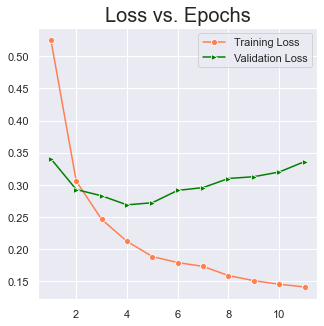

29/29 [==============================] - 0s 2ms/step - loss: 0.3099 - accuracy: 0.9080
Testing Accuracy:  90.79956412315369

Train dataset shape: (21912, 57480), 
Test dataset shape: (913, 57480)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85761, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00002: val_accuracy improved from 0.85761 to 0.88171, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00003: val_accuracy improved from 0.88171 to 0.89485, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00004: val_accuracy improved from 0.89485 to 0.89923, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00005: val_accuracy improved from 0.89923 to 0.90690, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00006: val_accuracy did not improve from 0.90690

Epoch 00007

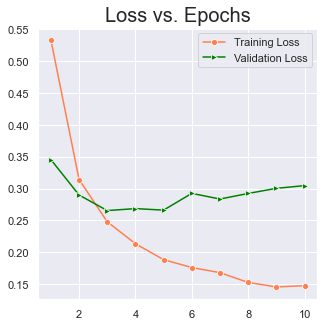

29/29 [==============================] - 0s 3ms/step - loss: 0.3047 - accuracy: 0.9146
Testing Accuracy:  91.45673513412476

Train dataset shape: (21912, 57496), 
Test dataset shape: (913, 57496)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.84556, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00002: val_accuracy improved from 0.84556 to 0.87404, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00003: val_accuracy improved from 0.87404 to 0.87733, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00004: val_accuracy improved from 0.87733 to 0.88938, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00005: val_accuracy improved from 0.88938 to 0.89595, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00006: val_accuracy did not improve from 0.89595

Epoch 00007

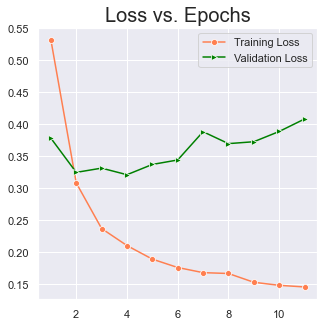

29/29 [==============================] - 0s 3ms/step - loss: 0.3726 - accuracy: 0.9014
Testing Accuracy:  90.14238715171814

Train dataset shape: (21912, 57533), 
Test dataset shape: (913, 57533)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85980, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00002: val_accuracy improved from 0.85980 to 0.88719, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00003: val_accuracy improved from 0.88719 to 0.89266, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00004: val_accuracy improved from 0.89266 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00005: val_accuracy improved from 0.89704 to 0.90690, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00006: val_accuracy did not improve from 0.90690

Epoch 00007

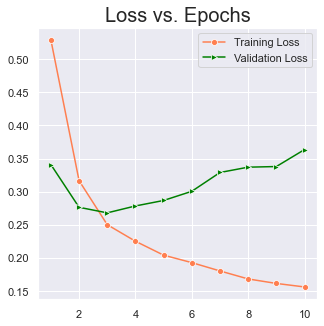

29/29 [==============================] - 0s 2ms/step - loss: 0.2866 - accuracy: 0.9069
Testing Accuracy:  90.69003462791443

Train dataset shape: (21912, 57356), 
Test dataset shape: (913, 57356)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85871, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00002: val_accuracy improved from 0.85871 to 0.87842, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00003: val_accuracy improved from 0.87842 to 0.88280, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00004: val_accuracy improved from 0.88280 to 0.88938, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00005: val_accuracy improved from 0.88938 to 0.89266, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00006: val_accuracy improved from 0.89266 to 0.89814, saving 

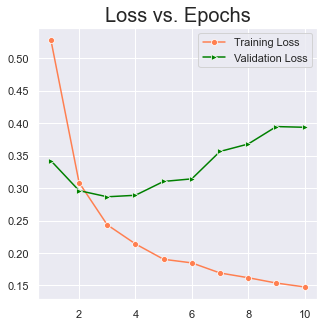

29/29 [==============================] - 0s 3ms/step - loss: 0.3142 - accuracy: 0.8981
Testing Accuracy:  89.81379866600037

Train dataset shape: (21912, 57557), 
Test dataset shape: (913, 57557)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88390, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00002: val_accuracy improved from 0.88390 to 0.91457, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00003: val_accuracy did not improve from 0.91457

Epoch 00004: val_accuracy improved from 0.91457 to 0.91676, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00005: val_accuracy improved from 0.91676 to 0.91895, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00006: val_accuracy improved from 0.91895 to 0.92114, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00007

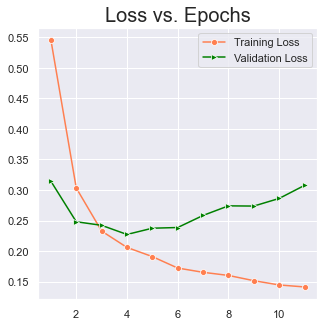

29/29 [==============================] - 0s 3ms/step - loss: 0.2737 - accuracy: 0.9233
Testing Accuracy:  92.33297109603882

Train dataset shape: (21912, 57671), 
Test dataset shape: (913, 57671)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87952, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00002: val_accuracy improved from 0.87952 to 0.89595, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00003: val_accuracy improved from 0.89595 to 0.90033, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00004: val_accuracy improved from 0.90033 to 0.90581, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00005: val_accuracy improved from 0.90581 to 0.90800, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00006: val_accuracy improved from 0.90800 to 0.91128, saving 

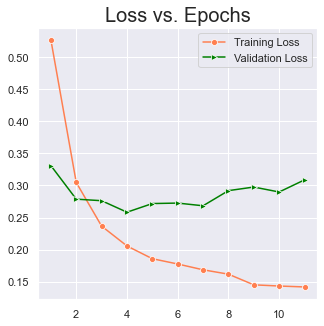

29/29 [==============================] - 0s 3ms/step - loss: 0.2898 - accuracy: 0.9168
Testing Accuracy:  91.67579412460327

Train dataset shape: (21912, 57417), 
Test dataset shape: (913, 57417)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.84666, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00002: val_accuracy improved from 0.84666 to 0.87295, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00003: val_accuracy improved from 0.87295 to 0.88499, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00004: val_accuracy improved from 0.88499 to 0.88719, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00005: val_accuracy improved from 0.88719 to 0.89047, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00006: val_accuracy improved from 0.89047 to 0.89595, saving 

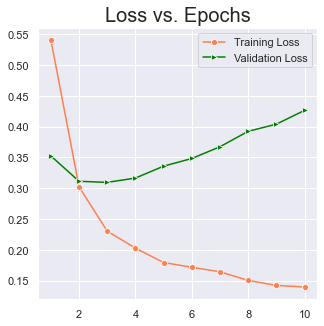

29/29 [==============================] - 0s 3ms/step - loss: 0.3924 - accuracy: 0.8992
Testing Accuracy:  89.92332816123962

Train dataset shape: (21912, 57386), 
Test dataset shape: (913, 57386)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86528, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00002: val_accuracy improved from 0.86528 to 0.88499, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00003: val_accuracy improved from 0.88499 to 0.89485, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00004: val_accuracy improved from 0.89485 to 0.90142, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00005: val_accuracy did not improve from 0.90142

Epoch 00006: val_accuracy improved from 0.90142 to 0.90800, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00007

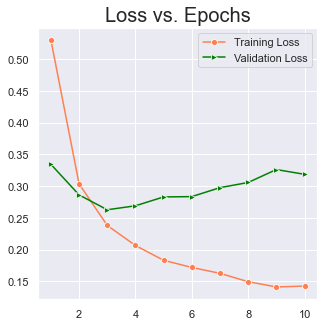

29/29 [==============================] - 0s 3ms/step - loss: 0.2976 - accuracy: 0.9135
Testing Accuracy:  91.3472056388855

Train dataset shape: (21912, 57629), 
Test dataset shape: (913, 57629)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88828, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00002: val_accuracy improved from 0.88828 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00003: val_accuracy improved from 0.89704 to 0.90581, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00004: val_accuracy improved from 0.90581 to 0.90690, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00005: val_accuracy did not improve from 0.90690

Epoch 00006: val_accuracy did not improve from 0.90690

Epoch 00007: val_accuracy improved from 0.90690 to 0.91128, saving model to models\bin

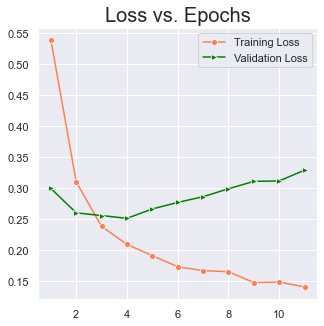

29/29 [==============================] - 0s 3ms/step - loss: 0.2988 - accuracy: 0.9146
Testing Accuracy:  91.45673513412476

Train dataset shape: (21912, 57185), 
Test dataset shape: (913, 57185)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87514, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00002: val_accuracy improved from 0.87514 to 0.88609, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00003: val_accuracy improved from 0.88609 to 0.89376, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00004: val_accuracy improved from 0.89376 to 0.89923, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00005: val_accuracy improved from 0.89923 to 0.91347, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00006: val_accuracy did not improve from 0.91347

Epoch 00007

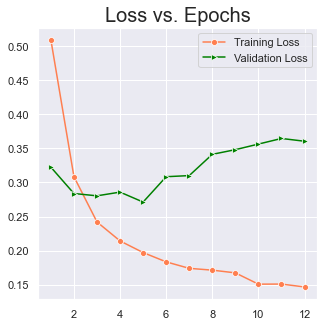

29/29 [==============================] - 0s 3ms/step - loss: 0.2712 - accuracy: 0.9135
Testing Accuracy:  91.3472056388855

Train dataset shape: (21912, 57644), 
Test dataset shape: (913, 57644)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85542, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00002: val_accuracy improved from 0.85542 to 0.88499, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00003: val_accuracy improved from 0.88499 to 0.88938, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00004: val_accuracy improved from 0.88938 to 0.89485, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00005: val_accuracy did not improve from 0.89485

Epoch 00006: val_accuracy improved from 0.89485 to 0.89595, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00007:

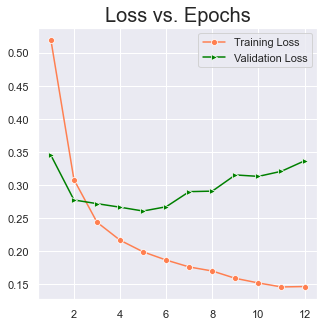

29/29 [==============================] - 0s 3ms/step - loss: 0.3366 - accuracy: 0.9025
Testing Accuracy:  90.2519166469574

Train dataset shape: (21912, 57569), 
Test dataset shape: (913, 57569)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86637, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00002: val_accuracy improved from 0.86637 to 0.88390, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00003: val_accuracy improved from 0.88390 to 0.90361, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00004: val_accuracy did not improve from 0.90361

Epoch 00005: val_accuracy improved from 0.90361 to 0.91238, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00006: val_accuracy did not improve from 0.91238

Epoch 00007: val_accuracy did not improve from 0.91238

Epoch 00008: val_accuracy impr

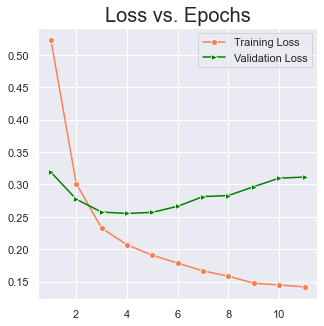

29/29 [==============================] - 0s 3ms/step - loss: 0.3098 - accuracy: 0.9168
Testing Accuracy:  91.67579412460327

Train dataset shape: (21912, 57377), 
Test dataset shape: (913, 57377)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.85323, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00002: val_accuracy improved from 0.85323 to 0.88499, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00003: val_accuracy improved from 0.88499 to 0.89157, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00004: val_accuracy improved from 0.89157 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00005: val_accuracy improved from 0.89704 to 0.90909, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00006: val_accuracy did not improve from 0.90909

Epoch 00006

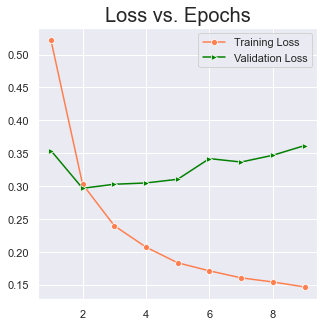

29/29 [==============================] - 0s 3ms/step - loss: 0.3104 - accuracy: 0.9091
Testing Accuracy:  90.90909361839294

Train dataset shape: (21912, 57634), 
Test dataset shape: (913, 57634)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86637, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00002: val_accuracy improved from 0.86637 to 0.88828, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00003: val_accuracy improved from 0.88828 to 0.90033, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00004: val_accuracy improved from 0.90033 to 0.90581, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00005: val_accuracy did not improve from 0.90581

Epoch 00006: val_accuracy did not improve from 0.90581

Epoch 00007: val_accuracy did not improve from 0.90581

Epoch 00008: val_accuracy imp

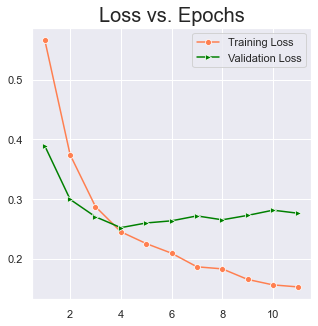

29/29 [==============================] - 0s 3ms/step - loss: 0.2760 - accuracy: 0.9146
Testing Accuracy:  91.45673513412476

Train dataset shape: (21912, 57641), 
Test dataset shape: (913, 57641)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86309, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00002: val_accuracy improved from 0.86309 to 0.87842, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00003: val_accuracy improved from 0.87842 to 0.88609, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00004: val_accuracy improved from 0.88609 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00005: val_accuracy improved from 0.89704 to 0.90033, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00006: val_accuracy did not improve from 0.90033

Epoch 00007

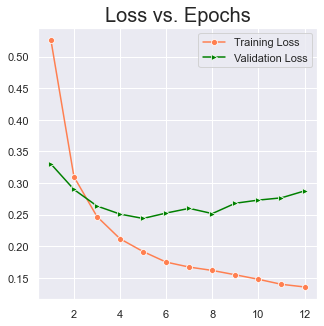

29/29 [==============================] - 0s 3ms/step - loss: 0.2682 - accuracy: 0.9091
Testing Accuracy:  90.90909361839294

Train dataset shape: (21912, 57420), 
Test dataset shape: (913, 57420)

Features Train dataset shape: (21912, 15000), 
FeaturesTest dataset shape: (913, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86418, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00002: val_accuracy improved from 0.86418 to 0.88499, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00003: val_accuracy improved from 0.88499 to 0.88938, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00004: val_accuracy improved from 0.88938 to 0.89595, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00005: val_accuracy improved from 0.89595 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00006: val_accuracy improved from 0.89704 to 0.90361, saving 

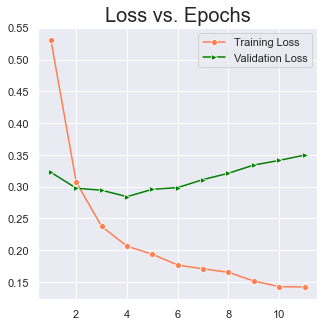

29/29 [==============================] - 0s 3ms/step - loss: 0.3412 - accuracy: 0.9135
Testing Accuracy:  91.3472056388855


In [68]:
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_extraction.text import TfidfVectorizer


def get_model_name(k):
    return f'model_{k}.h5'

NUM_SPLITS = 25
EPOCHS = 50
save_dir = Path('./models/binary_classfiier/dl/merged_descr')
fold_var = 1
NGRAM_RANGE = (1, 2)
TOP_K = 15000
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2
NUM_CLASSES = 2

kwargs = {
        'ngram_range' : NGRAM_RANGE,
        'dtype' : 'int32',
        'strip_accents' : 'unicode',
        'decode_error' : 'replace',
        'analyzer' : TOKEN_MODE,
        'min_df' : MIN_DOC_FREQ
    }

val_accs = []
skf = StratifiedKFold(n_splits=NUM_SPLITS, shuffle=True, random_state=seed)

for train_indices, test_indices in skf.split(X, y):
    X_train_split, X_test_split = X[train_indices], X[test_indices]
    y_train_split, y_test_split = y[train_indices], y[test_indices]
    vectorizer = TfidfVectorizer(**kwargs)
    X_train_vec = vectorizer.fit_transform(X_train_split)
    X_test_vec = vectorizer.transform(X_test_split)
    print(f"\nTrain dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

    selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
    selector.fit(X_train_vec, y_train_split)
    X_train_vec = selector.transform(X_train_vec).astype('float32')
    X_test_vec = selector.transform(X_test_vec).astype('float32')
    X_train_vec = X_train_vec.toarray()
    X_test_vec = X_test_vec.toarray()

    print(f"\nFeatures Train dataset shape: {X_train_vec.shape}, \nFeaturesTest dataset shape: {X_test_vec.shape}")
    model_ = None
    model_ = Sequential([   
        Dense(30, activation='relu', input_shape=X_train_vec.shape[1:]),
        Dropout(0.5),
        Dense(20, activation='relu'),
        Dropout(0.5),
        Dense(10, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    model_.compile(
        loss = 'binary_crossentropy',
        optimizer = 'adam',
        metrics = ['accuracy']
    )
    
    checkpoint = tensorflow.keras.callbacks.ModelCheckpoint(save_dir / get_model_name(fold_var),
                                                            monitor='val_accuracy',
                                                            verbose=1,
                                                            save_best_only=True,
                                                            mode='max')

    h_ = model_.fit(
            X_train_vec, y_train_split,
            validation_data = (X_test_vec, y_test_split),  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [checkpoint, early_stop, lr_reduce_on_plateau],
            verbose = False)
    
    model_.load_weights(save_dir / get_model_name(fold_var))
    plot_learning_curve(h_)
    loss, acc = model_.evaluate(X_test_vec, y_test_split)
    print("Testing Accuracy: ", acc*100)
    val_accs.append(acc)
    tensorflow.keras.backend.clear_session()
    fold_var += 1

In [69]:
print("Testing Accuracy: ", np.mean(val_accs)*100)   # average k fold accuracy

Testing Accuracy:  91.21577191352844


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Metrics: </span></strong></li>
</ul></h3>

<table style="width:100%">
  <tr>
    <th>Model</th>
    <th>Test Accuracy</th>
  </tr>
  <tr>
    <td>Simple Feed-Forward Net using Embedding Layer</td>
    <td>87.41%</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Batch Norm</td>
    <td>84.70%</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Dropout</td>
    <td>87.70%</td>
  </tr>
    <tr>
    <td>Feed-Forward NN + Pre-trained GloVe embeddings</td>
    <td>81.51%</td>
  </tr>
  <tr>
    <td>LSTM</td>
    <td>88.87%</td>
  </tr>
    
  <tr>
    <td>Bi-Directional LSTM</td>
    <td>89.95%</td>
  </tr>
<tr>
    <td>Convolution Blocks (Dimensionality Reduction) + LSTM</td>
    <td>89.37%</td>
  </tr>
    <tr>
    <td>Convolution Blocks (Dimensionality Reduction) + Bi-LSTM</td>
    <td>89.57%</td>
  </tr>
<tr>
    <td>TfIdf Vectors + Feature Selection + Feed-forward Neural Net</td>
    <td>83.64%</td>
  </tr>
<tr>
    <td>Stratified KFold Validation + TfIdf Vectors + Feature Selection + +Feed-forward Neural Net</td>
    <td>91.21%</td>
  </tr>
</table>

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Augmented, Upsampled Data - DL Binary Classifier</span></strong></li>
</ul></h1>

<h4>
<ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">OBJECTIVE:</span></strong></li>
</ul>
<p><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use the text data to build a deep-learning based binary classifier.</span></p>
    </h4>

In [1]:
# imports

import warnings
warnings.filterwarnings('ignore')

import os
import math
import random
from time import time
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import defaultdict, Counter
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud, STOPWORDS
import tensorflow

tqdm.pandas()
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

In [2]:
# reproducibility
seed = 7
random.seed(seed)
tensorflow.random.set_seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import the clean data.</span></strong></li>
</ul></h3>

In [3]:
dataset = pd.read_csv('./data/augmented_upsampled_data.csv')
dataset.sample(10)

,translated_description,label
4543,outlook start,0
12915,password account expires,1
17197,Need help changing password password managemen...,0
12943,nanrfakurtyar send Monday pm dba subject pl ch...,1
7027,see attachment discritpion discription show co...,1
12068,log on phone software error message phone auth...,1
9686,host name volume label sys host name ab space ...,1
25738,work work failure work programmer work,1
22344,dwnload prb try downloading desktop engineerin...,0
9451,I tool and batch management is not working,1


In [4]:
dataset.isna().sum()

translated_description    0
label                     0
dtype: int64

In [5]:
dataset.label.value_counts()

1    13109
0    13109
Name: label, dtype: int64

In [6]:
X = np.array(dataset.translated_description)
y = np.array(dataset.label)
X.shape, y.shape

((26218,), (26218,))

In [7]:
from tensorflow.keras.utils import to_categorical
y_dummy_coded = to_categorical(y)
y[0], y_dummy_coded[0]

(0, array([1., 0.], dtype=float32))

In [8]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y_dummy_coded, test_size=.15,
                                                    random_state=seed, stratify=y_dummy_coded)  # splits are stratified by y

In [9]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((22285,), (3933,), (22285, 2), (3933, 2))

In [10]:
X_train[0], y_train[0]  # check sample

('forget password erp sid  make  attempt fail could reset user dgrtrkjs',
 array([1., 0.], dtype=float32))

In [11]:
# TODO: Check the distributions of groups in training and testing sets, i.e, if they vary too much
# stratify by y if required during splits
# or data augmentation to upsample minority classes to balance the group distributions

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Tokenize and pad sequences</span></strong></li>
</ul></h3>

In [12]:
# define params
NUM_WORDS = 20000
EMBEDDING_DIM = 300
MAX_LEN = 100 # dataset['word_length'].max()
MAX_LEN

100

In [13]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


tokenizer = Tokenizer(num_words=NUM_WORDS)
tokenizer.fit_on_texts(X_train)
X_train_tokens = tokenizer.texts_to_sequences(X_train)
X_test_tokens = tokenizer.texts_to_sequences(X_test)
X_train_tokens[0], X_test_tokens[0]

([1127, 5, 8, 20, 165, 450, 46, 87, 22, 11, 9816],
 [396,
  107,
  1881,
  669,
  16,
  8,
  7444,
  206,
  7,
  1735,
  375,
  15,
  2868,
  206,
  288,
  7,
  484,
  84,
  320,
  234,
  179])

In [14]:
y_train[0], y_test[0]

(array([1., 0.], dtype=float32), array([0., 1.], dtype=float32))

In [15]:
# pad sequences to cut longer texts to a uniform length and pad the sentences that are shorter than that with <PAD> token

# using just 20 words from each headline will severely limit the information that is 
# available to the model and affect performance although the training will be faster
X_train_padded = pad_sequences(X_train_tokens,
                               padding='post',
                               truncating='post',
                               maxlen=MAX_LEN)
X_test_padded = pad_sequences(X_test_tokens,
                              padding='post',
                              truncating='post',
                              maxlen=MAX_LEN)


print(f'X train:  {X_train_padded.shape}\nX test:   {X_test_padded.shape}')

X train:  (22285, 100)
X test:   (3933, 100)


In [16]:
pprint(X_train_padded[0], compact=True)

array([1127,    5,    8,   20,  165,  450,   46,   87,   22,   11, 9816,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0])


In [17]:
WORD_TO_INDEX = tokenizer.word_index
# pprint(WORD_TO_INDEX, compact=True)
pprint(list(WORD_TO_INDEX.keys())[:100], compact=True)

['u', 'work', 'system', 'the', 'password', 'ts', 'tool', 'erp', 'job',
 'company', 'user', 'plant', 'to', 'security', 'error', 'problem', 'of',
 'access', 'account', 'sid', 'need', 'reset', 'use', 'help', 'get', 'ticket',
 'hostname', 'message', 'printer', 'issue', 'email', 'window', 'order', 'time',
 'engineering', 'failure', 'connection', 'new', 'change', 'site', 'check',
 'scheduler', 'name', 'see', 'request', 'fail', 'update', 'information',
 'login', 'a', 'phone', 'send', 'contact', 'unable', 'server', 'or', 'and',
 'streaming', 'with', 'create', 'try', 'germany', 'type', 'log', 'crm',
 'network', 'open', 'team', 'e', 'report', 't', 'show', 'game', 'call', 'pc',
 'is', 'backup', 'number', 'i', 'management', 'print', 'in', 'not', 'view',
 'receive', 'circuit', 'could', 'file', 'programmer', 'connect', 'no',
 'delivery', 'outlook', 'mail', 'sale', 'also', 'software', 'production',
 'start', 'customer']


In [18]:
VOCAB_SIZE = len(WORD_TO_INDEX) + 1
VOCAB_SIZE

13348

In [19]:
# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/sequence/pad_sequences
def retrieve_description_feat(x, mapping=WORD_TO_INDEX) -> str:
    # increment 3 
    mapping = {k:(v + 3) for k, v in mapping.items()}
    mapping['<PAD>'] = 0
    mapping['<START>'] = 1
    mapping['<UNK>'] = 2
    inv_mapping = {v: k for k, v in mapping.items()}
    return str(" ".join(inv_mapping.get(i, '<NA>') for i in x))

retrieve_description_feat(X_test_padded[7])

'problem find <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">GloVe Embeddings</span></strong></li>
</ul></h3>

In [20]:
EMBEDDING_DIM

300

In [21]:
def get_embedding_matrix(embedding_dim=EMBEDDING_DIM):
    embeddings = defaultdict()
    if embedding_dim == 200:
        file_path = f'./data/glove.6B.{embedding_dim}d.txt'
    elif embedding_dim == 300:
        file_path = f'./data/glove.840B.{embedding_dim}d.txt'
    for l in open(file_path, encoding='utf-8'):
        word = l.split(" ")[0]
        embeddings[word] = np.asarray(l.split(" ")[1:], dtype='float32')

    embeddings = dict(embeddings)

    # create a weight matrix for words in training docs
    embedding_matrix = np.zeros((NUM_WORDS, embedding_dim))

    for word, idx in WORD_TO_INDEX.items():
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            embedding_matrix[idx] = embedding_vector

    return embedding_matrix

In [22]:
# use pre-trained glove embedding matrix to initialize weights in our model
embedding_matrix = get_embedding_matrix()
embedding_matrix.shape

(20000, 300)

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net</span></strong></li>
</ul></h4>

In [23]:
# !pip install livelossplot
from tensorflow.python.keras.models import Sequential
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.regularizers import l2
from tensorflow.keras.constraints import max_norm, unit_norm
from tensorflow.python.keras.callbacks import LambdaCallback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Flatten, Dense, Activation, BatchNormalization, Dropout, Embedding, LSTM, MaxPooling1D, Conv1D, Bidirectional

In [24]:
NUM_CLASSES = 2
VOCAB_SIZE, MAX_LEN, EMBEDDING_DIM, NUM_CLASSES

(13348, 100, 300, 2)

In [25]:
# define model

model1 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(1024, activation = 'relu'),
    Dense(1024, activation = 'relu'),
    Dense(128, activation = 'relu'),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model1.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [26]:
# Define Callbacks and a few helper functions

# simplify the training log
simple_log = LambdaCallback(
    on_epoch_end = lambda e, l: print(f" ~| Epoch: {e+1} | Validation Loss: {l['val_loss']:.5f}", end =" >|> \n" ))

# early stopping
early_stop = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=7,
                              verbose=0, 
                              restore_best_weights=True)

# learning rate reduction
lr_reduce_on_plateau = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=4, 
                                            verbose=1, 
                                            factor=0.4,
                                            min_lr=0.00001)

def plot_learning_curve(hist):
    sns.set()
    plt.figure(figsize=(5,5))
    train = hist.history['loss']
    val = hist.history['val_loss']
    epochs_run = range(1,len(train) + 1)
    sns.lineplot(epochs_run, train, marker = 'o', color = 'coral', label = 'Training Loss')
    sns.lineplot(epochs_run, val,  marker = '>', color = 'green', label = 'Validation Loss')
    plt.title("Loss vs. Epochs", fontsize = 20)
    plt.legend()
    plt.show()

In [27]:
X_train[0]

'forget password erp sid  make  attempt fail could reset user dgrtrkjs'

In [28]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((22285,), (22285, 2), (3933,), (3933, 2))

In [29]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("\nTraining on CPU:")
    h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.26657 >|> 
 ~| Epoch: 2 | Validation Loss: 0.27698 >|> 
 ~| Epoch: 3 | Validation Loss: 0.27947 >|> 
 ~| Epoch: 4 | Validation Loss: 0.29024 >|> 
 ~| Epoch: 5 | Validation Loss: 0.33299 >|> 
 ~| Epoch: 6 | Validation Loss: 0.35967 >|> 
 ~| Epoch: 7 | Validation Loss: 0.31667 >|> 
 ~| Epoch: 8 | Validation Loss: 0.41147 >|> 

Training Done.


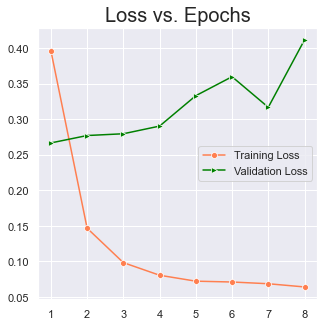

In [30]:
plot_learning_curve(h1)

In [31]:
loss, acc = model1.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

123/123 [==============================] - 0s 3ms/step - loss: 0.2686 - accuracy: 0.8863
Testing Loss:  26.855483651161194
Testing Accuracy:  88.63462805747986


<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>This model is clearly overfitting, we will add regularization to the next iteration
 </span></ul></h4>

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net + Batch Normalization</span></strong></li>
</ul></h4>

In [32]:
# define model

model2 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model2.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [33]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.35288 >|> 
 ~| Epoch: 2 | Validation Loss: 0.26205 >|> 
 ~| Epoch: 3 | Validation Loss: 0.27754 >|> 
 ~| Epoch: 4 | Validation Loss: 0.39938 >|> 
 ~| Epoch: 5 | Validation Loss: 0.77244 >|> 
 ~| Epoch: 6 | Validation Loss: 0.26548 >|> 
 ~| Epoch: 7 | Validation Loss: 0.37249 >|> 
 ~| Epoch: 8 | Validation Loss: 0.30677 >|> 
 ~| Epoch: 9 | Validation Loss: 0.41319 >|> 

Training Done.


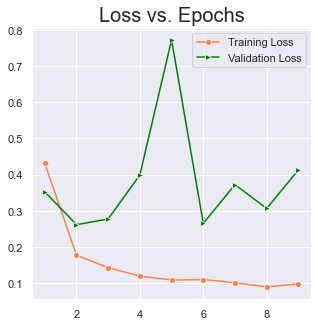

In [34]:
plot_learning_curve(h2)

In [35]:
loss, acc = model2.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

123/123 [==============================] - 0s 3ms/step - loss: 0.2640 - accuracy: 0.9013
Testing Loss:  26.402437686920166
Testing Accuracy:  90.13475775718689


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net + Dropout</span></strong></li>
</ul></h4>

In [36]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(20, activation = 'relu'),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [37]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.27458 >|> 
 ~| Epoch: 2 | Validation Loss: 0.23892 >|> 
 ~| Epoch: 3 | Validation Loss: 0.25674 >|> 
 ~| Epoch: 4 | Validation Loss: 0.28678 >|> 
 ~| Epoch: 5 | Validation Loss: 0.27314 >|> 
 ~| Epoch: 6 | Validation Loss: 0.36057 >|> 

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 7 | Validation Loss: 0.37500 >|> 
 ~| Epoch: 8 | Validation Loss: 0.39637 >|> 
 ~| Epoch: 9 | Validation Loss: 0.41275 >|> 

Training Done.


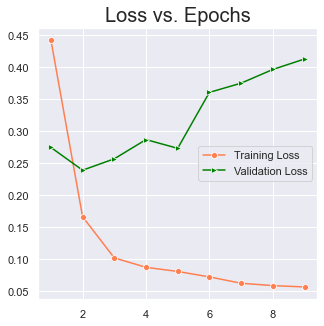

In [38]:
plot_learning_curve(h3)

In [39]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

123/123 [==============================] - 0s 3ms/step - loss: 0.2469 - accuracy: 0.9021
Testing Accuracy:  90.21103382110596


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use pre-trained embeddings</span></strong></li>
</ul></h4>

In [40]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=NUM_WORDS, output_dim=EMBEDDING_DIM, input_length=MAX_LEN, weights=[embedding_matrix], trainable=True),
    Flatten(),
    Dense(30, activation = 'relu'),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [41]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.42110 >|> 
 ~| Epoch: 2 | Validation Loss: 0.36518 >|> 
 ~| Epoch: 3 | Validation Loss: 0.34072 >|> 
 ~| Epoch: 4 | Validation Loss: 0.35497 >|> 
 ~| Epoch: 5 | Validation Loss: 0.35743 >|> 
 ~| Epoch: 6 | Validation Loss: 0.33771 >|> 
 ~| Epoch: 7 | Validation Loss: 0.43173 >|> 
 ~| Epoch: 8 | Validation Loss: 0.46950 >|> 
 ~| Epoch: 9 | Validation Loss: 0.50198 >|> 
 ~| Epoch: 10 | Validation Loss: 0.48442 >|> 
 ~| Epoch: 11 | Validation Loss: 0.49287 >|> 
 ~| Epoch: 12 | Validation Loss: 0.55885 >|> 
 ~| Epoch: 13 | Validation Loss: 0.70739 >|> 

Training Done.


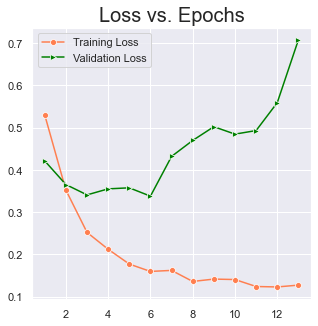

In [42]:
plot_learning_curve(h3)

In [43]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

123/123 [==============================] - 0s 3ms/step - loss: 0.3594 - accuracy: 0.8912
Testing Accuracy:  89.1177237033844


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">LSTM</span></strong></li>
</ul></h4>

In [44]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    LSTM(32),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [45]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.69252 >|> 
 ~| Epoch: 2 | Validation Loss: 0.69072 >|> 
 ~| Epoch: 3 | Validation Loss: 0.68769 >|> 
 ~| Epoch: 4 | Validation Loss: 0.68089 >|> 
 ~| Epoch: 5 | Validation Loss: 0.68698 >|> 
 ~| Epoch: 6 | Validation Loss: 0.50315 >|> 
 ~| Epoch: 7 | Validation Loss: 0.41877 >|> 
 ~| Epoch: 8 | Validation Loss: 0.40158 >|> 
 ~| Epoch: 9 | Validation Loss: 0.38546 >|> 
 ~| Epoch: 10 | Validation Loss: 0.37950 >|> 
 ~| Epoch: 11 | Validation Loss: 0.37468 >|> 
 ~| Epoch: 12 | Validation Loss: 0.37197 >|> 
 ~| Epoch: 13 | Validation Loss: 0.34412 >|> 
 ~| Epoch: 14 | Validation Loss: 0.33276 >|> 
 ~| Epoch: 15 | Validation Loss: 0.34234 >|> 
 ~| Epoch: 16 | Validation Loss: 0.35067 >|> 
 ~| Epoch: 17 | Validation Loss: 0.31887 >|> 
 ~| Epoch: 18 | Validation Loss: 0.31449 >|> 
 ~| Epoch: 19 | Validation Loss: 0.34424 >|> 
 ~| Epoch: 20 | Validation Loss: 0.28826 >|> 
 ~| Epoch: 21 | Validation Loss: 0.32609 >|> 
 ~| Epoch: 22 | Validation

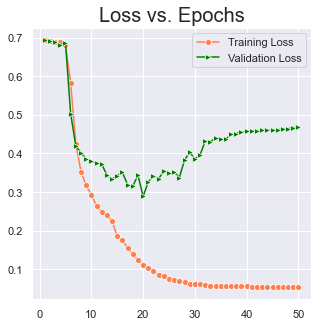

In [46]:
plot_learning_curve(h4)

In [47]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

123/123 [==============================] - 1s 5ms/step - loss: 0.4922 - accuracy: 0.9158
Testing Accuracy:  91.58403277397156


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [48]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Bidirectional(LSTM(32)),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [49]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.35770 >|> 
 ~| Epoch: 2 | Validation Loss: 0.32140 >|> 
 ~| Epoch: 3 | Validation Loss: 0.27678 >|> 
 ~| Epoch: 4 | Validation Loss: 0.26556 >|> 
 ~| Epoch: 5 | Validation Loss: 0.25546 >|> 
 ~| Epoch: 6 | Validation Loss: 0.25183 >|> 
 ~| Epoch: 7 | Validation Loss: 0.23724 >|> 
 ~| Epoch: 8 | Validation Loss: 0.28229 >|> 
 ~| Epoch: 9 | Validation Loss: 0.24514 >|> 
 ~| Epoch: 10 | Validation Loss: 0.24821 >|> 
 ~| Epoch: 11 | Validation Loss: 0.25777 >|> 

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 12 | Validation Loss: 0.24529 >|> 
 ~| Epoch: 13 | Validation Loss: 0.25186 >|> 
 ~| Epoch: 14 | Validation Loss: 0.25276 >|> 

Training Done.


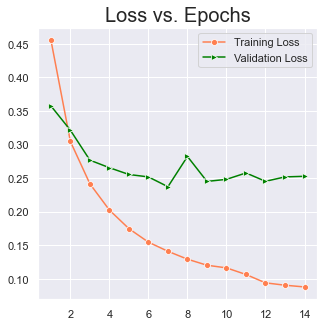

In [50]:
plot_learning_curve(h4)

In [51]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

123/123 [==============================] - 1s 6ms/step - loss: 0.2224 - accuracy: 0.9133
Testing Accuracy:  91.3297712802887


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + LSTM</span></strong></li>
</ul></h4>

In [52]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    LSTM(75),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [53]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.35572 >|> 
 ~| Epoch: 2 | Validation Loss: 0.27669 >|> 
 ~| Epoch: 3 | Validation Loss: 0.26382 >|> 
 ~| Epoch: 4 | Validation Loss: 0.25972 >|> 
 ~| Epoch: 5 | Validation Loss: 0.22674 >|> 
 ~| Epoch: 6 | Validation Loss: 0.30527 >|> 
 ~| Epoch: 7 | Validation Loss: 0.25744 >|> 
 ~| Epoch: 8 | Validation Loss: 0.25456 >|> 
 ~| Epoch: 9 | Validation Loss: 0.26326 >|> 

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 10 | Validation Loss: 0.31021 >|> 
 ~| Epoch: 11 | Validation Loss: 0.29070 >|> 
 ~| Epoch: 12 | Validation Loss: 0.29581 >|> 

Training Done.


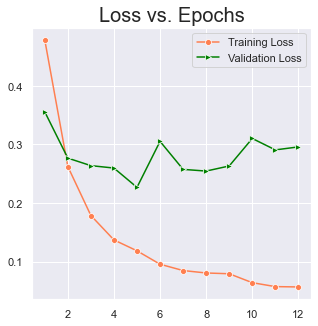

In [54]:
plot_learning_curve(h5)

In [55]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

123/123 [==============================] - 1s 5ms/step - loss: 0.2275 - accuracy: 0.9166
Testing Accuracy:  91.66030883789062


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [56]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Bidirectional(LSTM(75, recurrent_dropout=0.5)),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [57]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.29827 >|> 
 ~| Epoch: 2 | Validation Loss: 0.25080 >|> 
 ~| Epoch: 3 | Validation Loss: 0.21678 >|> 
 ~| Epoch: 4 | Validation Loss: 0.27556 >|> 
 ~| Epoch: 5 | Validation Loss: 0.25120 >|> 
 ~| Epoch: 6 | Validation Loss: 0.28130 >|> 
 ~| Epoch: 7 | Validation Loss: 0.26769 >|> 
 ~| Epoch: 8 | Validation Loss: 0.26127 >|> 
 ~| Epoch: 9 | Validation Loss: 0.28917 >|> 
 ~| Epoch: 10 | Validation Loss: 0.29104 >|> 

Training Done.


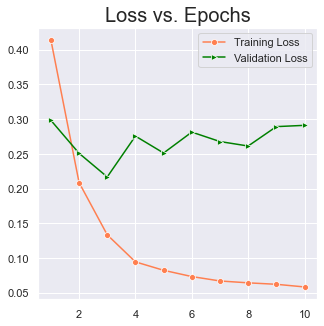

In [58]:
plot_learning_curve(h5)

In [59]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

123/123 [==============================] - 5s 45ms/step - loss: 0.2261 - accuracy: 0.9169
Testing Accuracy:  91.6857361793518


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection</span></strong></li>
</ul></h4>

In [60]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

# using 75-25 split instead of 50-50 split as we need more data to train neural nets
X_train_vec, X_test_vec, y_train_vec, y_test_vec = train_test_split(X, y, test_size=0.15, random_state=seed, stratify=y)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (22285,), 
Test dataset shape: (3933,)


In [61]:
NGRAM_RANGE = (1, 3)
TOP_K = 8500
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2


kwargs = {
    'ngram_range' : NGRAM_RANGE,
    'dtype' : 'int32',
    'strip_accents' : 'unicode',
    'decode_error' : 'replace',
    'analyzer' : TOKEN_MODE,
    'min_df' : MIN_DOC_FREQ
}
vectorizer = TfidfVectorizer(**kwargs)
X_train_vec = vectorizer.fit_transform(X_train_vec)
X_test_vec = vectorizer.transform(X_test_vec)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (22285, 119901), 
Test dataset shape: (3933, 119901)


In [62]:
from sklearn.feature_selection import SelectKBest, f_classif

# Select best k features, with feature importance measured by f_classif
# Set k as 20000 or (if number of ngrams is less) number of ngrams   
selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
selector.fit(X_train_vec, y_train_vec)
X_train_vec = selector.transform(X_train_vec).astype('float32')
X_test_vec = selector.transform(X_test_vec).astype('float32')
X_train_vec = X_train_vec.toarray()
X_test_vec = X_test_vec.toarray()

print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (22285, 8500), 
Test dataset shape: (3933, 8500)


In [63]:
model6 = Sequential([
    Dense(30, activation='relu', input_shape=X_train_vec.shape[1:]),
    Dropout(0.5),
    Dense(20, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model6.compile(
    loss = 'binary_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [64]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h6 = model6.fit(
            X_train_vec, y_train_vec,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception:
    print("Training on CPU:")
    h6 = model6.fit(
            X_train_vec, y_train_vec,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.44404 >|> 
 ~| Epoch: 2 | Validation Loss: 0.38773 >|> 
 ~| Epoch: 3 | Validation Loss: 0.37772 >|> 
 ~| Epoch: 4 | Validation Loss: 0.37140 >|> 
 ~| Epoch: 5 | Validation Loss: 0.36992 >|> 
 ~| Epoch: 6 | Validation Loss: 0.36377 >|> 
 ~| Epoch: 7 | Validation Loss: 0.35798 >|> 
 ~| Epoch: 8 | Validation Loss: 0.35687 >|> 
 ~| Epoch: 9 | Validation Loss: 0.35434 >|> 
 ~| Epoch: 10 | Validation Loss: 0.35774 >|> 
 ~| Epoch: 11 | Validation Loss: 0.35099 >|> 
 ~| Epoch: 12 | Validation Loss: 0.36085 >|> 
 ~| Epoch: 13 | Validation Loss: 0.35106 >|> 
 ~| Epoch: 14 | Validation Loss: 0.34974 >|> 
 ~| Epoch: 15 | Validation Loss: 0.35140 >|> 
 ~| Epoch: 16 | Validation Loss: 0.35375 >|> 
 ~| Epoch: 17 | Validation Loss: 0.35468 >|> 
 ~| Epoch: 18 | Validation Loss: 0.35044 >|> 
 ~| Epoch: 19 | Validation Loss: 0.35326 >|> 
 ~| Epoch: 20 | Validation Loss: 0.35471 >|> 
 ~| Epoch: 21 | Validation Loss: 0.35229 >|> 

Training Done.


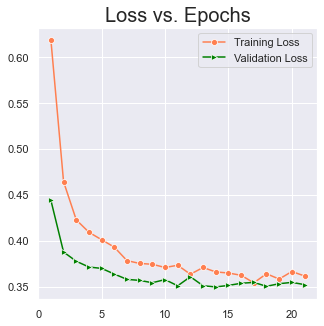

In [65]:
plot_learning_curve(h6)

In [66]:
loss, acc = model6.evaluate(X_test_vec, y_test_vec)
print("Testing Accuracy: ", acc*100)

123/123 [==============================] - 0s 2ms/step - loss: 0.4017 - accuracy: 0.8474
Testing Accuracy:  84.74447131156921


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection + Stratified KFold Training</span></strong></li>
</ul></h4>


Train dataset shape: (25169, 65104), 
Test dataset shape: (1049, 65104)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86559, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00002: val_accuracy improved from 0.86559 to 0.88084, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00003: val_accuracy improved from 0.88084 to 0.89228, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00004: val_accuracy improved from 0.89228 to 0.89514, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00005: val_accuracy improved from 0.89514 to 0.90944, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00006: val_accuracy improved from 0.90944 to 0.91134, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00007: val_accuracy did not improve from 0.91134

Epoch 000

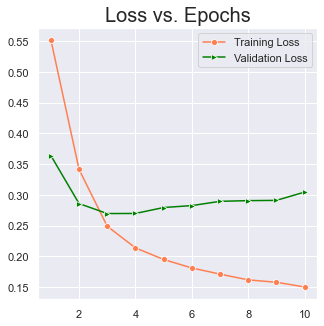

33/33 [==============================] - 0s 3ms/step - loss: 0.2826 - accuracy: 0.9113
Testing Accuracy:  91.13441109657288

Train dataset shape: (25169, 65060), 
Test dataset shape: (1049, 65060)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86749, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00002: val_accuracy improved from 0.86749 to 0.88847, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00003: val_accuracy improved from 0.88847 to 0.90658, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00004: val_accuracy did not improve from 0.90658

Epoch 00005: val_accuracy improved from 0.90658 to 0.90753, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00006: val_accuracy improved from 0.90753 to 0.91325, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00007: v

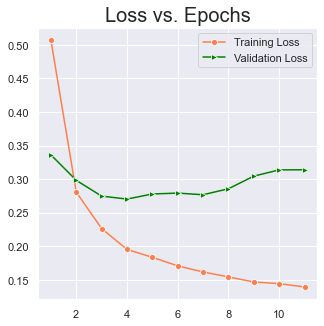

33/33 [==============================] - 0s 2ms/step - loss: 0.3045 - accuracy: 0.9237
Testing Accuracy:  92.37368702888489

Train dataset shape: (25169, 65072), 
Test dataset shape: (1049, 65072)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.86463, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00002: val_accuracy improved from 0.86463 to 0.89514, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00003: val_accuracy improved from 0.89514 to 0.90086, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00004: val_accuracy improved from 0.90086 to 0.90848, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00005: val_accuracy improved from 0.90848 to 0.91706, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00006: val_accuracy improved from 0.91706 to 0.92469, saving mod

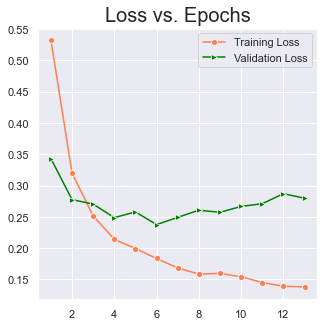

33/33 [==============================] - 0s 3ms/step - loss: 0.2797 - accuracy: 0.9295
Testing Accuracy:  92.94566512107849

Train dataset shape: (25169, 65170), 
Test dataset shape: (1049, 65170)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88561, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00002: val_accuracy improved from 0.88561 to 0.90562, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00003: val_accuracy improved from 0.90562 to 0.91516, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00004: val_accuracy improved from 0.91516 to 0.91992, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00005: val_accuracy improved from 0.91992 to 0.92755, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00006: val_accuracy did not improve from 0.92755

Epoch 00007: v

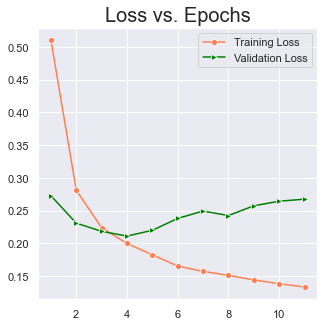

33/33 [==============================] - 0s 3ms/step - loss: 0.2676 - accuracy: 0.9333
Testing Accuracy:  93.32697987556458

Train dataset shape: (25169, 64872), 
Test dataset shape: (1049, 64872)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88179, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00002: val_accuracy improved from 0.88179 to 0.90753, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00003: val_accuracy did not improve from 0.90753

Epoch 00004: val_accuracy improved from 0.90753 to 0.91706, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00005: val_accuracy improved from 0.91706 to 0.92278, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00006: val_accuracy improved from 0.92278 to 0.92374, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00007: v

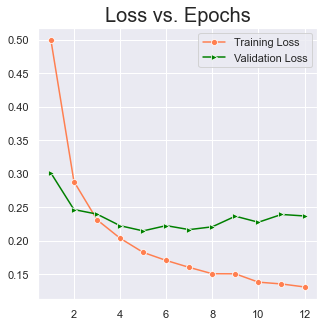

33/33 [==============================] - 0s 3ms/step - loss: 0.2389 - accuracy: 0.9352
Testing Accuracy:  93.51763725280762

Train dataset shape: (25169, 65005), 
Test dataset shape: (1049, 65005)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88656, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00002: val_accuracy improved from 0.88656 to 0.91230, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00003: val_accuracy improved from 0.91230 to 0.92564, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00004: val_accuracy improved from 0.92564 to 0.92755, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00005: val_accuracy improved from 0.92755 to 0.93327, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00006: val_accuracy improved from 0.93327 to 0.93613, saving mod

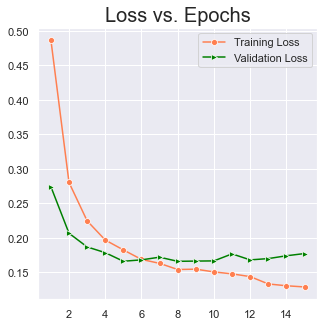

33/33 [==============================] - 0s 2ms/step - loss: 0.1773 - accuracy: 0.9390
Testing Accuracy:  93.8989520072937

Train dataset shape: (25169, 64979), 
Test dataset shape: (1049, 64979)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87798, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00002: val_accuracy improved from 0.87798 to 0.88942, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00003: val_accuracy improved from 0.88942 to 0.90181, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00004: val_accuracy did not improve from 0.90181

Epoch 00005: val_accuracy improved from 0.90181 to 0.90372, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00006: val_accuracy improved from 0.90372 to 0.90944, saving model to models\binary_classfiier\dl\merged_descr\model_7.h5

Epoch 00006: Re

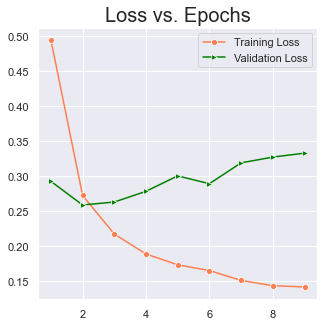

33/33 [==============================] - 0s 3ms/step - loss: 0.3274 - accuracy: 0.9123
Testing Accuracy:  91.22974276542664

Train dataset shape: (25169, 64960), 
Test dataset shape: (1049, 64960)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87893, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00002: val_accuracy improved from 0.87893 to 0.90276, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00003: val_accuracy improved from 0.90276 to 0.91230, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00004: val_accuracy improved from 0.91230 to 0.91420, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00005: val_accuracy did not improve from 0.91420

Epoch 00006: val_accuracy improved from 0.91420 to 0.92946, saving model to models\binary_classfiier\dl\merged_descr\model_8.h5

Epoch 00007: v

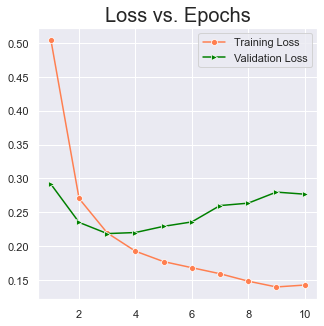

33/33 [==============================] - 0s 3ms/step - loss: 0.2359 - accuracy: 0.9295
Testing Accuracy:  92.94566512107849

Train dataset shape: (25169, 65089), 
Test dataset shape: (1049, 65089)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87989, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00002: val_accuracy improved from 0.87989 to 0.90181, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00003: val_accuracy improved from 0.90181 to 0.91897, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00004: val_accuracy improved from 0.91897 to 0.91992, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00005: val_accuracy did not improve from 0.91992

Epoch 00006: val_accuracy improved from 0.91992 to 0.92278, saving model to models\binary_classfiier\dl\merged_descr\model_9.h5

Epoch 00007: v

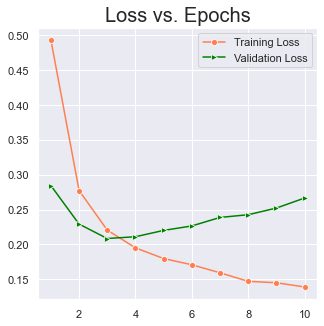

33/33 [==============================] - 0s 3ms/step - loss: 0.2387 - accuracy: 0.9247
Testing Accuracy:  92.46901869773865

Train dataset shape: (25169, 64969), 
Test dataset shape: (1049, 64969)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88179, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00002: val_accuracy improved from 0.88179 to 0.89609, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00003: val_accuracy improved from 0.89609 to 0.89990, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00004: val_accuracy did not improve from 0.89990

Epoch 00005: val_accuracy improved from 0.89990 to 0.90276, saving model to models\binary_classfiier\dl\merged_descr\model_10.h5

Epoch 00006: val_accuracy did not improve from 0.90276

Epoch 00007: val_accuracy did not improve from 0.90276

Epoch 00008: val_accuracy i

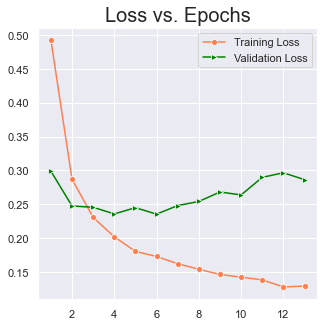

33/33 [==============================] - 0s 3ms/step - loss: 0.2964 - accuracy: 0.9094
Testing Accuracy:  90.94375371932983

Train dataset shape: (25169, 65113), 
Test dataset shape: (1049, 65113)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87321, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00002: val_accuracy improved from 0.87321 to 0.89418, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00003: val_accuracy improved from 0.89418 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00004: val_accuracy did not improve from 0.89704

Epoch 00005: val_accuracy improved from 0.89704 to 0.90944, saving model to models\binary_classfiier\dl\merged_descr\model_11.h5

Epoch 00006: val_accuracy did not improve from 0.90944

Epoch 00007: val_accuracy improved from 0.90944 to 0.91516, saving model to models\

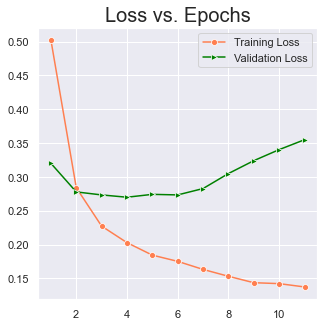

33/33 [==============================] - 0s 2ms/step - loss: 0.3550 - accuracy: 0.9190
Testing Accuracy:  91.89704656600952

Train dataset shape: (25169, 65136), 
Test dataset shape: (1049, 65136)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88370, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00002: val_accuracy improved from 0.88370 to 0.90944, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00003: val_accuracy improved from 0.90944 to 0.91706, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00004: val_accuracy did not improve from 0.91706

Epoch 00005: val_accuracy improved from 0.91706 to 0.92278, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 00006: val_accuracy improved from 0.92278 to 0.92755, saving model to models\binary_classfiier\dl\merged_descr\model_12.h5

Epoch 000

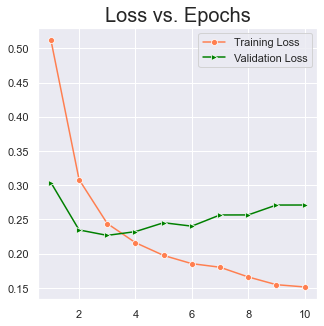

33/33 [==============================] - 0s 3ms/step - loss: 0.2567 - accuracy: 0.9285
Testing Accuracy:  92.85033345222473

Train dataset shape: (25169, 64494), 
Test dataset shape: (1049, 64494)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87512, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00002: val_accuracy improved from 0.87512 to 0.89895, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00003: val_accuracy improved from 0.89895 to 0.90658, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00004: val_accuracy improved from 0.90658 to 0.91230, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00005: val_accuracy improved from 0.91230 to 0.91516, saving model to models\binary_classfiier\dl\merged_descr\model_13.h5

Epoch 00006: val_accuracy did not improve from 0.91516

Epoch 000

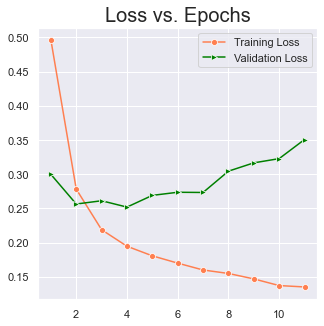

33/33 [==============================] - 0s 3ms/step - loss: 0.3165 - accuracy: 0.9228
Testing Accuracy:  92.2783613204956

Train dataset shape: (25169, 64970), 
Test dataset shape: (1049, 64970)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88656, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00002: val_accuracy improved from 0.88656 to 0.91134, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00003: val_accuracy improved from 0.91134 to 0.91516, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00004: val_accuracy improved from 0.91516 to 0.91992, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00005: val_accuracy improved from 0.91992 to 0.93327, saving model to models\binary_classfiier\dl\merged_descr\model_14.h5

Epoch 00006: val_accuracy did not improve from 0.93327

Epoch 0000

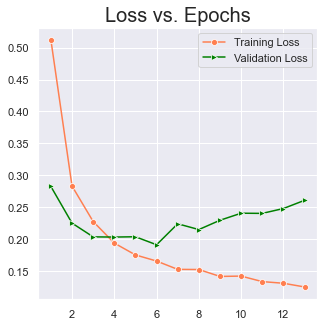

33/33 [==============================] - 0s 3ms/step - loss: 0.2482 - accuracy: 0.9428
Testing Accuracy:  94.28026676177979

Train dataset shape: (25169, 65069), 
Test dataset shape: (1049, 65069)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87703, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00002: val_accuracy improved from 0.87703 to 0.90372, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00003: val_accuracy improved from 0.90372 to 0.90944, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00004: val_accuracy improved from 0.90944 to 0.92564, saving model to models\binary_classfiier\dl\merged_descr\model_15.h5

Epoch 00005: val_accuracy did not improve from 0.92564

Epoch 00006: val_accuracy did not improve from 0.92564

Epoch 00007: val_accuracy did not improve from 0.92564

Epoch 00008: val_accuracy d

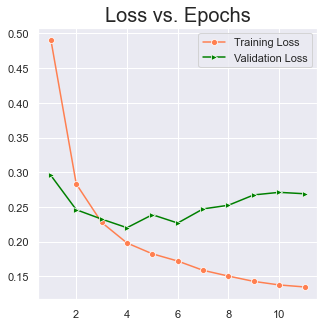

33/33 [==============================] - 0s 3ms/step - loss: 0.2712 - accuracy: 0.9266
Testing Accuracy:  92.65967607498169

Train dataset shape: (25169, 64980), 
Test dataset shape: (1049, 64980)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87703, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00002: val_accuracy improved from 0.87703 to 0.89133, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00003: val_accuracy improved from 0.89133 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00004: val_accuracy improved from 0.89704 to 0.90276, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 00005: val_accuracy did not improve from 0.90276

Epoch 00006: val_accuracy improved from 0.90276 to 0.90848, saving model to models\binary_classfiier\dl\merged_descr\model_16.h5

Epoch 000

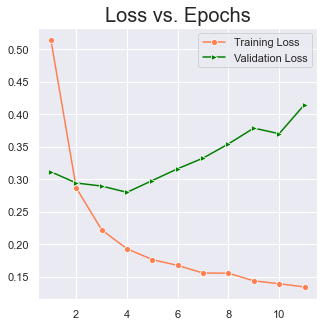

33/33 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.9199
Testing Accuracy:  91.9923722743988

Train dataset shape: (25169, 64994), 
Test dataset shape: (1049, 64994)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87798, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00002: val_accuracy improved from 0.87798 to 0.90848, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00003: val_accuracy improved from 0.90848 to 0.91230, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00004: val_accuracy improved from 0.91230 to 0.91611, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00005: val_accuracy improved from 0.91611 to 0.91706, saving model to models\binary_classfiier\dl\merged_descr\model_17.h5

Epoch 00006: val_accuracy did not improve from 0.91706

Epoch 0000

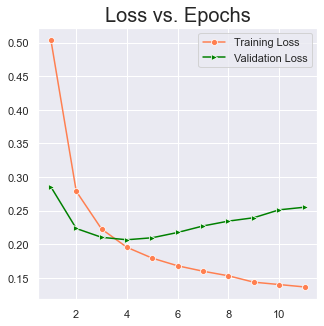

33/33 [==============================] - 0s 3ms/step - loss: 0.2552 - accuracy: 0.9237
Testing Accuracy:  92.37368702888489

Train dataset shape: (25169, 65210), 
Test dataset shape: (1049, 65210)

Features Train dataset shape: (25169, 15000), 
FeaturesTest dataset shape: (1049, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87703, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00002: val_accuracy improved from 0.87703 to 0.89704, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00003: val_accuracy improved from 0.89704 to 0.91611, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00004: val_accuracy did not improve from 0.91611

Epoch 00005: val_accuracy improved from 0.91611 to 0.91992, saving model to models\binary_classfiier\dl\merged_descr\model_18.h5

Epoch 00006: val_accuracy did not improve from 0.91992

Epoch 00007: val_accuracy did not improve from 0.91992

Epoch 00008: val_accuracy d

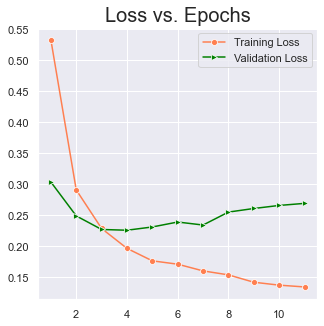

33/33 [==============================] - 0s 3ms/step - loss: 0.2608 - accuracy: 0.9218
Testing Accuracy:  92.18302965164185

Train dataset shape: (25170, 64680), 
Test dataset shape: (1048, 64680)

Features Train dataset shape: (25170, 15000), 
FeaturesTest dataset shape: (1048, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88836, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00002: val_accuracy improved from 0.88836 to 0.90744, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00003: val_accuracy improved from 0.90744 to 0.91317, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00004: val_accuracy improved from 0.91317 to 0.91794, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 00005: val_accuracy did not improve from 0.91794

Epoch 00006: val_accuracy improved from 0.91794 to 0.92271, saving model to models\binary_classfiier\dl\merged_descr\model_19.h5

Epoch 000

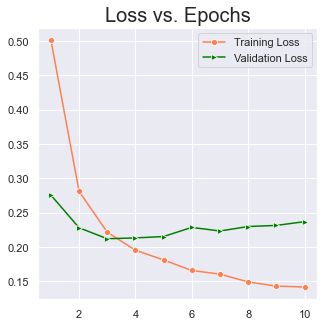

33/33 [==============================] - 0s 3ms/step - loss: 0.2316 - accuracy: 0.9370
Testing Accuracy:  93.70229244232178

Train dataset shape: (25170, 65190), 
Test dataset shape: (1048, 65190)

Features Train dataset shape: (25170, 15000), 
FeaturesTest dataset shape: (1048, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88550, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00002: val_accuracy improved from 0.88550 to 0.91508, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00003: val_accuracy did not improve from 0.91508

Epoch 00004: val_accuracy improved from 0.91508 to 0.92080, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00005: val_accuracy improved from 0.92080 to 0.92653, saving model to models\binary_classfiier\dl\merged_descr\model_20.h5

Epoch 00006: val_accuracy did not improve from 0.92653

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.

Ep

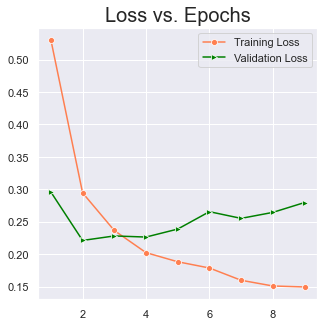

33/33 [==============================] - 0s 3ms/step - loss: 0.2388 - accuracy: 0.9265
Testing Accuracy:  92.65267252922058

Train dataset shape: (25170, 65139), 
Test dataset shape: (1048, 65139)

Features Train dataset shape: (25170, 15000), 
FeaturesTest dataset shape: (1048, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88931, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00002: val_accuracy improved from 0.88931 to 0.91794, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00003: val_accuracy improved from 0.91794 to 0.92366, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00004: val_accuracy improved from 0.92366 to 0.92653, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 00005: val_accuracy did not improve from 0.92653

Epoch 00006: val_accuracy improved from 0.92653 to 0.92939, saving model to models\binary_classfiier\dl\merged_descr\model_21.h5

Epoch 000

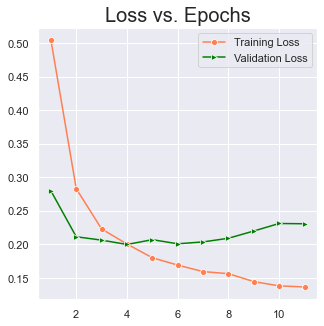

33/33 [==============================] - 0s 3ms/step - loss: 0.2198 - accuracy: 0.9342
Testing Accuracy:  93.41602921485901

Train dataset shape: (25170, 64576), 
Test dataset shape: (1048, 64576)

Features Train dataset shape: (25170, 15000), 
FeaturesTest dataset shape: (1048, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88550, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00002: val_accuracy improved from 0.88550 to 0.90935, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00003: val_accuracy improved from 0.90935 to 0.92080, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00004: val_accuracy improved from 0.92080 to 0.93225, saving model to models\binary_classfiier\dl\merged_descr\model_22.h5

Epoch 00005: val_accuracy did not improve from 0.93225

Epoch 00006: val_accuracy did not improve from 0.93225

Epoch 00007: val_accuracy did not improve from 0.93225

Epoch 00007: ReduceLROnPlat

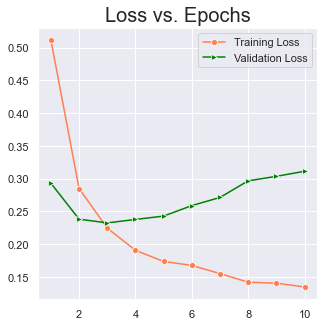

33/33 [==============================] - 0s 3ms/step - loss: 0.2376 - accuracy: 0.9323
Testing Accuracy:  93.22519302368164

Train dataset shape: (25170, 65209), 
Test dataset shape: (1048, 65209)

Features Train dataset shape: (25170, 15000), 
FeaturesTest dataset shape: (1048, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87882, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00002: val_accuracy improved from 0.87882 to 0.89695, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00003: val_accuracy improved from 0.89695 to 0.90553, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00004: val_accuracy did not improve from 0.90553

Epoch 00005: val_accuracy improved from 0.90553 to 0.90744, saving model to models\binary_classfiier\dl\merged_descr\model_23.h5

Epoch 00006: val_accuracy did not improve from 0.90744

Epoch 00007: val_accuracy improved from 0.90744 to 0.90935, saving model to models\

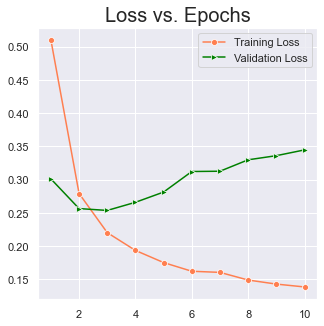

33/33 [==============================] - 0s 3ms/step - loss: 0.3127 - accuracy: 0.9094
Testing Accuracy:  90.93511700630188

Train dataset shape: (25170, 64986), 
Test dataset shape: (1048, 64986)

Features Train dataset shape: (25170, 15000), 
FeaturesTest dataset shape: (1048, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.88359, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00002: val_accuracy improved from 0.88359 to 0.90172, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00003: val_accuracy improved from 0.90172 to 0.91508, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00004: val_accuracy improved from 0.91508 to 0.92176, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00005: val_accuracy improved from 0.92176 to 0.92366, saving model to models\binary_classfiier\dl\merged_descr\model_24.h5

Epoch 00006: val_accuracy improved from 0.92366 to 0.92844, savin

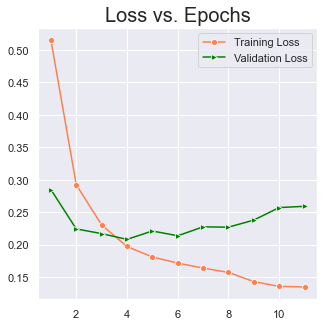

33/33 [==============================] - 0s 3ms/step - loss: 0.2270 - accuracy: 0.9332
Testing Accuracy:  93.32060813903809

Train dataset shape: (25170, 65131), 
Test dataset shape: (1048, 65131)

Features Train dataset shape: (25170, 15000), 
FeaturesTest dataset shape: (1048, 15000)

Epoch 00001: val_accuracy improved from -inf to 0.87023, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00002: val_accuracy improved from 0.87023 to 0.89027, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00003: val_accuracy improved from 0.89027 to 0.90076, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00004: val_accuracy improved from 0.90076 to 0.90458, saving model to models\binary_classfiier\dl\merged_descr\model_25.h5

Epoch 00005: val_accuracy did not improve from 0.90458

Epoch 00006: val_accuracy did not improve from 0.90458

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.

Ep

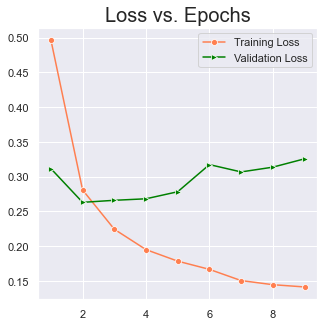

33/33 [==============================] - 0s 3ms/step - loss: 0.3257 - accuracy: 0.9151
Testing Accuracy:  91.50763154029846


In [67]:
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_extraction.text import TfidfVectorizer


def get_model_name(k):
    return f'model_{k}.h5'

NUM_SPLITS = 25
EPOCHS = 50
save_dir = Path('./models/binary_classfiier/dl/merged_descr')
fold_var = 1
NGRAM_RANGE = (1, 2)
TOP_K = 15000
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2
NUM_CLASSES = 2

kwargs = {
        'ngram_range' : NGRAM_RANGE,
        'dtype' : 'int32',
        'strip_accents' : 'unicode',
        'decode_error' : 'replace',
        'analyzer' : TOKEN_MODE,
        'min_df' : MIN_DOC_FREQ
    }

val_accs = []
skf = StratifiedKFold(n_splits=NUM_SPLITS, shuffle=True, random_state=seed)

for train_indices, test_indices in skf.split(X, y):
    X_train_split, X_test_split = X[train_indices], X[test_indices]
    y_train_split, y_test_split = y[train_indices], y[test_indices]
    vectorizer = TfidfVectorizer(**kwargs)
    X_train_vec = vectorizer.fit_transform(X_train_split)
    X_test_vec = vectorizer.transform(X_test_split)
    print(f"\nTrain dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

    selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
    selector.fit(X_train_vec, y_train_split)
    X_train_vec = selector.transform(X_train_vec).astype('float32')
    X_test_vec = selector.transform(X_test_vec).astype('float32')
    X_train_vec = X_train_vec.toarray()
    X_test_vec = X_test_vec.toarray()

    print(f"\nFeatures Train dataset shape: {X_train_vec.shape}, \nFeaturesTest dataset shape: {X_test_vec.shape}")
    model_ = None
    model_ = Sequential([   
        Dense(30, activation='relu', input_shape=X_train_vec.shape[1:]),
        Dropout(0.5),
        Dense(20, activation='relu'),
        Dropout(0.5),
        Dense(10, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    model_.compile(
        loss = 'binary_crossentropy',
        optimizer = 'adam',
        metrics = ['accuracy']
    )
    
    checkpoint = tensorflow.keras.callbacks.ModelCheckpoint(save_dir / get_model_name(fold_var),
                                                            monitor='val_accuracy',
                                                            verbose=1,
                                                            save_best_only=True,
                                                            mode='max')

    h_ = model_.fit(
            X_train_vec, y_train_split,
            validation_data = (X_test_vec, y_test_split),  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [checkpoint, early_stop, lr_reduce_on_plateau],
            verbose = False)
    
    model_.load_weights(save_dir / get_model_name(fold_var))
    plot_learning_curve(h_)
    loss, acc = model_.evaluate(X_test_vec, y_test_split)
    print("Testing Accuracy: ", acc*100)
    val_accs.append(acc)
    tensorflow.keras.backend.clear_session()
    fold_var += 1

In [68]:
print("Testing Accuracy: ", np.mean(val_accs)*100)   # average k fold accuracy

Testing Accuracy:  92.56239318847656


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Metrics: </span></strong></li>
</ul></h3>

<table style="width:100%">
  <tr>
    <th>Model</th>
    <th>Test Accuracy</th>
  </tr>
  <tr>
    <td>Simple Feed-Forward Net using Embedding Layer</td>
      <td>88.63%</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Batch Norm</td>
    <td>90.13%</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Dropout</td>
    <td>90.21%</td>
  </tr>
    <tr>
    <td>Feed-Forward NN + Pre-trained GloVe embeddings</td>
    <td>89.12%</td>
  </tr>
  <tr>
    <td>LSTM</td>
    <td>91.58%</td>
  </tr>
    
  <tr>
    <td>Bi-Directional LSTM</td>
    <td>91.33%</td>
  </tr>
<tr>
    <td>Convolution Blocks (Dimensionality Reduction) + LSTM</td>
    <td>91.66%</td>
  </tr>
    <tr>
    <td>Convolution Blocks (Dimensionality Reduction) + Bi-LSTM</td>
    <td>91.69%</td>
  </tr>
<tr>
    <td>TfIdf Vectors + Feature Selection + Feed-forward Neural Net</td>
    <td>84.74%</td>
  </tr>
<tr>
    <td>Stratified KFold Validation + TfIdf Vectors + Feature Selection + Feed-forward Neural Net</td>
    <td>92.56%</td>
  </tr>
</table>

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Final Metrics</span></strong></li>
</ul></h1>

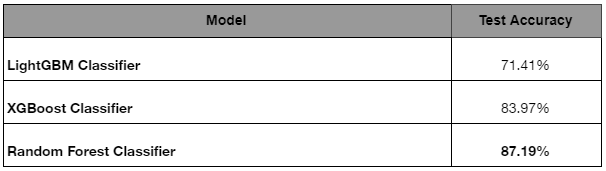

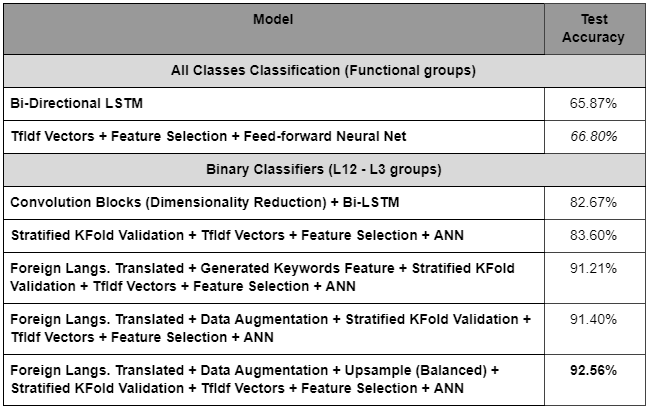

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Key Learnings</span></strong></li>
</ul></h1>

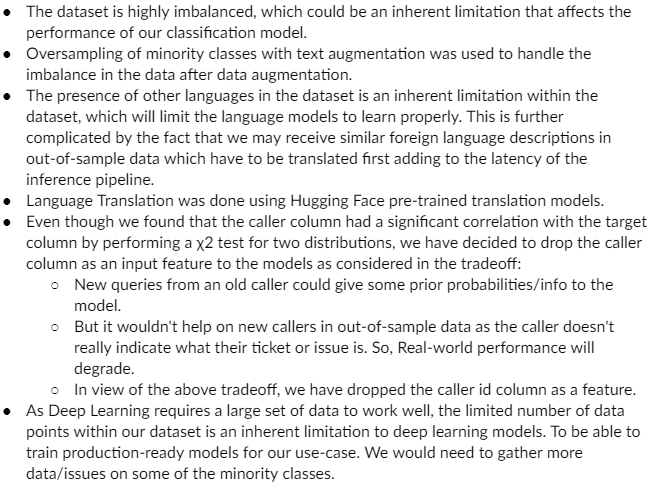

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Future Improvements</span></strong></li>
</ul></h1>

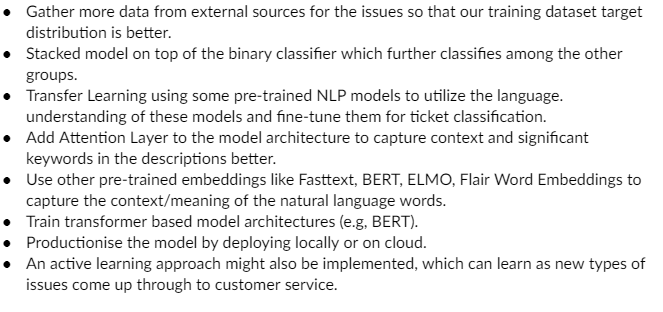